**Author:** Luís Sousa 

**Contact:** luis.95.sousa.31@gmail.com

**Update log:**

January 2025:
  - Outlier run/animal filtering
  - Outlier study
  - PCA pre-processing option for all ML models

December 2024:
  - K-Means analysis
  - Dot plot colouring corrected
  - PCA now looks for optimal n components
  - Spee influence criteria adjusted to include match between all data and WT NCD type of regression
  - Nan handling with median value replacement implementation in the CROI method
  - Classification Models: Neural Network, Random Forest, PCA, K-Nearest neighbours
  - PCA weights and Feature Intersection Exploration

November 2024:
  - Footprint clustering
  - Dot plot generation with and without statistics
  - Covariate-adjusted car_values are not normalized. Only speed non-dependent parameters are normalized.
  - Speed regression on all runs adjusted to include best fit regression for the other groups
  - Dot plots
  - Speed regresions for all data or averaged runs
  - CROI method implementation for data cleaning and outlier detection for all data or averaged runs
  - Data exploraty analysis steps included in the pipeline, namely parameter distributions and correlation with speed for better raw data comprehension and outlier identification
  - Refined correlation analysis using all analysed runs instead of averaged runs

October 2024:
  - Draft pipeline created for Two-way ANOVA analysis and p-value mapping in heatplot

---

*Notebook created by Luís Sousa. Feel free to reach out for any questions or collaborations.*

---


**Packages version requirements**

- pandas 2.2.3
- numpy 1.26.4
- ipython 8.18.1
- scipy 1.13.1
- matplotlib 3.9.3
- seaborn 0.13.2
- scikit-learn 1.0.2
- statsmodels 0.14.4
- graphviz 0.20.3
- tensorflow 2.18.0
- keras 3.7.0
- kneed 0.8.5
- keras-tuner 1.4.7
- kt-legacy 1.0.5

---


<h1 style="color: #FF6666;">Mousewalker Pipeline Analysis</h1>

<h1 style="color: #FFE338;">Data Pre-processing</h1>

## CROI - Clean,Re-order and Outlier Identification

In [1]:
import pandas as pd
import numpy as np
from statsmodels.api import RLM
from statsmodels.tools.tools import add_constant
from statsmodels.stats.multitest import multipletests
from scipy.stats import norm
import os

def CROI(input_file, cleaned_file_path, outliers_file_path, cleaned_no_outliers_file_path,fdr):

    """
    Cleans, reorders, and processes data, incorporating outlier identification by group.
    
    Parameters:
    - input_file (str): Path to the input Excel file.
    - cleaned_file_path (str): Path to save the cleaned file with renamed and reordered columns.
    - outliers_file_path (str): Path to save the file containing only outliers.
    - cleaned_no_outliers_file_path (str): Path to save the cleaned file with outliers removed.
    - fdr (float): False Discovery Rate for outlier detection.
    """
    # Dictionary for renaming columns
    column_clean = {
        "Condition": "Condition",
        "speed cm_s": "Speed (cm/s)",
        "diag swing": "Diagonal swing",
        "single swing": "Single swing",
        "lateral swing": "Lateral swing",
        "freq": "Stepping frequency",
        "period ms": "Stepping period (ms)",
        "no swing": "No swing",
        "front_hind swing": "Front hind swing",
        "sw v(AVR)": "Swing speed Avg",
        "sw v(SD)": "Swing speed SD",
        "sw v(F)": "Forelimb swing speed",
        "sw v(H)": "Hindlimb swing speed",
        "sw s(AVR)": "Step length Avg",
        "sw s(SD)": "Step length SD",
        "sw s(F)": "Forelimb step length",
        "sw s(H)": "Hindlimb step length",
        "sw t(AVR)": "Swing time Avg",
        "sw t(SD)": "Swing time (SD)",
        "sw t(F)": "Forelimb swing time",
        "sw t(H)": "Hindlimb swing time",
        "period SD": "Stepping period SD",
        "stc t(F)": "Forelimb stance time",
        "stc t(H)": "Hindlimb stance time",
        "stc t(AVR)": "Stance time Avg",
        "stc t(SD)": "Stance time SD",
        "varAEP_F": "Forelimb LR diff at AEP",
        "varAEP_H": "Hindlimb LR diff at AEP",
        "varPEP_F": "Forelimb LR diff at PEP",
        "varPEP_H": "Hindlimb LR diff at PEP",
        "stnc stabl": "Stance stability",
        "SD AEP": "AEP SD",
        "SD PEP": "PEP SD",
        "F AEP": "Forelimb AEP",
        "H AEP": "Hindlimb AEP",
        "F PEP": "Forelimb PEP",
        "H PEP": "Hindlimb PEP",
        "F AEPy": "Forelimb AEPy",
        "H AEPy": "Hindlimb AEPy",
        "F PEPy": "Forelimb PEPy",
        "H PEPy": "Hindlimb PEPy",
        "F AEPySD": "Forelimb AEPy SD",
        "H AEPySD": "Hindlimb AEPy SD",
        "F PEPySD": "Forelimb PEPy SD",
        "H PEPySD": "Hindlimb PEPy SD",
        "F AEPx": "Forelimb AEPx",
        "H AEPx": "Hindlimb AEPx",
        "F PEPx": "Forelimb PEPx",
        "H PEPx": "Hindlimb PEPx",
        "F AEPxSD": "Forelimb AEPx SD",
        "H AEPxSD": "Hindlimb AEPx SD",
        "F PEPxSD": "Forelimb PEPx SD",
        "H PEPxSD": "Hindlimb PEPx SD",
        "3 leg swing": "3 Leg swing",
        "Speed SD": "Speed SD",
        "framesON": "Frames ON",
        "body stbl": "Body stability",
        "F_AEP STD": "Forelimb AEP SD",
        "H_AEP STD": "Hindlimb AEP SD",
        "F_PEP STD": "Forelimb PEP SD",
        "H_PEP STD": "Hindlimb PEP SD",
        "SwingV STD": "Swing speed SD/1000",
        "all swing": "All swing",
        "Max Mdist": "Maximum step length",
        "swT&stT": "Swing and stance time",
        "duty Fact": "Duty factor",
        "Phase F": "Phase F",
        "Phase H": "Phase H",
        "areaLF": "Area LF",
        "areaLH": "Area LH",
        "areaRF": "Area RF",
        "areaRH": "Area RH",
        "pressLF": "Press LF",
        "pressLH": "Press LH",
        "pressRF": "Press RF",
        "pressRH": "Press RH",
        "st_lin_Front": "Forelimb stance linearity",
        "st_lin_Hind": "Hindlimb stance linearity",
        "Avg_Straightness": "Straightness Avg",
        "Avg_Straightness_F": "Forelimb straightness Avg",
        "Avg_Straighness_H": "Hindlimb straightness Avg",
        "fps": "Frames per second",
        "px_mm": "Px/mm"
    }

    # Columns to reorder and drop
    reorder_columns = [
        "Condition", "Speed (cm/s)", "Speed SD", "Duty factor", "Single swing", "Diagonal swing", "Lateral swing",
        "3 Leg swing", "All swing", "No swing", "Front hind swing", "Stepping frequency", "Stepping period (ms)",
        "Stepping period SD", "Swing speed Avg", "Swing speed SD", "Forelimb swing speed", "Hindlimb swing speed",
        "Step length Avg", "Step length SD", "Forelimb step length", "Hindlimb step length", "Maximum step length",
        "Swing time Avg", "Swing time (SD)", "Forelimb swing time", "Hindlimb swing time", "Stance time Avg",
        "Stance time SD", "Forelimb stance time", "Hindlimb stance time", "Swing and stance time", "Stance stability",
        "Body stability", "Straightness Avg", "Forelimb straightness Avg", "Hindlimb straightness Avg", "Forelimb stance linearity",
        "Hindlimb stance linearity", "Forelimb AEP", "Hindlimb AEP", "Forelimb PEP", "Hindlimb PEP", "Forelimb AEP SD",
        "Hindlimb AEP SD", "Forelimb PEP SD", "Hindlimb PEP SD", "AEP SD", "PEP SD", "Forelimb AEPx", "Hindlimb AEPx",
        "Forelimb PEPx", "Hindlimb PEPx", "Forelimb AEPx SD", "Hindlimb AEPx SD", "Forelimb PEPx SD", "Hindlimb PEPx SD",
        "Forelimb AEPy", "Hindlimb AEPy", "Forelimb PEPy", "Hindlimb PEPy", "Forelimb AEPy SD", "Hindlimb AEPy SD",
        "Forelimb PEPy SD", "Hindlimb PEPy SD", "Forelimb LR diff at AEP", "Hindlimb LR diff at AEP",
        "Forelimb LR diff at PEP", "Hindlimb LR diff at PEP", "Phase F", "Phase H", "Area LF", "Area LH", "Area RF",
        "Area RH", "Press LF", "Press LH", "Press RF", "Press RH", "Swing speed SD/1000", "Frames ON", "Frames per second", "Px/mm"
    ]
    drop_columns = ["All swing","Speed SD","Swing speed SD/1000", "Frames ON", "Frames per second", "Px/mm"]

    # Read the input file
    data = pd.read_excel(input_file)

    # Rename columns
    data.rename(columns=column_clean, inplace=True)

    # Reorder and drop columns
    data = data[[col for col in reorder_columns if col in data.columns]]
    data.drop(columns=[col for col in drop_columns if col in data.columns], inplace=True)

    # Save the cleaned file with renamed and reordered columns
    data.to_excel(cleaned_file_path, index=False)

    # Extract group information from the 'Condition' column
    data['Group'] = data['Condition'].apply(lambda x: " ".join(x.split('_')[1:3]))

    # Initialize a DataFrame to store outliers
    outliers_only = data.copy()
    outliers_only.loc[:, outliers_only.columns.difference(['Condition', 'Group'])] = np.nan

    # Copy for processing outliers
    processed_data = data.copy()

    # Outlier detection within each group for each parameter
    for group, group_data in data.groupby('Group'):
        for col in group_data.columns:
            if col in ['Condition', 'Group']:
                continue
            
            group_subset = group_data.dropna(subset=[col])
            if group_subset.empty:
                continue
            
            # Fit robust linear model
            X = add_constant(np.ones(len(group_subset)))
            y = group_subset[col]
            robust_model = RLM(y, X).fit()
            
            # Calculate car_values and p-values
            car_values = y - robust_model.fittedvalues
            residual_z_scores = np.abs(car_values) / car_values.std(ddof=0)
            p_values = 2 * norm.sf(residual_z_scores)
            
            # Apply FDR correction
            _, corrected_p_values, _, _ = multipletests(p_values, alpha=fdr, method='fdr_bh')
            
            # Identify outliers
            outlier_mask = corrected_p_values < fdr
            outlier_indices = group_subset.index[outlier_mask]
            
            # Update outliers_only and processed_data
            outliers_only.loc[outlier_indices, col] = data.loc[outlier_indices, col]
            processed_data.loc[outlier_indices, col] = np.nan

    # Drop auxiliary 'Group' column
    outliers_only.drop(columns=['Group'], inplace=True)
    processed_data.drop(columns=['Group'], inplace=True)

    # Save outputs
    outliers_only.to_excel(outliers_file_path, index=False)
    processed_data.to_excel(cleaned_no_outliers_file_path, index=False)

    return processed_data

In [2]:
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/36wo MW.xlsx'
cleaned_file_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/36wo MW_clean.xlsx'
outliers_file_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/36wo MW_outliers.xlsx'
cleaned_no_outliers_file_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/36wo MW_clean_no_outliers.xlsx'
fdr =0.05

# Run the function
CROI(input_file, cleaned_file_path, outliers_file_path, cleaned_no_outliers_file_path,fdr)

,Condition,Speed (cm/s),Duty factor,Single swing,Diagonal swing,Lateral swing,3 Leg swing,No swing,Front hind swing,Stepping frequency,...,Phase F,Phase H,Area LF,Area LH,Area RF,Area RH,Press LF,Press LH,Press RF,Press RH
0,1_WT_NCD_Run1,335.6348,0.539216,0.14925,0.78358,0.007463,0.007463,0.007463,0.044776,6.203474,...,0.468268,0.550882,4.187504,5.979338,3.745058,5.159030,3292.941070,3361.037088,3232.775319,3340.196814
1,1_WT_NCD_Run2,345.3532,0.534014,0.19626,0.73832,NaN,0.009346,0.009346,0.018692,6.060606,...,0.494853,0.479340,3.561787,3.644847,3.381875,4.814821,3246.777209,3289.751913,3208.345776,3326.108216
2,1_WT_NCD_Run3,369.7644,0.562500,0.21622,0.74775,0.009009,0.000000,0.018018,0.009009,5.943152,...,0.488200,0.484127,4.248843,4.409058,3.747261,1.750496,3291.621341,3309.110034,3284.870423,3312.452460
3,2_WT_NCD_Run1,226.2858,0.601770,0.21538,0.68718,0.000000,0.000000,0.097436,0.000000,4.752852,...,0.479693,0.471983,11.494006,9.075623,10.640370,11.142838,3341.230153,3372.262978,3350.901304,3367.101460
4,2_WT_NCD_Run2,356.0829,0.547893,0.21111,0.77778,0.000000,0.000000,0.000000,0.011111,6.081081,...,0.491228,0.459064,4.021914,4.239989,5.567730,7.365474,3282.601266,3278.098872,3331.267751,3348.985837
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113,48_Tg_HFD_Run2,136.1223,0.704420,0.52727,0.36364,0.000000,0.000000,0.109090,0.000000,2.387268,...,0.522764,0.370732,7.564560,6.736533,7.554496,7.350410,3329.282991,3371.670101,3337.974914,3452.892437
114,48_Tg_HFD_Run3,85.1003,0.747218,0.43431,0.28467,0.000000,0.000000,0.281020,0.000000,1.763224,...,0.490388,0.399383,8.508330,7.263710,7.737290,6.542836,3327.920675,3364.087906,3357.880297,3387.624335
115,49_Tg_HFD_Run1,281.1680,0.650000,0.25000,0.55000,0.010000,0.000000,0.180000,0.010000,5.538462,...,0.525822,0.610826,11.803780,7.303404,9.072316,3.282936,3347.192745,3354.426505,3437.737261,3466.943834
116,49_Tg_HFD_Run2,263.0033,0.645570,0.24444,0.56667,0.000000,0.000000,0.188890,0.000000,5.576208,...,0.499958,0.507937,12.313292,7.894699,11.526948,7.909022,3366.283520,3396.964356,3359.077520,3352.688418


## Outlier study

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

def analyze_outlier_distribution(input_file, output_dir='outputs'):
    os.makedirs(output_dir, exist_ok=True)
    
    color_map = {
        'WT NCD': 'tab:blue',
        'WT HFD': 'tab:orange',
        'Tg NCD': 'tab:green',
        'Tg HFD': 'tab:red'
    }
    
    df = pd.read_excel(input_file)
    df['Group'] = df['Condition'].apply(lambda x: " ".join(x.split('_')[1:3]))
    df['Animal'] = df['Condition'].apply(lambda x: x.split('_')[0])
    
    filename = os.path.basename(input_file).split('.')[0]
    
    # Row analysis
    outlier_per_row = df.isna().sum(axis=1)
    row_results = pd.DataFrame({
        'Condition': df['Condition'],
        'Group': df['Group'],
        'Outlier_Count': outlier_per_row
    }).sort_values('Outlier_Count', ascending=False)
    
    # Parameter analysis
    group_order = ['WT NCD', 'WT HFD', 'Tg NCD', 'Tg HFD']
    param_results = pd.DataFrame()
    
    for param in df.columns:
        if param not in ['Group', 'Animal', 'Condition']:
            group_counts = {}
            for group in group_order:
                count = df[df['Group'] == group][param].isna().sum()
                group_counts[group] = count
            param_results = pd.concat([param_results, 
                                     pd.DataFrame([group_counts], index=[param])])
    
    param_results['Total'] = param_results.sum(axis=1)
    param_results = param_results.sort_values('Total', ascending=False)
    param_results = param_results[group_order]
    
    # Group analysis
    group_df = df.drop(['Group', 'Animal', 'Condition'], axis=1)
    outlier_per_group = group_df.groupby(df['Group']).apply(lambda x: x.isna().sum().sum())
    group_results = pd.DataFrame({
        'Group': group_order,
        'Outlier_Count': [outlier_per_group[group] for group in group_order]
    })
    
    # Animal analysis
    animal_df = df.drop(['Group', 'Animal', 'Condition'], axis=1)
    outlier_per_animal = animal_df.groupby(df['Animal']).apply(lambda x: x.isna().sum().sum())
    animal_results = pd.DataFrame({
        'Animal': outlier_per_animal.index,
        'Outlier_Count': outlier_per_animal.values
    }).sort_values('Outlier_Count', ascending=False)
    
    titles = {
        'row': f'Outlier Distribution by Condition - {filename}',
        'parameter': f'Outlier Distribution by Parameter - {filename}',
        'group': f'Outlier Distribution by Group - {filename}',
        'animal': f'Outlier Distribution by Animal - {filename}'
    }
    
    heights = {
        'row': len(df)*0.25,
        'parameter': len(param_results)*0.25,
        'group': max(5, len(group_results)*0.5),
        'animal': len(animal_results)*0.25
    }
    
    # Condition plot
    plt.figure(figsize=(10, heights['row']))
    sns.barplot(data=row_results, y='Condition', x='Outlier_Count', 
                hue='Group', palette=color_map,
                order=row_results['Condition'])
    plt.xlabel('Number of Outlier Values')
    plt.ylabel('Condition')
    plt.title(titles['row'])
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    for bar in plt.gca().patches:
        width = bar.get_width()
        if width > 0:
            plt.gca().annotate(
                f"{int(width)}",
                (width, bar.get_y() + bar.get_height() / 2),
                ha='left', va='center'
            )
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, 'outlier_distribution_row.png'), bbox_inches='tight')
    
    # Parameter plot
    fig, ax = plt.subplots(figsize=(10, len(param_results.index) * 0.25))
    bottom = [0] * len(param_results)
    
    for group, color in zip(param_results.columns, [color_map[col] for col in param_results.columns]):
        ax.barh(param_results.index, param_results[group], left=bottom, color=color, label=group)
        
        for i, value in enumerate(param_results[group]):
            if value > 0:
                ax.annotate(f"{int(value)}",
                            (bottom[i] + value / 2, i),
                            ha='center', va='center', fontsize=8)
        bottom = [x + y for x, y in zip(bottom, param_results[group])]
    
    ax.set_xlabel('Number of Outlier Values')
    ax.set_ylabel('Parameter')
    ax.set_title(titles['parameter'])
    ax.invert_yaxis()
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, 'outlier_distribution_parameter.png'), bbox_inches='tight', dpi=300)
    
    # Group plot
    plt.figure(figsize=(10, heights['group']))
    sns.barplot(data=group_results, y='Group', x='Outlier_Count',
               hue='Group',
               order=group_order,
               palette=[color_map[group] for group in group_order],
               dodge=False)
    plt.xlabel('Number of Outlier Values')
    plt.ylabel('Group')
    plt.title(titles['group'])
    
    for i, bar in enumerate(plt.gca().patches):
        plt.gca().annotate(f"{int(bar.get_width())}",
                           (bar.get_width(), bar.get_y() + bar.get_height() / 2),
                           ha='left', va='center')
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, 'outlier_distribution_group.png'))
    
    # Animal plot
    animal_results['Group'] = animal_results['Animal'].map(
        lambda animal: df[df['Animal'] == animal]['Group'].iloc[0]
    )
    
    plt.figure(figsize=(10, len(animal_results) * 0.25))
    sns.barplot(
        data=animal_results,
        y='Animal',
        x='Outlier_Count',
        hue='Group',
        palette=color_map
    )
    plt.xlabel('Number of Outlier Values')
    plt.ylabel('Animal')
    plt.title(titles['animal'])
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Group')
    
    for bar in plt.gca().patches:
        width = bar.get_width()
        if width > 0:
            plt.gca().annotate(
                f"{int(width)}",
                (width, bar.get_y() + bar.get_height() / 2),
                ha='left', va='center'
            )
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, 'outlier_distribution_animal.png'), bbox_inches='tight', dpi=300)
    
    # Save Excel files
    row_results.to_excel(os.path.join(output_dir, 'outlier_counts_row.xlsx'), index=False)
    param_results.to_excel(os.path.join(output_dir, 'outlier_counts_parameter.xlsx'))
    group_results.to_excel(os.path.join(output_dir, 'outlier_counts_group.xlsx'), index=False)
    animal_results.to_excel(os.path.join(output_dir, 'outlier_counts_animal.xlsx'), index=False)

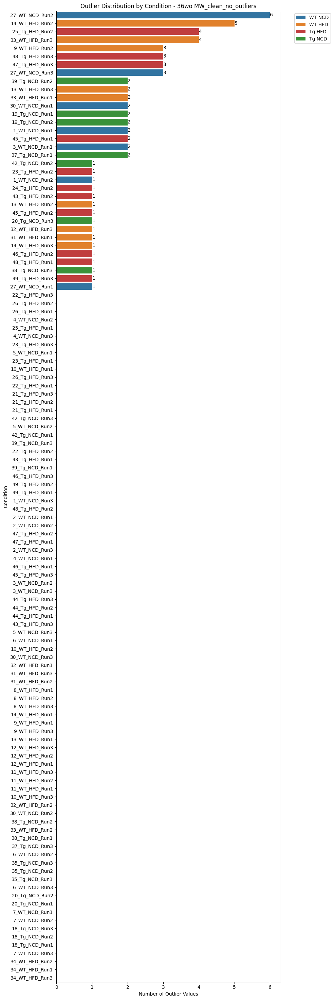

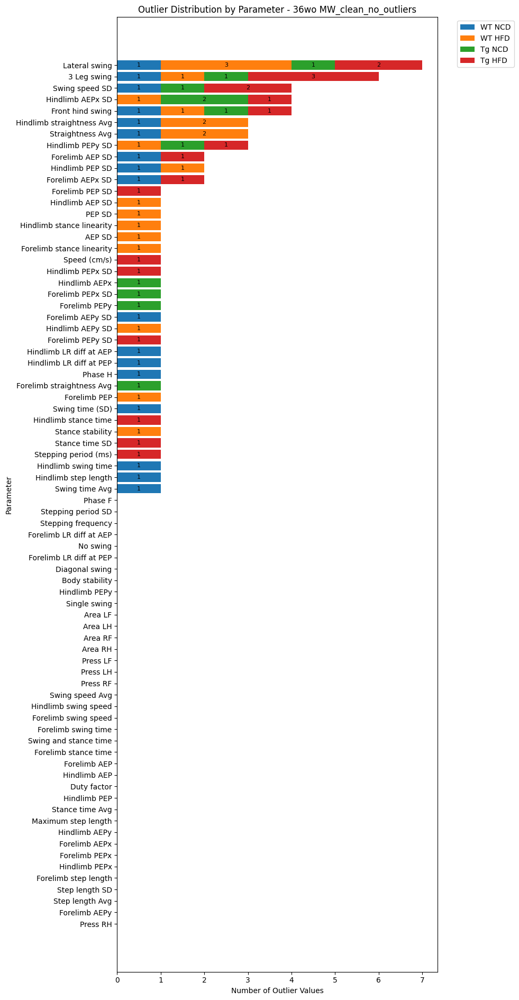

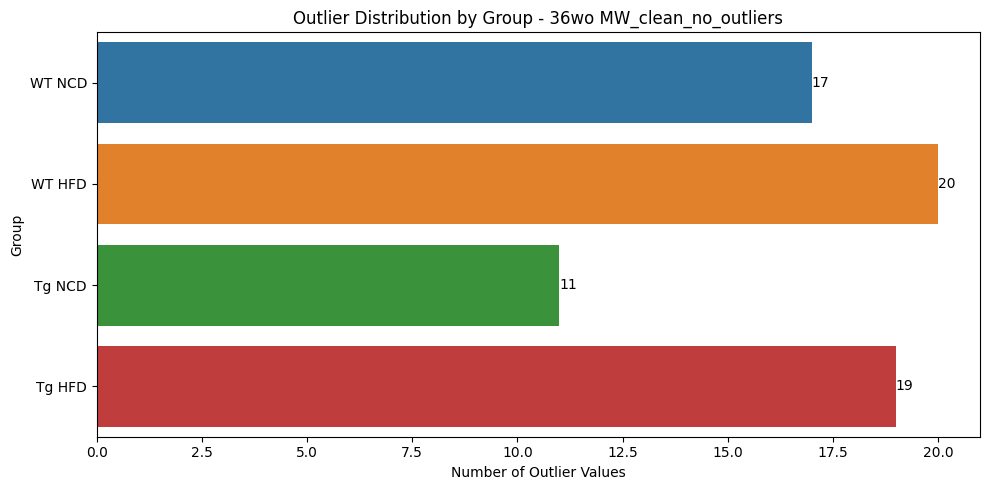

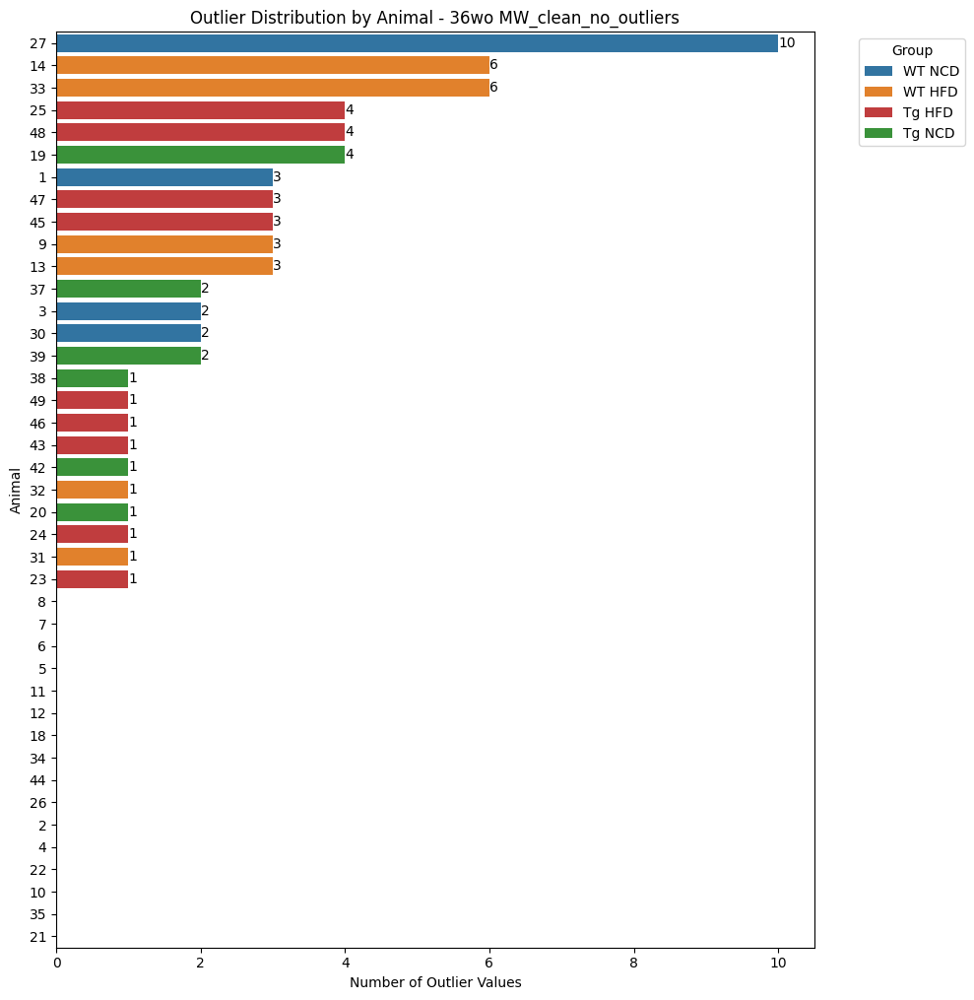

In [4]:
input_file ='/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/36wo MW_clean_no_outliers.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Outlier study'

analyze_outlier_distribution(input_file, output_dir)

## Run filtering and median imputation

In [5]:
import pandas as pd
import numpy as np
import os

def outlier_handler(input_file, output_dir, row_nan_threshold, animal_nan_threshold):
    os.makedirs(output_dir, exist_ok=True)
    filename = os.path.basename(input_file).split('.')[0]
    
    df = pd.read_excel(input_file)
    
    df['Group'] = df['Condition'].apply(lambda x: " ".join(x.split('_')[1:3]))
    df['Animal'] = df['Condition'].apply(lambda x: x.split('_')[0])
    
    # Track dropped rows
    dropped_speed = df[df['Speed (cm/s)'].isna()].copy()
    dropped_speed.insert(1, 'Drop_Reason', 'Missing Speed')
    df = df.dropna(subset=['Speed (cm/s)'])
    
    nan_counts_per_run = df.isna().sum(axis=1)
    dropped_excess_nans = df[nan_counts_per_run >= row_nan_threshold].copy()
    dropped_excess_nans.insert(1, 'Drop_Reason', f'Over {row_nan_threshold} NaNs')
    df = df[nan_counts_per_run < row_nan_threshold]
    
    data_columns = df.columns.difference(['Group', 'Animal', 'Condition'])
    nan_counts_per_animal = df.groupby('Animal')[data_columns].apply(lambda x: x.isna().sum().sum(), include_groups=False)
    animals_to_drop = nan_counts_per_animal[nan_counts_per_animal >= animal_nan_threshold].index
    dropped_animals = df[df['Animal'].isin(animals_to_drop)].copy()
    dropped_animals.insert(1, 'Drop_Reason', f'Animal over {animal_nan_threshold} NaNs')
    df = df[~df['Animal'].isin(animals_to_drop)]
    
    # Combine all dropped rows
    dropped_rows = pd.concat([dropped_speed, dropped_excess_nans, dropped_animals])
    dropped_rows.to_excel(os.path.join(output_dir, f'{filename}_dropped.xlsx'), index=False)
    
    df_clean = df.drop(['Group', 'Animal'], axis=1)
    df_clean.to_excel(os.path.join(output_dir, f'{filename}_filtered.xlsx'), index=False)
    
    for group in df['Group'].unique():
        group_mask = df['Group'] == group
        for col in df.columns:
            if col not in ['Condition', 'Group', 'Animal']:
                median_value = df.loc[group_mask, col].median()
                df.loc[group_mask, col] = df.loc[group_mask, col].fillna(median_value)
    
    df_imputed = df.drop(['Group', 'Animal'], axis=1)
    df_imputed.to_excel(os.path.join(output_dir, f'{filename}_filtered_median.xlsx'), index=False)
    
    return df_clean, df_imputed

In [6]:
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/36wo MW_clean_no_outliers.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Outlier study'
row_nan_threshold = 4
animal_nan_threshold = 12

outlier_handler(input_file, output_dir, row_nan_threshold, animal_nan_threshold)

(          Condition  Speed (cm/s)  Duty factor  Single swing  Diagonal swing  \
 0     1_WT_NCD_Run1      335.6348     0.539216       0.14925         0.78358   
 1     1_WT_NCD_Run2      345.3532     0.534014       0.19626         0.73832   
 2     1_WT_NCD_Run3      369.7644     0.562500       0.21622         0.74775   
 3     2_WT_NCD_Run1      226.2858     0.601770       0.21538         0.68718   
 4     2_WT_NCD_Run2      356.0829     0.547893       0.21111         0.77778   
 ..              ...           ...          ...           ...             ...   
 113  48_Tg_HFD_Run2      136.1223     0.704420       0.52727         0.36364   
 114  48_Tg_HFD_Run3       85.1003     0.747218       0.43431         0.28467   
 115  49_Tg_HFD_Run1      281.1680     0.650000       0.25000         0.55000   
 116  49_Tg_HFD_Run2      263.0033     0.645570       0.24444         0.56667   
 117  49_Tg_HFD_Run3      390.2631     0.606667       0.38384         0.41414   
 
      Lateral swing  3 Leg

<h1 style="color: #01FFFF;">Exploratory data analysis</h1>

## Scatter plot overlayed on a violin plot - All runs <span style="color:lightgreen">(recommended)</span>

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import os

def violin_scatter_images(file_path, output_dir, plots_per_page):
    """
    Generates both individual and combined violin + scatter plot images for all numeric parameters, grouped by animal group.
    Each combined image contains up to `plots_per_page` plots arranged for A4 horizontal size.

    Parameters:
    - file_path (str): Path to the Excel file containing the data.
    - output_dir (str): Directory to save the generated image(s).
    - plots_per_page (int): Number of plots per page for combined images (default is 15 for 3 rows x 5 columns).
    """
    # Load the data
    data = pd.read_excel(file_path)
    
    # Clean column names
    data.columns = data.columns.str.strip().str.replace('/', '_').str.replace(' ', '_')
    
    # Ensure 'Condition' column exists
    if 'Condition' not in data.columns:
        raise ValueError("The 'Condition' column is missing from the data.")
    
    # Extract animal group by splitting 'Condition' column
    data['Animal Group'] = data['Condition'].str.split('_').str[1] + ' ' + data['Condition'].str.split('_').str[2]
    
    # Identify numeric columns for plotting
    numeric_cols = data.select_dtypes(include=['float64', 'int64']).columns
    numeric_cols = [col for col in numeric_cols if col not in ['Condition']]  # Exclude 'Condition' if numeric
    
    # Calculate number of pages needed for combined plots
    total_plots = len(numeric_cols)
    num_pages = math.ceil(total_plots / plots_per_page)
    
    # Create the output directories if they don't exist
    os.makedirs(output_dir, exist_ok=True)
    individual_output_dir = os.path.join(output_dir, "individual_plots")
    os.makedirs(individual_output_dir, exist_ok=True)
    print(f"Saving images to: {output_dir} and {individual_output_dir}")
    
    # Generate individual plots
    for col in numeric_cols:
        plt.figure(figsize=(8, 6))
        sns.violinplot(data=data, x='Animal Group', y=col, hue='Animal Group', palette="muted", cut=0, inner=None, legend=False)
        sns.stripplot(data=data, x='Animal Group', y=col, color='black', alpha=0.7, jitter=True)
        plt.title(f"Violin + Scatter Plot of {col}")
        plt.xlabel('Animal Group')
        plt.ylabel(col)
        plt.xticks(rotation=45)
        output_file = os.path.join(individual_output_dir, f"{col}_violin_scatter.png")
        plt.tight_layout()
        plt.savefig(output_file, dpi=300)
        plt.close()
        print(f"Individual plot for {col} parameter saved")
    
    # Generate combined plots for each page
    for page in range(num_pages):
        start_idx = page * plots_per_page
        end_idx = min(start_idx + plots_per_page, total_plots)
        cols_to_plot = numeric_cols[start_idx:end_idx]
        
        # Set up the A4 horizontal-sized figure
        fig, axes = plt.subplots(3, 5, figsize=(11.7, 8.3))  # A4 in inches (landscape)
        axes = axes.flatten()
        
        for i, col in enumerate(cols_to_plot):
            ax = axes[i]
            
            # Create the violin plot
            sns.violinplot(data=data, x='Animal Group', y=col, hue='Animal Group', palette="muted", cut=0, inner=None, legend=False, ax=ax)

            # Overlay the scatter plot
            sns.stripplot(data=data, x='Animal Group', y=col, color='black', alpha=0.7, jitter=True, ax=ax)
            
            # Customize the plot
            ax.set_title(col)
            ax.set_xlabel('')
            ax.set_ylabel('')
            ax.tick_params(axis='x', rotation=45)
        
        # Hide unused axes
        for j in range(len(cols_to_plot), len(axes)):
            axes[j].axis('off')
        
        # Save the figure
        combined_file = os.path.join(output_dir, f"combined_plots_page_{page + 1}.png")
        plt.tight_layout()
        plt.savefig(combined_file, dpi=300)
        plt.close()
        print(f"Combined page {page + 1} saved to {combined_file}")


In [8]:
file_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Outlier study/36wo MW_clean_no_outliers_filtered_median.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Violin Plots'
plots_per_page=15

violin_scatter_images(file_path, output_dir, plots_per_page)

Saving images to: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Violin Plots and /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Violin Plots/individual_plots
Individual plot for Speed_(cm_s) parameter saved
Individual plot for Duty_factor parameter saved
Individual plot for Single_swing parameter saved
Individual plot for Diagonal_swing parameter saved
Individual plot for Lateral_swing parameter saved
Individual plot for 3_Leg_swing parameter saved
Individual plot for No_swing parameter saved
Individual plot for Front_hind_swing parameter saved
Individual plot for Stepping_frequency parameter saved
Individual plot for Stepping_period_(ms) parameter saved
Individual plot for Stepping_period_SD parameter saved
Individual plot for Swing_speed_Avg parameter saved
Individual plot for Swing_speed_SD parameter saved
Individual plot for Forelimb_swing_speed parameter saved
Individual plot for Hindlimb_swing_sp

## Scatter plot overlayed on a violin plot - Averaged runs <span style="color:red">(optional)</span>

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import os

def average_runs_and_generate_plots(file_path, output_dir, plots_per_page):
    """
    Averages parameter values across runs for each animal and generates both individual 
    and combined violin + scatter plot images for all numeric parameters grouped by animal group.
    Each combined image contains up to `plots_per_page` plots arranged for A4 horizontal size.

    Parameters:
    - file_path (str): Path to the Excel file containing the data.
    - output_dir (str): Directory to save the generated image(s).
    - plots_per_page (int): Number of plots per page for combined images.
    """
    # Load the data
    data = pd.read_excel(file_path)
    
    # Clean column names
    data.columns = data.columns.str.strip().str.replace('/', '_').str.replace(' ', '_')
    
    # Ensure 'Condition' column exists
    if 'Condition' not in data.columns:
        raise ValueError("The 'Condition' column is missing from the data.")
    
    # Extract animal number and group details
    data['Animal'] = data['Condition'].str.split('_').str[0]
    data['Animal Group'] = data['Condition'].str.split('_').str[1] + ' ' + data['Condition'].str.split('_').str[2]
    
    # Average parameters by animal
    avg_data = data.groupby(['Animal', 'Animal Group']).mean().reset_index()
    
    # Identify numeric columns for plotting (exclude 'Animal')
    numeric_cols = avg_data.select_dtypes(include=['float64', 'int64']).columns
    numeric_cols = [col for col in numeric_cols if col != 'Animal']  # Exclude non-plot columns
    
    # Calculate number of pages needed for combined plots
    total_plots = len(numeric_cols)
    num_pages = math.ceil(total_plots / plots_per_page)
    
    # Create the output directories if they don't exist
    os.makedirs(output_dir, exist_ok=True)
    individual_output_dir = os.path.join(output_dir, "individual_plots")
    os.makedirs(individual_output_dir, exist_ok=True)
    print(f"Saving images to: {output_dir} and {individual_output_dir}")
    
    # Generate individual plots
    for col in numeric_cols:
        plt.figure(figsize=(8, 6))
        sns.violinplot(data=avg_data, x='Animal Group', y=col, palette="muted", cut=0, inner=None)
        sns.stripplot(data=avg_data, x='Animal Group', y=col, color='black', alpha=0.7, jitter=True)
        plt.title(f"Violin + Scatter Plot of {col} (Averaged)")
        plt.xlabel('Animal Group')
        plt.ylabel(col)
        plt.xticks(rotation=45)
        output_file = os.path.join(individual_output_dir, f"{col}_violin_scatter_avg.png")
        plt.tight_layout()
        plt.savefig(output_file, dpi=300)
        plt.close()
        print(f"Individual plot for {col} parameter saved")
    
    # Generate combined plots for each page
    for page in range(num_pages):
        start_idx = page * plots_per_page
        end_idx = min(start_idx + plots_per_page, total_plots)
        cols_to_plot = numeric_cols[start_idx:end_idx]
        
        # Set up the A4 horizontal-sized figure
        fig, axes = plt.subplots(3, 5, figsize=(11.7, 8.3))  # A4 in inches (landscape)
        axes = axes.flatten()
        
        for i, col in enumerate(cols_to_plot):
            ax = axes[i]
            
            # Create the violin plot
            sns.violinplot(data=avg_data, x='Animal Group', y=col, palette="muted", cut=0, inner=None, ax=ax)
            
            # Overlay the scatter plot
            sns.stripplot(data=avg_data, x='Animal Group', y=col, color='black', alpha=0.7, jitter=True, ax=ax)
            
            # Customize the plot
            ax.set_title(col)
            ax.set_xlabel('')
            ax.set_ylabel('')
            ax.tick_params(axis='x', rotation=45)
        
        # Hide unused axes
        for j in range(len(cols_to_plot), len(axes)):
            axes[j].axis('off')
        
        # Save the figure
        combined_file = os.path.join(output_dir, f"combined_plots_page_{page + 1}_avg.png")
        plt.tight_layout()
        plt.savefig(combined_file, dpi=300)
        plt.close()
        print(f"Combined page {page + 1} saved to {combined_file}")

# Example usage
file_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v2/36wo MW_clean_no_outliers.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v2/Averaged runs/Violin plots'
plots_per_page = 15

average_runs_and_generate_plots(file_path, output_dir, plots_per_page)


Saving images to: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v2/Averaged runs/Violin plots and /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v2/Averaged runs/Violin plots/individual_plots
Individual plot for Speed_(cm_s) parameter saved
Individual plot for Duty_factor parameter saved
Individual plot for Single_swing parameter saved
Individual plot for Diagonal_swing parameter saved
Individual plot for Lateral_swing parameter saved
Individual plot for 3_Leg_swing parameter saved
Individual plot for No_swing parameter saved
Individual plot for Front_hind_swing parameter saved
Individual plot for Stepping_frequency parameter saved
Individual plot for Stepping_period_(ms) parameter saved
Individual plot for Stepping_period_SD parameter saved
Individual plot for Swing_speed_Avg parameter saved
Individual plot for Swing_speed_SD parameter saved
Individual plot for Forelimb_swing_speed parameter saved
Individual plot for Hindlimb_swin

<h1 style="color: #35B997;">Statistical analysis</h1>

## Best Fit Regressions

### Speed regressions for all groups and all data - All runs <span style="color:lightgreen">(The most recommended)</span>

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from scipy.optimize import curve_fit
from scipy.stats import pearsonr, spearmanr, shapiro
import os
import math
from matplotlib.lines import Line2D
import matplotlib.legend_handler

def regression_analysis_with_combined_and_individual_plots(file_path, output_dir, plots_per_page=8):
    """
    Performs regression analysis on WT NCD and other groups, including all groups in the plots.
    Saves individual regression plots and generates combined plots.
    Compares Linear, Power, and Logarithmic regressions to determine the best model for each group.
    Adds an additional regression line for the best fit using all data combined (dashed black line).
    Automatically adjusts y-axis scaling to ensure consistency between individual and combined plots.
    """
    # Load the data
    data = pd.read_excel(file_path)

    # Clean column names
    data.columns = data.columns.str.strip().str.replace('/', '_').str.replace(' ', '_')

    # Ensure 'Condition' column exists
    if 'Condition' not in data.columns:
        raise ValueError("The 'Condition' column is missing from the data.")

    # Extract animal group
    data['Animal_Group'] = data['Condition'].str.split('_').str[1] + ' ' + data['Condition'].str.split('_').str[2]

    # Filter groups
    animal_groups = data['Animal_Group'].unique()

    # Global NaN removal for Speed_(cm_s)
    data = data.dropna(subset=['Speed_(cm_s)'])

    # Identify numeric columns (exclude non-parameter columns)
    numeric_cols = data.select_dtypes(include=['float64', 'int64']).columns
    numeric_cols = [col for col in numeric_cols if col not in ['Animal_Group', 'Condition']]

    # Create output directories
    os.makedirs(output_dir, exist_ok=True)
    individual_output_dir = os.path.join(output_dir, "individual_plots")
    os.makedirs(individual_output_dir, exist_ok=True)
    regression_table_path = os.path.join(output_dir, "regression_results.xlsx")
    regression_table_all_path = os.path.join(output_dir, "regression_results_all.xlsx")
    combined_output_dir = os.path.join(output_dir, "combined_plots")
    os.makedirs(combined_output_dir, exist_ok=True)

    regression_results = []
    regression_results_all = []

    def power_law(x, a, b):
        return a * np.power(x, b)

    def logarithmic(x, a, b):
        return a * np.log(x) + b

    # Determine global x-range for trendlines
    global_xmin = data['Speed_(cm_s)'].min()
    global_xmax = data['Speed_(cm_s)'].max()

    # Perform regression analysis for each group and save individual plots
    param_y_lims = {}
    for param in numeric_cols:
        plt.figure(figsize=(8, 6))
        ax = plt.gca()
        scatter_plot = sns.scatterplot(data=data, x='Speed_(cm_s)', y=param, hue='Animal_Group', alpha=0.7, ax=ax)
        x_range = np.linspace(global_xmin, global_xmax, 100).reshape(-1, 1)

        handles, labels = scatter_plot.get_legend_handles_labels()
        new_handles_labels = []

        # Whole-data regression
        all_data = data[['Speed_(cm_s)', param]].dropna()
        x_all = all_data['Speed_(cm_s)'].values.flatten()
        y_all = all_data[param].values.flatten()

        if shapiro(x_all)[1] > 0.05 and shapiro(y_all)[1] > 0.05:
            corr_test_all = "Pearson"
            corr_all, pval_all = pearsonr(x_all, y_all)
        else:
            corr_test_all = "Spearman"
            corr_all, pval_all = spearmanr(x_all, y_all)

        # Linear regression for all data
        lin_model_all = LinearRegression().fit(x_all.reshape(-1, 1), y_all)
        lin_r2_all = lin_model_all.score(x_all.reshape(-1, 1), y_all)
        lin_eq_all = f"y = {lin_model_all.coef_[0]:.4f}x + {lin_model_all.intercept_:.4f}"

        # Power regression for all data
        try:
            popt_power_all, _ = curve_fit(power_law, x_all, y_all, maxfev=10000)
            power_pred_all = power_law(x_all, *popt_power_all)
            power_r2_all = 1 - np.sum((y_all - power_pred_all) ** 2) / np.sum((y_all - np.mean(y_all)) ** 2)
            power_eq_all = f"y = {popt_power_all[0]:.4f}x^{popt_power_all[1]:.4f}"
        except (RuntimeError, ZeroDivisionError):
            power_r2_all = -np.inf
            power_eq_all = "N/A"

        # Logarithmic regression for all data
        try:
            popt_log_all, _ = curve_fit(logarithmic, x_all, y_all, maxfev=10000)
            log_pred_all = logarithmic(x_all, *popt_log_all)
            log_r2_all = 1 - np.sum((y_all - log_pred_all) ** 2) / np.sum((y_all - np.mean(y_all)) ** 2)
            log_eq_all = f"y = {popt_log_all[0]:.4f}ln(x) + {popt_log_all[1]:.4f}"
        except (RuntimeError, ZeroDivisionError):
            log_r2_all = -np.inf
            log_eq_all = "N/A"

        # Determine the best model for all data
        r2_values_all = {'Linear': lin_r2_all, 'Power': power_r2_all, 'Logarithmic': log_r2_all}
        best_model_all = max(r2_values_all, key=r2_values_all.get)
        best_r2_all = r2_values_all[best_model_all]
        equation_all = {'Linear': lin_eq_all, 'Power': power_eq_all, 'Logarithmic': log_eq_all}[best_model_all]

        # Store results for all data
        regression_results_all.append({
            "Parameter": param,
            "Best Model": best_model_all,
            "Equation": equation_all,
            "R^2": best_r2_all,
            "Correlation Type": corr_test_all,
            "Correlation Coefficient": corr_all,
            "p-value": pval_all
        })

        # Add whole-data regression line to plot
        if best_model_all == "Linear":
            line_all, = plt.plot(x_range, lin_model_all.predict(x_range), linestyle='--', color='black')
        elif best_model_all == "Power":
            line_all, = plt.plot(x_range.flatten(), power_law(x_range.flatten(), *popt_power_all), linestyle='--', color='black')
        elif best_model_all == "Logarithmic":
            line_all, = plt.plot(x_range.flatten(), logarithmic(x_range.flatten(), *popt_log_all), linestyle='--', color='black')

        legend_line_all = Line2D([0], [0], color=line_all.get_color(), linestyle='--', linewidth=2)
        legend_label_all = f"All Data ({best_model_all}, R² = {best_r2_all:.4f}, {corr_test_all}, p = {pval_all:.4e})"
        new_handles_labels.append((None, legend_line_all, legend_label_all))

        for group in animal_groups:
            group_data = data[data['Animal_Group'] == group]
            valid_data = group_data[['Speed_(cm_s)', param]].dropna()

            x = valid_data['Speed_(cm_s)'].values.flatten()
            y = valid_data[param].values.flatten()

            if len(x) != len(y) or len(x) < 2:
                continue

            # Select correlation test
            if shapiro(x)[1] > 0.05 and shapiro(y)[1] > 0.05:
                corr_test = "Pearson"
                corr, pval = pearsonr(x, y)
            else:
                corr_test = "Spearman"
                corr, pval = spearmanr(x, y)

            # Linear regression
            lin_model = LinearRegression().fit(x.reshape(-1, 1), y)
            lin_r2 = lin_model.score(x.reshape(-1, 1), y)
            lin_eq = f"y = {lin_model.coef_[0]:.4f}x + {lin_model.intercept_:.4f}"

            # Power regression
            try:
                popt_power, _ = curve_fit(power_law, x, y, maxfev=10000)
                power_pred = power_law(x, *popt_power)
                power_r2 = 1 - np.sum((y - power_pred) ** 2) / np.sum((y - np.mean(y)) ** 2)
                power_eq = f"y = {popt_power[0]:.4f}x^{popt_power[1]:.4f}"
            except (RuntimeError, ZeroDivisionError):
                power_r2 = -np.inf
                power_eq = "N/A"

            # Logarithmic regression
            try:
                popt_log, _ = curve_fit(logarithmic, x, y, maxfev=10000)
                log_pred = logarithmic(x, *popt_log)
                log_r2 = 1 - np.sum((y - log_pred) ** 2) / np.sum((y - np.mean(y)) ** 2)
                log_eq = f"y = {popt_log[0]:.4f}ln(x) + {popt_log[1]:.4f}"
            except (RuntimeError, ZeroDivisionError):
                log_r2 = -np.inf
                log_eq = "N/A"

            # Determine the best model
            r2_values = {'Linear': lin_r2, 'Power': power_r2, 'Logarithmic': log_r2}
            best_model = max(r2_values, key=r2_values.get)
            best_r2 = r2_values[best_model]
            equation = {'Linear': lin_eq, 'Power': power_eq, 'Logarithmic': log_eq}[best_model]

            # Store results
            regression_results.append({
                "Animal Group": group,
                "Parameter": param,
                "Best Model": best_model,
                "Equation": equation,
                "R^2": best_r2,
                "Correlation Type": corr_test,
                "Correlation Coefficient": corr,
                "p-value": pval
            })

            # Plot the regression line
            if best_model == "Linear":
                line, = plt.plot(x_range, lin_model.predict(x_range), linestyle='--', label=f"{group} (Linear)")
            elif best_model == "Power":
                line, = plt.plot(x_range.flatten(), power_law(x_range.flatten(), *popt_power), linestyle='--', label=f"{group} (Power)")
            elif best_model == "Logarithmic":
                line, = plt.plot(x_range.flatten(), logarithmic(x_range.flatten(), *popt_log), linestyle='--', label=f"{group} (Logarithmic)")

            # Add both the scatter dot and dashed line representation to the legend
            legend_dot = handles[animal_groups.tolist().index(group)]
            legend_line = Line2D([0], [0], color=line.get_color(), linestyle='--', linewidth=2)
            group_label = f"{group} ({best_model}, R² = {best_r2:.4f}, {corr_test}, p = {pval:.4e})"
            new_handles_labels.append((legend_dot, legend_line, group_label))

        # Update the legend to include both dots and dashed lines in the same line
        final_handles = []
        final_labels = []
        for dot, line, label in new_handles_labels:
            if dot:
                final_handles.append((dot, line))
            else:
                final_handles.append(line)
            final_labels.append(label)

        plt.legend(final_handles, final_labels, fontsize=8, loc='best', handler_map={tuple: matplotlib.legend_handler.HandlerTuple(None)})
        plt.title(f"{param} vs Speed (Regression)")
        plt.xlabel("Speed (cm/s)")
        plt.ylabel(param)

        # Save y-limits for consistent scaling in combined plots
        param_y_lims[param] = ax.get_ylim()

        plt.tight_layout()
        plot_file = os.path.join(individual_output_dir, f"{param}_regression.png")
        plt.savefig(plot_file, dpi=300)
        print(f"{param} regression performed and saved!")
        plt.close()

    # Save regression results to Excel
    regression_df = pd.DataFrame(regression_results)
    regression_df.to_excel(regression_table_path, index=False)

    # Save whole-data regression results to a second Excel file
    regression_df_all = pd.DataFrame(regression_results_all)
    regression_df_all.to_excel(regression_table_all_path, index=False)

    # Generate combined plots
    total_plots = len(numeric_cols)
    num_pages = math.ceil(total_plots / plots_per_page)

    for page in range(num_pages):
        start_idx = page * plots_per_page
        end_idx = min(start_idx + plots_per_page, total_plots)
        cols_to_plot = numeric_cols[start_idx:end_idx]
        fig, axes = plt.subplots(2, 4, figsize=(20, 10))
        axes = axes.flatten()

        for i, param in enumerate(cols_to_plot):
            ax = axes[i]
            scatter_plot = sns.scatterplot(data=data, x='Speed_(cm_s)', y=param, hue='Animal_Group', alpha=0.7, ax=ax)
            x_range = np.linspace(global_xmin, global_xmax, 100).reshape(-1, 1)

            handles, labels = scatter_plot.get_legend_handles_labels()
            new_handles_labels = []

            # Add whole-data regression line to plot
            result_all = next((res for res in regression_results_all if res['Parameter'] == param), None)
            if result_all:
                best_model_all = result_all['Best Model']
                pval_all = result_all['p-value']

                # Ensure x_all and y_all are redefined for the parameter
                all_data = data[['Speed_(cm_s)', param]].dropna()
                x_all = all_data['Speed_(cm_s)'].values.flatten()
                y_all = all_data[param].values.flatten()

                if best_model_all == "Linear":
                    lin_model_all = LinearRegression().fit(x_all.reshape(-1, 1), y_all)
                    line_all, = ax.plot(x_range, lin_model_all.predict(x_range), linestyle='--', color='black')
                elif best_model_all == "Power":
                    popt_power_all, _ = curve_fit(power_law, x_all, y_all, maxfev=10000)
                    line_all, = ax.plot(x_range.flatten(), power_law(x_range.flatten(), *popt_power_all), linestyle='--', color='black')
                elif best_model_all == "Logarithmic":
                    popt_log_all, _ = curve_fit(logarithmic, x_all, y_all, maxfev=10000)
                    line_all, = ax.plot(x_range.flatten(), logarithmic(x_range.flatten(), *popt_log_all), linestyle='--', color='black')

                legend_line_all = Line2D([0], [0], color='black', linestyle='--', linewidth=2)
                legend_label_all = f"All Data ({best_model_all}, R² = {result_all['R^2']:.4f}, {result_all['Correlation Type']}, p = {pval_all:.4e})"
                new_handles_labels.append((None, legend_line_all, legend_label_all))

            for group in animal_groups:
                group_data = data[data['Animal_Group'] == group]
                valid_data = group_data[['Speed_(cm_s)', param]].dropna()
                x = valid_data['Speed_(cm_s)'].values.flatten()
                y = valid_data[param].values.flatten()

                if len(x) != len(y) or len(x) < 2:
                    continue

                # Determine the best model for the group and plot it
                result = next((res for res in regression_results if res['Animal Group'] == group and res['Parameter'] == param), None)
                if result:
                    best_model = result['Best Model']
                    best_r2 = result['R^2']
                    pval = result['p-value']
                    corr_test = result['Correlation Type']

                    if best_model == "Linear":
                        lin_model = LinearRegression().fit(x.reshape(-1, 1), y)
                        line, = ax.plot(x_range, lin_model.predict(x_range), linestyle='--')
                    elif best_model == "Power":
                        popt_power, _ = curve_fit(power_law, x, y, maxfev=10000)
                        line, = ax.plot(x_range.flatten(), power_law(x_range.flatten(), *popt_power), linestyle='--')
                    elif best_model == "Logarithmic":
                        popt_log, _ = curve_fit(logarithmic, x, y, maxfev=10000)
                        line, = ax.plot(x_range.flatten(), logarithmic(x_range.flatten(), *popt_log), linestyle='--')

                    # Update legend to combine scatter and line information
                    legend_dot = handles[animal_groups.tolist().index(group)]
                    legend_line = Line2D([0], [0], color=line.get_color(), linestyle='--', linewidth=2)
                    group_label = f"{group} ({best_model}, R² = {best_r2:.4f}, {corr_test}, p = {pval:.4e})"
                    new_handles_labels.append((legend_dot, legend_line, group_label))

            # Update the legend to include both dots and dashed lines in the same line
            final_handles = []
            final_labels = []
            for dot, line, label in new_handles_labels:
                if dot:
                    final_handles.append((dot, line))
                else:
                    final_handles.append(line)
                final_labels.append(label)

            if new_handles_labels:
                ax.legend(final_handles, final_labels, fontsize=6, loc='best', handler_map={tuple: matplotlib.legend_handler.HandlerTuple(None)})
            ax.set_title(param)
            ax.set_xlabel("Speed (cm/s)")
            ax.set_ylabel(param)

            # Apply consistent y-limits from individual plots
            if param in param_y_lims:
                ax.set_ylim(param_y_lims[param])

        # Turn off unused subplots
        for j in range(len(cols_to_plot), len(axes)):
            axes[j].axis('off')

        # Save combined plot page
        combined_file = os.path.join(combined_output_dir, f"combined_plots_page_{page + 1}.png")
        plt.tight_layout()
        plt.savefig(combined_file, dpi=300)
        plt.close()
        print(f"Saved combined plot page {page + 1}")

    print("\nAll regression results, individual plots, and combined plots have been successfully generated.")
    return regression_df


In [8]:
file_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Outlier study/36wo MW_clean_no_outliers_filtered_median.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Regression analysis'
# Run the analysis
regression_analysis_with_combined_and_individual_plots(file_path, output_dir)

Speed_(cm_s) regression performed and saved!
Duty_factor regression performed and saved!
Single_swing regression performed and saved!
Diagonal_swing regression performed and saved!
Lateral_swing regression performed and saved!
3_Leg_swing regression performed and saved!
No_swing regression performed and saved!
Front_hind_swing regression performed and saved!
Stepping_frequency regression performed and saved!
Stepping_period_(ms) regression performed and saved!
Stepping_period_SD regression performed and saved!
Swing_speed_Avg regression performed and saved!
Swing_speed_SD regression performed and saved!
Forelimb_swing_speed regression performed and saved!
Hindlimb_swing_speed regression performed and saved!
Step_length_Avg regression performed and saved!
Step_length_SD regression performed and saved!
Forelimb_step_length regression performed and saved!
Hindlimb_step_length regression performed and saved!
Maximum_step_length regression performed and saved!
Swing_time_Avg regression perf

,Animal Group,Parameter,Best Model,Equation,R^2,Correlation Type,Correlation Coefficient,p-value
0,WT NCD,Speed_(cm_s),Linear,y = 1.0000x + 0.0000,1.000000,Spearman,1.000000,0.000000
1,WT HFD,Speed_(cm_s),Linear,y = 1.0000x + 0.0000,1.000000,Pearson,1.000000,0.000000
2,Tg NCD,Speed_(cm_s),Linear,y = 1.0000x + -0.0000,1.000000,Spearman,1.000000,0.000000
3,Tg HFD,Speed_(cm_s),Linear,y = 1.0000x + -0.0000,1.000000,Pearson,1.000000,0.000000
4,WT NCD,Duty_factor,Linear,y = -0.0005x + 0.7234,0.495549,Pearson,-0.703953,0.000060
...,...,...,...,...,...,...,...,...
299,Tg HFD,Press_RF,Linear,y = 0.1376x + 3288.1142,0.061662,Pearson,0.248318,0.156758
300,WT NCD,Press_RH,Linear,y = -0.2174x + 3430.6128,0.226112,Pearson,-0.475512,0.014082
301,WT HFD,Press_RH,Power,y = 3603.9737x^-0.0114,0.128060,Spearman,-0.344626,0.057621
302,Tg NCD,Press_RH,Linear,y = 0.1301x + 3272.3062,0.133503,Spearman,0.138340,0.539242


### Speed regressions only for control group - All runs <span style="color:lightgreen">(recommended)</span>

In [155]:
# Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from scipy.optimize import curve_fit
from scipy.stats import pearsonr, spearmanr, shapiro
import os
import math

def regression_analysis_with_combined_and_individual_plots(file_path, output_dir, plots_per_page=8):
    """
    Performs regression analysis on WT NCD but includes all groups in the plots.
    Saves individual regression plots and generates combined plots.
    Compares Linear, Power, and Logarithmic regressions to determine the best model.
    Automatically adjusts y-axis scaling to avoid cropping, and extends trendlines across the global x-range.
    """
    # Load the data
    data = pd.read_excel(file_path)

    # Clean column names
    data.columns = data.columns.str.strip().str.replace('/', '_').str.replace(' ', '_')

    # Ensure 'Condition' column exists
    if 'Condition' not in data.columns:
        raise ValueError("The 'Condition' column is missing from the data.")

    # Extract animal group
    data['Animal_Group'] = data['Condition'].str.split('_').str[1] + ' ' + data['Condition'].str.split('_').str[2]

    # Filter WT NCD for regression
    wt_ncd_data = data[data['Animal_Group'] == 'WT NCD']

    # Global NaN removal for Speed_(cm_s)
    wt_ncd_data = wt_ncd_data.dropna(subset=['Speed_(cm_s)'])

    # Identify numeric columns (exclude non-parameter columns)
    numeric_cols = wt_ncd_data.select_dtypes(include=['float64', 'int64']).columns
    numeric_cols = [col for col in numeric_cols if col not in ['Animal_Group', 'Condition']]

    # Create output directories
    os.makedirs(output_dir, exist_ok=True)
    individual_output_dir = os.path.join(output_dir, "individual_plots")
    os.makedirs(individual_output_dir, exist_ok=True)
    regression_table_path = os.path.join(output_dir, "regression_results.xlsx")

    regression_results = []

    def power_law(x, a, b):
        return a * np.power(x, b)

    def logarithmic(x, a, b):
        return a * np.log(x) + b

    # Determine global x-range for trendlines
    global_xmin = data['Speed_(cm_s)'].min()
    global_xmax = data['Speed_(cm_s)'].max()

    # Perform regression analysis and save individual plots
    for param in numeric_cols:
        valid_data = wt_ncd_data[['Speed_(cm_s)', param]].dropna()

        x = valid_data['Speed_(cm_s)'].values.flatten()
        y = valid_data[param].values.flatten()

        if len(x) != len(y) or len(x) < 2:
            continue

        # Select correlation test
        if shapiro(x)[1] > 0.05 and shapiro(y)[1] > 0.05:
            corr_test = "Pearson"
            corr, pval = pearsonr(x, y)
        else:
            corr_test = "Spearman"
            corr, pval = spearmanr(x, y)

        # Linear regression
        lin_model = LinearRegression().fit(x.reshape(-1, 1), y)
        lin_r2 = lin_model.score(x.reshape(-1, 1), y)
        lin_eq = f"y = {lin_model.coef_[0]:.4f}x + {lin_model.intercept_:.4f}"

        # Power regression
        try:
            popt_power, _ = curve_fit(power_law, x, y, maxfev=10000)
            power_pred = power_law(x, *popt_power)
            power_r2 = 1 - np.sum((y - power_pred) ** 2) / np.sum((y - np.mean(y)) ** 2)
            power_eq = f"y = {popt_power[0]:.4f}x^{popt_power[1]:.4f}"
        except (RuntimeError, ZeroDivisionError):
            power_r2 = -np.inf
            power_eq = "N/A"

        # Logarithmic regression
        try:
            popt_log, _ = curve_fit(logarithmic, x, y, maxfev=10000)
            log_pred = logarithmic(x, *popt_log)
            log_r2 = 1 - np.sum((y - log_pred) ** 2) / np.sum((y - np.mean(y)) ** 2)
            log_eq = f"y = {popt_log[0]:.4f}ln(x) + {popt_log[1]:.4f}"
        except (RuntimeError, ZeroDivisionError):
            log_r2 = -np.inf
            log_eq = "N/A"

        # Determine the best model
        r2_values = {'Linear': lin_r2, 'Power': power_r2, 'Logarithmic': log_r2}
        best_model = max(r2_values, key=r2_values.get)
        best_r2 = r2_values[best_model]
        equation = {'Linear': lin_eq, 'Power': power_eq, 'Logarithmic': log_eq}[best_model]

        # Store results
        regression_results.append({
            "Parameter": param,
            "Best Model": best_model,
            "Equation": equation,
            "R^2": best_r2,
            "Correlation Type": corr_test,
            "Correlation Coefficient": corr,
            "p-value": pval
        })

        # Save individual scatter plot with regression line
        plt.figure(figsize=(8, 6))
        sns.scatterplot(data=data, x='Speed_(cm_s)', y=param, hue='Animal_Group', alpha=0.7)
        x_range = np.linspace(global_xmin, global_xmax, 100).reshape(-1, 1)
        if best_model == "Linear":
            plt.plot(x_range, lin_model.predict(x_range), color='black', linestyle='--', label=f"{best_model} Fit\n{equation}\nR² = {best_r2:.4f}\n({corr_test} p = {pval:.4e})")
        elif best_model == "Power":
            plt.plot(x_range.flatten(), power_law(x_range.flatten(), *popt_power), color='black', linestyle='--', label=f"{best_model} Fit\n{equation}\nR² = {best_r2:.4f}\n({corr_test} p = {pval:.4e})")
        elif best_model == "Logarithmic":
            plt.plot(x_range.flatten(), logarithmic(x_range.flatten(), *popt_log), color='black', linestyle='--', label=f"{best_model} Fit\n{equation}\nR² = {best_r2:.4f}\n({corr_test} p = {pval:.4e})")
        plt.title(f"{param} vs Speed (Regression: {best_model})")
        plt.xlabel("Speed (cm/s)")
        plt.ylabel(param)
        plt.legend(fontsize=8, loc='best')
        plt.tight_layout()
        plot_file = os.path.join(individual_output_dir, f"{param}_regression.png")
        plt.savefig(plot_file, dpi=300)
        print(f"{param} regression performed and saved!")
        plt.close()

    # Save regression results to Excel
    regression_df = pd.DataFrame(regression_results)
    regression_df.to_excel(regression_table_path, index=False)

    # Generate combined plots
    total_plots = len(numeric_cols)
    num_pages = math.ceil(total_plots / plots_per_page)

    for page in range(num_pages):
        start_idx = page * plots_per_page
        end_idx = min(start_idx + plots_per_page, total_plots)
        cols_to_plot = numeric_cols[start_idx:end_idx]
        fig, axes = plt.subplots(2, 4, figsize=(15, 10))
        axes = axes.flatten()

        for i, param in enumerate(cols_to_plot):
            ax = axes[i]
            sns.scatterplot(data=data, x='Speed_(cm_s)', y=param, hue='Animal_Group', alpha=0.7, ax=ax)
            valid_data = wt_ncd_data[['Speed_(cm_s)', param]].dropna()
            x = valid_data['Speed_(cm_s)'].values.flatten()
            y = valid_data[param].values.flatten()
            result = next((res for res in regression_results if res['Parameter'] == param), None)

            if result:
                best_model = result['Best Model']
                equation = result['Equation']
                r2 = result['R^2']
                pval = result['p-value']

                x_range = np.linspace(global_xmin, global_xmax, 100).reshape(-1, 1)
                if best_model == "Linear":
                    lin_model = LinearRegression().fit(x.reshape(-1,1), y)
                    ax.plot(x_range, lin_model.predict(x_range), color='black', linestyle='--',
                            label=f"{best_model} Fit\n{equation}\nR² = {r2:.4f}\n(p = {pval:.4e})")
                elif best_model == "Power":
                    popt_power, _ = curve_fit(power_law, x, y, maxfev=10000)
                    ax.plot(x_range.flatten(), power_law(x_range.flatten(), *popt_power), color='black', linestyle='--',
                            label=f"{best_model} Fit\n{equation}\nR² = {r2:.4f}\n(p = {pval:.4e})")
                elif best_model == "Logarithmic":
                    popt_log, _ = curve_fit(logarithmic, x, y, maxfev=10000)
                    ax.plot(x_range.flatten(), logarithmic(x_range.flatten(), *popt_log), color='black', linestyle='--',
                            label=f"{best_model} Fit\n{equation}\nR² = {r2:.4f}\n(p = {pval:.4e})")

                ax.legend(fontsize=6, loc='best')

            # Ensure Matplotlib automatically scales the y-axis
            ax.set_title(param, fontsize=10)
            ax.set_xlabel("Speed (cm/s)", fontsize=8)
            ax.set_ylabel(param, fontsize=8)
            ax.tick_params(axis='both', which='major', labelsize=8)

        # Turn off unused subplots
        for j in range(len(cols_to_plot), len(axes)):
            axes[j].axis('off')

        # Save combined plot page
        combined_file = os.path.join(output_dir, f"combined_plots_page_{page + 1}.png")
        plt.tight_layout()
        plt.savefig(combined_file, dpi=300)
        plt.close()
        print(f"Saved combined plot page {page + 1}")

    print("\nAll regression results, individual plots, and combined plots have been successfully generated.")
    return regression_df

In [156]:
file_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v2/36wo MW_clean_no_outliers.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v2/Regression Analysis'

# Run the function
regression_analysis_with_combined_and_individual_plots(file_path, output_dir, plots_per_page=8)

Speed_(cm_s) regression performed and saved!
Duty_factor regression performed and saved!
Single_swing regression performed and saved!
Diagonal_swing regression performed and saved!
Lateral_swing regression performed and saved!
3_Leg_swing regression performed and saved!
No_swing regression performed and saved!
Front_hind_swing regression performed and saved!
Stepping_frequency regression performed and saved!
Stepping_period_(ms) regression performed and saved!
Stepping_period_SD regression performed and saved!
Swing_speed_Avg regression performed and saved!
Swing_speed_SD regression performed and saved!
Forelimb_swing_speed regression performed and saved!
Hindlimb_swing_speed regression performed and saved!
Step_length_Avg regression performed and saved!
Step_length_SD regression performed and saved!
Forelimb_step_length regression performed and saved!
Hindlimb_step_length regression performed and saved!
Maximum_step_length regression performed and saved!
Swing_time_Avg regression perf

,Parameter,Best Model,Equation,R^2,Correlation Type,Correlation Coefficient,p-value
0,Speed_(cm_s),Linear,y = 1.0000x + -0.0000,1.000000,Spearman,1.000000,0.000000
1,Duty_factor,Linear,y = -0.0005x + 0.7264,0.553095,Pearson,-0.743704,0.000009
2,Single_swing,Logarithmic,y = -0.2988ln(x) + 1.9234,0.598082,Pearson,-0.749420,0.000007
3,Diagonal_swing,Logarithmic,y = 0.3647ln(x) + -1.3816,0.604195,Pearson,0.769082,0.000003
4,Lateral_swing,Linear,y = 0.0000x + -0.0017,0.131585,Spearman,0.329929,0.099756
...,...,...,...,...,...,...,...
71,Area_RH,Linear,y = -0.0058x + 9.6746,0.027564,Pearson,-0.166025,0.407877
72,Press_LF,Linear,y = -0.0706x + 3348.3736,0.021364,Pearson,-0.146165,0.466932
73,Press_LH,Linear,y = -0.1610x + 3405.5709,0.088806,Pearson,-0.298003,0.131109
74,Press_RF,Linear,y = -0.1405x + 3363.0828,0.066242,Spearman,-0.327839,0.095039


### Speed regressions for control group - Averaged runs <span style="color:red">(optional)</span>

In [126]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from scipy.optimize import curve_fit
from scipy.stats import pearsonr, spearmanr, shapiro
import os
import math

def regression_analysis_with_advanced_stats(file_path, output_dir, plots_per_page=8):
    """
    Performs regression analysis, averages runs for each animal, and compares linear, power, and logarithmic regressions.
    Saves plots and outputs results in Excel, reporting the best-fit model.
    
    Parameters:
    - file_path (str): Path to the Excel file containing the data.
    - output_dir (str): Directory to save the regression results and plots.
    - plots_per_page (int): Number of plots per page for combined images.
    """
    # Load the data
    data = pd.read_excel(file_path)
    
    # Clean column names
    data.columns = data.columns.str.strip().str.replace('/', '_').str.replace(' ', '_')
    
    # Extract 'Animal_ID' from 'Condition'
    if 'Condition' not in data.columns:
        raise ValueError("The 'Condition' column is missing from the data.")
    data['Animal_ID'] = data['Condition'].str.split('_').str[0]

    # Extract animal group from the 'Condition' column
    data['Animal_Group'] = data['Condition'].str.split('_').str[1] + ' ' + data['Condition'].str.split('_').str[2]

    # Average runs for each animal
    averaged_data = data.groupby(['Animal_ID', 'Animal_Group'], as_index=False).mean()

    # Identify numeric columns (exclude non-parameter columns)
    numeric_cols = averaged_data.select_dtypes(include=['float64', 'int64']).columns
    numeric_cols = [col for col in numeric_cols if col not in ['Animal_ID']]

    # Create output directories
    os.makedirs(output_dir, exist_ok=True)
    individual_output_dir = os.path.join(output_dir, "individual_plots")
    os.makedirs(individual_output_dir, exist_ok=True)
    regression_table_path = os.path.join(output_dir, "regression_results.xlsx")

    regression_results = []

    def power_law(x, a, b):
        return a * np.power(x, b)

    def logarithmic(x, a, b):
        return a * np.log(x) + b

    # Perform regression analysis and save individual plots
    for param in numeric_cols:
        valid_data = averaged_data[['Speed_(cm_s)', param]].dropna()
        x = valid_data['Speed_(cm_s)'].values.flatten()
        y = valid_data[param].values.flatten()

        if len(x) != len(y) or len(x) < 2:
            continue

        # Check for normality and choose correlation test
        if shapiro(x)[1] > 0.05 and shapiro(y)[1] > 0.05:
            corr_test = "Pearson"
            corr, pval = pearsonr(x, y)
        else:
            corr_test = "Spearman"
            corr, pval = spearmanr(x, y)

        # Linear regression
        lin_model = LinearRegression().fit(x.reshape(-1, 1), y)
        lin_r2 = lin_model.score(x.reshape(-1, 1), y)
        lin_eq = f"y = {lin_model.coef_[0]:.4f}x + {lin_model.intercept_:.4f}"

        # Power regression
        try:
            popt_power, _ = curve_fit(power_law, x, y, maxfev=10000)
            power_pred = power_law(x, *popt_power)
            power_r2 = 1 - np.sum((y - power_pred) ** 2) / np.sum((y - np.mean(y)) ** 2)
            power_eq = f"y = {popt_power[0]:.4f}x^{popt_power[1]:.4f}"
        except (RuntimeError, ZeroDivisionError):
            power_r2 = -np.inf
            power_eq = "N/A"

        # Logarithmic regression
        try:
            popt_log, _ = curve_fit(logarithmic, x, y, maxfev=10000)
            log_pred = logarithmic(x, *popt_log)
            log_r2 = 1 - np.sum((y - log_pred) ** 2) / np.sum((y - np.mean(y)) ** 2)
            log_eq = f"y = {popt_log[0]:.4f}ln(x) + {popt_log[1]:.4f}"
        except (RuntimeError, ZeroDivisionError):
            log_r2 = -np.inf
            log_eq = "N/A"

        # Determine the best model
        r2_values = {'Linear': lin_r2, 'Power': power_r2, 'Logarithmic': log_r2}
        best_model = max(r2_values, key=r2_values.get)
        best_r2 = r2_values[best_model]
        equation = {'Linear': lin_eq, 'Power': power_eq, 'Logarithmic': log_eq}[best_model]

        # Store regression results
        regression_results.append({
            "Parameter": param,
            "Best Model": best_model,
            "Equation": equation,
            "R^2": best_r2,
            "Correlation Type": corr_test,
            "Correlation Coefficient": corr,
            "p-value": pval
        })

        # Save individual scatter plot with regression line
        plt.figure(figsize=(8, 6))
        sns.scatterplot(data=averaged_data, x='Speed_(cm_s)', y=param, hue='Animal_Group', alpha=0.7)
        x_range = np.linspace(averaged_data['Speed_(cm_s)'].min(), averaged_data['Speed_(cm_s)'].max(), 100).reshape(-1, 1)
        if best_model == "Linear":
            plt.plot(x_range, lin_model.predict(x_range), color='black', linestyle='--', label=f"{best_model} Fit\n{equation}\nR² = {best_r2:.4f}\n({corr_test} p = {pval:.4f})")
        elif best_model == "Power":
            plt.plot(x_range.flatten(), power_law(x_range.flatten(), *popt_power), color='black', linestyle='--', label=f"{best_model} Fit\n{equation}\nR² = {best_r2:.4f}\n({corr_test} p = {pval:.4f})")
        elif best_model == "Logarithmic":
            plt.plot(x_range.flatten(), logarithmic(x_range.flatten(), *popt_log), color='black', linestyle='--', label=f"{best_model} Fit\n{equation}\nR² = {best_r2:.4f}\n({corr_test} p = {pval:.4f})")
        plt.title(f"{param} vs Speed (Regression: {best_model})")
        plt.xlabel("Speed (cm/s)")
        plt.ylabel(param)
        plt.legend(fontsize=8, loc='best')
        plt.tight_layout()
        plot_file = os.path.join(individual_output_dir, f"{param}_regression.png")
        plt.savefig(plot_file, dpi=300)
        print(f"{param} regression performed and saved!")
        plt.close()

    # Save regression results to Excel
    pd.DataFrame(regression_results).to_excel(regression_table_path, index=False)

    # Generate combined plots
    total_plots = len(numeric_cols)
    num_pages = math.ceil(total_plots / plots_per_page)
    for page in range(num_pages):
        start_idx = page * plots_per_page
        end_idx = min(start_idx + plots_per_page, total_plots)
        cols_to_plot = numeric_cols[start_idx:end_idx]
        fig, axes = plt.subplots(2, 4, figsize=(15, 10))
        axes = axes.flatten()

        for i, param in enumerate(cols_to_plot):
            ax = axes[i]
            valid_data = averaged_data[['Speed_(cm_s)', param]].dropna()
            x = valid_data['Speed_(cm_s)'].values.flatten()
            y = valid_data[param].values.flatten()

            # Recompute regressions and determine the best model for the subplot
            lin_model = LinearRegression().fit(x.reshape(-1, 1), y)
            lin_r2 = lin_model.score(x.reshape(-1, 1), y)
            try:
                popt_power, _ = curve_fit(power_law, x, y, maxfev=10000)
                power_r2 = 1 - np.sum((y - power_law(x, *popt_power)) ** 2) / np.sum((y - np.mean(y)) ** 2)
            except (RuntimeError, ZeroDivisionError):
                power_r2 = -np.inf
            try:
                popt_log, _ = curve_fit(logarithmic, x, y, maxfev=10000)
                log_r2 = 1 - np.sum((y - logarithmic(x, *popt_log)) ** 2) / np.sum((y - np.mean(y)) ** 2)
            except (RuntimeError, ZeroDivisionError):
                log_r2 = -np.inf

            # Determine the best model for the subplot
            r2_values = {'Linear': lin_r2, 'Power': power_r2, 'Logarithmic': log_r2}
            best_model = max(r2_values, key=r2_values.get)
            best_r2 = r2_values[best_model]

            # Correlation test for the subplot
            if shapiro(x)[1] > 0.05 and shapiro(y)[1] > 0.05:
                corr_test = "Pearson"
                corr, pval = pearsonr(x, y)
            else:
                corr_test = "Spearman"
                corr, pval = spearmanr(x, y)

            # Plot the scatter and the best regression line
            sns.scatterplot(data=averaged_data, x='Speed_(cm_s)', y=param, hue='Animal_Group', alpha=0.7, ax=ax)
            x_range = np.linspace(averaged_data['Speed_(cm_s)'].min(), averaged_data['Speed_(cm_s)'].max(), 100).reshape(-1, 1)
            if best_model == "Linear":
                ax.plot(x_range, lin_model.predict(x_range), color='black', linestyle='--', label=f"Linear Fit\nR² = {lin_r2:.4f}\n({corr_test} p = {pval:.4f})")
            elif best_model == "Power":
                ax.plot(x_range.flatten(), power_law(x_range.flatten(), *popt_power), color='black', linestyle='--', label=f"Power Fit\nR² = {power_r2:.4f}\n({corr_test} p = {pval:.4f})")
            elif best_model == "Logarithmic":
                ax.plot(x_range.flatten(), logarithmic(x_range.flatten(), *popt_log), color='black', linestyle='--', label=f"Logarithmic Fit\nR² = {log_r2:.4f}\n({corr_test} p = {pval:.4f})")
            ax.legend(fontsize=6, loc='best')
            ax.set_title(param, fontsize=10)
            ax.set_xlabel("")
            ax.set_ylabel("")
            ax.tick_params(axis='x', rotation=45)

        # Turn off unused subplots
        for j in range(len(cols_to_plot), len(axes)):
            axes[j].axis('off')

        # Save combined plot page
        combined_file = os.path.join(output_dir, f"combined_plots_page_{page + 1}.png")
        plt.tight_layout()
        plt.savefig(combined_file, dpi=300)
        plt.close()
        print(f"Saved combined plot page {page + 1}")

    print("\nAll regression results and plots have been successfully generated.")
    return pd.DataFrame(regression_results)

In [127]:
file_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v2/36wo MW_clean_no_outliers.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v2/Averaged runs/Regression Analysis'
regression_analysis_with_advanced_stats(file_path, output_dir, plots_per_page=8)

Speed_(cm_s) regression performed and saved!
Duty_factor regression performed and saved!
Single_swing regression performed and saved!
Diagonal_swing regression performed and saved!
Lateral_swing regression performed and saved!
3_Leg_swing regression performed and saved!
No_swing regression performed and saved!
Front_hind_swing regression performed and saved!
Stepping_frequency regression performed and saved!
Stepping_period_(ms) regression performed and saved!
Stepping_period_SD regression performed and saved!
Swing_speed_Avg regression performed and saved!
Swing_speed_SD regression performed and saved!
Forelimb_swing_speed regression performed and saved!
Hindlimb_swing_speed regression performed and saved!
Step_length_Avg regression performed and saved!
Step_length_SD regression performed and saved!
Forelimb_step_length regression performed and saved!
Hindlimb_step_length regression performed and saved!
Maximum_step_length regression performed and saved!
Swing_time_Avg regression perf

,Parameter,Best Model,Equation,R^2,Correlation Type,Correlation Coefficient,p-value
0,Speed_(cm_s),Linear,y = 1.0000x + 0.0000,1.000000,Spearman,1.000000,0.000000e+00
1,Duty_factor,Logarithmic,y = -0.1484ln(x) + 1.4479,0.619622,Spearman,-0.725784,7.903074e-08
2,Single_swing,Logarithmic,y = -0.2193ln(x) + 1.5184,0.325898,Spearman,-0.589199,5.058819e-05
3,Diagonal_swing,Logarithmic,y = 0.2683ln(x) + -0.9374,0.323246,Spearman,0.648084,4.624329e-06
4,Lateral_swing,Power,y = 0.0000x^1.4244,0.183763,Spearman,0.237306,1.351903e-01
...,...,...,...,...,...,...,...
71,Area_RH,Linear,y = -0.0049x + 8.6803,0.044829,Spearman,-0.021951,8.916427e-01
72,Press_LF,Logarithmic,y = 7.7291ln(x) + 3277.2663,0.005335,Spearman,0.006446,9.680944e-01
73,Press_LH,Logarithmic,y = 5.4620ln(x) + 3328.5352,0.002371,Spearman,-0.002091,9.896499e-01
74,Press_RF,Linear,y = 0.0210x + 3313.3085,0.003201,Spearman,0.083449,6.039567e-01


## Speed correlation decision

### Speed influence decision based on all data and control - 3 rule <span style="color:lightgreen">(recommended)</span>

In [12]:
def add_speed_dependency_decision(regression_file, regression_all_file, output_dir):
    """
    Reads two Excel files with regression results and applies sequential rules to decide
    if each parameter is speed-dependent. Writes the updated file with
    a new 'Speed-Dependent' column to an output file for each group.

    Rules:
    1. A parameter in the regression_results_all must have p-value < 0.05.
    2. The parameter in the regression_results must have p-value < 0.05.
    3. The parameter in the regression_results must have a correlation coefficient
       with the same direction as in regression_results_all.
    """
    import pandas as pd
    import os

    # Load the Excel files
    df = pd.read_excel(regression_file)
    df_all = pd.read_excel(regression_all_file)

    # Ensure required columns are present
    required_columns_df = ['p-value', 'Correlation Coefficient', 'Parameter', 'Animal Group']
    required_columns_df_all = ['p-value', 'Correlation Coefficient', 'Parameter']

    for col in required_columns_df:
        if col not in df.columns:
            raise ValueError(f"Column '{col}' is missing from the regression file.")
    for col in required_columns_df_all:
        if col not in df_all.columns:
            raise ValueError(f"Column '{col}' is missing from the regression_all file.")

    # Create a dictionary from regression_results_all for quick lookup
    df_all_dict = df_all.set_index('Parameter')[['p-value', 'Correlation Coefficient']].to_dict('index')

    # Apply rules to determine speed dependency
    def decide_speed_dependency(row):
        param = row['Parameter']

        if param not in df_all_dict:
            return 'No'

        all_pval = df_all_dict[param]['p-value']
        all_corr = df_all_dict[param]['Correlation Coefficient']

        if all_pval < 0.05 and row['p-value'] < 0.05:
            if (all_corr > 0 and row['Correlation Coefficient'] > 0) or (all_corr < 0 and row['Correlation Coefficient'] < 0):
                return 'Yes'
        return 'No'

    # Get unique animal groups
    animal_groups = df['Animal Group'].unique()

    for group in animal_groups:
        # Filter data for the current group
        df_group = df[df['Animal Group'] == group].copy()

        # Add a new column with decisions
        df_group['Speed-Dependent'] = df_group.apply(decide_speed_dependency, axis=1)

        # Define output file path for the group
        group_output_file = os.path.join(output_dir, f"regression_results_with_decision_{group.replace(' ', '_')}.xlsx")

        # Save the updated DataFrame to a new Excel file
        df_group.to_excel(group_output_file, index=False)

    # Save the updated DataFrame with decisions for all groups
    df['Speed-Dependent'] = df.apply(decide_speed_dependency, axis=1)
    output_file = os.path.join(output_dir, 'regression_results_with_decision_allgroups.xlsx')
    df.to_excel(output_file, index=False)

    return df

# File paths
regression_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Regression analysis/regression_results.xlsx'
regression_all_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Regression analysis/regression_results_all.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Speed decision - 3'

# Run the function
add_speed_dependency_decision(regression_file, regression_all_file, output_dir)


,Animal Group,Parameter,Best Model,Equation,R^2,Correlation Type,Correlation Coefficient,p-value,Speed-Dependent
0,WT NCD,Speed_(cm_s),Linear,y = 1.0000x + 0.0000,1.000000,Spearman,1.000000,0.000000,Yes
1,WT HFD,Speed_(cm_s),Linear,y = 1.0000x + 0.0000,1.000000,Pearson,1.000000,0.000000,Yes
2,Tg NCD,Speed_(cm_s),Linear,y = 1.0000x + -0.0000,1.000000,Spearman,1.000000,0.000000,Yes
3,Tg HFD,Speed_(cm_s),Linear,y = 1.0000x + -0.0000,1.000000,Pearson,1.000000,0.000000,Yes
4,WT NCD,Duty_factor,Linear,y = -0.0005x + 0.7234,0.495549,Pearson,-0.703953,0.000060,Yes
...,...,...,...,...,...,...,...,...,...
299,Tg HFD,Press_RF,Linear,y = 0.1376x + 3288.1142,0.061662,Pearson,0.248318,0.156758,No
300,WT NCD,Press_RH,Linear,y = -0.2174x + 3430.6128,0.226112,Pearson,-0.475512,0.014082,No
301,WT HFD,Press_RH,Power,y = 3603.9737x^-0.0114,0.128060,Spearman,-0.344626,0.057621,No
302,Tg NCD,Press_RH,Linear,y = 0.1301x + 3272.3062,0.133503,Spearman,0.138340,0.539242,No


### Speed influence decision based on all data and control - 4 rule <span style="color:lightgreen">(recommended)</span>

In [13]:
def add_speed_dependency_decision(regression_file, regression_all_file, output_dir):
    """
    Reads two Excel files with regression results and applies sequential rules to decide
    if each parameter is speed-dependent. Writes the updated file with
    a new 'Speed-Dependent' column to an output file for each group.

    Rules:
    1. A parameter in the regression_results_all must have p-value < 0.05.
    2. The parameter in the regression_results must have p-value < 0.05.
    3. The parameter in the regression_results must have a correlation coefficient
       with the same direction as in regression_results_all.
    4. The regression type in the all-data file must match the WT NCD regression type.
    """
    import pandas as pd
    import os

    # Load the Excel files
    df = pd.read_excel(regression_file)
    df_all = pd.read_excel(regression_all_file)

    # Ensure required columns are present
    required_columns_df = ['p-value', 'Correlation Coefficient', 'Parameter', 'Animal Group']
    required_columns_df_all = ['p-value', 'Correlation Coefficient', 'Parameter']

    for col in required_columns_df:
        if col not in df.columns:
            raise ValueError(f"Column '{col}' is missing from the regression file.")
    for col in required_columns_df_all:
        if col not in df_all.columns:
            raise ValueError(f"Column '{col}' is missing from the regression_all file.")

    # Create a dictionary from regression_results_all for quick lookup
    df_all_dict = df_all.set_index('Parameter')[['p-value', 'Correlation Coefficient']].to_dict('index')

    # Apply rules to determine speed dependency
    def decide_speed_dependency(row):
        param = row['Parameter']

        if param not in df_all_dict:
            return 'No'

        all_pval = df_all_dict[param]['p-value']
        all_corr = df_all_dict[param]['Correlation Coefficient']

        if all_pval < 0.05 and row['p-value'] < 0.05:
            if (all_corr > 0 and row['Correlation Coefficient'] > 0) or (all_corr < 0 and row['Correlation Coefficient'] < 0):
                # Rule 4: Check regression type match (if applicable)
                if 'Best Model' in df_all.columns and 'Best Model' in df.columns:
                    if row['Best Model'] != df_all.loc[df_all['Parameter'] == param, 'Best Model'].values[0]:
                        return 'No'
                return 'Yes'
        return 'No'

    # Get unique animal groups
    animal_groups = df['Animal Group'].unique()

    for group in animal_groups:
        # Filter data for the current group
        df_group = df[df['Animal Group'] == group].copy()

        # Add a new column with decisions
        df_group['Speed-Dependent'] = df_group.apply(decide_speed_dependency, axis=1)

        # Define output file path for the group
        group_output_file = os.path.join(output_dir, f"regression_results_with_decision_{group.replace(' ', '_')}.xlsx")

        # Save the updated DataFrame to a new Excel file
        df_group.to_excel(group_output_file, index=False)

    # Save the updated DataFrame with decisions for all groups
    df['Speed-Dependent'] = df.apply(decide_speed_dependency, axis=1)
    output_file = os.path.join(output_dir, 'regression_results_with_decision_allgroups.xlsx')
    df.to_excel(output_file, index=False)

    return df

# File paths
regression_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Regression analysis/regression_results.xlsx'
regression_all_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Regression analysis/regression_results_all.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Speed decision - 4'
# Run the function
add_speed_dependency_decision(regression_file, regression_all_file, output_dir)


,Animal Group,Parameter,Best Model,Equation,R^2,Correlation Type,Correlation Coefficient,p-value,Speed-Dependent
0,WT NCD,Speed_(cm_s),Linear,y = 1.0000x + 0.0000,1.000000,Spearman,1.000000,0.000000,Yes
1,WT HFD,Speed_(cm_s),Linear,y = 1.0000x + 0.0000,1.000000,Pearson,1.000000,0.000000,Yes
2,Tg NCD,Speed_(cm_s),Linear,y = 1.0000x + -0.0000,1.000000,Spearman,1.000000,0.000000,Yes
3,Tg HFD,Speed_(cm_s),Linear,y = 1.0000x + -0.0000,1.000000,Pearson,1.000000,0.000000,Yes
4,WT NCD,Duty_factor,Linear,y = -0.0005x + 0.7234,0.495549,Pearson,-0.703953,0.000060,No
...,...,...,...,...,...,...,...,...,...
299,Tg HFD,Press_RF,Linear,y = 0.1376x + 3288.1142,0.061662,Pearson,0.248318,0.156758,No
300,WT NCD,Press_RH,Linear,y = -0.2174x + 3430.6128,0.226112,Pearson,-0.475512,0.014082,No
301,WT HFD,Press_RH,Power,y = 3603.9737x^-0.0114,0.128060,Spearman,-0.344626,0.057621,No
302,Tg NCD,Press_RH,Linear,y = 0.1301x + 3272.3062,0.133503,Spearman,0.138340,0.539242,No


### Speed influence decision based on control <span style="color:red">(optional)</span>

In [ ]:
def add_speed_dependency_decision(input_file, output_dir):
    """
    Reads an Excel file with regression results, applies rules to decide 
    if each parameter is speed-dependent for each group, and writes 
    the updated file with a new 'Speed-Dependent' column to an output file for each group.

    Rules:
    - "Yes": p-value ≤ 0.05
    - "No": p-value > 0.05
    """
    # Load the Excel file
    df = pd.read_excel(input_file)

    # Ensure required columns are present
    required_columns = ['p-value', 'Correlation Coefficient', 'Parameter', 'Animal Group']
    for col in required_columns:
        if col not in df.columns:
            raise ValueError(f"Column '{col}' is missing from the input file.")

    # Get unique animal groups
    animal_groups = df['Animal Group'].unique()

    # Apply rules to determine speed dependency for each group and save to individual files
    def decide_speed_dependency(row):
        if row['p-value'] <= 0.05:
            return 'Yes'
        else:
            return 'No'

    for group in animal_groups:
        # Filter data for the current group
        df_group = df[df['Animal Group'] == group].copy()

        # Add a new column with decisions
        df_group.loc[:, 'Speed-Dependent'] = df_group.apply(decide_speed_dependency, axis=1)

        # Define output file path for the group
        group_output_file = f"{output_dir}/regression_results_with_decision_{group.replace(' ', '_')}.xlsx"

        # Save the updated DataFrame to a new Excel file
        df_group.to_excel(group_output_file, index=False)

    # Save the updated DataFrame with decisions for all groups
    df.loc[:, 'Speed-Dependent'] = df.apply(decide_speed_dependency, axis=1)
    df.to_excel(os.path.join(output_dir, 'regression_results_with_decision_allgroups.xlsx'), index=False)

    return df

# File paths
input_file = '/Users/louis/Desktop/Final data/IDE KO/Behaviour/MW/MW Analysis Dec 2024/Regression analysis/regression_results.xlsx'
output_dir = '/Users/louis/Desktop/Final data/IDE KO/Behaviour/MW/MW Analysis Dec 2024/Regression analysis'

# Run the function
add_speed_dependency_decision(input_file, output_dir)


## CAR calculation

### Covariate-adjusted car_values calculation (fold of control) <span style="color:lightgreen">(recommended)</span>

In [15]:
import pandas as pd
import numpy as np

def correct_and_normalize(data_file, metadata_file, output_file, normalized_output_file):
    """
    Creates a DataFrame with covariate-adjusted car_values for speed-dependent parameters,
    saves it, and then normalizes numeric columns for non-speed-dependent parameters to the mean of the WT NCD group.

    Handles normalization of column names to match metadata (e.g., replacing spaces with underscores).
    Supports linear, logarithmic, and power-law regression equations.
    Selectively applies a stabilization constant to parameters where the WT NCD residual mean is near zero.
    """
    # Load input files
    data = pd.read_excel(data_file)
    metadata = pd.read_excel(metadata_file)

    # Normalize column names in the data file
    data.columns = [col.replace(' ', '_') for col in data.columns]

    # Identify the condition and speed columns
    condition_column = [col for col in data.columns if "condition" in col.lower()]
    speed_column = [col for col in data.columns if "speed" in col.lower()]
    if not speed_column:
        raise ValueError("The input data file must contain a column representing 'Speed'.")
    if not condition_column:
        raise ValueError("The input data file must contain a column representing 'Condition'.")
    condition_column = condition_column[0]  # Use the first match
    speed_column = speed_column[0]  # Use the first match

    # Create a new DataFrame starting with the condition and speed columns
    df = pd.DataFrame()
    df['Condition'] = data[condition_column]
    df['Speed'] = data[speed_column]

    # Process each parameter in the metadata file
    non_speed_dependent_params = []
    for index, row in metadata.iterrows():
        parameter = row['Parameter']
        normalized_parameter = parameter.replace(' ', '_')  # Normalize metadata parameter to match data columns
        is_speed_dependent = row['Speed-Dependent']
        equation = row['Equation'] if is_speed_dependent == 'Yes' else None

        if normalized_parameter not in data.columns:
            # Skip missing parameters
            continue

        if is_speed_dependent == 'Yes' and pd.notnull(equation):
            try:
                # Handle different regression types based on equation structure
                if "ln(x)" in equation:
                    parts = equation.replace('y =', '').replace('ln(x)', '').split('+')
                    a = float(parts[0].strip())
                    b = float(parts[1].strip())
                    predicted = a * np.log(data[speed_column]) + b
                elif "^" in equation:
                    parts = equation.replace('y =', '').split('x^')
                    a = float(parts[0].strip('*').strip())
                    b = float(parts[1].strip())
                    predicted = a * np.power(data[speed_column], b)
                elif "x" in equation:
                    parts = equation.replace('y =', '').strip().split('x')
                    a = float(parts[0].strip('*').strip())
                    b = float(parts[1].replace('+', '').strip()) if len(parts) > 1 else 0
                    predicted = a * data[speed_column] + b
                else:
                    raise ValueError(f"Unsupported regression model for parameter '{parameter}': {equation}")

                # Calculate car_values without stabilization
                car = data[normalized_parameter] / predicted

                # Check WT NCD mean CAR for near-zero values
                wt_ncd_rows = data[data[condition_column].str.contains('_WT_NCD_', na=False)]
                wt_ncd_mean_car = wt_ncd_rows[normalized_parameter].mean()
                stabilization_constant = 0.25 * wt_ncd_rows[normalized_parameter].std()

                if abs(wt_ncd_mean_car) < 0.01:  # Apply stabilization only if WT NCD mean is near zero
                    car = (data[normalized_parameter] + stabilization_constant) / (predicted + stabilization_constant)

                # Add car_values as a new column
                df[f"{parameter}_Corrected"] = car
            except Exception as e:
                raise ValueError(f"Failed to parse the equation for parameter '{parameter}': {equation}. Error: {e}")
        else:
            # Copy the original column if not speed-dependent
            df[parameter] = data[normalized_parameter]
            non_speed_dependent_params.append(parameter)

    # Save the resulting DataFrame as car_values.xlsx
    df.to_excel(output_file, index=False)
    print(f"Corrections saved to {output_file}.")

    # Normalize all numeric columns for non-speed-dependent parameters and Speed column to WT NCD group
    wt_ncd_rows = df[df['Condition'].str.contains('_WT_NCD_', na=False)]
    if wt_ncd_rows.empty:
        raise ValueError("No WT NCD rows found in the corrected values file. Cannot perform normalization.")

    # Normalize each non-speed-dependent column and Speed column
    columns_to_normalize = non_speed_dependent_params + ['Speed']
    for col in columns_to_normalize:
        if col in df.columns:
            wt_ncd_mean = wt_ncd_rows[col].mean()
            if wt_ncd_mean != 0 and not np.isnan(wt_ncd_mean):
                df[col] = df[col] / wt_ncd_mean
            else:
                print(f"Skipping normalization for column '{col}' due to zero or NaN mean.")

    # Save the normalized DataFrame
    df.to_excel(normalized_output_file, index=False)
    print(f"Normalized corrected values saved to {normalized_output_file}.")
    return df

# Example usage
# File paths
data_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Outlier study/36wo MW_clean_no_outliers_filtered_median.xlsx'
metadata_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Speed decision - 4/regression_results_with_decision_WT_NCD.xlsx'
output_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/CAR Fold/Decision 4/CAR_fold.xlsx'
normalized_output_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/CAR Fold/Decision 4/CAR_fold_norm.xlsx'

# Run the function
correct_and_normalize(data_file, metadata_file, output_file, normalized_output_file)

Corrections saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/CAR Fold/Decision 4/CAR_fold.xlsx.
Normalized corrected values saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/CAR Fold/Decision 4/CAR_fold_norm.xlsx.


,Condition,Speed,Duty_factor,Single_swing,Diagonal_swing_Corrected,Lateral_swing,3_Leg_swing,No_swing,Front_hind_swing,Stepping_frequency_Corrected,...,Phase_F,Phase_H,Area_LF,Area_LH,Area_RF,Area_RH,Press_LF,Press_LH,Press_RF,Press_RH
0,1_WT_NCD_Run1,1.153754,0.918782,0.622056,1.056309,1.443330,2.443705,0.115097,5.085575,1.098201,...,0.957507,1.122399,0.633164,0.890447,0.574449,0.637841,0.988950,1.000466,0.972761,0.991931
1,1_WT_NCD_Run2,1.187161,0.909918,0.817987,0.980674,1.264082,3.060338,0.144140,2.123002,1.056135,...,1.011867,0.976637,0.538553,0.542793,0.518741,0.595285,0.975086,0.979247,0.965410,0.987747
2,1_WT_NCD_Run3,1.271075,0.958456,0.901178,0.959471,1.742394,0.000000,0.277891,1.023225,0.998323,...,0.998263,0.986389,0.642439,0.656600,0.574787,0.216424,0.988553,0.985009,0.988436,0.983692
3,2_WT_NCD_Run1,0.777864,1.025369,0.897677,1.166596,0.000000,0.000000,1.502754,0.000000,1.077814,...,0.980869,0.961646,1.737930,1.351548,1.632111,1.377655,1.003452,1.003808,1.008305,0.999921
4,2_WT_NCD_Run2,1.224045,0.933567,0.879880,1.017070,0.000000,0.000000,0.000000,1.261967,1.042238,...,1.004455,0.935325,0.608126,0.631422,0.854026,0.910637,0.985844,0.975778,1.002398,0.994541
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108,48_Tg_HFD_Run2,0.467924,1.200277,2.197596,0.927412,0.000000,0.000000,1.682494,0.000000,0.848867,...,1.068940,0.755351,1.143785,1.003209,1.158773,0.908774,0.999864,1.003631,1.004416,1.025398
109,48_Tg_HFD_Run3,0.292535,1.273201,1.810151,1.355027,0.000000,0.000000,4.334168,0.000000,1.319819,...,1.002737,0.813726,1.286486,1.081716,1.186812,0.808929,0.999455,1.001374,1.010405,1.006016
110,49_Tg_HFD_Run1,0.966523,1.107549,1.041969,0.817001,1.934059,0.000000,2.776138,1.135781,1.087630,...,1.075193,1.244534,1.784769,1.087628,1.391589,0.405889,1.005243,0.998498,1.034435,1.029571
111,49_Tg_HFD_Run2,0.904081,1.100000,1.018796,0.875417,0.000000,0.000000,2.913248,0.000000,1.142123,...,1.022306,1.034900,1.861809,1.175684,1.768102,0.977839,1.010976,1.011161,1.010766,0.995641


### Covariate-adjusted car_values calculation (diff to control)

In [670]:
import pandas as pd
import numpy as np

def create_adjusted_and_normalized_car_values(data_file, metadata_file, output_file, normalized_output_file):
    """
    Creates a DataFrame with covariate-adjusted car_values for speed-dependent parameters,
    saves it, and then normalizes numeric columns for non-speed-dependent parameters to the mean of the WT NCD group.

    Handles normalization of column names to match metadata (e.g., replacing spaces with underscores).
    Supports linear, logarithmic, and power-law regression equations.
    Saves the car_values DataFrame and the normalized car_values DataFrame.
    """
    # Load input files
    data = pd.read_excel(data_file)
    metadata = pd.read_excel(metadata_file)

    # Normalize column names in the data file
    data.columns = [col.replace(' ', '_') for col in data.columns]

    # Identify the condition and speed columns
    condition_column = [col for col in data.columns if "condition" in col.lower()]
    speed_column = [col for col in data.columns if "speed" in col.lower()]
    if not speed_column:
        raise ValueError("The input data file must contain a column representing 'Speed'.")
    if not condition_column:
        raise ValueError("The input data file must contain a column representing 'Condition'.")
    condition_column = condition_column[0]  # Use the first match
    speed_column = speed_column[0]  # Use the first match

    # Create a new DataFrame starting with the condition and speed columns
    df = pd.DataFrame()
    df['Condition'] = data[condition_column]
    df['Speed'] = data[speed_column]

    # Process each parameter in the metadata file
    non_speed_dependent_params = []
    for index, row in metadata.iterrows():
        parameter = row['Parameter']
        normalized_parameter = parameter.replace(' ', '_')  # Normalize metadata parameter to match data columns
        is_speed_dependent = row['Speed-Dependent']
        equation = row['Equation'] if is_speed_dependent == 'Yes' else None

        if normalized_parameter not in data.columns:
            #print(f"Skipping parameter '{parameter}' as it is missing in the data file (even after normalization).")
            continue

        if is_speed_dependent == 'Yes' and pd.notnull(equation):
            try:
                # Handle different regression types based on equation structure
                if "ln(x)" in equation:
                    # Logarithmic regression: "y = a * ln(x) + b"
                    parts = equation.replace('y =', '').replace('ln(x)', '').split('+')
                    a = float(parts[0].strip())
                    b = float(parts[1].strip())
                    predicted = a * np.log(data[speed_column]) + b
                elif "^" in equation:
                    # Power-law regression: "y = a * x^b"
                    parts = equation.replace('y =', '').split('x^')
                    a = float(parts[0].strip('*').strip())
                    b = float(parts[1].strip())
                    predicted = a * np.power(data[speed_column], b)
                elif "x" in equation:
                    # Linear regression: "y = a * x + b"
                    parts = equation.replace('y =', '').strip().split('x')
                    a = float(parts[0].strip('*').strip())
                    b = float(parts[1].replace('+', '').strip()) if len(parts) > 1 else 0
                    predicted = a * data[speed_column] + b
                else:
                    raise ValueError(f"Unsupported regression model for parameter '{parameter}': {equation}")

                # Calculate car_values
                car_values = data[normalized_parameter] - predicted

                # Add car_values as a new column
                df[f"{parameter}_car_values"] = car_values
            except Exception as e:
                raise ValueError(f"Failed to parse the equation for parameter '{parameter}': {equation}. Error: {e}")
        else:
            # Copy the original column if not speed-dependent
            df[parameter] = data[normalized_parameter]
            non_speed_dependent_params.append(parameter)

    # Save the resulting DataFrame as car_values.xlsx
    df.to_excel(output_file, index=False)
    print(f"car_values saved to {output_file}.")

    # Normalize all numeric columns for non-speed-dependent parameters and Speed column to WT NCD group
    wt_ncd_rows = df[df['Condition'].str.contains('_WT_NCD_', na=False)]
    if wt_ncd_rows.empty:
        raise ValueError("No WT NCD rows found in the car_values file. Cannot perform normalization.")

    # Normalize each non-speed-dependent column and Speed column
    columns_to_normalize = non_speed_dependent_params + ['Speed']
    for col in columns_to_normalize:
        if col in df.columns:
            wt_ncd_mean = wt_ncd_rows[col].mean()
            if wt_ncd_mean != 0 and not np.isnan(wt_ncd_mean):
                df[col] = df[col] / wt_ncd_mean
            else:
                print(f"Skipping normalization for column '{col}' due to zero or NaN mean.")

    # Save the normalized DataFrame
    df.to_excel(normalized_output_file, index=False)
    print(f"Normalized car_values saved to {normalized_output_file}.")
    return df

# Example usage
# File paths
data_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/36wo MW_clean_no_outliers.xlsx'
metadata_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/Statistics/regression_results_with_decision_WT_NCD.xlsx'
output_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/car_values.xlsx'
normalized_output_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/car_values_norm.xlsx'

# Run the function
create_adjusted_and_normalized_car_values(data_file, metadata_file, output_file, normalized_output_file)


Residuals saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/Residuals.xlsx.
Normalized residuals saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/Residuals_norm.xlsx.


,Condition,Speed,Duty_factor_Residuals,Single_swing_Residuals,Diagonal_swing_Residuals,Lateral_swing,3_Leg_swing,No_swing_Residuals,Front_hind_swing_Residuals,Stepping_frequency_Residuals,...,Phase_F,Phase_H,Area_LF,Area_LH,Area_RF,Area_RH,Press_LF,Press_LH,Press_RF,Press_RH_Residuals
0,1_WT_NCD_Run1,1.180341,-0.019367,-0.036322,0.044076,1.517089,2.443705,-0.042883,0.044776,0.627945,...,0.956153,1.117990,0.641270,0.896805,0.582633,0.643954,0.989378,1.000373,0.972811,-17.499901
1,1_WT_NCD_Run2,1.214519,-0.019710,0.019217,-0.011594,NaN,3.060338,-0.037113,0.018692,0.382062,...,1.010437,0.972800,0.545448,0.546669,0.526131,0.600989,0.975508,0.979156,0.965459,-29.520423
2,1_WT_NCD_Run3,1.300366,0.020982,0.059584,-0.027072,1.831435,0.000000,-0.018676,0.009009,0.005850,...,0.996852,0.982514,0.650663,0.661288,0.582976,0.218498,0.988982,0.984917,0.988487,-37.981475
3,2_WT_NCD_Run1,0.795789,-0.011487,-0.087987,0.091450,0.000000,0.000000,0.003350,0.000000,0.336422,...,0.979483,0.957868,1.760180,1.361198,1.655364,1.390857,1.003887,1.003714,1.008357,-13.864722
4,2_WT_NCD_Run2,1.252252,-0.000466,0.043209,0.016708,0.000000,0.000000,-0.042167,0.011111,0.288802,...,1.003035,0.931651,0.615912,0.635931,0.866193,0.919364,0.986271,0.975687,1.002449,-4.359522
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113,48_Tg_HFD_Run2,0.478707,0.046081,0.072040,-0.046733,0.000000,0.000000,-0.021061,0.000000,-1.073428,...,1.067429,0.752384,1.158428,1.010372,1.175282,0.917483,1.000297,1.003538,1.004468,52.739462
114,48_Tg_HFD_Run3,0.299276,0.063368,-0.161273,0.045605,0.000000,0.000000,0.130460,0.000000,-1.156639,...,1.001320,0.810529,1.302956,1.089440,1.203720,0.816681,0.999888,1.001281,1.010457,-23.386121
115,49_Tg_HFD_Run1,0.988796,0.064184,0.011519,-0.124926,2.032895,0.000000,0.107867,0.010000,0.540281,...,1.073673,1.239644,1.807618,1.095394,1.411415,0.409778,1.005678,0.998405,1.034488,97.656584
116,49_Tg_HFD_Run2,0.924915,0.050671,-0.013997,-0.083899,0.000000,0.000000,0.109491,0.000000,0.770573,...,1.020861,1.030835,1.885644,1.184079,1.793292,0.987210,1.011414,1.011066,1.010818,-20.464280


### OIRMAR - Outlier identification by ROUT Method After Regression

In [298]:
import pandas as pd
import numpy as np
from statsmodels.api import RLM
from statsmodels.tools.tools import add_constant
from statsmodels.stats.multitest import multipletests
from scipy.stats import norm

def ROUT_method(input_file, outliers_file_path, cleaned_no_outliers_file_path, fdr=0.05):
    """
    Processes data for outlier detection using a robust method and separates outliers by group.
    
    Parameters:
    - input_file (str): Path to the input Excel file.
    - cleaned_file_path (str): Path to save the cleaned file with processed data.
    - outliers_file_path (str): Path to save the file containing identified outliers.
    - cleaned_no_outliers_file_path (str): Path to save the cleaned file with outliers removed.
    - fdr (float): False Discovery Rate for outlier detection.
    """
    # Load the input file
    data = pd.read_excel(input_file)

    # Extract group information from the 'Condition' column
    data['Group'] = data['Condition'].apply(lambda x: " ".join(x.split('_')[1:3]))

    # Initialize a DataFrame to store outliers
    outliers_only = data.copy()
    outliers_only.loc[:, outliers_only.columns.difference(['Condition', 'Group'])] = np.nan

    # Copy for processing outliers
    processed_data = data.copy()

    # Outlier detection within each group for each parameter
    for group, group_data in data.groupby('Group'):
        for col in group_data.columns:
            if col in ['Condition', 'Group']:
                continue
            
            group_subset = group_data.dropna(subset=[col])
            if group_subset.empty:
                continue
            
            # Fit robust linear model
            X = add_constant(np.ones(len(group_subset)))
            y = group_subset[col]
            robust_model = RLM(y, X).fit()
            
            # Calculate car_values and p-values
            car_values = y - robust_model.fittedvalues
            residual_z_scores = np.abs(car_values) / car_values.std(ddof=0)
            p_values = 2 * norm.sf(residual_z_scores)
            
            # Apply FDR correction
            _, corrected_p_values, _, _ = multipletests(p_values, alpha=fdr, method='fdr_bh')
            
            # Identify outliers
            outlier_mask = corrected_p_values < fdr
            outlier_indices = group_subset.index[outlier_mask]
            
            # Update outliers_only and processed_data
            outliers_only.loc[outlier_indices, col] = data.loc[outlier_indices, col]
            processed_data.loc[outlier_indices, col] = np.nan

    # Drop auxiliary 'Group' column
    outliers_only.drop(columns=['Group'], inplace=True)
    processed_data.drop(columns=['Group'], inplace=True)

    # Save outputs
    outliers_only.to_excel(outliers_file_path, index=False)
    processed_data.to_excel(cleaned_no_outliers_file_path, index=False)

    print(f"Outliers saved to {outliers_file_path}")
    print(f"Cleaned data without outliers saved to {cleaned_no_outliers_file_path}")

    return processed_data

In [299]:
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/Regression analysis/CAR/Decision 3 rule/CAR_fold_norm.xlsx'
outliers_file_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/Regression analysis/CAR/Decision 3 rule/Outliers/CAR_fold_norm_outliers.xlsx'
cleaned_no_outliers_file_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/Regression analysis/CAR/Decision 3 rule/Outliers/CAR_fold_norm_clean_no_outliers.xlsx'

# Run the function
ROUT_method(input_file, outliers_file_path, cleaned_no_outliers_file_path, fdr=0.05)

Outliers saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/Regression analysis/CAR/Decision 3 rule/Outliers/CAR_fold_norm_outliers.xlsx
Cleaned data without outliers saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/Regression analysis/CAR/Decision 3 rule/Outliers/CAR_fold_norm_clean_no_outliers.xlsx


,Condition,Speed,Duty_factor_Corrected,Single_swing_Corrected,Diagonal_swing_Corrected,Lateral_swing,3_Leg_swing,No_swing_Corrected,Front_hind_swing_Corrected,Stepping_frequency_Corrected,...,Phase_F,Phase_H,Area_LF,Area_LH,Area_RF,Area_RH,Press_LF,Press_LH,Press_RF,Press_RH
0,1_WT_NCD_Run1,1.180341,0.965328,0.804269,1.059602,1.498843,2.537694,0.148228,13.414775,1.112625,...,0.956153,1.118336,0.641270,0.896805,0.582633,0.643954,0.989378,1.000373,0.972811,0.991563
1,1_WT_NCD_Run2,1.214519,0.964405,1.108543,0.984540,1.312700,3.178043,0.201164,6.182620,1.067282,...,1.010437,0.973101,0.545448,0.546669,0.526131,0.600989,0.975508,0.979156,0.965459,0.987380
2,1_WT_NCD_Run3,1.300366,1.038747,1.380401,0.965060,1.809409,0.000000,0.491031,3.497872,1.000985,...,0.996852,0.982819,0.650663,0.661288,0.582976,0.218498,0.988982,0.984917,0.988487,0.983326
3,2_WT_NCD_Run1,0.795789,0.981269,0.709966,1.153509,0.000000,0.000000,1.035609,1.000000,1.076175,...,0.979483,0.958165,1.760180,1.361198,1.655364,1.390857,1.003887,1.003714,1.008357,0.999549
4,2_WT_NCD_Run2,1.252252,0.999151,1.257347,1.021953,0.000000,0.000000,0.000000,4.080681,1.049860,...,1.003035,0.931939,0.615912,0.635931,0.866193,0.919364,0.986271,0.975687,1.002449,0.994172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113,48_Tg_HFD_Run2,0.478707,1.069996,1.158249,0.886121,0.000000,0.000000,0.838180,1.000000,0.689823,...,1.067429,0.752617,1.158428,1.010372,1.175282,0.917483,1.000297,1.003538,1.004468,1.025017
114,48_Tg_HFD_Run3,0.299276,1.092664,0.729218,1.190764,0.000000,0.000000,1.866500,1.000000,0.603872,...,1.001320,0.810781,1.302956,1.089440,1.203720,0.816681,0.999888,1.001281,1.010457,1.005642
115,49_Tg_HFD_Run1,0.988796,1.109563,1.048301,0.814904,2.008446,0.000000,2.495397,3.772640,1.108095,...,1.073673,1.240028,1.807618,1.095394,1.411415,0.409778,1.005678,0.998405,1.034488,1.029188
116,49_Tg_HFD_Run2,0.924915,1.085176,0.945841,0.871037,0.000000,0.000000,2.379007,1.000000,1.160348,...,1.020861,1.031154,1.885644,1.184079,1.793292,0.987210,1.011414,1.011066,1.010818,0.995271


### Scatter plot overlayed on a violin plot after regression and OIRMAR - All runs <span style="color:lightgreen">(recommended)</span>

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import os

def violin_scatter_images(file_path, output_dir, plots_per_page):
    """
    Generates both individual and combined violin + scatter plot images for all numeric parameters, grouped by animal group.
    Each combined image contains up to `plots_per_page` plots arranged for A4 horizontal size.

    Parameters:
    - file_path (str): Path to the Excel file containing the data.
    - output_dir (str): Directory to save the generated image(s).
    - plots_per_page (int): Number of plots per page for combined images (default is 15 for 3 rows x 5 columns).
    """
    # Load the data
    data = pd.read_excel(file_path)
    
    # Clean column names
    data.columns = data.columns.str.strip().str.replace('/', '_').str.replace(' ', '_')
    
    # Ensure 'Condition' column exists
    if 'Condition' not in data.columns:
        raise ValueError("The 'Condition' column is missing from the data.")
    
    # Extract animal group by splitting 'Condition' column
    data['Animal Group'] = data['Condition'].str.split('_').str[1] + ' ' + data['Condition'].str.split('_').str[2]
    
    # Identify numeric columns for plotting
    numeric_cols = data.select_dtypes(include=['float64', 'int64']).columns
    numeric_cols = [col for col in numeric_cols if col not in ['Condition']]  # Exclude 'Condition' if numeric
    
    # Calculate number of pages needed for combined plots
    total_plots = len(numeric_cols)
    num_pages = math.ceil(total_plots / plots_per_page)
    
    # Create the output directories if they don't exist
    os.makedirs(output_dir, exist_ok=True)
    individual_output_dir = os.path.join(output_dir, "individual_plots")
    os.makedirs(individual_output_dir, exist_ok=True)
    print(f"Saving images to: {output_dir} and {individual_output_dir}")
    
    # Generate individual plots
    for col in numeric_cols:
        plt.figure(figsize=(8, 6))
        sns.violinplot(data=data, x='Animal Group', y=col, hue='Animal Group', palette="muted", cut=0, inner=None, legend=False)
        sns.stripplot(data=data, x='Animal Group', y=col, color='black', alpha=0.7, jitter=True)
        plt.title(f"Violin + Scatter Plot of {col}")
        plt.xlabel('Animal Group')
        plt.ylabel(col)
        plt.xticks(rotation=45)
        output_file = os.path.join(individual_output_dir, f"{col}_violin_scatter.png")
        plt.tight_layout()
        plt.savefig(output_file, dpi=300)
        plt.close()
        print(f"Individual plot for {col} parameter saved")
    
    # Generate combined plots for each page
    for page in range(num_pages):
        start_idx = page * plots_per_page
        end_idx = min(start_idx + plots_per_page, total_plots)
        cols_to_plot = numeric_cols[start_idx:end_idx]
        
        # Set up the A4 horizontal-sized figure
        fig, axes = plt.subplots(3, 5, figsize=(11.7, 8.3))  # A4 in inches (landscape)
        axes = axes.flatten()
        
        for i, col in enumerate(cols_to_plot):
            ax = axes[i]
            
            # Create the violin plot
            sns.violinplot(data=data, x='Animal Group', y=col, hue='Animal Group', palette="muted", cut=0, inner=None, legend=False, ax=ax)

            # Overlay the scatter plot
            sns.stripplot(data=data, x='Animal Group', y=col, color='black', alpha=0.7, jitter=True, ax=ax)
            
            # Customize the plot
            ax.set_title(col)
            ax.set_xlabel('')
            ax.set_ylabel('')
            ax.tick_params(axis='x', rotation=45)
        
        # Hide unused axes
        for j in range(len(cols_to_plot), len(axes)):
            axes[j].axis('off')
        
        # Save the figure
        combined_file = os.path.join(output_dir, f"combined_plots_page_{page + 1}.png")
        plt.tight_layout()
        plt.savefig(combined_file, dpi=300)
        plt.close()
        print(f"Combined page {page + 1} saved to {combined_file}")


In [18]:
file_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/CAR Fold/Decision 3/CAR_fold_norm.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/CAR Fold/Decision 3/Violin plots'
plots_per_page=15

violin_scatter_images(file_path, output_dir, plots_per_page)

Saving images to: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/CAR Fold/Decision 3/Violin plots and /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/CAR Fold/Decision 3/Violin plots/individual_plots
Individual plot for Speed parameter saved
Individual plot for Duty_factor_Corrected parameter saved
Individual plot for Single_swing_Corrected parameter saved
Individual plot for Diagonal_swing_Corrected parameter saved
Individual plot for Lateral_swing parameter saved
Individual plot for 3_Leg_swing parameter saved
Individual plot for No_swing_Corrected parameter saved
Individual plot for Front_hind_swing_Corrected parameter saved
Individual plot for Stepping_frequency_Corrected parameter saved
Individual plot for Stepping_period_(ms)_Corrected parameter saved
Individual plot for Stepping_period_SD_Corrected parameter saved
Individual plot for Swing_speed_Avg_Correc

## Two-way ANOVA followed by Tukey

### Two-way ANOVA followed by Tukey of covariate-adjusted car_values <span style="color:lightgreen">(recommended)</span>

In [19]:
import os
import pandas as pd
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from statsmodels.stats.multicomp import pairwise_tukeyhsd

def sanitize_column_name(name):
    """
    Sanitize column names for compatibility in formulas.
    - Replace '3' at the beginning with 'Three'.
    - Replace spaces with underscores.
    - Remove parentheses and other special characters.
    """
    if name.startswith('3'):
        name = name.replace('3', 'Three', 1)
    sanitized_name = name.replace(' ', '_').replace('(', '').replace(')', '').replace('-', '_')
    return sanitized_name

def perform_tukey_and_anova_for_all_parameters(input_file, output_folder, output_combined, output_anova):
    """
    Perform Tukey HSD and ANOVA for all parameters in the dataset and generate a combined p-values table.

    Parameters:
        input_file (str): Path to the input Excel file.
        output_folder (str): Folder where individual results and combined p-values will be saved.
        output_combined (str): Name of the combined Tukey p-values Excel file.
        output_anova (str): Name of the combined ANOVA p-values Excel file.

    Returns:
        tuple: Paths to the combined Tukey and ANOVA p-values files.
    """
    df = pd.read_excel(input_file)

    # Extract 'Genotype' and 'Diet' from 'Condition' and create a combined 'Group' column
    df['Genotype'], df['Diet'] = zip(*df['Condition'].map(lambda x: (x.split('_')[1], x.split('_')[2]) if '_' in x else ('Unknown', 'Unknown')))
    df['Group'] = df['Genotype'] + '_' + df['Diet']

    # Initialize combined p-values DataFrames
    combined_tukey_pvalues = pd.DataFrame()
    combined_anova_pvalues = pd.DataFrame()
    failed_parameters = []

    for parameter in df.columns:
        if parameter not in ['Condition', 'Genotype', 'Diet', 'Group']:
            try:
                # Sanitize parameter name for formula use
                sanitized_parameter = sanitize_column_name(parameter)
                df_renamed = df.rename(columns={parameter: sanitized_parameter})

                # Create the formula
                formula = f"{sanitized_parameter} ~ C(Genotype) * C(Diet)"
                model = ols(formula, data=df_renamed).fit()
                anova_table = anova_lm(model, typ=2)

                # Save ANOVA p-values
                combined_anova_pvalues[parameter] = anova_table['PR(>F)']

                # Prepare data for Tukey HSD
                tukey_data = df[['Group', parameter]].dropna()
                group_counts = tukey_data.groupby('Group').count()
                valid_groups = group_counts[group_counts[parameter] > 1].index
                tukey_data_valid = tukey_data[tukey_data['Group'].isin(valid_groups)]

                if len(valid_groups) > 1:
                    tukey_valid = pairwise_tukeyhsd(tukey_data_valid[parameter], tukey_data_valid['Group'])
                    tukey_summary = pd.DataFrame(
                        tukey_valid._results_table.data[1:], columns=tukey_valid._results_table.data[0]
                    )

                    # Add p-values to the combined Tukey DataFrame
                    for _, row in tukey_summary.iterrows():
                        comparison = f'{row["group1"]} vs {row["group2"]}'
                        if comparison not in combined_tukey_pvalues.columns:
                            combined_tukey_pvalues[comparison] = pd.NA
                        combined_tukey_pvalues.at[parameter, comparison] = row['p-adj']

                    # Save individual Tukey and ANOVA results
                    anova_file = os.path.join(output_folder, f"{sanitized_parameter}_anova.xlsx")
                    tukey_file = os.path.join(output_folder, f"{sanitized_parameter}_tukey.xlsx")
                    anova_table.to_excel(anova_file, index=False)
                    tukey_summary.to_excel(tukey_file, index=False)
                else:
                    failed_parameters.append((parameter, "Insufficient valid groups for Tukey HSD"))
            except Exception as e:
                failed_parameters.append((parameter, str(e)))

    # Save combined Tukey and ANOVA p-values tables
    tukey_combined_file = os.path.join(output_folder, output_combined)
    combined_tukey_pvalues.to_excel(tukey_combined_file, sheet_name="Tukey P-Values")

    anova_combined_file = os.path.join(output_folder, output_anova)
    combined_anova_pvalues.to_excel(anova_combined_file, sheet_name="ANOVA P-Values")

    # Log failed parameters
    if failed_parameters:
        failed_file = os.path.join(output_folder, "failed_parameters_corrected.txt")
        with open(failed_file, "w") as f:
            for param, error in failed_parameters:
                f.write(f"{param}: {error}\n")
        print(f"Failed parameters logged to {failed_file}")

    return combined_tukey_pvalues

In [22]:
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/CAR Fold/Decision 4/CAR_fold_norm.xlsx'
output_folder = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Two-way ANOVA/Decision 4'
output_anova = 'anova_pvals.xlsx'
output_combined = 'tukey_combined_pvals.xlsx'

# Run the function
perform_tukey_and_anova_for_all_parameters(input_file, output_folder, output_combined, output_anova)


,Tg_HFD vs Tg_NCD,Tg_HFD vs WT_HFD,Tg_HFD vs WT_NCD,Tg_NCD vs WT_HFD,Tg_NCD vs WT_NCD,WT_HFD vs WT_NCD
Speed,0.0,0.5834,0.0269,0.004,0.2446,0.3829
Duty_factor,0.0001,0.0,0.0,0.9959,0.6213,0.4076
Single_swing,0.1114,0.0,0.0,0.009,0.0592,0.9287
Diagonal_swing_Corrected,0.9328,0.0,0.0,0.0,0.0,0.5485
Lateral_swing,0.0,0.3084,0.7751,0.0,0.0,0.9012
...,...,...,...,...,...,...
Area_RH,0.0064,0.0492,0.4322,0.0,0.0001,0.7732
Press_LF,0.3222,0.849,0.8336,0.0824,0.0878,0.9999
Press_LH,0.1428,0.0936,0.9987,0.0003,0.1374,0.1789
Press_RF,0.1144,0.4394,0.9668,0.0031,0.058,0.7785


In [59]:
import os
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.multicomp import pairwise_tukeyhsd

def replace_numeric_prefix(column_name):
    if column_name.startswith('3'):
        return column_name.replace('3', 'Three', 1).replace(' ', '_')
    return column_name.replace(' ', '_')  # Also replace spaces with underscores

def clean_column_name(column_name):
    # Remove any non-alphanumeric characters and replace spaces with underscores
    cleaned_name = ''.join(e for e in column_name if e.isalnum() or e == '_')
    return cleaned_name

def perform_ancova_and_tukey(input_file, output_folder, output_ancova, output_tukey, output_combined):
    # Load the data from the specified sheet
    df = pd.read_excel(input_file)

    # Extract 'Diet' and 'Genotype' from 'Condition' and add as new columns
    df['Genotype'] = df['Condition'].apply(lambda x: 'WT' if 'WT' in x else 'Tg')
    df['Diet'] = df['Condition'].apply(lambda x: 'NCD' if 'NCD' in x else 'HFD')

    # Drop the 'Condition' column as it is not needed for ANCOVA
    df_clean = df.drop(columns=['Condition'])

    # Apply the renaming function to column names
    df_clean.columns = [replace_numeric_prefix(clean_column_name(col)) for col in df_clean.columns]

    # Ensure unique column names by adding suffixes to duplicates
    df_clean.columns = pd.Series(df_clean.columns).where(~df_clean.columns.duplicated(), df_clean.columns + '_dup').values

    # Initialize a dictionary to store the results
    results_dict = {}
    combined_pvalues = pd.DataFrame()

    # Loop through each gait-related parameter and perform two-way ANCOVA with Speed as a covariate, followed by Tukey HSD test
    for column in df_clean.columns[:-3]:  # Skip 'Diet', 'Genotype', and 'Speed'
        # Convert column to numeric, forcefully drop NaNs, and ensure one-dimensionality
        df_clean[column] = pd.to_numeric(df_clean[column], errors='coerce')
        df_subset = df_clean[['Genotype', 'Diet', 'Speed', column]].dropna(subset=[column, 'Genotype', 'Diet', 'Speed'])

        # Check if df_subset for the column is empty after cleaning; skip if so
        if df_subset.empty:
            print(f"Skipping column {column} as it has no valid data after NaN filtering.")
            continue

        # Double-check that the column is strictly numeric and has valid single-dimensional data
        if not pd.api.types.is_numeric_dtype(df_subset[column]) or df_subset[column].ndim != 1:
            print(f"Skipping column {column} due to non-numeric or invalid structure.")
            continue

        # Two-way ANCOVA with Speed as a covariate
        formula = f'{column} ~ C(Genotype) * C(Diet) + Speed'
        model = smf.ols(formula, data=df_subset).fit()
        ancova_table = sm.stats.anova_lm(model, typ=2)

        # Tukey HSD post-hoc test
        tukey = pairwise_tukeyhsd(df_subset[column], df_subset['Genotype'] + ' ' + df_subset['Diet'])

        # Save the ANCOVA p-values and Tukey test results
        results_dict[column] = {
            'ANCOVA': ancova_table['PR(>F)'],
            'Tukey': tukey.summary()
        }

        # Extract p-values for Tukey comparisons and add to the combined DataFrame
        tukey_df = pd.DataFrame(tukey.summary().data[1:], columns=tukey.summary().data[0])
        tukey_comparisons = tukey_df[['group1', 'group2', 'p-adj']].set_index(['group1', 'group2'])
        
        for idx, row in tukey_comparisons.iterrows():
            comparison = f'{idx[0]} vs {idx[1]}'
            if comparison not in combined_pvalues.columns:
                combined_pvalues[comparison] = pd.NA  # Initialize column if not exists
            combined_pvalues.at[column, comparison] = row['p-adj']

    # Prepare the results for export: save the ANCOVA p-values and Tukey test comparisons
    ancova_pvals = pd.DataFrame({param: res['ANCOVA'] for param, res in results_dict.items()})
    tukey_results = {param: res['Tukey'] for param, res in results_dict.items()}

    # Export ANCOVA p-values
    ancova_pvals_path = os.path.join(output_folder, output_ancova)
    ancova_pvals.to_excel(ancova_pvals_path, sheet_name='ANCOVA p-values')

    # Export Tukey test results
    tukey_results_path = os.path.join(output_folder, output_tukey)
    with pd.ExcelWriter(tukey_results_path) as writer:
        for param, tukey_summary in tukey_results.items():
            tukey_df = pd.DataFrame(tukey_summary.data[1:], columns=tukey_summary.data[0])
            tukey_df.to_excel(writer, sheet_name=param)

    # Export combined p-values table
    combined_pvalues_path = os.path.join(output_folder, output_combined)
    combined_pvalues.to_excel(combined_pvalues_path, sheet_name='Tukey P-Values')

    return combined_pvalues


In [60]:
# Example of how to call the function
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo/MW 36wo analysis_clean_no_outlier_norm.xlsx'
output_folder = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo/Statistics'
output_ancova = 'ancova_pvals.xlsx'
output_tukey = 'ancova_tukey_results.xlsx'
output_combined = 'tukey_combined_pvals.xlsx'

perform_ancova_and_tukey(input_file, output_folder, output_ancova, output_tukey, output_combined)


Skipping column Speed due to non-numeric or invalid structure.


,Tg HFD vs Tg NCD,Tg HFD vs WT HFD,Tg HFD vs WT NCD,Tg NCD vs WT HFD,Tg NCD vs WT NCD,WT HFD vs WT NCD
DutyFactor,0.0761,0.0076,0.0006,0.9601,0.5032,0.723
Singleswing,0.768,0.0004,0.0043,0.0335,0.131,0.9416
Diagonalswing,0.3595,0.0,0.0,0.0217,0.0157,0.992
Lateralswing,0.0003,0.2141,0.5089,0.0,0.0,0.9677
ThreeLegswing,0.6829,0.0905,0.5045,0.8179,0.9995,0.8272
Noswing,0.0293,0.3322,0.0051,0.5201,0.9812,0.2427
FrontHindswing,0.9724,0.498,0.7291,0.8632,0.5719,0.1191
Steppingfrequency,0.3681,0.6444,0.2738,0.9329,1.0,0.8974
Steppingperiodms,0.3711,0.428,0.1844,0.9917,0.9936,0.9312
Avgswingspeed,0.9898,0.0452,0.3225,0.0594,0.3013,0.8427


In [90]:
import os
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Define helper functions
def replace_numeric_prefix(column_name):
    if column_name.startswith('3'):
        return column_name.replace('3', 'Three', 1).replace(' ', '_')
    return column_name.replace(' ', '_')  # Also replace spaces with underscores

def clean_column_name(column_name):
    cleaned_name = ''.join(e for e in column_name if e.isalnum() or e == '_')
    return cleaned_name

# Main function with four-decimal formatting for p-values
def perform_ancova_and_tukey(input_file, output_folder, output_ancova, output_tukey, output_combined):
    # Load the data
    df = pd.read_excel(input_file)

    # Extract 'Diet' and 'Genotype' from 'Condition' and add as new columns
    df['Genotype'] = df['Condition'].apply(lambda x: 'WT' if 'WT' in x else 'Tg')
    df['Diet'] = df['Condition'].apply(lambda x: 'NCD' if 'NCD' in x else 'HFD')

    # Drop the 'Condition' column as it is not needed for ANCOVA
    df_clean = df.drop(columns=['Condition'])

    # Apply the renaming function to column names
    df_clean.columns = [replace_numeric_prefix(clean_column_name(col)) for col in df_clean.columns]

    # Ensure unique column names
    df_clean.columns = pd.Series(df_clean.columns).where(~df_clean.columns.duplicated(), df_clean.columns + '_dup').values

    # Initialize dictionaries for storing results
    results_dict = {}
    combined_pvalues = pd.DataFrame()

    # Part 1: Perform Two-Way ANOVA for 'Speed' Parameter
    df_clean['Speed'] = pd.to_numeric(df_clean['Speed'], errors='coerce')
    df_speed = df_clean.dropna(subset=['Speed'])

    # Two-way ANOVA for Speed
    formula = 'Speed ~ C(Genotype) * C(Diet)'
    speed_model = smf.ols(formula, data=df_speed).fit()
    speed_anova_table = sm.stats.anova_lm(speed_model, typ=2)
    results_dict['Speed'] = {'ANCOVA': speed_anova_table['PR(>F)']}

    # Tukey HSD post-hoc test for Speed
    tukey_speed = pairwise_tukeyhsd(df_speed['Speed'], df_speed['Genotype'] + ' ' + df_speed['Diet'])
    results_dict['Speed']['Tukey'] = tukey_speed.summary()

    # Extract Tukey p-values for Speed and format to four decimals
    tukey_speed_df = pd.DataFrame(tukey_speed.summary().data[1:], columns=tukey_speed.summary().data[0])
    speed_comparisons = tukey_speed_df[['group1', 'group2', 'p-adj']].set_index(['group1', 'group2'])
    for idx, row in speed_comparisons.iterrows():
        comparison = f'{idx[0]} vs {idx[1]}'
        p_val = f"{row['p-adj']:.4f}"  # Format to four decimals
        if comparison not in combined_pvalues.columns:
            combined_pvalues[comparison] = pd.NA
        combined_pvalues.at['Speed', comparison] = p_val

    # Part 2: Perform Two-Way ANCOVA on Remaining Parameters
    for column in df_clean.columns[:-2]:  # Skip 'Diet', 'Genotype', and 'Speed'
        # Convert column to numeric and drop NaNs
        df_clean[column] = pd.to_numeric(df_clean[column], errors='coerce')
        df_subset = df_clean[['Genotype', 'Diet', 'Speed', column]].dropna(subset=['Genotype', 'Diet', 'Speed', column])

        # Skip if empty or if column has non-numeric data
        if df_subset.empty or not pd.api.types.is_numeric_dtype(df_subset[column]):
            print(f"Skipping column {column} due to non-numeric or incompatible values.")
            continue

        # Two-way ANCOVA with Speed as a covariate
        formula = f'{column} ~ C(Genotype) * C(Diet) + Speed'
        model = smf.ols(formula, data=df_subset).fit()
        ancova_table = sm.stats.anova_lm(model, typ=2)
        results_dict[column] = {'ANCOVA': ancova_table['PR(>F)']}

        # Tukey HSD post-hoc test
        tukey = pairwise_tukeyhsd(df_subset[column], df_subset['Genotype'] + ' ' + df_subset['Diet'])
        results_dict[column]['Tukey'] = tukey.summary()

        # Extract and format Tukey p-values for each comparison
        tukey_df = pd.DataFrame(tukey.summary().data[1:], columns=tukey.summary().data[0])
        tukey_comparisons = tukey_df[['group1', 'group2', 'p-adj']].set_index(['group1', 'group2'])
        for idx, row in tukey_comparisons.iterrows():
            comparison = f'{idx[0]} vs {idx[1]}'
            p_val = f"{row['p-adj']:.4f}"  # Format to four decimals
            if comparison not in combined_pvalues.columns:
                combined_pvalues[comparison] = pd.NA
            combined_pvalues.at[column, comparison] = p_val

    # Prepare the results for export
    ancova_pvals = pd.DataFrame({param: res['ANCOVA'] for param, res in results_dict.items()})
    
    # Export ANCOVA results
    ancova_pvals.to_excel(os.path.join(output_folder, output_ancova), index=True)

    # Export Tukey HSD test results
    with pd.ExcelWriter(os.path.join(output_folder, output_tukey)) as writer:
        for param, tukey_result in results_dict.items():
            if 'Tukey' in tukey_result:
                tukey_df = pd.DataFrame(tukey_result['Tukey'].data[1:], columns=tukey_result['Tukey'].data[0])
                tukey_df.to_excel(writer, sheet_name=param, index=False)

    # Export combined p-values
    combined_pvalues.to_excel(os.path.join(output_folder, output_combined), index=True)

    return combined_pvalues

In [91]:
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo/MW 36wo analysis_clean_no_outlier_norm.xlsx'
output_folder = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo/Statistics'
output_ancova = 'ancova_pvals.xlsx'
output_tukey = 'ancova_tukey_results.xlsx'
output_combined = 'tukey_combined_pvals.xlsx'

perform_ancova_and_tukey(input_file, output_folder, output_ancova, output_tukey, output_combined)

Skipping column Speed due to non-numeric or incompatible values.


,Tg HFD vs Tg NCD,Tg HFD vs WT HFD,Tg HFD vs WT NCD,Tg NCD vs WT HFD,Tg NCD vs WT NCD,WT HFD vs WT NCD
Speed,0.1277,0.8123,0.2542,0.4851,0.9629,0.7463
DutyFactor,0.0761,0.0076,0.0006,0.9601,0.5032,0.7230
Singleswing,0.7680,0.0004,0.0043,0.0335,0.1310,0.9416
Diagonalswing,0.3595,0.0000,0.0000,0.0217,0.0157,0.9920
Lateralswing,0.0003,0.2141,0.5089,0.0000,0.0000,0.9677
ThreeLegswing,0.6829,0.0905,0.5045,0.8179,0.9995,0.8272
Noswing,0.0293,0.3322,0.0051,0.5201,0.9812,0.2427
FrontHindswing,0.9724,0.4980,0.7291,0.8632,0.5719,0.1191
Steppingfrequency,0.3681,0.6444,0.2738,0.9329,1.0000,0.8974
Steppingperiodms,0.3711,0.4280,0.1844,0.9917,0.9936,0.9312


### P value segregation

In [24]:
import os
import pandas as pd

def process_tukey_pvals_clean_revised(input_file, tukey_file, output_folder, output_file):
    # Load the car_values data and Tukey p-values file
    df = pd.read_excel(input_file)
    df_tukey = pd.read_excel(tukey_file, index_col=0)

    # Extract group name from the Condition column in car_values file
    if 'Condition' in df.columns:
        df['Group'] = df['Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]))  # Ensure space between genotype and diet
    else:
        raise KeyError("'Condition' column not found in the car_values file.")

    # Extract corrected parameter names (excluding "Condition" and "Group")
    corrected_column_names = df.columns.drop(['Condition', 'Group'], errors='ignore')

    # Update the index of Tukey p-values file to match parameter names
    df_tukey_corrected = df_tukey.copy()
    if len(corrected_column_names) == len(df_tukey_corrected.index):
        df_tukey_corrected.index = corrected_column_names
    else:
        raise ValueError("Mismatch in column names; please check input files.")

    # Drop specified columns
    df_tukey_corrected_dropped = df_tukey_corrected.drop(columns=['Tg NCD vs WT HFD'], errors='ignore')

    # Replace underscores with spaces in the column names of the Tukey DataFrame
    df_tukey_corrected_dropped.columns = [col.replace('_', ' ') for col in df_tukey_corrected_dropped.columns]

    # Define only relevant group names for sheets
    relevant_groups = ['WT NCD', 'WT HFD', 'Tg NCD']

    # Create separate DataFrames for each relevant group with correct columns and structure
    sheets = {}
    for group in relevant_groups:
        # Identify columns corresponding to the current group
        group_filter = group  # Matches the updated columns with spaces
        group_columns = [col for col in df_tukey_corrected_dropped.columns if group in col]
        filtered_sheet = df_tukey_corrected_dropped[group_columns].copy()  # Ensure we work on a copy
        filtered_sheet.insert(0, 'Parameter', df_tukey_corrected_dropped.index)  # Insert Parameter as the first column
        sheets[group] = filtered_sheet

    # Save each relevant sheet into an Excel file with spaces in sheet names
    output_path = os.path.join(output_folder, output_file)
    with pd.ExcelWriter(output_path) as writer:
        for name, sheet in sheets.items():
            sheet.to_excel(writer, sheet_name=name, index=False)

    return output_path


# Arguments and Paths
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/CAR Fold/Decision 4/CAR_fold_norm.xlsx'
tukey_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Two-way ANOVA/Decision 4/tukey_combined_pvals.xlsx'
output_folder = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Two-way ANOVA/Decision 4'
output_file = 'tukey_combined_pvals_clean.xlsx'

# Run the function
output_path_revised = process_tukey_pvals_clean_revised(input_file, tukey_file, output_folder, output_file)
print(f"Output file saved at: {output_path_revised}")


Output file saved at: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Two-way ANOVA/Decision 4/tukey_combined_pvals_clean.xlsx


### P value symbol mapping

In [26]:
import os
import pandas as pd
import numpy as np

# Function to process Tukey p-values and save the intermediate file
def process_tukey_pvals(tukey_file, intermediate_file):
    # Load the Excel file
    xls = pd.ExcelFile(tukey_file)

    # Define the columns relevant to each sheet
    sheet_column_map = {
        'WT NCD': ['Tg HFD vs WT NCD', 'Tg NCD vs WT NCD', 'WT HFD vs WT NCD'],
        'WT HFD': ['Tg HFD vs WT HFD', 'WT HFD vs WT NCD'],
        'Tg NCD': ['Tg HFD vs Tg NCD', 'Tg NCD vs WT NCD']
    }

    # Column renaming map to ensure correct labels
    column_name_map = {
        'Tg NCD vs WT NCD': 'Tg NCD', 
        'WT HFD vs WT NCD': 'WT HFD', 
        'Tg HFD vs WT HFD': 'Tg HFD', 
        'Tg HFD vs Tg NCD': 'Tg HFD',
        'Tg HFD vs WT NCD': 'Tg HFD'
    }

    # Expected output columns
    expected_columns = ['WT NCD', 'WT HFD', 'Tg NCD', 'Tg HFD']

    # Initialize an empty dictionary to hold the processed sheets
    sheets_updated = {}

    # Process each sheet in the Tukey p-values file
    for sheet_name in xls.sheet_names:
        df_sheet = pd.read_excel(xls, sheet_name=sheet_name)

        # Rename first column to 'Parameter' for uniformity
        df_sheet.rename(columns={df_sheet.columns[0]: 'Parameter'}, inplace=True)

        # Rename columns to match expected layout using the column map
        for original, new in column_name_map.items():
            if original in df_sheet.columns:
                df_sheet.rename(columns={original: new}, inplace=True)

        # Add missing columns with NaN values to match expected structure
        for column in expected_columns:
            if column not in df_sheet.columns:
                df_sheet[column] = np.nan

        # Apply NaN to columns not relevant to the current sheet and in the sheet-named column
        relevant_columns = [column_name_map[comp] for comp in sheet_column_map[sheet_name] if comp in column_name_map]
        for column in expected_columns:
            if column not in relevant_columns or column == sheet_name:
                df_sheet[column] = np.nan

        # Reorder columns to match expected structure
        df_sheet = df_sheet[['Parameter'] + expected_columns]
        sheets_updated[sheet_name] = df_sheet

    # Save the processed sheets to a new Excel file
    with pd.ExcelWriter(intermediate_file) as writer:
        for sheet_name, df in sheets_updated.items():
            df.to_excel(writer, sheet_name=sheet_name, index=False)
    

# Function to map p-values to symbols
def map_p_values_to_symbols(intermediate_file, final_output_file):
    # Load the intermediate Excel file
    xls = pd.ExcelFile(intermediate_file)

    # Define the mapping function for p-values
    def p_value_to_symbol(p):
        try:
            p = float(p)  # Ensure the value is numeric
        except (ValueError, TypeError):
            return pd.NA  # If not numeric, return NA
        if pd.isna(p):
            return pd.NA
        elif p < 0.0001:
            return '****'
        elif p < 0.001:
            return '***'
        elif p < 0.01:
            return '**'
        elif p < 0.05:
            return '*'
        else:
            return pd.NA

    # Process each sheet for symbol mapping
    sheets_mapped = {}
    for sheet_name in xls.sheet_names:
        df_mapping = pd.read_excel(xls, sheet_name=sheet_name)
        df_mapping.set_index('Parameter', inplace=True)  # Set 'Parameter' as index for mapping
        
        # Apply the symbol mapping to each column in the DataFrame
        for col in df_mapping.columns:
            df_mapping[col] = df_mapping[col].map(p_value_to_symbol)
        
        # Store the processed DataFrame
        sheets_mapped[sheet_name] = df_mapping

    # Save the mapped p-values into a new Excel file
    with pd.ExcelWriter(final_output_file) as writer:
        for sheet_name, df_sheet in sheets_mapped.items():
            df_sheet.to_excel(writer, sheet_name=sheet_name)

# File paths
tukey_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Two-way ANOVA/Decision 4/tukey_combined_pvals_clean.xlsx'
intermediate_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Two-way ANOVA/Decision 4/tukey_combined_processed.xlsx'
final_output_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Two-way ANOVA/Decision 4/tukey_p_val_map.xlsx'

# Process Tukey p-values and save the intermediate file
process_tukey_pvals(tukey_file, intermediate_file)

# Map p-values to symbols based on the intermediate file and save the final output
map_p_values_to_symbols(intermediate_file, final_output_file)

print("Processing complete. Files saved:")
print(f"Intermediate file: {intermediate_file}")
print(f"Final output file: {final_output_file}")


Processing complete. Files saved:
Intermediate file: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Two-way ANOVA/Decision 4/tukey_combined_processed.xlsx
Final output file: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Two-way ANOVA/Decision 4/tukey_p_val_map.xlsx


<h1 style="color: #25B2D9;">Data visualizations</h1>

## Heatplot

### Heatplot without statistics

In [69]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
df = pd.read_excel('/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/Regression analysis/car_values_fold_norm.xlsx')

In [70]:
df.set_index('Condition',inplace=True)

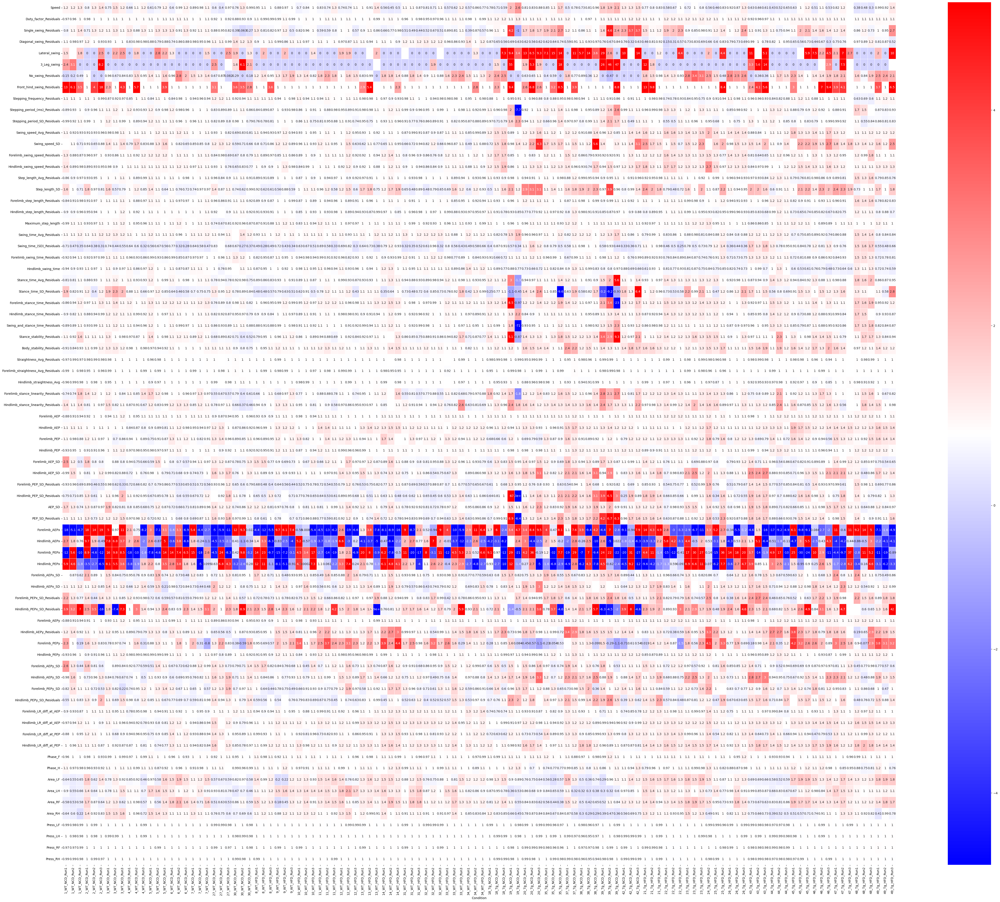

In [71]:
import matplotlib.colors as mcolors


# Set the range of values for normalization
vmin, vmax = -5,5

# Normalize the data within the range of -2 to 2
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=1, vmax=vmax)

plt.figure(figsize=(60, 50))

sns.heatmap(df.T, yticklabels=df.columns, cmap='bwr', norm=norm, linewidths=0.5, linecolor='white',annot=True)
plt.savefig('/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/Heatplot/Normalized fold diff individual heatplot.png', format='png')

### One heatplot per comparison

Numeric data shape: (76, 4), P-values shape: (76, 4)


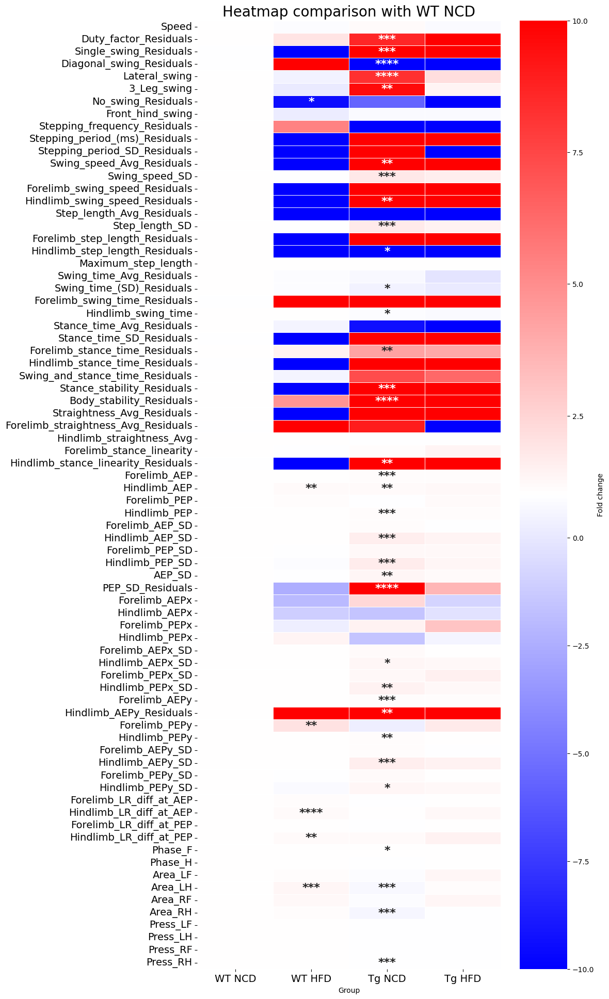

Numeric data shape: (76, 4), P-values shape: (76, 4)


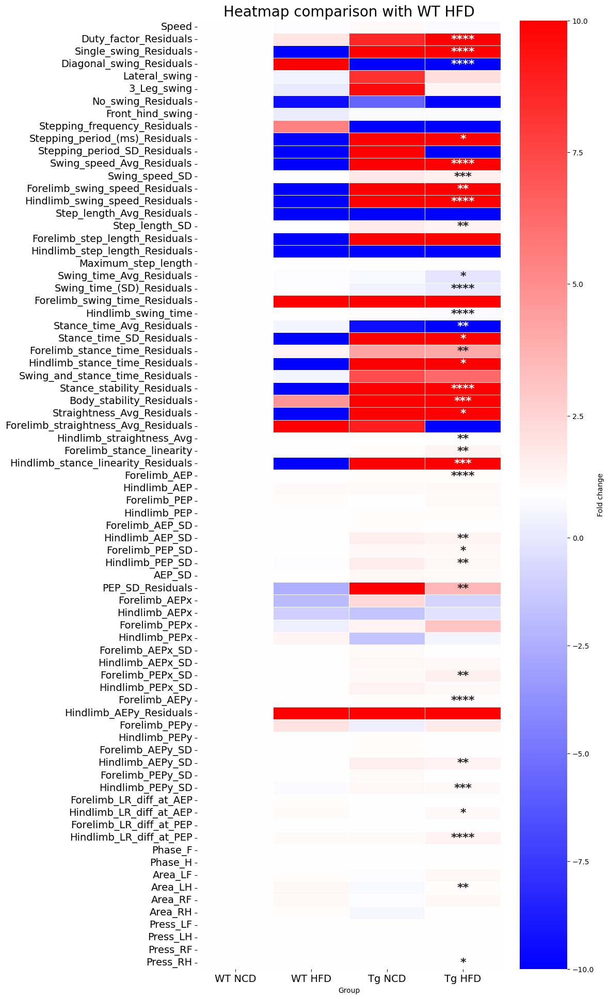

Numeric data shape: (76, 4), P-values shape: (76, 4)


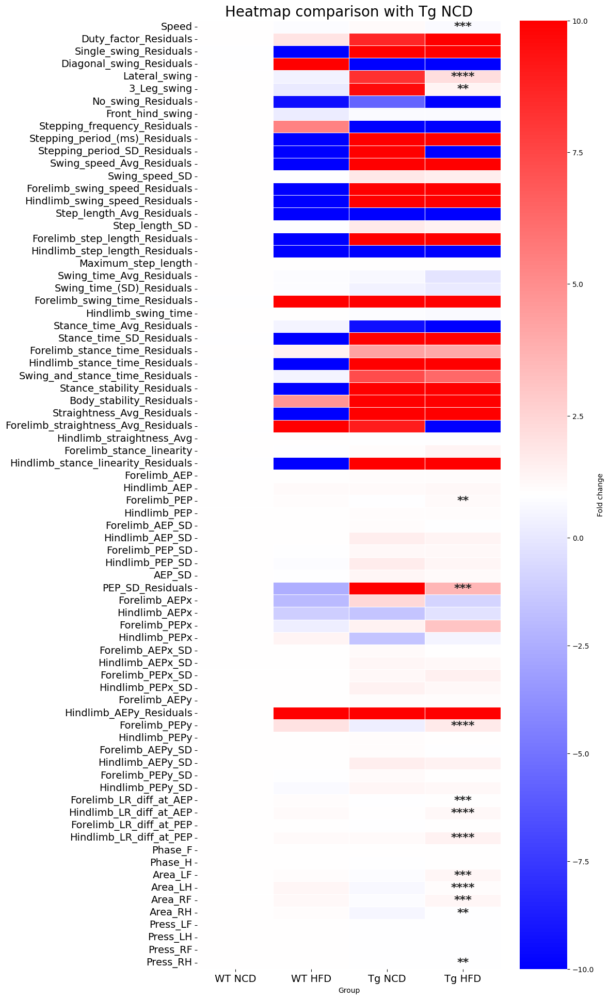

In [253]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import os

def adjust_p_values_for_df(p_values_df, numeric_df):
    """Adjust the p-values dataframe to match the shape of the numeric data dataframe."""
    # Align columns if necessary
    if p_values_df.shape[1] > numeric_df.shape[1]:
        p_values_df = p_values_df.iloc[:, :numeric_df.shape[1]]
    elif p_values_df.shape[1] < numeric_df.shape[1]:
        for _ in range(numeric_df.shape[1] - p_values_df.shape[1]):
            p_values_df[p_values_df.shape[1]] = pd.NA
    
    # Align rows if necessary
    if p_values_df.shape[0] > numeric_df.shape[0]:
        p_values_df = p_values_df.iloc[:numeric_df.shape[0], :]
    elif p_values_df.shape[0] < numeric_df.shape[0]:
        for _ in range(numeric_df.shape[0] - p_values_df.shape[0]):
            p_values_df.loc[p_values_df.shape[0]] = [pd.NA] * p_values_df.shape[1]

    return p_values_df

def generate_single_heatmap_centered(sheet_name, tukey_file_path, numeric_avg_df, output_directory):
    """Generates a single heatmap for the given sheet with correct column order and ensures centering."""
    # Load the p-values data
    p_values_df = pd.read_excel(tukey_file_path, sheet_name=sheet_name)

    # Extract 'Parameter' column for row labels and remove it from p-values data
    parameters = p_values_df['Parameter'].tolist()
    p_values_df = p_values_df.drop(columns=['Parameter'])

    # Adjust p-values to match numeric data dimensions and order
    p_values_df = adjust_p_values_for_df(p_values_df, numeric_avg_df)

    # Check the shape of both dataframes to ensure they match
    print(f"Numeric data shape: {numeric_avg_df.shape}, P-values shape: {p_values_df.shape}")

    if numeric_avg_df.shape != p_values_df.shape:
        raise ValueError(f"Shape mismatch: Numeric data shape {numeric_avg_df.shape}, P-values shape {p_values_df.shape}")

    # Replace NaN with empty strings for annotations
    p_values_df = p_values_df.fillna('')

    # Set normalization range
    vmin, vmax = -10, 10
    norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=1, vmax=vmax)

    # Create the heatmap with increased annotation font size
    plt.figure(figsize=(12, 20))
    ax = sns.heatmap(numeric_avg_df, yticklabels=parameters, cmap='bwr', norm=norm, 
                     linewidths=0.5, linecolor='white', annot=p_values_df, fmt='', 
                     cbar_kws={"label": "Fold change"}, annot_kws={"size": 16, 'weight':'bold'})

    # Increase the axis label font size
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=14)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=14)

    # Title and save the plot to the specified output directory
    plt.title(f'Heatmap comparison with {sheet_name}', fontsize=20)

    # Adjust layout to ensure centering and avoid cropping
    plt.tight_layout(pad=3)

    output_file_path = os.path.join(output_directory, f'Heatmap_avg_debug_{sheet_name}.png')
    plt.savefig(output_file_path, format='png', bbox_inches='tight')
    plt.show()

def generate_heatmaps_centered(df_path, tukey_file_path, output_directory):
    """Generates heatmaps from the averaged group data and transformed p-value map with centering adjustments."""
    
    # Load the data file and set 'Condition' as the index
    df = pd.read_excel(df_path)
    df['Group'] = df['Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]))  # Extract group name with spaces
    df.set_index('Group', inplace=True)

    # Calculate the average per condition (across all rows for each condition)
    average_df = df.groupby('Group').mean()

    # Transpose the averaged data
    numeric_avg_df = average_df.T

    # Reorder the columns to match the correct order: WT NCD, WT HFD, IDE KO NCD, IDE KO HFD
    desired_order = ['WT NCD', 'WT HFD', 'Tg NCD', 'Tg HFD']
    numeric_avg_df = numeric_avg_df[desired_order]

    # Load the transformed Tukey p-value file
    tukey_xls = pd.ExcelFile(tukey_file_path)

    # Generate heatmaps for all sheets in the Tukey file
    for sheet in tukey_xls.sheet_names:
        generate_single_heatmap_centered(sheet, tukey_file_path, numeric_avg_df, output_directory)


# Paths
df_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v2/car_values_norm.xlsx'
tukey_file_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v2/Pval overlay/tukey_p_val_map.xlsx'
output_directory = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v2/Heatplot'

# Run the heatmap generation function
generate_heatmaps_centered(df_path, tukey_file_path, output_directory)


### One heatplot per comparison and a master heatplot <span style="color:lightgreen">(recommended)</span>

In [273]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import os


def generate_individual_heatplots_with_dynamic_annotations(fold_change_file, tukey_file_path, output_directory):
    """Generates individual heatplots for each sheet in the Tukey p-value file, with dynamic annotation colors."""

    # Load fold change data
    fold_change_data = pd.read_excel(fold_change_file)
    fold_change_data['Group'] = fold_change_data['Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]))
    fold_change_data.set_index('Group', inplace=True)

    # Calculate the average fold change per group and transpose for heatmaps
    avg_fold_change = fold_change_data.groupby('Group').mean(numeric_only=True).T

    # Load Tukey p-value file
    tukey_xls = pd.ExcelFile(tukey_file_path)

    # Generate heatplots for each sheet
    for sheet_name in tukey_xls.sheet_names:
        pvals = pd.read_excel(tukey_file_path, sheet_name=sheet_name)
        pvals.set_index('Parameter', inplace=True)

        # Align fold change and p-values by rows and columns
        fold_change = avg_fold_change[pvals.columns]
        pvals = pvals.loc[fold_change.index, fold_change.columns]

        # Remove NaN annotations
        pvals.fillna('', inplace=True)

        # Generate heatplot
        plt.figure(figsize=(12, 22))
        vmin, vmax = -10, 10
        norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=1, vmax=vmax)

        ax = sns.heatmap(
            fold_change, cmap='bwr', norm=norm, yticklabels=fold_change.index,
            linewidths=0.5, linecolor='white', annot=False, 
            cbar_kws={"label": "Fold Change"}
        )

        # Dynamically adjust annotation colors
        for i, row in enumerate(fold_change.index):
            for j, col in enumerate(fold_change.columns):
                annotation = pvals.iloc[i, j]
                if annotation:  # If there is an annotation
                    background_color = ax.collections[0].get_facecolor()[i * fold_change.shape[1] + j]
                    intensity = 0.2989 * background_color[0] + 0.5870 * background_color[1] + 0.1140 * background_color[2]
                    text_color = "white" if intensity < 0.5 else "black"
                    ax.text(j + 0.5, i + 0.5, annotation, color=text_color, ha='center', va='center', fontsize=12, weight='bold')

        plt.title(f'Heatplot comparison with {sheet_name}', fontsize=20)
        plt.tight_layout(pad=3)

        output_file = os.path.join(output_directory, f'Heatmap_{sheet_name}.png')
        plt.savefig(output_file, format='png', bbox_inches='tight')
        plt.show()


def generate_master_heatmap(fold_change_file, tukey_file_path, output_directory):
    """Generates the master heatmap after individual heatplots."""
    
    # Load fold change data
    fold_change_data = pd.read_excel(fold_change_file)
    fold_change_data['Group'] = fold_change_data['Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]))
    fold_change_data.set_index('Group', inplace=True)

    # Calculate the average fold change per group and transpose for heatmap
    avg_fold_change = fold_change_data.groupby('Group').mean(numeric_only=True).T

    # Load Tukey p-value data
    tukey_xls = pd.ExcelFile(tukey_file_path)
    wt_ncd_pvals = pd.read_excel(tukey_file_path, sheet_name='WT NCD')
    wt_hfd_pvals = pd.read_excel(tukey_file_path, sheet_name='WT HFD')
    tg_ncd_pvals = pd.read_excel(tukey_file_path, sheet_name='Tg NCD')

    # Set 'Parameter' as the index for alignment
    wt_ncd_pvals.set_index('Parameter', inplace=True)
    wt_hfd_pvals.set_index('Parameter', inplace=True)
    tg_ncd_pvals.set_index('Parameter', inplace=True)

    # Map the desired columns for the master heatmap
    fold_change_master = pd.concat([
        avg_fold_change[['WT NCD', 'WT HFD', 'Tg NCD','Tg HFD']].rename(columns={'WT HFD': 'WT HFD \nvs \nWT NCD','Tg NCD':'Tg NCD \nvs \nWT NCD','Tg HFD':'Tg HFD \nvs \nWT NCD'}),  # Fold-change for WT NCD heatplot
        avg_fold_change[['Tg HFD']].rename(columns={'Tg HFD': 'Tg HFD \nvs \nWT HFD'}),  # Tg HFD from WT HFD heatplot
        avg_fold_change[['Tg HFD']].rename(columns={'Tg HFD': 'Tg HFD \nvs \nTg NCD'})   # Tg HFD from Tg NCD heatplot
    ], axis=1)

    pvals_master = pd.concat([
        wt_ncd_pvals[['WT NCD', 'WT HFD', 'Tg NCD','Tg HFD']].rename(columns={'WT HFD': 'WT HFD \nvs \nWT NCD','Tg NCD':'Tg NCD \nvs \nWT NCD','Tg HFD':'Tg HFD \nvs \nWT NCD'}),  # P-values for WT NCD heatplot
        wt_hfd_pvals[['Tg HFD']].rename(columns={'Tg HFD': 'Tg HFD \nvs \nWT HFD'}),  # Tg HFD p-values from WT HFD
        tg_ncd_pvals[['Tg HFD']].rename(columns={'Tg HFD': 'Tg HFD \nvs \nTg NCD'})   # Tg HFD p-values from Tg NCD
    ], axis=1)

    # Align p-values to the fold-change data
    pvals_master = pvals_master.loc[fold_change_master.index, fold_change_master.columns]
    pvals_master.fillna('', inplace=True)  # Remove NaN annotations

    # Generate the master heatmap
    plt.figure(figsize=(12, 22))
    vmin, vmax = -3, 3
    norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=1, vmax=vmax)

    ax = sns.heatmap(
        fold_change_master, cmap='bwr', norm=norm, yticklabels=fold_change_master.index,
        linewidths=0.5, linecolor='white', annot=False, 
        cbar_kws={"label": "Fold Change to WT NCD"}
    )

    # Dynamically adjust annotation colors
    for i, row in enumerate(fold_change_master.index):
        for j, col in enumerate(fold_change_master.columns):
            annotation = pvals_master.iloc[i, j]
            if annotation:  # If there is an annotation
                background_color = ax.collections[0].get_facecolor()[i * fold_change_master.shape[1] + j]
                intensity = 0.2989 * background_color[0] + 0.5870 * background_color[1] + 0.1140 * background_color[2]
                text_color = "white" if intensity < 0.5 else "black"
                ax.text(j + 0.5, i + 0.5, annotation, color=text_color, ha='center', va='center', fontsize=12, weight='bold')

    plt.title('Summary Heatplot', fontsize=20)
    plt.tight_layout(pad=3)
    output_file = os.path.join(output_directory, 'Summary_Heatmap.png')
    plt.savefig(output_file, format='png', bbox_inches='tight')
    plt.show()

/var/folders/nn/sbsnz85506q7y4rbtjdlczpr0000gn/T/ipykernel_26611/2824002615.py:32: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  pvals.fillna('', inplace=True)


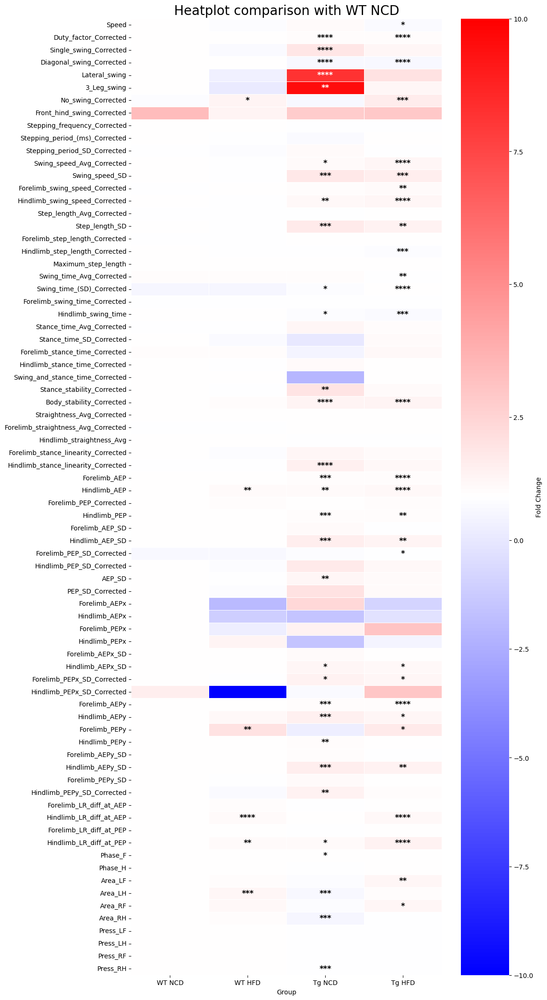

/var/folders/nn/sbsnz85506q7y4rbtjdlczpr0000gn/T/ipykernel_26611/2824002615.py:32: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  pvals.fillna('', inplace=True)


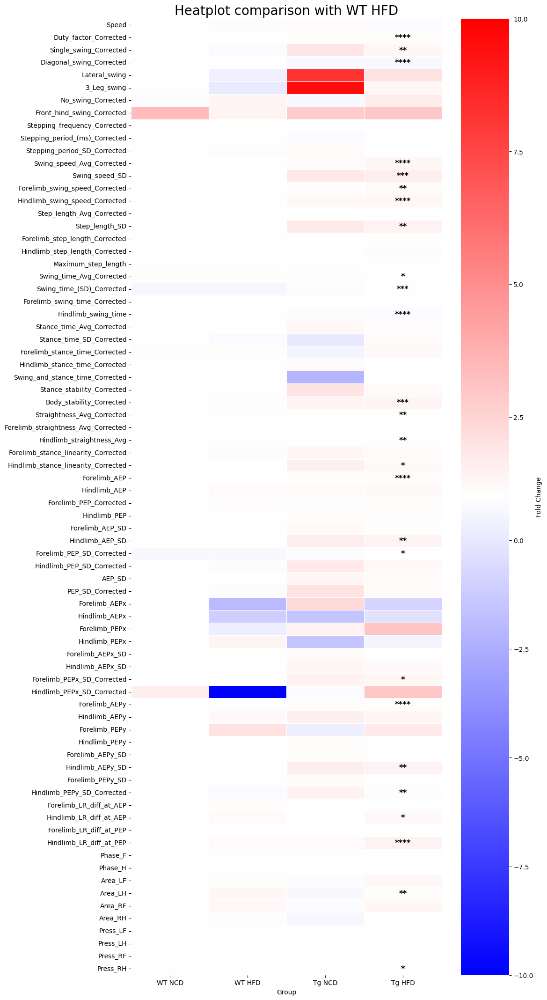

/var/folders/nn/sbsnz85506q7y4rbtjdlczpr0000gn/T/ipykernel_26611/2824002615.py:32: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  pvals.fillna('', inplace=True)


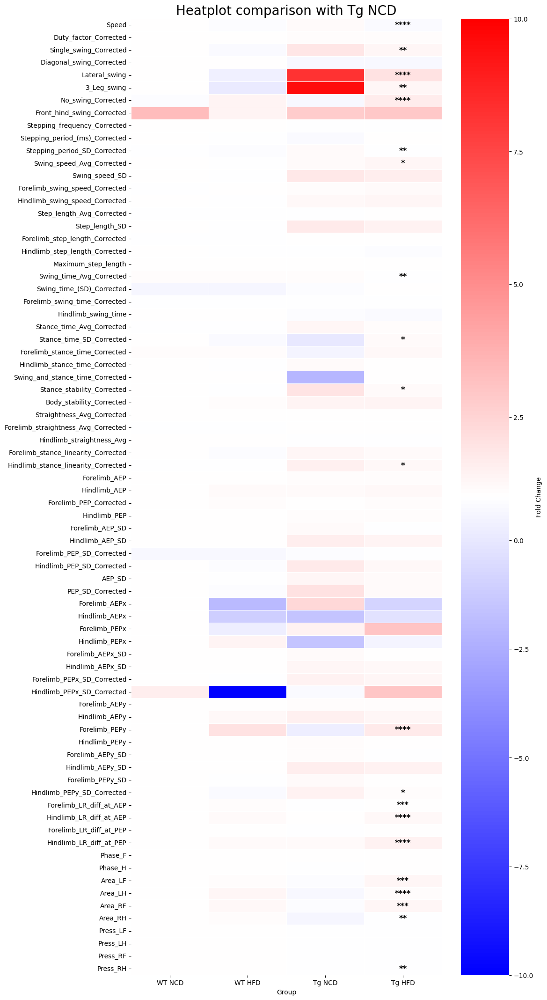

/var/folders/nn/sbsnz85506q7y4rbtjdlczpr0000gn/T/ipykernel_26611/2824002615.py:100: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  pvals_master.fillna('', inplace=True)  # Remove NaN annotations


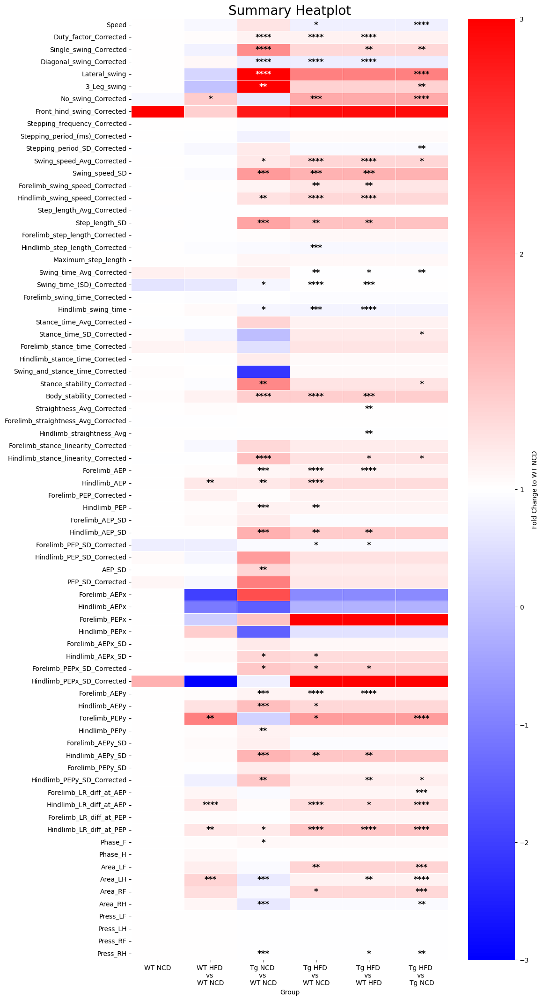

In [275]:
fold_change_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/Regression analysis/CAR/Decision 3 rule/CAR_fold_norm.xlsx'
tukey_file_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/Two-way ANOVA/Decision 3 rules/Pval/tukey_p_val_map.xlsx'
output_directory = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/Heatplot/Decision 3 rules'

# Generate individual heatplots
generate_individual_heatplots_with_dynamic_annotations(fold_change_file, tukey_file_path, output_directory)

# Generate the master heatmap
generate_master_heatmap(fold_change_file, tukey_file_path, output_directory)


## Dot plot <span style="color:lightgreen">(recommended)</span>

### Dot plot - Fold change only

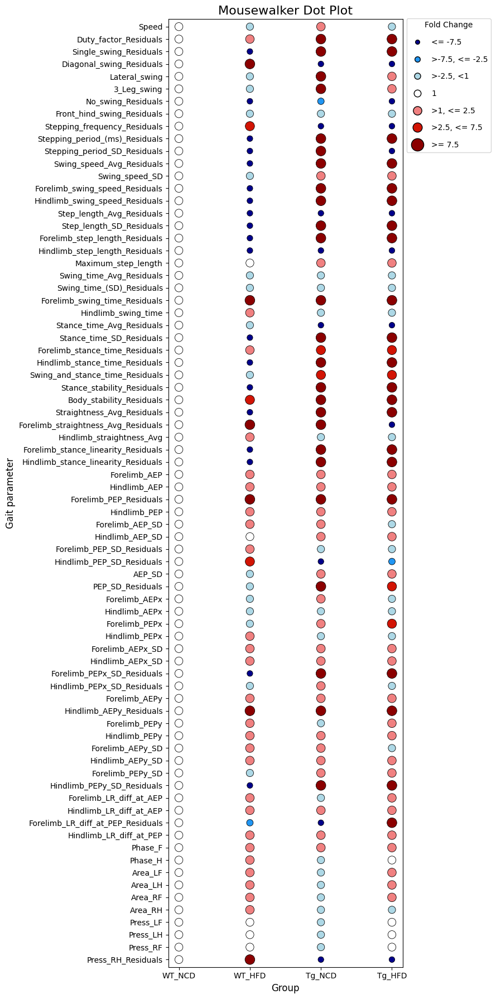

In [420]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def generate_dot_plot(file_path, output_file):
    # Step 1: Load the data from the provided file path
    data = pd.read_excel(file_path)  # Read the Excel file assuming it's an Excel file

    # Step 2: Extract group information from the 'Condition' column
    data['Group'] = data['Condition'].apply(lambda x: '_'.join(x.split('_')[1:3]))

    # Step 3: Extract the original order of numeric columns (features)
    original_order = data.columns.drop('Condition').tolist()

    # Step 4: Identify numeric columns for averaging
    numeric_columns = data.select_dtypes(include=['number']).columns.difference(['Condition'])  # Numeric columns for features

    # Step 5: Calculate averages per group for each numeric column
    averaged_data = data.groupby('Group')[numeric_columns].mean().reset_index()
    averaged_data.loc[averaged_data['Group'] == 'WT_NCD', numeric_columns] = averaged_data.loc[averaged_data['Group'] == 'WT_NCD', numeric_columns].round(0)
    averaged_data.loc[averaged_data['Group'] != 'WT_NCD', numeric_columns] = averaged_data.loc[averaged_data['Group'] != 'WT_NCD', numeric_columns].round(2)

    # Step 6: Melt the dataframe to create long-form data suitable for a dot plot
    melted_data = averaged_data.melt(id_vars=['Group'], value_vars=numeric_columns, var_name='Feature', value_name='Value')

    # Step 7: Define the bins, colors, and sizes as per the given intervals
    bin_edges = [-float('inf'), -7.5, -2.5, 0.99, 1.01, 2.5, 7.5, float('inf')]
    bin_labels = [
        "<= -7.5", ">-7.5, <= -2.5", ">-2.5, <1", "1", ">1, <= 2.5", ">2.5, <= 7.5", ">= 7.5"
    ]
    colors_corrected = [
        "darkblue",
        "#2196F3",
        "lightblue",
        "white",
        "lightcoral",
        "#D21404",
        "darkred"
    ]
    sizes = [55, 70, 80, 90, 110, 120, 160]  # Sizes mapped to bins

    # Step 8: Assign bins, colors, and sizes based on the averaged values
    melted_data['Bin'] = pd.cut(melted_data['Value'], bins=bin_edges, labels=bin_labels, include_lowest=True)
    melted_data['Color'] = melted_data['Bin'].map(dict(zip(bin_labels, colors_corrected)))
    melted_data['Size'] = melted_data['Bin'].map(dict(zip(bin_labels, sizes)))

    # Ensure that NaN values are handled properly (e.g., for cases where bin assignment fails)
    melted_data['Color'].fillna('white', inplace=True)
    melted_data['Size'].fillna(55, inplace=True)

    # Step 9: Create custom legend handles for the updated bins
    custom_legend_handles = [
        Line2D([0], [0], marker='o', color=color, markersize=size/10, label=label, 
               markeredgewidth=1.0, markeredgecolor='black', alpha=1.0, linestyle='None')
        for label, color, size in zip(bin_labels, colors_corrected, sizes)
    ]

    # Step 10: Set the order for the x-axis
    group_order = ['WT_NCD', 'WT_HFD', 'Tg_NCD', 'Tg_HFD']
    melted_data['Group'] = pd.Categorical(melted_data['Group'], categories=group_order, ordered=True)

    # Step 11: Maintain the original order of features from the input file, excluding the 'Group' column
    features_order = [feature for feature in original_order if feature != 'Group']
    melted_data['Feature'] = pd.Categorical(melted_data['Feature'], categories=features_order[::-1], ordered=True)  # Reverse the order to match the original order

    # Step 12: Create the dot plot with correct groups and features represented
    plt.figure(figsize=(9, 18))  # Maintain height but adjust for less empty space
    scatter = sns.scatterplot(
        data=melted_data,
        x='Group',  # Set group (e.g., WT NCD, Tg HFD) on the x-axis
        y='Feature',  # Set 'Feature' on the y-axis to make parameters run vertically
        size="Size",
        sizes=(160, 55),
        hue="Color",
        palette=dict(zip(colors_corrected, colors_corrected)),
        alpha=1,
        marker='o',
        legend=False,
        edgecolor="black"  # Add black edge to all markers
    )

    # Step 13: Add the custom legend to the right of the plot with increased spacing
    plt.legend(
        handles=custom_legend_handles,
        title="Fold Change",
        fontsize=10,
        loc="upper left",
        bbox_to_anchor=(1, 1.005),  # Further increased spacing by adjusting bbox_to_anchor
        labelspacing=1.20,
        frameon=True
    )

    # Step 14: Customize plot aesthetics, ensuring original feature order
    plt.title("Mousewalker Dot Plot", fontsize=16)
    plt.xlabel("Group", fontsize=12)
    plt.ylabel("Gait parameter", fontsize=12)
    plt.xticks(rotation=0, fontsize=10)
    plt.yticks(fontsize=10)
    plt.ylim(-0.6, len(features_order) - 0.4)  # Set y-axis limits to reduce empty space and maintain correct order
    plt.tight_layout()

    # Step 15: Save the plot
    plt.savefig(output_file)
    plt.show()

# Generate the dot plot using the uploaded file
file_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v2/car_values_norm.xlsx'
output_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v2/Dot plot.png'
generate_dot_plot(file_path, output_file)


### Dot plot - with statistics <span style="color:lightgreen">(all parameters)</span>

Loading data from file: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/CAR Fold/Decision 4/CAR_fold_norm.xlsx
Extracting group information...
Extracting numeric columns for averaging...
Calculating averages per group...
Saving averaged data to: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/CAR Fold/Decision 4/CAR_fold_norm_averaged.xlsx
Saving transposed averaged data to: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/CAR Fold/Decision 4/CAR_fold_norm_averaged_transposed.xlsx
Calculating absolute differences compared to WT NCD...
Saving absolute difference data to: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/CAR Fold/Decision 4/CAR_fold_norm_averaged_absolutdiff_transposed.xlsx
Calculating direction comparisons...
Processing p-values 

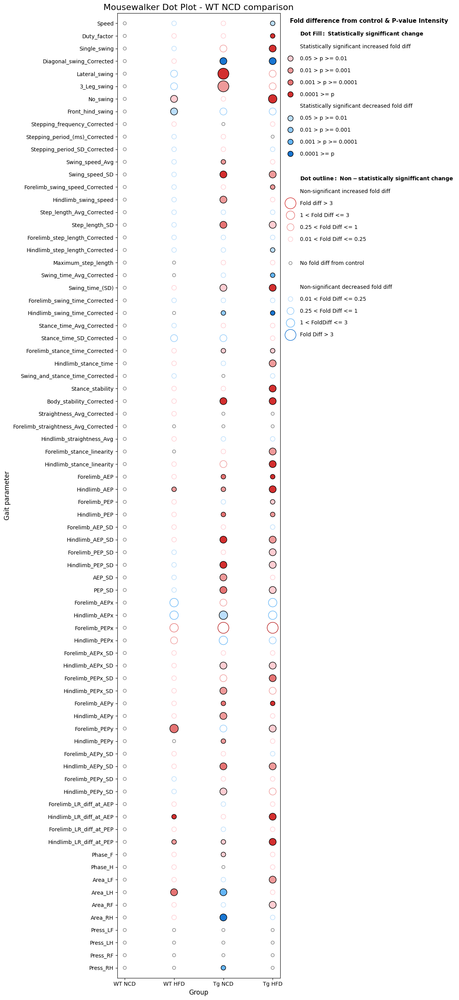

Generating dot plot for sheet: WT HFD
Saving plot to: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Dot Plots/Decision 4/DotPlot_WT HFD comparison.png


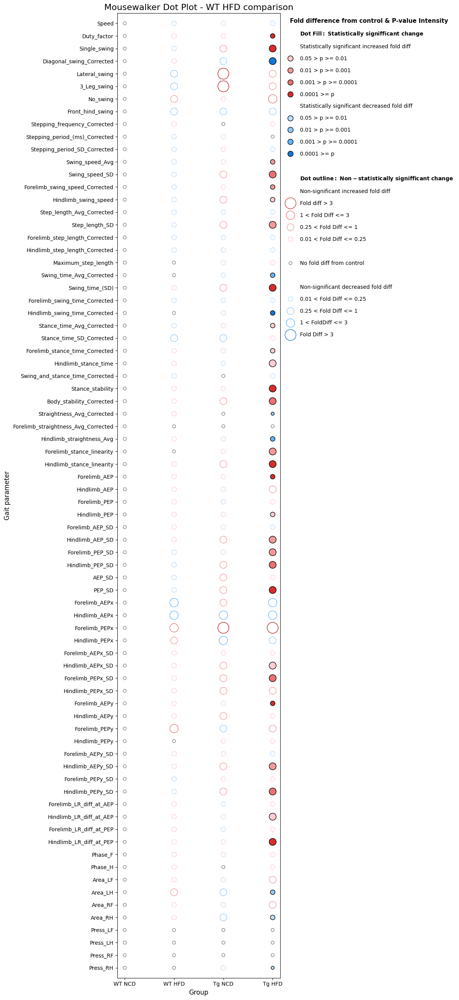

Generating dot plot for sheet: Tg NCD
Saving plot to: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Dot Plots/Decision 4/DotPlot_Tg NCD comparison.png


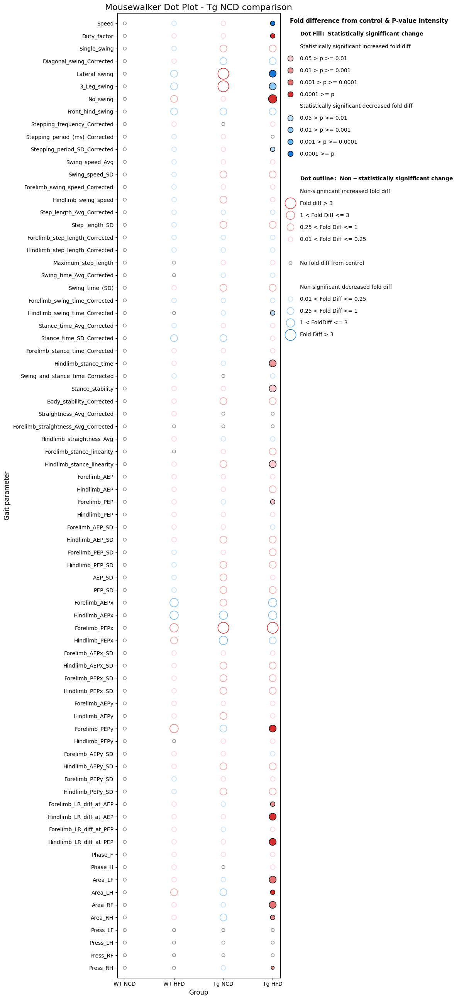

In [28]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import os

# Step 1: Load and process data for averaging and absolute differences
def generate_averaged_data(file_path):
    # Load the data
    print("Loading data from file:", file_path)
    data = pd.read_excel(file_path)
    
    # Extract group information
    print("Extracting group information...")
    data['Group'] = data['Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]).replace('_', ' ').strip())
    
    # Standardize group names
    data['Group'] = data['Group'].str.strip()
    
    # Extract numeric columns for averaging
    print("Extracting numeric columns for averaging...")
    numeric_columns = data.select_dtypes(include=['number']).columns.difference(['Condition'])
    
    # Calculate averages per group for each numeric column
    print("Calculating averages per group...")
    averaged_data = data.groupby('Group')[numeric_columns].mean().reset_index()
    
    # Keep the same column order as the original file
    final_columns = ['Group'] + [col for col in data.columns if col in numeric_columns]
    averaged_data = averaged_data[final_columns]
    
    # Save averaged data to a new Excel file
    averaged_output_path = file_path.replace('.xlsx', '_averaged.xlsx')
    print("Saving averaged data to:", averaged_output_path)
    averaged_data.to_excel(averaged_output_path, index=False)
    
    # Save transposed averaged data to a new Excel file
    transposed_output_path = file_path.replace('.xlsx', '_averaged_transposed.xlsx')
    print("Saving transposed averaged data to:", transposed_output_path)
    averaged_data.set_index('Group').T.rename_axis('Parameter').reindex(['WT NCD', 'WT HFD', 'Tg NCD', 'Tg HFD'], axis=1).to_excel(transposed_output_path, index=True, header=True)
    
    return transposed_output_path

def generate_absolute_diff(file_path, averaged_data, p_value_file):
    # Load averaged data and p-value sheets
    averaged_data = pd.read_excel(averaged_data, index_col=0)
    averaged_data.index.name = 'Parameter'
    averaged_data.columns.name = None

    p_values_data = pd.ExcelFile(p_value_file)

    # Step 1: Calculate absolute differences to WT NCD
    print("Calculating absolute differences compared to WT NCD...")
    abs_diff_data = averaged_data.copy()
    if 'WT NCD' not in averaged_data.columns:
        print("Error: No WT NCD group found in averaged data. Skipping absolute difference calculation.")
        return None, None

    wt_ncd_data = averaged_data['WT NCD']
    abs_diff_data = abs_diff_data.subtract(wt_ncd_data, axis=0).abs()

    # Save absolute differences
    abs_diff_output_path = file_path.replace('.xlsx', '_averaged_absolutdiff_transposed.xlsx')
    print("Saving absolute difference data to:", abs_diff_output_path)
    abs_diff_data.to_excel(abs_diff_output_path, index=True, header=True)

    # Step 2: Calculate direction comparisons
    print("Calculating direction comparisons...")
    direction_foldchange = averaged_data.subtract(wt_ncd_data, axis=0)  # Direction to WT NCD
    direction_pval = pd.DataFrame(index=averaged_data.index)  # Placeholder for p-value based directions

    for sheet_name in p_values_data.sheet_names:
        print(f"Processing p-values sheet: {sheet_name}")
        p_vals = pd.read_excel(p_value_file, sheet_name=sheet_name, index_col=0)

        target_groups = [col for col in p_vals.columns if not p_vals[col].isna().all()]

        for target_group in target_groups:
            if target_group not in averaged_data.columns or sheet_name not in averaged_data.columns:
                print(f"Skipping invalid comparison: {target_group} vs {sheet_name}")
                continue

            # Calculate direction for the specific p-value comparison
            column_name = f"{target_group} vs {sheet_name}"
            direction_pval[column_name] = averaged_data[target_group] - averaged_data[sheet_name]

    # Save direction data
    direction_foldchange_output_path = file_path.replace('.xlsx', '_direction_foldchange_transposed.xlsx')
    direction_pval_output_path = file_path.replace('.xlsx', '_direction_pval_transposed.xlsx')
    print("Saving direction_foldchange data to:", direction_foldchange_output_path)
    print("Saving direction_pval data to:", direction_pval_output_path)
    direction_foldchange.to_excel(direction_foldchange_output_path, index=True, header=True)
    direction_pval.to_excel(direction_pval_output_path, index=True, header=True)

    return abs_diff_output_path, direction_foldchange_output_path, direction_pval_output_path



# Step 2: Generate dot plot incorporating averaged data, absolute differences, and p-values
def generate_dot_plot_with_p_values(averaged_file, abs_diff_file, p_value_file, direction_pval_file, output_directory):
    # Load averaged data, absolute differences, direction data, and p-values
    print("Loading averaged data from file (transposed):", averaged_file)
    averaged_data = pd.read_excel(averaged_file, index_col=0)
    averaged_data.index.name = 'Parameter'
    averaged_data.columns.name = None

    print("Loading absolute difference data from file (transposed):", abs_diff_file)
    abs_diff_data = pd.read_excel(abs_diff_file, index_col=0)
    abs_diff_data.index.name = 'Parameter'
    abs_diff_data.columns.name = None

    print("Loading direction comparison data from file (transposed):", direction_pval_file)
    direction_comparison = pd.read_excel(direction_pval_file, index_col=0)
    direction_comparison.index.name = 'Parameter'

    print("Loading p-value data from file:", p_value_file)
    p_values_data = pd.read_excel(p_value_file, sheet_name=None)

    group_order = ['WT NCD', 'WT HFD', 'Tg NCD', 'Tg HFD']

    # Iterate over each sheet in the p-value file to generate individual dot plots
    for sheet_name, p_vals in p_values_data.items():
        print(f"Generating dot plot for sheet: {sheet_name}")
        plt.figure(figsize=(12, 26))
    
        # Standardize the p-value sheet index and columns
        p_vals = p_vals.set_index('Parameter')
        p_vals.columns = [col.strip() for col in p_vals.columns]
    
        # Melt the data for all groups
        melted_data = averaged_data.reset_index().melt(
            id_vars=['Parameter'], value_vars=group_order, var_name='Group', value_name='Value'
        )
        melted_abs_diff = abs_diff_data.reset_index().melt(
            id_vars=['Parameter'], value_vars=group_order, var_name='Group', value_name='AbsDiff'
        )
        melted_p_vals = p_vals.reset_index().melt(
            id_vars=['Parameter'], value_vars=group_order, var_name='Group', value_name='PValue'
        )
        melted_direction = direction_comparison.reset_index().melt(
            id_vars=['Parameter'], var_name='Comparison', value_name='DirectionPval'
        )
    
        # Calculate DirectionFoldChange
        melted_data['DirectionFoldChange'] = melted_data.apply(
            lambda row: averaged_data.loc[row['Parameter'], row['Group']] - averaged_data.loc[row['Parameter'], 'WT NCD'], axis=1
        )
    
        # Merge all data together
        melted_data = melted_data.merge(melted_abs_diff, on=['Parameter', 'Group'], how='inner')
        melted_data = melted_data.merge(melted_p_vals, on=['Parameter', 'Group'], how='left')  # Use left join to retain NaN p-values
        melted_data['Comparison'] = melted_data['Group'] + " vs " + sheet_name
        melted_data = melted_data.merge(
            melted_direction, on=['Parameter', 'Comparison'], how='left'
        )
    
        # Save the melted data with all groups included
        #output_debug_path = os.path.join(output_directory, f'Melted_Data_{sheet_name} comparison.xlsx')
        #melted_data.to_excel(output_debug_path, index=False)
    
        # Assign size bins based on absolute differences
        size_bins = {
            (0, 0.01): 35,
            (0.01, 0.25): 75,
            (0.25, 1): 170,
            (1, 3): 250,
            (3, float('inf')): 420
        }
        melted_data['Size'] = melted_data.apply(lambda row: 35 if row['Group'] == 'WT NCD' else next((size for k, size in size_bins.items() if (isinstance(k, tuple) and k[0] < row['AbsDiff'] <= k[1]) or (not isinstance(k, tuple) and row['AbsDiff'] == k)), 35), axis=1)
    
        # Updated Color and Edge Logic
        colors = []
        edge_colors = []
        for _, row in melted_data.iterrows():
            # Fill color based on direction_pval and p-value significance
            if row['Group'] == 'WT NCD':
                colors.append("#FFFFFF")  # White fill for WT NCD
                edge_colors.append("#808080")  # Black outline for WT NCD
            elif pd.isna(row['PValue']) or row['PValue'] > 0.05:
                # Non-significant p-values: White fill, outline based on direction_foldchange
                colors.append("#FFFFFF")  # White fill for non-significant p-value
                if row['DirectionFoldChange'] > 0:
                    # Red outline for increased values relative to WT NCD
                    if 0 < row['AbsDiff'] <= 0.01:
                        edge_colors.append("#808080")
                    elif 0.01 < row['AbsDiff'] <= 0.25:
                        edge_colors.append("#FFCDD2")
                    elif 0.25 < row['AbsDiff'] <= 1:
                        edge_colors.append("#EF9A9A")
                    elif 1 < row['AbsDiff'] <= 3:
                        edge_colors.append("#E57373")
                    else:
                        edge_colors.append("#B71C1C")
                else:
                    # Blue outline for decreased values relative to WT NCD
                    if 0 < row['AbsDiff'] <= 0.01:
                        edge_colors.append("#808080")
                    elif 0.01 < row['AbsDiff'] <= 0.25:
                        edge_colors.append("#BBDEFB")
                    elif 0.25 < row['AbsDiff'] <= 1:
                        edge_colors.append("#90CAF9")
                    elif 1 < row['AbsDiff'] <= 3:
                        edge_colors.append("#64B5F6")
                    else:
                        edge_colors.append("#0D47A1")
            else:
                # Significant p-values: Fill color based on direction_pval
                if row['DirectionPval'] > 0:
                    # Red fill for significant increases
                    if 0.01 < row['PValue'] <= 0.05:
                        colors.append("#FFCDD2")
                    elif 0.001 < row['PValue'] <= 0.01:
                        colors.append("#EF9A9A")
                    elif 0.0001 < row['PValue'] <= 0.001:
                        colors.append("#E57373")
                    else:
                        colors.append("#D32F2F")
                else:
                    # Blue fill for significant decreases
                    if 0.01 < row['PValue'] <= 0.05:
                        colors.append("#BBDEFB")
                    elif 0.001 < row['PValue'] <= 0.01:
                        colors.append("#90CAF9")
                    elif 0.0001 < row['PValue'] <= 0.001:
                        colors.append("#64B5F6")
                    else:
                        colors.append("#1976D2")
                
                # Black outline for significant p-values
                edge_colors.append("black")

        
        # Assign colors to melted data
        melted_data['Color'] = colors
        melted_data['EdgeColor'] = edge_colors




        # Set the order for the x-axis
        melted_data['Group'] = pd.Categorical(melted_data['Group'], categories=group_order, ordered=True)
        melted_data['Parameter'] = pd.Categorical(melted_data['Parameter'], categories=averaged_data.index, ordered=True)

        melted_data.to_excel(os.path.join(output_directory,f'Melted data_{sheet_name} comparison.xlsx'))
        
        # Create dot plot
        scatter = plt.scatter(
            x=melted_data['Group'],
            y=melted_data['Parameter'],
            s=melted_data['Size'],
            c=melted_data['Color'],
            alpha=1,
            marker='o',
            edgecolor=melted_data['EdgeColor']
        )
        
        plt.ylim(-0.8, len(averaged_data.index.tolist()) - 0.2)  # Set y-axis limits to reduce empty space and maintain correct order
        plt.gca().invert_yaxis()

        # Custom legend for colors
        color_text_handle = [Line2D([0], [0], linestyle='None', label=r'$\mathbf{Dot\ Fill:\ Statistically\ signifficant\ change}$', color='none')]

        color_text_handle_up = [Line2D([0], [0], linestyle='None', label='Statistically significant increased fold diff', color='none')]
        
        color_legend_handles_up = [
            Line2D([0], [0], marker='o', color="#FFCDD2", markersize=10, linestyle='None', markeredgewidth=1.0, markeredgecolor='black', label='0.05 > p >= 0.01'),
            Line2D([0], [0], marker='o', color="#EF9A9A", markersize=10, linestyle='None', markeredgewidth=1.0, markeredgecolor='black', label='0.01 > p >= 0.001'),
            Line2D([0], [0], marker='o', color="#E57373", markersize=10, linestyle='None', markeredgewidth=1.0, markeredgecolor='black', label='0.001 > p >= 0.0001'),
            Line2D([0], [0], marker='o', color="#D32F2F", markersize=10, linestyle='None', markeredgewidth=1.0, markeredgecolor='black', label='0.0001 >= p')
        ]

        color_text_handle_down = [Line2D([0], [0], linestyle='None', label='Statistically significant decreased fold diff', color='none')]
        
        color_legend_handles_down = [
            Line2D([0], [0], marker='o', color="#BBDEFB", markersize=10, linestyle='None', markeredgewidth=1.0, markeredgecolor='black', label='0.05 > p >= 0.01'),
            Line2D([0], [0], marker='o', color="#90CAF9", markersize=10, linestyle='None', markeredgewidth=1.0, markeredgecolor='black', label='0.01 > p >= 0.001'),
            Line2D([0], [0], marker='o', color="#64B5F6", markersize=10, linestyle='None', markeredgewidth=1.0, markeredgecolor='black', label='0.001 > p >= 0.0001 '),
            Line2D([0], [0], marker='o', color="#1976D2", markersize=10, linestyle='None', markeredgewidth=1.0, markeredgecolor='black', label='0.0001 >= p')
        ]

        color_legend_handles_equal = [
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(0, 0.01)]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor='#808080', label='No fold diff from control')]

        
        handle_break = [Line2D([0], [0], linestyle='None', label='', color='none')]

        
        color_line_handle = [Line2D([0], [0], linestyle='None', label=r'$\mathbf{Dot\ outline:\ Non-statistically\ signifficant\ change}$', color='none')]

        
        color_line_handle_up = [Line2D([0], [0], linestyle='None', label='Non-significant increased fold diff', color='none')]


        color_legend_handles_outline_up = [
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(3, float('inf'))]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor="#D32F2F", label='Fold diff > 3'),
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(1, 3)]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor="#E57373", label='1 < Fold Diff <= 3'),
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(0.25, 1)]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor="#EF9A9A", label='0.25 < Fold Diff <= 1'),
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(0.01, 0.25)]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor="#FFCDD2", label='0.01 < Fold Diff <= 0.25'),
        ]

        color_line_handle_down = [Line2D([0], [0], linestyle='None', label='Non-significant decreased fold diff', color='none')]

        color_legend_handles_outline_down = [
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(0.01, 0.25)]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor="#BBDEFB", label='0.01 < Fold Diff <= 0.25'),
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(0.25, 1)]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor="#90CAF9", label='0.25 < Fold Diff <= 1'),
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(1, 3)]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor="#64B5F6", label='1 < FoldDiff <= 3'),
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(3, float('inf'))]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor="#1976D2", label='Fold Diff > 3')

        ]
        
        # Combine all legend elements into a single list
        full_legend_handles = color_text_handle + color_text_handle_up + color_legend_handles_up + color_text_handle_down + color_legend_handles_down +  handle_break + color_line_handle + color_line_handle_up + color_legend_handles_outline_up + handle_break + color_legend_handles_equal + handle_break + color_line_handle_down + color_legend_handles_outline_down

        # Adding the legend with the specified handles
        plt.legend(
            handles=full_legend_handles,
            title="Fold difference from control & P-value Intensity", title_fontproperties={'weight':'bold','size':11},
            fontsize=10,
            loc="upper left",
            bbox_to_anchor=(1, 1),
            labelspacing=1.22,
            frameon=False
        )

        plt.title(f'Mousewalker Dot Plot - {sheet_name} comparison', fontsize=16)
        plt.xlabel("Group", fontsize=12)
        plt.ylabel("Gait parameter", fontsize=12)
        plt.xticks(rotation=0, fontsize=10)
        plt.yticks(fontsize=10)
        plt.tight_layout()

        output_file_path = os.path.join(output_directory, f'DotPlot_{sheet_name} comparison.png')
        print("Saving plot to:", output_file_path)
        plt.savefig(output_file_path)
        plt.show()


file_path =  '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/CAR Fold/Decision 4/CAR_fold_norm.xlsx'
p_value_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Statistical analysis/Two-way ANOVA/Decision 4/tukey_combined_processed.xlsx'
output_directory = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Dot Plots/Decision 4'


# Generate averaged data and absolute differences
averaged_file = generate_averaged_data(file_path)
abs_diff_file, direction_foldchange_file, direction_pval_file = generate_absolute_diff(file_path, averaged_file, p_value_file)

# Generate individual and master dot plots with p-values
generate_dot_plot_with_p_values(averaged_file, abs_diff_file, p_value_file, direction_pval_file, output_directory)

### Dot plot - with statistics <span style="color:lightgreen">(just significant parameters for each group)</span>

Step -1: Filtering Tukey p-values and car_values data...
Loading Tukey p-value file: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Statistical analysis/Two-way ANOVA/Decision 4/tukey_combined_processed.xlsx
Loading car_values file: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Statistical analysis/CAR Fold/Decision 4/CAR_fold_norm.xlsx
Processing sheet: WT NCD
Parameters marked for removal in sheet 'WT NCD': ['Stepping_frequency_Corrected', 'Stepping_period_(ms)_Corrected', 'Stepping_period_SD_Corrected', 'Step_length_Avg_Corrected', 'Forelimb_step_length_Corrected', 'Maximum_step_length', 'Forelimb_swing_time_Corrected', 'Stance_time_Avg_Corrected', 'Stance_time_SD_Corrected', 'Swing_and_stance_time_Corrected', 'Straightness_Avg_Corrected', 'Forelimb_straightness_Avg_Corrected', 'Hindlimb_straightness_Avg', 'Forelimb_AEP_SD', 'Forelimb_AEPx', 'Forelimb_PEPx', 'Hindlimb_PEPx', 'Forelimb_AEPx_SD', 'Forelimb_AEPy_SD', 'Forelimb_PEPy_SD', 'For

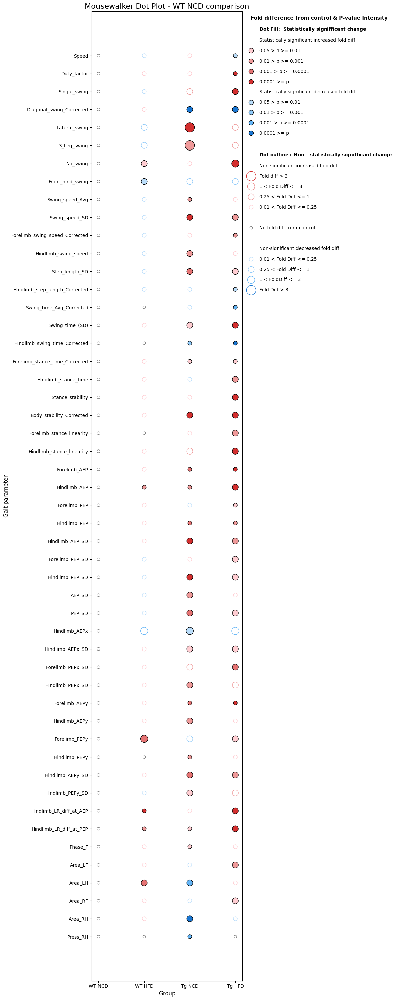

Generating dot plot for sheet: WT HFD
Found 36 significant parameters for sheet 'WT HFD'.
Saving plot to: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Dot Plots/Significant/Decision 4/DotPlot_WT HFD comparison.png


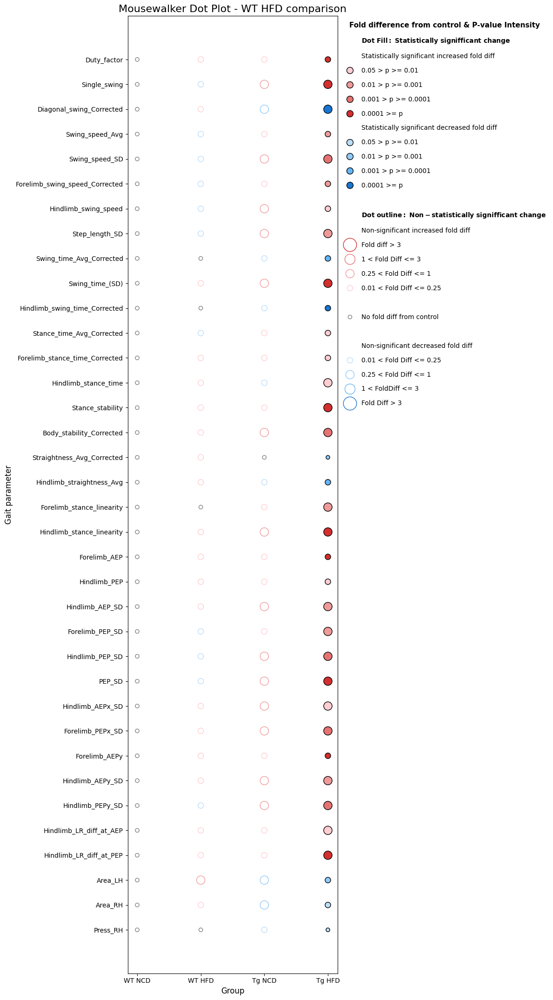

Generating dot plot for sheet: Tg NCD
Found 20 significant parameters for sheet 'Tg NCD'.
Saving plot to: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Dot Plots/Significant/Decision 4/DotPlot_Tg NCD comparison.png


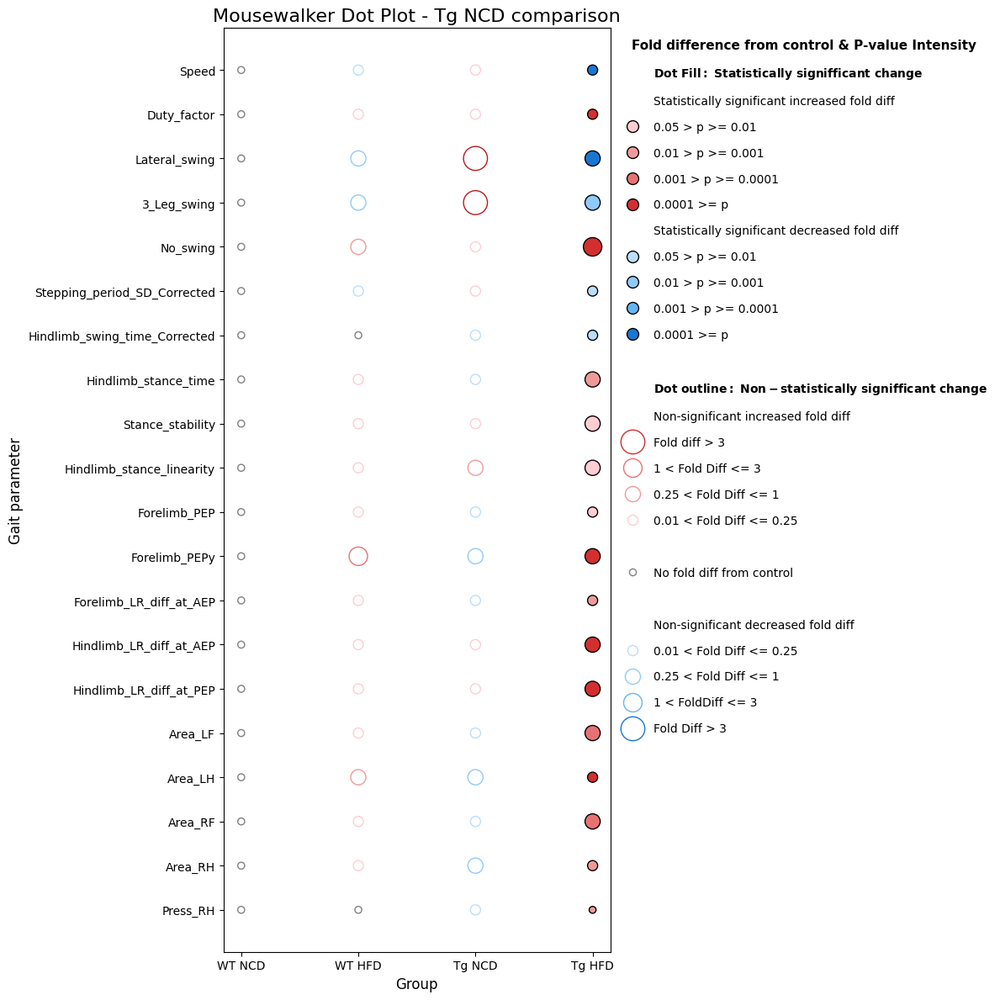

In [30]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import os

import pandas as pd
import numpy as np

def filter_tukey_and_car_values_dynamic_fixed(tukey_file_path, car_values_file_path):
    # Load Tukey p-value data
    print("Loading Tukey p-value file:", tukey_file_path)
    tukey_data = pd.read_excel(tukey_file_path, sheet_name=None)
    
    # Load car_values data
    print("Loading car_values file:", car_values_file_path)
    car_values_data = pd.read_excel(car_values_file_path)

    # Initialize structures for filtering
    filtered_tukey_data = {}
    filtered_car_values_data = {}

    for sheet_name, df in tukey_data.items():
        print(f"Processing sheet: {sheet_name}")
        df.set_index("Parameter", inplace=True)

        # Identify parameters to remove
        params_to_remove = df.index[~(df < 0.05).any(axis=1)].tolist()
        print(f"Parameters marked for removal in sheet '{sheet_name}':", params_to_remove)

        # Drop non-significant parameters from Tukey data
        filtered_tukey_data[sheet_name] = df.drop(params_to_remove, axis=0)

        # Drop corresponding parameters from car_values data
        sheet_car_values = car_values_data.copy()
        sheet_car_values = sheet_car_values.drop(columns=[col for col in params_to_remove if col in sheet_car_values.columns], errors="ignore")
        filtered_car_values_data[sheet_name] = sheet_car_values

        # Debugging: Print remaining parameters in car_values after filtering
        print(f"Remaining parameters in filtered car_values for sheet '{sheet_name}':", sheet_car_values.columns.tolist())

    # Save the filtered Tukey file
    filtered_tukey_file_path = tukey_file_path.replace(".xlsx", "_significant.xlsx")
    print("Saving filtered Tukey file to:", filtered_tukey_file_path)
    with pd.ExcelWriter(filtered_tukey_file_path) as writer:
        for sheet_name, df in filtered_tukey_data.items():
            df.to_excel(writer, sheet_name=sheet_name)

    # Save the filtered car_values file
    filtered_car_values_file_path = car_values_file_path.replace(".xlsx", "_significant.xlsx")
    print("Saving filtered car_values file to:", filtered_car_values_file_path)
    with pd.ExcelWriter(filtered_car_values_file_path) as writer:
        for sheet_name, df in filtered_car_values_data.items():
            df.to_excel(writer, sheet_name=sheet_name, index=False)

    return filtered_tukey_file_path, filtered_car_values_file_path




def generate_averaged_data(file_path):
    # Load the filtered car_values data (all sheets)
    print("Loading filtered car_values data from file:", file_path)
    car_values_data = pd.read_excel(file_path, sheet_name=None)  # Load all sheets as a dictionary

    # Initialize dictionaries to store results
    averaged_data_dict = {}
    transposed_data_dict = {}

    for sheet_name, data in car_values_data.items():
        print(f"Processing sheet: {sheet_name}")

        # Extract group information
        print("Extracting group information...")
        data['Group'] = data['Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]).replace('_', ' ').strip())
        data['Group'] = data['Group'].str.strip()

        # Extract numeric columns for averaging
        print("Extracting numeric columns for averaging...")
        numeric_columns = data.select_dtypes(include=['number']).columns.difference(['Condition'])

        # Calculate averages per group for each numeric column
        print("Calculating averages per group...")
        averaged_data = data.groupby('Group')[numeric_columns].mean().reset_index()

        # Keep the same column order as the original file
        final_columns = ['Group'] + [col for col in data.columns if col in numeric_columns]
        averaged_data = averaged_data[final_columns]

        # Store the averaged data for this sheet
        averaged_data_dict[sheet_name] = averaged_data

        # Transpose the averaged data and store it
        transposed_data = averaged_data.set_index('Group').T.rename_axis('Parameter').reindex(
            ['WT NCD', 'WT HFD', 'Tg NCD', 'Tg HFD'], axis=1, fill_value=None
        )
        transposed_data_dict[sheet_name] = transposed_data

    # Save averaged data for all sheets
    averaged_output_path = file_path.replace('.xlsx', '_averaged.xlsx')
    print("Saving averaged data to:", averaged_output_path)
    with pd.ExcelWriter(averaged_output_path) as writer:
        for sheet_name, averaged_data in averaged_data_dict.items():
            averaged_data.to_excel(writer, sheet_name=sheet_name, index=False)

    # Save transposed averaged data for all sheets
    transposed_output_path = file_path.replace('.xlsx', '_averaged_transposed.xlsx')
    print("Saving transposed averaged data to:", transposed_output_path)
    with pd.ExcelWriter(transposed_output_path) as writer:
        for sheet_name, transposed_data in transposed_data_dict.items():
            transposed_data.to_excel(writer, sheet_name=sheet_name)

    return transposed_output_path


def generate_absolute_diff(file_path, averaged_data, p_value_file):
    # Load averaged data and p-value sheets
    print("Loading averaged data from file (transposed):", averaged_data)
    averaged_data_dict = pd.read_excel(averaged_data, sheet_name=None)  # Load all sheets as a dictionary
    print("Loading p-value data from file:", p_value_file)
    p_values_data = pd.ExcelFile(p_value_file)  # Load p-values file for iteration

    abs_diff_data_dict = {}
    direction_foldchange_dict = {}
    direction_pval_dict = {}

    for sheet_name, avg_data in averaged_data_dict.items():
        print(f"Processing sheet: {sheet_name}")
        avg_data = avg_data.set_index("Parameter")
        avg_data.index.name = "Parameter"

        # Step 1: Calculate absolute differences to WT NCD
        if 'WT NCD' not in avg_data.columns:
            print(f"Error: No WT NCD group found in averaged data for sheet '{sheet_name}'. Skipping.")
            continue

        print("Calculating absolute differences compared to WT NCD...")
        wt_ncd_data = avg_data['WT NCD']
        abs_diff_data = avg_data.subtract(wt_ncd_data, axis=0).abs()
        abs_diff_data_dict[sheet_name] = abs_diff_data

        # Step 2: Calculate direction fold change relative to WT NCD
        print("Calculating fold change direction relative to WT NCD...")
        direction_foldchange = avg_data.subtract(wt_ncd_data, axis=0)  # Direction to WT NCD
        direction_foldchange_dict[sheet_name] = direction_foldchange

        # Step 3: Calculate p-value direction based on the current sheet's comparisons
        print(f"Calculating p-value direction for sheet: {sheet_name}...")
        direction_pval = pd.DataFrame(index=avg_data.index)  # Placeholder for p-value-based directions

        if sheet_name in p_values_data.sheet_names:
            p_vals = pd.read_excel(p_value_file, sheet_name=sheet_name, index_col=0)

            target_groups = [col for col in p_vals.columns if not p_vals[col].isna().all()]
            for target_group in target_groups:
                if target_group not in avg_data.columns:
                    print(f"Skipping invalid comparison: {target_group} not found in sheet '{sheet_name}'")
                    continue

                # Calculate the direction for the specific p-value comparison
                column_name = f"{target_group} vs {sheet_name}"
                direction_pval[column_name] = avg_data[target_group] - avg_data[sheet_name]

        direction_pval_dict[sheet_name] = direction_pval

    # Save absolute differences for all sheets
    abs_diff_output_path = file_path.replace('.xlsx', '_averaged_absolutdiff_transposed.xlsx')
    print("Saving absolute difference data to:", abs_diff_output_path)
    with pd.ExcelWriter(abs_diff_output_path) as writer:
        for sheet_name, abs_diff in abs_diff_data_dict.items():
            abs_diff.to_excel(writer, sheet_name=sheet_name)

    # Save direction foldchange data for all sheets
    direction_foldchange_output_path = file_path.replace('.xlsx', '_direction_foldchange_transposed.xlsx')
    print("Saving direction foldchange data to:", direction_foldchange_output_path)
    with pd.ExcelWriter(direction_foldchange_output_path) as writer:
        for sheet_name, direction_foldchange in direction_foldchange_dict.items():
            direction_foldchange.to_excel(writer, sheet_name=sheet_name)

    # Save direction p-value data for all sheets
    direction_pval_output_path = file_path.replace('.xlsx', '_direction_pval_transposed.xlsx')
    print("Saving direction p-value data to:", direction_pval_output_path)
    with pd.ExcelWriter(direction_pval_output_path) as writer:
        for sheet_name, direction_pval in direction_pval_dict.items():
            direction_pval.to_excel(writer, sheet_name=sheet_name)

    return abs_diff_output_path, direction_foldchange_output_path, direction_pval_output_path




# Step 2: Generate dot plot incorporating averaged data, absolute differences, and p-values
def generate_dot_plot_with_p_values(averaged_file, abs_diff_file, p_value_file, direction_pval_file, output_directory):
    # Load absolute differences, direction comparison data, and p-values
    print("Loading absolute difference data from file (transposed):", abs_diff_file)
    abs_diff_data = pd.read_excel(abs_diff_file, sheet_name=None)  # Load all sheets as a dictionary
    print("Loading direction comparison data from file (transposed):", direction_pval_file)
    direction_comparison = pd.read_excel(direction_pval_file, sheet_name=None)  # Load all sheets as a dictionary
    print("Loading p-value data from file:", p_value_file)
    p_values_data = pd.read_excel(p_value_file, sheet_name=None)  # Load all sheets as a dictionary

    # Iterate over each sheet in the averaged data file
    print("Loading averaged data from file (transposed):", averaged_file)
    averaged_data_dict = pd.read_excel(averaged_file, sheet_name=None)

    group_order = ['WT NCD', 'WT HFD', 'Tg NCD', 'Tg HFD']

    for sheet_name, averaged_data in averaged_data_dict.items():
        print(f"Generating dot plot for sheet: {sheet_name}")

        # Check if sheet exists in other files
        if sheet_name not in abs_diff_data or sheet_name not in direction_comparison or sheet_name not in p_values_data:
            print(f"⚠️ Missing data for sheet '{sheet_name}' in one or more files. Skipping.")
            continue

        # Load corresponding data for the sheet
        abs_diff = abs_diff_data[sheet_name]
        direction_pvals = direction_comparison[sheet_name]
        p_vals = p_values_data[sheet_name]

        # Standardize the p-value sheet index and columns
        p_vals = p_vals.set_index('Parameter')
        p_vals.columns = [col.strip() for col in p_vals.columns]

        # Identify significant parameters for this sheet
        significant_params = p_vals[(p_vals < 0.05).any(axis=1, skipna=True)].index.tolist()
        print(f"Found {len(significant_params)} significant parameters for sheet '{sheet_name}'.")

        # Filter to only include parameters present in averaged_data
        averaged_data = averaged_data.set_index('Parameter')
        valid_params = [param for param in significant_params if param in averaged_data.index]
        missing_params = [param for param in significant_params if param not in averaged_data.index]
        if missing_params:
            print(f"Warning: {len(missing_params)} parameters not found in averaged data and will be skipped.")
            print("Missing parameters:", missing_params)

        # Filter data for valid parameters
        filtered_averaged_data = averaged_data.loc[valid_params]
        filtered_abs_diff_data = abs_diff.set_index('Parameter').loc[valid_params]
        filtered_p_vals = p_vals.loc[valid_params]
        filtered_direction = direction_pvals.set_index('Parameter').loc[valid_params]

        # Melt filtered data dynamically for the current comparison
        melted_data = filtered_averaged_data.reset_index().melt(
            id_vars=['Parameter'], value_vars=group_order, var_name='Group', value_name='Value'
        )
        melted_abs_diff = filtered_abs_diff_data.reset_index().melt(
            id_vars=['Parameter'], value_vars=group_order, var_name='Group', value_name='AbsDiff'
        )
        melted_p_vals = filtered_p_vals.reset_index().melt(
            id_vars=['Parameter'], value_vars=group_order, var_name='Group', value_name='PValue'
        )
        melted_direction = filtered_direction.reset_index().melt(
            id_vars=['Parameter'], var_name='Comparison', value_name='DirectionPval'
        )

        # Calculate DirectionFoldChange for the valid parameters
        def calculate_fold_change(row):
            control_value = filtered_averaged_data.loc[row['Parameter'], 'WT NCD']
            return row['Value'] - control_value if row['Group'] != 'WT NCD' else 0

        melted_data['DirectionFoldChange'] = melted_data.apply(calculate_fold_change, axis=1)

        # Merge all melted datasets
        melted_data = melted_data.merge(melted_abs_diff, on=['Parameter', 'Group'], how='inner')
        melted_data = melted_data.merge(melted_p_vals, on=['Parameter', 'Group'], how='left')  # Left join to retain NaN p-values
        melted_data['Comparison'] = melted_data['Group'] + " vs " + sheet_name
        melted_data = melted_data.merge(
            melted_direction, on=['Parameter', 'Comparison'], how='left'
        )

        # Adjust figure size based on the number of parameters
        num_parameters = melted_data['Parameter'].nunique()
        height_per_param = 0.6  # Adjusted for better spacing
        plt.figure(figsize=(12, num_parameters * height_per_param))  # Ensure no excess blank space
        
        # Assign size bins based on absolute differences
        size_bins = {
            (0, 0.01): 35,
            (0.01, 0.25): 75,
            (0.25, 1): 170,
            (1, 3): 250,
            (3, float('inf')): 420
        }
        melted_data['Size'] = melted_data.apply(lambda row: 35 if row['Group'] == 'WT NCD' else next((size for k, size in size_bins.items() if (isinstance(k, tuple) and k[0] < row['AbsDiff'] <= k[1]) or (not isinstance(k, tuple) and row['AbsDiff'] == k)), 35), axis=1)
    
        # Updated Color and Edge Logic
        colors = []
        edge_colors = []
        for _, row in melted_data.iterrows():
            # Fill color based on direction_pval and p-value significance
            if row['Group'] == 'WT NCD':
                colors.append("#FFFFFF")  # White fill for WT NCD
                edge_colors.append("#808080")  # Black outline for WT NCD
            elif pd.isna(row['PValue']) or row['PValue'] > 0.05:
                # Non-significant p-values: White fill, outline based on direction_foldchange
                colors.append("#FFFFFF")  # White fill for non-significant p-value
                if row['DirectionFoldChange'] > 0:
                    # Red outline for increased values relative to WT NCD
                    if 0 < row['AbsDiff'] <= 0.01:
                        edge_colors.append("#808080")
                    elif 0.01 < row['AbsDiff'] <= 0.25:
                        edge_colors.append("#FFCDD2")
                    elif 0.25 < row['AbsDiff'] <= 1:
                        edge_colors.append("#EF9A9A")
                    elif 1 < row['AbsDiff'] <= 3:
                        edge_colors.append("#E57373")
                    else:
                        edge_colors.append("#B71C1C")
                else:
                    # Blue outline for decreased values relative to WT NCD
                    if 0 < row['AbsDiff'] <= 0.01:
                        edge_colors.append("#808080")
                    elif 0.01 < row['AbsDiff'] <= 0.25:
                        edge_colors.append("#BBDEFB")
                    elif 0.25 < row['AbsDiff'] <= 1:
                        edge_colors.append("#90CAF9")
                    elif 1 < row['AbsDiff'] <= 3:
                        edge_colors.append("#64B5F6")
                    else:
                        edge_colors.append("#0D47A1")
            else:
                # Significant p-values: Fill color based on direction_pval
                if row['DirectionPval'] > 0:
                    # Red fill for significant increases
                    if 0.01 < row['PValue'] <= 0.05:
                        colors.append("#FFCDD2")
                    elif 0.001 < row['PValue'] <= 0.01:
                        colors.append("#EF9A9A")
                    elif 0.0001 < row['PValue'] <= 0.001:
                        colors.append("#E57373")
                    else:
                        colors.append("#D32F2F")
                else:
                    # Blue fill for significant decreases
                    if 0.01 < row['PValue'] <= 0.05:
                        colors.append("#BBDEFB")
                    elif 0.001 < row['PValue'] <= 0.01:
                        colors.append("#90CAF9")
                    elif 0.0001 < row['PValue'] <= 0.001:
                        colors.append("#64B5F6")
                    else:
                        colors.append("#1976D2")
                
                # Black outline for significant p-values
                edge_colors.append("black")

        
        # Assign colors to melted data
        melted_data['Color'] = colors
        melted_data['EdgeColor'] = edge_colors

        # Set the order for the x-axis
        melted_data['Group'] = pd.Categorical(melted_data['Group'], categories=group_order, ordered=True)
        melted_data['Parameter'] = pd.Categorical(melted_data['Parameter'], categories=averaged_data.index, ordered=True)

        melted_data.to_excel(os.path.join(output_directory,f'Melted data_{sheet_name} comparison.xlsx'))
        
        # Create dot plot
        scatter = plt.scatter(
            x=melted_data['Group'],
            y=melted_data['Parameter'],
            s=melted_data['Size'],
            c=melted_data['Color'],
            alpha=1,
            marker='o',
            edgecolor=melted_data['EdgeColor']
        )
        
        plt.gca().invert_yaxis()

        # Custom legend for colors
        color_text_handle = [Line2D([0], [0], linestyle='None', label=r'$\mathbf{Dot\ Fill:\ Statistically\ signifficant\ change}$', color='none')]

        color_text_handle_up = [Line2D([0], [0], linestyle='None', label='Statistically significant increased fold diff', color='none')]
        
        color_legend_handles_up = [
            Line2D([0], [0], marker='o', color="#FFCDD2", markersize=10, linestyle='None', markeredgewidth=1.0, markeredgecolor='black', label='0.05 > p >= 0.01'),
            Line2D([0], [0], marker='o', color="#EF9A9A", markersize=10, linestyle='None', markeredgewidth=1.0, markeredgecolor='black', label='0.01 > p >= 0.001'),
            Line2D([0], [0], marker='o', color="#E57373", markersize=10, linestyle='None', markeredgewidth=1.0, markeredgecolor='black', label='0.001 > p >= 0.0001'),
            Line2D([0], [0], marker='o', color="#D32F2F", markersize=10, linestyle='None', markeredgewidth=1.0, markeredgecolor='black', label='0.0001 >= p')
        ]

        color_text_handle_down = [Line2D([0], [0], linestyle='None', label='Statistically significant decreased fold diff', color='none')]
        
        color_legend_handles_down = [
            Line2D([0], [0], marker='o', color="#BBDEFB", markersize=10, linestyle='None', markeredgewidth=1.0, markeredgecolor='black', label='0.05 > p >= 0.01'),
            Line2D([0], [0], marker='o', color="#90CAF9", markersize=10, linestyle='None', markeredgewidth=1.0, markeredgecolor='black', label='0.01 > p >= 0.001'),
            Line2D([0], [0], marker='o', color="#64B5F6", markersize=10, linestyle='None', markeredgewidth=1.0, markeredgecolor='black', label='0.001 > p >= 0.0001 '),
            Line2D([0], [0], marker='o', color="#1976D2", markersize=10, linestyle='None', markeredgewidth=1.0, markeredgecolor='black', label='0.0001 >= p')
        ]

        color_legend_handles_equal = [
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(0, 0.01)]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor='#808080', label='No fold diff from control')]

        
        handle_break = [Line2D([0], [0], linestyle='None', label='', color='none')]

        
        color_line_handle = [Line2D([0], [0], linestyle='None', label=r'$\mathbf{Dot\ outline:\ Non-statistically\ signifficant\ change}$', color='none')]

        
        color_line_handle_up = [Line2D([0], [0], linestyle='None', label='Non-significant increased fold diff', color='none')]


        color_legend_handles_outline_up = [
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(3, float('inf'))]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor="#D32F2F", label='Fold diff > 3'),
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(1, 3)]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor="#E57373", label='1 < Fold Diff <= 3'),
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(0.25, 1)]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor="#EF9A9A", label='0.25 < Fold Diff <= 1'),
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(0.01, 0.25)]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor="#FFCDD2", label='0.01 < Fold Diff <= 0.25'),
        ]

        color_line_handle_down = [Line2D([0], [0], linestyle='None', label='Non-significant decreased fold diff', color='none')]

        color_legend_handles_outline_down = [
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(0.01, 0.25)]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor="#BBDEFB", label='0.01 < Fold Diff <= 0.25'),
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(0.25, 1)]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor="#90CAF9", label='0.25 < Fold Diff <= 1'),
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(1, 3)]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor="#64B5F6", label='1 < FoldDiff <= 3'),
            Line2D([0], [0], marker='o', color="#FFFFFF", markersize=(size_bins[(3, float('inf'))]**0.5), linestyle='None', markeredgewidth=1.0, markeredgecolor="#1976D2", label='Fold Diff > 3')

        ]
        
        # Combine all legend elements into a single list
        full_legend_handles = color_text_handle + color_text_handle_up + color_legend_handles_up + color_text_handle_down + color_legend_handles_down +  handle_break + color_line_handle + color_line_handle_up + color_legend_handles_outline_up + handle_break + color_legend_handles_equal + handle_break + color_line_handle_down + color_legend_handles_outline_down

        # Adding the legend with the specified handles
        plt.legend(
            handles=full_legend_handles,
            title="Fold difference from control & P-value Intensity", title_fontproperties={'weight':'bold','size':11},
            fontsize=10,
            loc="upper left",
            bbox_to_anchor=(1, 1),
            labelspacing=1.22,
            frameon=False
        )

        plt.title(f'Mousewalker Dot Plot - {sheet_name} comparison', fontsize=16)
        plt.xlabel("Group", fontsize=12)
        plt.ylabel("Gait parameter", fontsize=12)
        plt.xticks(rotation=0, fontsize=10)
        plt.yticks(fontsize=10)
        plt.tight_layout()

        output_file_path = os.path.join(output_directory, f'DotPlot_{sheet_name} comparison.png')
        print("Saving plot to:", output_file_path)
        plt.savefig(output_file_path)
        plt.show()


file_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Statistical analysis/CAR Fold/Decision 4/CAR_fold_norm.xlsx'
p_value_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Statistical analysis/Two-way ANOVA/Decision 4/tukey_combined_processed.xlsx'
output_directory = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Dot Plots/Significant/Decision 4'

# Step -1: Filter Tukey p-values and car_values
print("Step -1: Filtering Tukey p-values and car_values data...")
filtered_p_value_file, filtered_car_values_file = filter_tukey_and_car_values_dynamic_fixed(p_value_file, file_path)

# Step 0: Generate averaged data using filtered car_values file
print("Step 0: Generating averaged data...")
averaged_file = generate_averaged_data(filtered_car_values_file)

# Step 1: Calculate absolute differences and direction fold changes using filtered data
print("Step 1: Calculating absolute differences and direction fold changes...")
abs_diff_file, direction_foldchange_file, direction_pval_file = generate_absolute_diff(
    filtered_car_values_file, averaged_file, filtered_p_value_file
)

# Step 2: Generate dot plots using filtered data
print("Step 2: Generating dot plots...")
generate_dot_plot_with_p_values(averaged_file, abs_diff_file, filtered_p_value_file, direction_pval_file, output_directory)


## Footprint clustering

### AEP and PEP collector

In [31]:
import os
import pandas as pd


def process_excel_files(folder_path, output_folder):
    # Ensure output folder exists
    os.makedirs(output_folder, exist_ok=True)

    # Get all Excel files in the folder
    files = [f for f in os.listdir(folder_path) if f.endswith('.xlsx')]

    # Initialize a dictionary to hold dataframes for each group separately
    group_dataframes = {}

    for file in files:
        # Extract group name from the file name
        group_name = '_'.join(file.split('_')[1:3])

        # Read the specified sheet from the file
        file_path = os.path.join(folder_path, file)
        try:
            df = pd.read_excel(file_path, sheet_name='13.AEP_PEP')
        except Exception as e:
            print(f"Error reading {file_path}: {e}")
            continue

        # Filter rows to retain only those before the first occurrence of NaN across any column
        first_nan_index = df.apply(lambda x: x.isna().any(), axis=1).idxmax()
        if pd.isna(first_nan_index):
            first_nan_index = len(df)
        filtered_df = df.iloc[:first_nan_index]

        # Drop any completely empty rows
        filtered_df = filtered_df.dropna(how='all')

        # Drop rows with any NaN values to ensure complete data
        filtered_df = filtered_df.dropna()

        # Reset index to avoid any potential gaps during concatenation
        filtered_df.reset_index(drop=True, inplace=True)

        # Append the filtered dataframe to the corresponding group in the dictionary
        if group_name in group_dataframes:
            group_dataframes[group_name] = pd.concat([group_dataframes[group_name], filtered_df], axis=0, ignore_index=True)
        else:
            group_dataframes[group_name] = filtered_df

    # Write the concatenated dataframes for each group to separate Excel files
    for group_name, dataframe in group_dataframes.items():
        output_path = os.path.join(output_folder, f"{group_name}_master_AEP_PEP.xlsx")
        dataframe.to_excel(output_path, index=False)
        print(f"Master file for group {group_name} saved to: {output_path}")

# Define the folder path containing the files
folder_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/MW tracking'
output_folder = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Footprint Clustering'

# Call the function
process_excel_files(folder_path, output_folder)


Master file for group Tg_HFD saved to: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Footprint Clustering/Tg_HFD_master_AEP_PEP.xlsx
Master file for group WT_NCD saved to: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Footprint Clustering/WT_NCD_master_AEP_PEP.xlsx
Master file for group WT_HFD saved to: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Footprint Clustering/WT_HFD_master_AEP_PEP.xlsx
Master file for group Tg_NCD saved to: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Footprint Clustering/Tg_NCD_master_AEP_PEP.xlsx


### Scatter/Avereged plot of all AEP and PEP in all stepping cycles

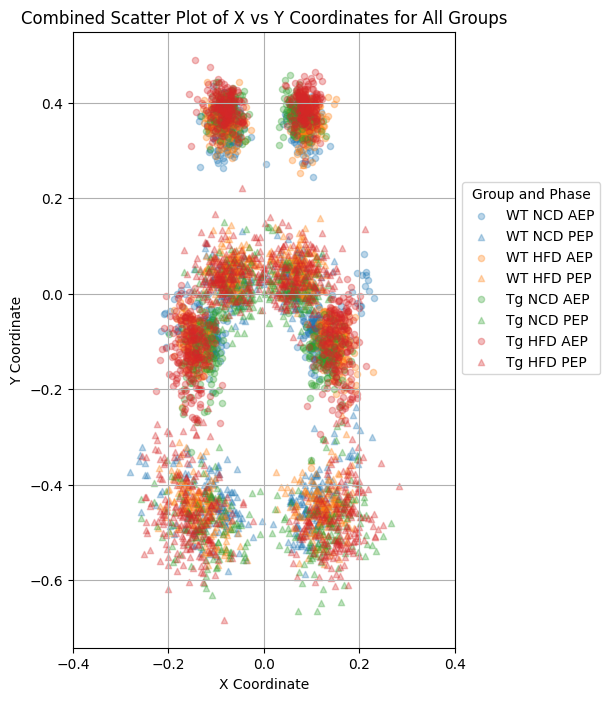

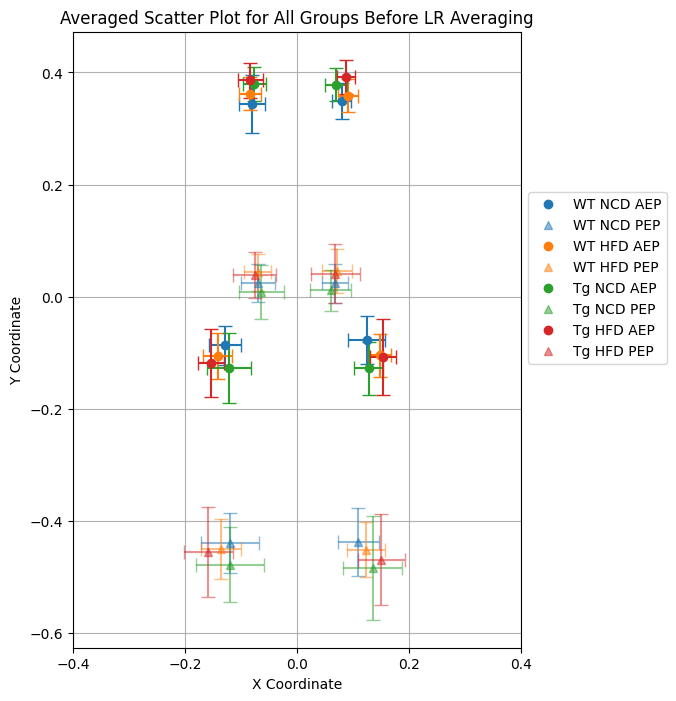

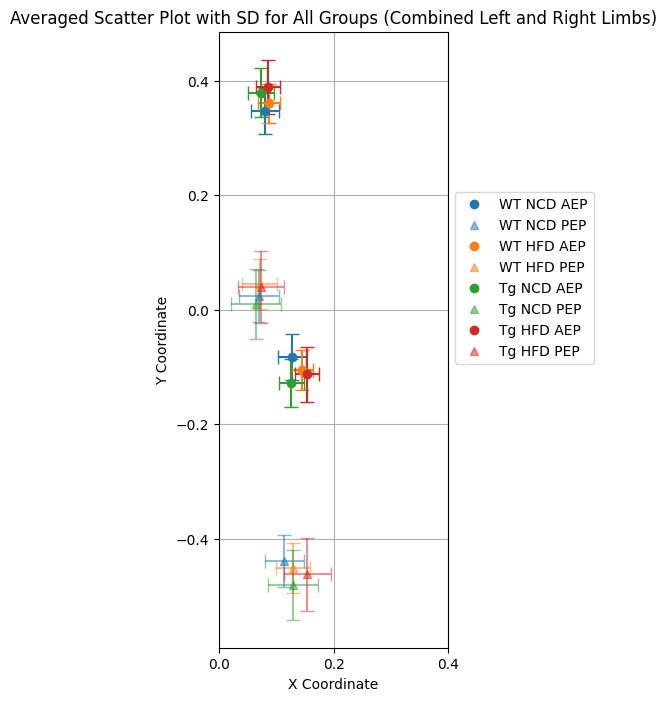

In [32]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def process_and_plot_data(input_folder, output_folder):
    all_groups_data = []  # To store all groups' data for a combined plot
    
    # Loop through each file in the directory
    for filename in os.listdir(input_folder):
        if filename.endswith(".xlsx"):
            filepath = os.path.join(input_folder, filename)
            # Extract group name from filename
            parts = filename.split('_')
            if len(parts) >= 4:
                group_name = ' '.join(parts[0:2])  # Get both genotype and diet as group name
            else:
                continue

            # Load the Excel file
            df = pd.read_excel(filepath)

            # Convert all columns to numeric, forcing errors to NaN
            df = df.apply(pd.to_numeric, errors='coerce')

            # Define the pairs of columns for plotting
            limbs = ['LF', 'RF', 'LH', 'RH']
            phases = ['AEP', 'PEP']

            plt.figure(figsize=(10, 10))

            # Plot scatter plots for each combination of limb and phase
            for limb in limbs:
                for phase in phases:
                    left_x = f"{limb} {phase}(x)"
                    left_y = f"{limb} {phase}(y)"

                    if left_x in df.columns and left_y in df.columns:
                        # Clean the data by removing rows with any non-numeric values
                        df_cleaned = df[[left_x, left_y]].dropna()

                        # Plot the cleaned data
                        if not df_cleaned.empty:
                            marker = 'o' if phase == 'AEP' else '^'  # Dots for AEP, triangles for PEP
                            plt.scatter(df_cleaned[left_x], df_cleaned[left_y], label=f'{group_name} {phase}', alpha=0.3, marker=marker)

                        # Append cleaned data with group information for combined plot
                        df_cleaned['Group'] = group_name
                        df_cleaned['Phase'] = phase
                        df_cleaned['Limb'] = limb
                        df_cleaned.columns = ['X', 'Y', 'Group', 'Phase', 'Limb']  # Standardize column names for concatenation
                        all_groups_data.append(df_cleaned)

            plt.xlabel('X Coordinate')
            plt.ylabel('Y Coordinate')
            plt.title(f'Scatter Plot of X vs Y Coordinates for Group: {group_name}')
            plt.legend()
            plt.grid(True)
            plt.savefig(os.path.join(output_folder, f'{group_name}_scatter_plot.png'))
            plt.close()  # Close the plot to ensure all figures are saved

    # Create a combined plot for all groups
    if all_groups_data:
        combined_df = pd.concat(all_groups_data, ignore_index=True)
        plt.figure(figsize=(8, 8))
        plt.gca().set_aspect('equal', adjustable='box')  # Ensure the plot is squared
        # Predefined colors for specific groups
        palette = sns.color_palette("tab10")
        color_map = {
            'WT NCD': palette[0],
            'WT HFD': palette[1],
            'Tg NCD': palette[2],
            'Tg HFD': palette[3]
        }
        
        # Plot AEP points as circles and PEP points as triangles for each group, ensuring the same color for each group
        order = ['WT NCD', 'WT HFD', 'Tg NCD', 'Tg HFD']
        for group in order:
            if group in combined_df['Group'].unique():
                group_data = combined_df[combined_df['Group'] == group]
                color = color_map.get(group, 'black')  # Use predefined color, default to black if not found
                plt.scatter(group_data[group_data['Phase'] == 'AEP']['X'],
                            group_data[group_data['Phase'] == 'AEP']['Y'],
                            label=f'{group} AEP', alpha=0.3, s=20, marker='o', color=color)
                plt.scatter(group_data[group_data['Phase'] == 'PEP']['X'],
                            group_data[group_data['Phase'] == 'PEP']['Y'],
                            label=f'{group} PEP', alpha=0.3, s=20, marker='^', color=color)

        plt.xlabel('X Coordinate')
        plt.ylabel('Y Coordinate')
        plt.title('Combined Scatter Plot of X vs Y Coordinates for All Groups')
        plt.legend(title='Group and Phase', loc='center left', bbox_to_anchor=(1, 0.6))
        plt.grid(True)
        plt.xlim(-0.4, 0.4)
        plt.xticks(ticks=[-0.4, -0.2, 0, 0.2, 0.4])
        plt.savefig(os.path.join(output_folder, 'combined_scatter_plot.png'))
        plt.show()

        # Create an averaged plot for all groups before LR averaging
        plt.figure(figsize=(8, 8))
        plt.gca().set_aspect('equal', adjustable='box')  # Ensure the plot is squared
        handles = []  # To store legend handles
        labels = []  # To store legend labels
        for group in order:
            if group in combined_df['Group'].unique():
                group_data = combined_df[combined_df['Group'] == group]
                color = color_map.get(group, 'black')  # Use predefined color, default to black if not found
                
                for phase in ['AEP', 'PEP']:
                    phase_data = group_data[group_data['Phase'] == phase]
                    numeric_phase_data = phase_data[['X', 'Y', 'Limb']].dropna()
                    if not numeric_phase_data.empty:
                        mean_values = numeric_phase_data.groupby('Limb').mean(numeric_only=True)
                        std_values = numeric_phase_data.groupby('Limb').std()
                        plt.errorbar(mean_values['X'], mean_values['Y'],
                                     xerr=std_values['X'] if not std_values.empty else None,
                                     yerr=std_values['Y'] if not std_values.empty else None,
                                     fmt='o' if phase == 'AEP' else '^', color=color,
                                     alpha=1 if phase == 'AEP' else 0.5, capsize=5)
                        handles.append(plt.Line2D([], [], color=color, marker='o' if phase == 'AEP' else '^', linestyle='None', alpha=1 if phase == 'AEP' else 0.5))
                        labels.append(f'{group} {phase}')

        plt.xlabel('X Coordinate')
        plt.ylabel('Y Coordinate')
        plt.title('Averaged Scatter Plot for All Groups Before LR Averaging')
        if handles:
            plt.legend(handles=handles, labels=labels, loc='center left', bbox_to_anchor=(1, 0.6))
        plt.grid(True)
        plt.xlim(-0.4, 0.4)
        plt.xticks(ticks=[-0.4, -0.2, 0, 0.2, 0.4])
        plt.savefig(os.path.join(output_folder, 'averaged_scatter_plot_before_LR.png'))
        plt.show()

        # Create an averaged plot for all groups with SD, separating left and right limbs
        plt.figure(figsize=(8, 8))
        plt.gca().set_aspect('equal', adjustable='box')  # Ensure the plot is squared
        combined_df['X'] = pd.to_numeric(combined_df['X'], errors='coerce').abs()  # Take absolute value of X coordinates
        combined_df['Y'] = pd.to_numeric(combined_df['Y'], errors='coerce')  # Ensure Y is numeric
        handles = []  # To store legend handles
        labels = []  # To store legend labels
        for group in order:
            if group in combined_df['Group'].unique():
                group_data = combined_df[combined_df['Group'] == group]
                color = color_map.get(group, 'black')  # Use predefined color, default to black if not found
                
                for phase in ['AEP', 'PEP']:
                    phase_data = group_data[group_data['Phase'] == phase]
                    numeric_phase_data = phase_data[['X', 'Y', 'Limb']].dropna()
                    if not numeric_phase_data.empty:
                        mean_values = numeric_phase_data.groupby('Limb').mean(numeric_only=True)
                        if 'LF' in mean_values.index and 'RF' in mean_values.index:
                            lf_rf_mean = mean_values.loc[['LF', 'RF']].mean()
                        else:
                            lf_rf_mean = pd.Series({'X': None, 'Y': None})
                        if 'LH' in mean_values.index and 'RH' in mean_values.index:
                            lh_rh_mean = mean_values.loc[['LH', 'RH']].mean()
                        else:
                            lh_rh_mean = pd.Series({'X': None, 'Y': None})
                        mean_values = pd.DataFrame([lf_rf_mean, lh_rh_mean], index=['LF-RF', 'LH-RH'])
                        std_values = numeric_phase_data.groupby('Limb').std()
                        if not mean_values.empty and not mean_values.isna().all().all():
                            plt.errorbar(mean_values['X'], mean_values['Y'],
                                         xerr=std_values.loc[['LF', 'RF', 'LH', 'RH']].mean()['X'] if not std_values.empty else None,
                                         yerr=std_values.loc[['LF', 'RF', 'LH', 'RH']].mean()['Y'] if not std_values.empty else None,
                                         fmt='o' if phase == 'AEP' else '^', color=color,
                                         alpha=1 if phase == 'AEP' else 0.5, capsize=5)
                            handles.append(plt.Line2D([], [], color=color, marker='o' if phase == 'AEP' else '^', linestyle='None', alpha=1 if phase == 'AEP' else 0.5))
                            labels.append(f'{group} {phase}')
                        else:
                            print(f"No valid mean values for group {group}, phase {phase}. Skipping plot.")
                    else:
                        print(f"No valid numeric data for group {group}, phase {phase}. Skipping.")

        plt.xlabel('X Coordinate')
        plt.ylabel('Y Coordinate')
        plt.title('Averaged Scatter Plot with SD for All Groups (Combined Left and Right Limbs)')
        if handles:
            plt.legend(handles=handles, labels=labels, loc='center left', bbox_to_anchor=(1, 0.6))
        else:
            print("No data available for averaged plot. Skipping legend.")
        plt.grid(True)
        plt.xlim(0, 0.4)
        plt.xticks(ticks=[0, 0.2, 0.4])
        plt.savefig(os.path.join(output_folder, 'averaged_scatter_plot.png'))
        plt.show()

# Example usage
input_folder = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Footprint Clustering'  
output_folder = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Footprint Clustering'

process_and_plot_data(input_folder, output_folder)


In [423]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from zipfile import BadZipFile


def analyze_and_plot_data(input_folder_path, sheet_name):
    # Iterate over all files in the input folder
    for file_name in os.listdir(input_folder_path):
        if file_name.endswith('.xlsx'):
            input_excel_path = os.path.join(input_folder_path, file_name)
            
            try:
                # Load the data from the Excel file
                data = pd.read_excel(input_excel_path, sheet_name=sheet_name, engine='openpyxl')
            except (BadZipFile, ValueError) as e:
                print(f"Error reading file {file_name}: {e}")
                continue

            # Normalize orientation based on movement direction
            if data['Body X'].iloc[-1] < data['Body X'].iloc[0]:
                data['Body X'] = -data['Body X']
                data['LF X'] = -data['LF X']
                data['LH X'] = -data['LH X']
                data['RF X'] = -data['RF X']
                data['RH X'] = -data['RH X']

            # Function to calculate parallel and perpendicular distances relative to the body center
            def calculate_parallel_perpendicular_with_nan(body_x, body_y, paw_x, paw_y):
                parallel_dist = paw_y - body_y  # Corrected: parallel distance is along the y-axis, ensuring hind paws are negative
                perpendicular_dist = paw_x - body_x  # Corrected: perpendicular distance is along the x-axis
                parallel_dist[(paw_x == -1) | (paw_y == -1)] = np.nan
                perpendicular_dist[(paw_x == -1) | (paw_y == -1)] = np.nan
                return parallel_dist, perpendicular_dist

            # Calculating parallel and perpendicular distances for each paw
            lf_para, lf_perp = calculate_parallel_perpendicular_with_nan(data['Body X'], data['Body Y'], data['LF X'], data['LF Y'])
            lh_para, lh_perp = calculate_parallel_perpendicular_with_nan(data['Body X'], data['Body Y'], data['LH X'], data['LH Y'])
            rf_para, rf_perp = calculate_parallel_perpendicular_with_nan(data['Body X'], data['Body Y'], data['RF X'], data['RF Y'])
            rh_para, rh_perp = calculate_parallel_perpendicular_with_nan(data['Body X'], data['Body Y'], data['RH X'], data['RH Y'])

            # Adding parallel and perpendicular distances to the DataFrame
            data['LF_Para'] = lf_para
            data['LF_Perp'] = lf_perp
            data['LH_Para'] = lh_para
            data['LH_Perp'] = lh_perp
            data['RF_Para'] = rf_para
            data['RF_Perp'] = rf_perp
            data['RH_Para'] = rh_para
            data['RH_Perp'] = rh_perp

            # Creating frame index for each paw, using a new approach to properly identify strides
            lf_indices, lh_indices, rf_indices, rh_indices = [], [], [], []
            lf_counter, lh_counter, rf_counter, rh_counter = 0, 0, 0, 0

            for i in range(len(data)):
                # LF Frame Index
                if data['LF X'][i] == -1 or data['LF Y'][i] == -1:
                    lf_indices.append(pd.NA)
                    if lf_counter > 0:
                        lf_counter = 0  # Resetting counter at the end of a stride
                else:
                    if lf_counter == 0:  # Start of a new stride
                        lf_counter = 1
                    else:
                        lf_counter += 1
                    lf_indices.append(lf_counter)
                
                # LH Frame Index
                if data['LH X'][i] == -1 or data['LH Y'][i] == -1:
                    lh_indices.append(pd.NA)
                    if lh_counter > 0:
                        lh_counter = 0  # Resetting counter at the end of a stride
                else:
                    if lh_counter == 0:  # Start of a new stride
                        lh_counter = 1
                    else:
                        lh_counter += 1
                    lh_indices.append(lh_counter)
                
                # RF Frame Index
                if data['RF X'][i] == -1 or data['RF Y'][i] == -1:
                    rf_indices.append(pd.NA)
                    if rf_counter > 0:
                        rf_counter = 0  # Resetting counter at the end of a stride
                else:
                    if rf_counter == 0:  # Start of a new stride
                        rf_counter = 1
                    else:
                        rf_counter += 1
                    rf_indices.append(rf_counter)
                
                # RH Frame Index
                if data['RH X'][i] == -1 or data['RH Y'][i] == -1:
                    rh_indices.append(pd.NA)
                    if rh_counter > 0:
                        rh_counter = 0  # Resetting counter at the end of a stride
                else:
                    if rh_counter == 0:  # Start of a new stride
                        rh_counter = 1
                    else:
                        rh_counter += 1
                    rh_indices.append(rh_counter)

            # Adding frame indices to the DataFrame
            data['LF_Frame'] = lf_indices
            data['LH_Frame'] = lh_indices
            data['RF_Frame'] = rf_indices
            data['RH_Frame'] = rh_indices

            # Replace NaN values in frame indices with 0
            data['LF_Frame'] = data['LF_Frame'].fillna(0)
            data['LH_Frame'] = data['LH_Frame'].fillna(0)
            data['RF_Frame'] = data['RF_Frame'].fillna(0)
            data['RH_Frame'] = data['RH_Frame'].fillna(0)

            # Save the DataFrame with all original data including frame index numbering to an Excel file
            file_suffix = os.path.splitext(file_name)[0]
            frame_index_output_path = f'/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/Footprint clustering/Frame_Index_Numbering_{file_suffix}.xlsx'
            data.to_excel(frame_index_output_path, index=False, sheet_name='All_Data_with_Frame_Indices')

            # Calculating mean and median trajectories for each frame across all strides for each paw
            lf_para_mean = data.groupby('LF_Frame')['LF_Para'].mean()
            lf_perp_mean = data.groupby('LF_Frame')['LF_Perp'].mean()
            lf_para_median = data.groupby('LF_Frame')['LF_Para'].median()
            lf_perp_median = data.groupby('LF_Frame')['LF_Perp'].median()

            lh_para_mean = data.groupby('LH_Frame')['LH_Para'].mean()
            lh_perp_mean = data.groupby('LH_Frame')['LH_Perp'].mean()
            lh_para_median = data.groupby('LH_Frame')['LH_Para'].median()
            lh_perp_median = data.groupby('LH_Frame')['LH_Perp'].median()

            rf_para_mean = data.groupby('RF_Frame')['RF_Para'].mean()
            rf_perp_mean = data.groupby('RF_Frame')['RF_Perp'].mean()
            rf_para_median = data.groupby('RF_Frame')['RF_Para'].median()
            rf_perp_median = data.groupby('RF_Frame')['RF_Perp'].median()

            rh_para_mean = data.groupby('RH_Frame')['RH_Para'].mean()
            rh_perp_mean = data.groupby('RH_Frame')['RH_Perp'].mean()
            rh_para_median = data.groupby('RH_Frame')['RH_Para'].median()
            rh_perp_median = data.groupby('RH_Frame')['RH_Perp'].median()

            # Creating a new DataFrame to store the calculated mean and median trajectories
            mean_median_df = pd.DataFrame({
                'Frame': range(1, int(max(data['LF_Frame'].max(), data['LH_Frame'].max(), data['RF_Frame'].max(), data['RH_Frame'].max())) + 1),
                'LF_Para_Mean': lf_para_mean.reindex(range(1, int(lf_para_mean.index.max() + 1))),
                'LF_Perp_Mean': lf_perp_mean.reindex(range(1, int(lf_perp_mean.index.max() + 1))),
                'LF_Para_Median': lf_para_median.reindex(range(1, int(lf_para_median.index.max() + 1))),
                'LF_Perp_Median': lf_perp_median.reindex(range(1, int(lf_perp_median.index.max() + 1))),
                'LH_Para_Mean': lh_para_mean.reindex(range(1, int(lh_para_mean.index.max() + 1))),
                'LH_Perp_Mean': lh_perp_mean.reindex(range(1, int(lh_perp_mean.index.max() + 1))),
                'LH_Para_Median': lh_para_median.reindex(range(1, int(lh_para_median.index.max() + 1))),
                'LH_Perp_Median': lh_perp_median.reindex(range(1, int(lh_perp_median.index.max() + 1))),
                'RF_Para_Mean': rf_para_mean.reindex(range(1, int(rf_para_mean.index.max() + 1))),
                'RF_Perp_Mean': rf_perp_mean.reindex(range(1, int(rf_perp_mean.index.max() + 1))),
                'RF_Para_Median': rf_para_median.reindex(range(1, int(rf_para_median.index.max() + 1))),
                'RF_Perp_Median': rf_perp_median.reindex(range(1, int(rf_perp_median.index.max() + 1))),
                'RH_Para_Mean': rh_para_mean.reindex(range(1, int(rh_para_mean.index.max() + 1))),
                'RH_Perp_Mean': rh_perp_mean.reindex(range(1, int(rh_perp_mean.index.max() + 1))),
                'RH_Para_Median': rh_para_median.reindex(range(1, int(rh_para_median.index.max() + 1))),
                'RH_Perp_Median': rh_perp_median.reindex(range(1, int(rh_perp_median.index.max() + 1))),
            })

            # Save the calculated mean and median trajectories into an Excel file
            mean_median_output_path = f'/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/Footprint clustering/Sequential_Mean_and_Median_Trajectories_{file_suffix}.xlsx'
            with pd.ExcelWriter(mean_median_output_path) as writer:
                mean_median_df.to_excel(writer, index=False, sheet_name='Mean_Median_Trajectories')

            # Plotting the sequential mean and median trajectories for each paw using the data
            plt.figure(figsize=(14, 10))

            # Plotting mean trajectories for each paw
            plt.plot(mean_median_df['LF_Perp_Mean'], mean_median_df['LF_Para_Mean'], color='orange', linewidth=2.5, label='LF Mean Trace', marker='o', markersize=6)
            plt.plot(mean_median_df['RF_Perp_Mean'], mean_median_df['RF_Para_Mean'], color='blue', linewidth=2.5, label='RF Mean Trace', marker='o', markersize=6)
            plt.plot(mean_median_df['LH_Perp_Mean'], mean_median_df['LH_Para_Mean'], color='green', linestyle='--', linewidth=2.5, label='LH Mean Trace', marker='o', markersize=6)
            plt.plot(mean_median_df['RH_Perp_Mean'], mean_median_df['RH_Para_Mean'], color='red', linestyle='--', linewidth=2.5, label='RH Mean Trace', marker='o', markersize=6)

            # Plotting median trajectories for each paw
            plt.plot(mean_median_df['LF_Perp_Median'], mean_median_df['LF_Para_Median'], color='orange', linestyle=':', linewidth=2.5, label='LF Median Trace', marker='x', markersize=6)
            plt.plot(mean_median_df['RF_Perp_Median'], mean_median_df['RF_Para_Median'], color='blue', linestyle=':', linewidth=2.5, label='RF Median Trace', marker='x', markersize=6)
            plt.plot(mean_median_df['LH_Perp_Median'], mean_median_df['LH_Para_Median'], color='green', linestyle=':', linewidth=2.5, label='LH Median Trace', marker='x', markersize=6)
            plt.plot(mean_median_df['RH_Perp_Median'], mean_median_df['RH_Para_Median'], color='red', linestyle=':', linewidth=2.5, label='RH Median Trace', marker='x', markersize=6)

            # Adding labels, legend, and formatting
            plt.xlabel('Perpendicular distance from body center (units)')
            plt.ylabel('Parallel distance from body center (units)')
            plt.axhline(0, color='gray', linestyle='--', alpha=0.5)
            plt.axvline(0, color='gray', linestyle='--', alpha=0.5)
            plt.title('Sequential Mean and Median Paw Trajectories Across All Stance Phases')
            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            plt.axis('equal')  # Setting equal aspect ratio for x and y axes
            plt.grid(True)

            # Show the plot
            plt.savefig(f'/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/Footprint clustering/Plot_{file_suffix}.png')
            plt.close()

            # File paths
            print(f"Excel file saved at: {mean_median_output_path}")
            print(f"Frame index file saved at: {frame_index_output_path}")

# File paths
input_folder_path = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/Footprint clustering/MW tracking/'
sheet_name = '10.All Data'

# Run the function
analyze_and_plot_data(input_folder_path, sheet_name)


Excel file saved at: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/Footprint clustering/Sequential_Mean_and_Median_Trajectories_49_Tg_HFD_Run2.xlsx
Frame index file saved at: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/Footprint clustering/Frame_Index_Numbering_49_Tg_HFD_Run2.xlsx
Excel file saved at: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/Footprint clustering/Sequential_Mean_and_Median_Trajectories_6_WT_NCD_Run1.xlsx
Frame index file saved at: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/Footprint clustering/Frame_Index_Numbering_6_WT_NCD_Run1.xlsx
Excel file saved at: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/Footprint clustering/Sequential_Mean_and_Median_Trajectories_45_Tg_HFD_Run1.xlsx
Frame index file saved at: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/Footprint clustering/Frame_

<h1 style="color: #01FFFF;">Classification/Custering Machine Learning models</h1>

## Principal Component Analysis

Initial data shape: (113, 77)
Data shape after dropping rows with any NaN values: (113, 77)


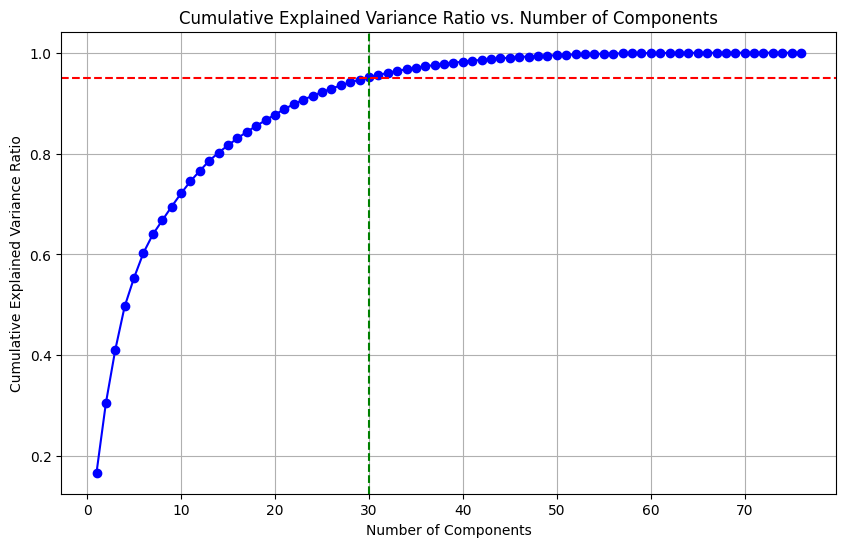

Selected number of components: 30


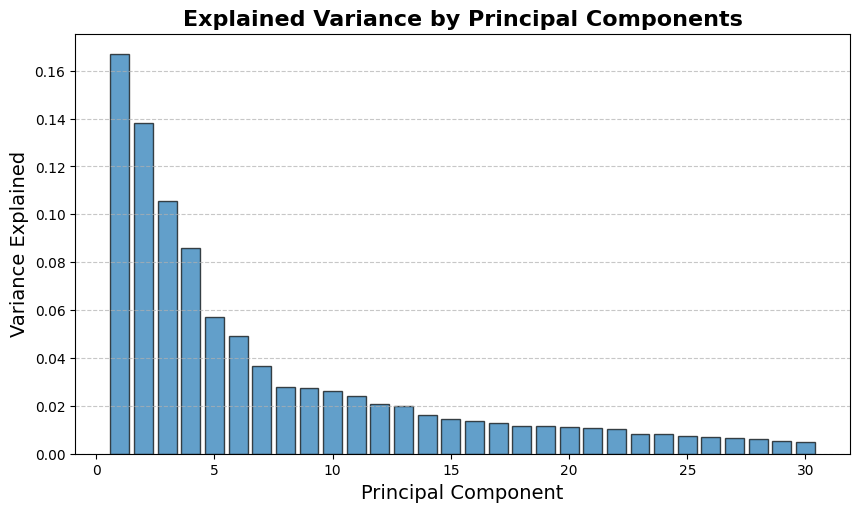

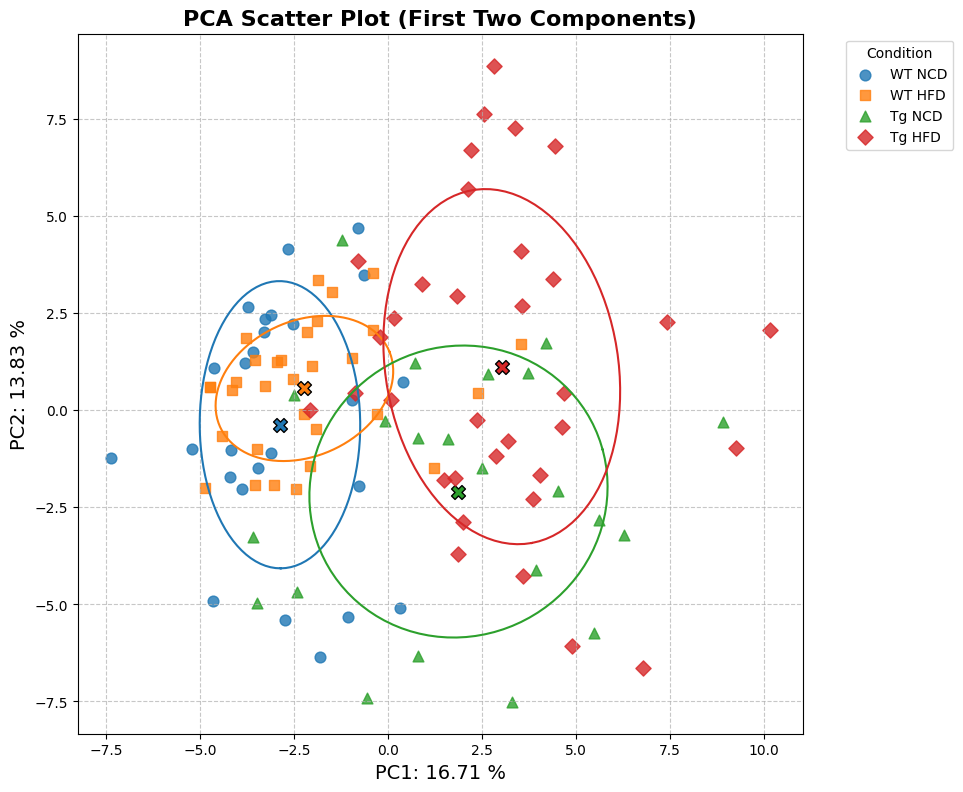

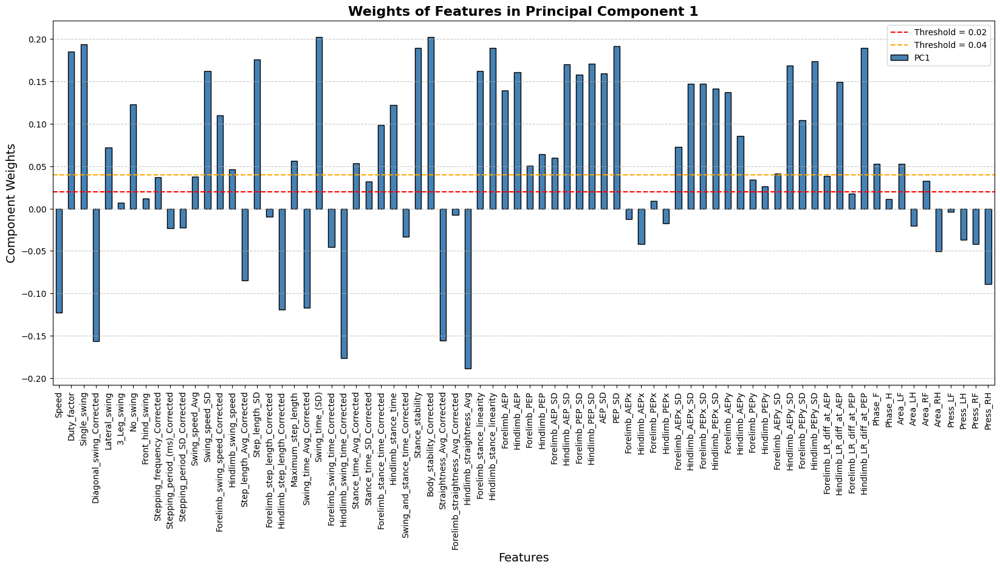

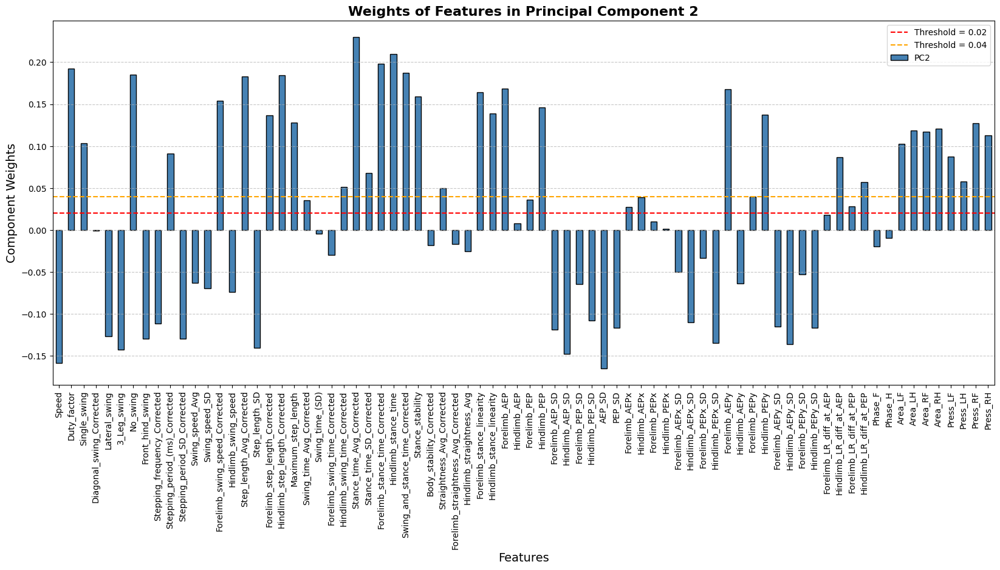

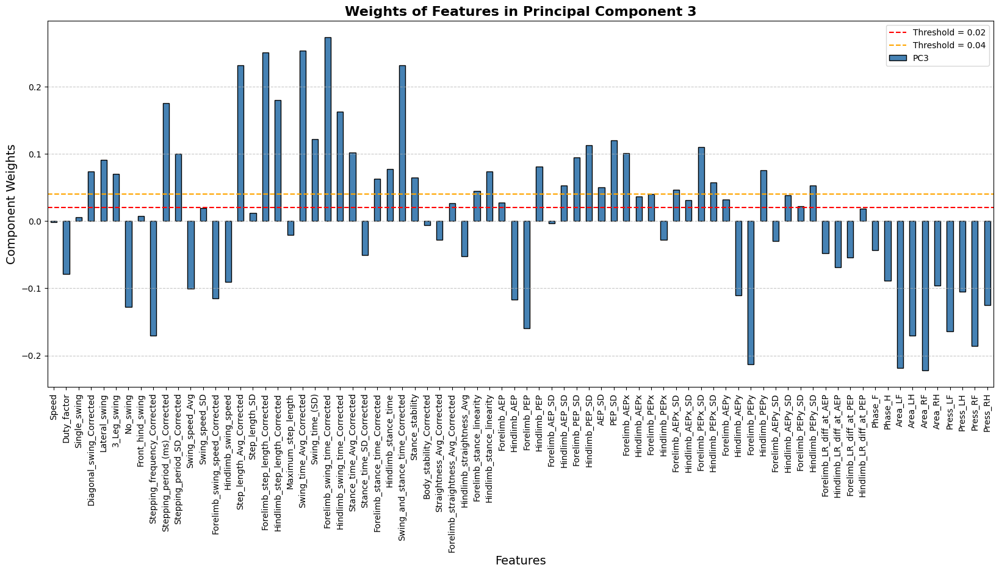

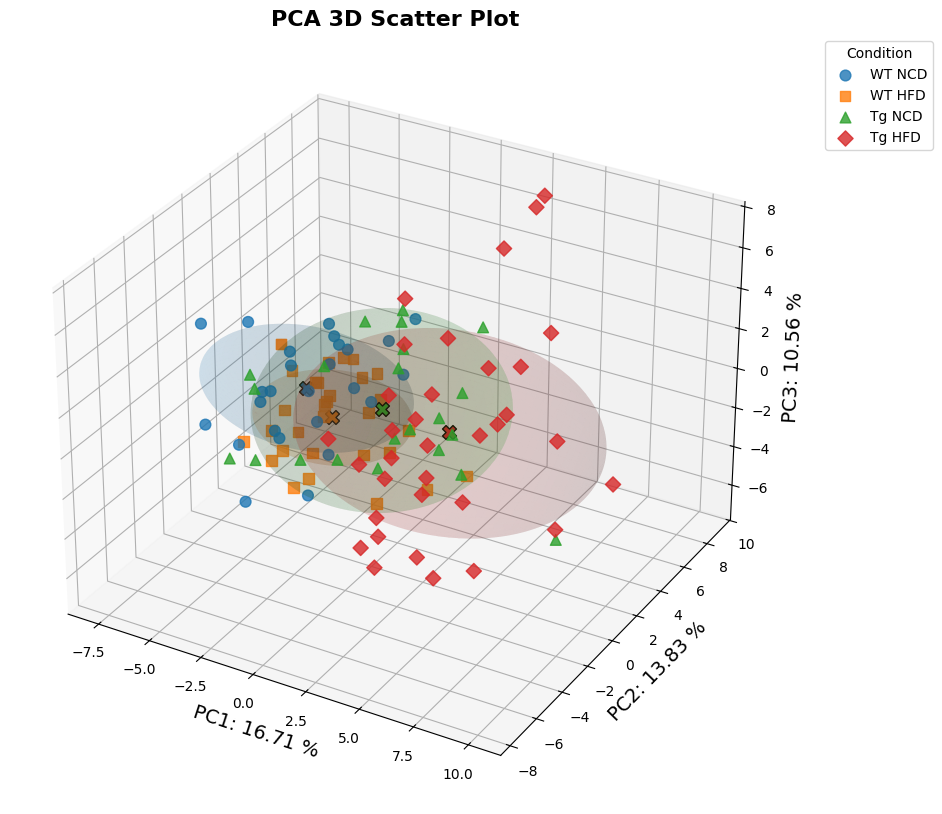

Two-Way ANOVA Results for PC1:
                          sum_sq     df           F        PR(>F)       p-value
C(Diet)               21.972261    1.0    3.533528  6.280989e-02  6.280989e-02
C(Genotype)          714.266521    1.0  114.866697  9.745569e-19  9.745569e-19
C(Diet):C(Genotype)    1.727060    1.0    0.277742  5.992561e-01  5.992561e-01
Residual             677.786101  109.0         NaN           NaN           NaN
Two-Way ANOVA Results for PC2:
                           sum_sq     df          F    PR(>F)   p-value
C(Diet)               114.778266    1.0  12.090312  0.000729  0.000729
C(Genotype)             4.616704    1.0   0.486306  0.487064  0.487064
C(Diet):C(Genotype)    35.806280    1.0   3.771699  0.054707  0.054707
Residual             1034.781473  109.0        NaN       NaN       NaN
Two-Way ANOVA Results for PC3:
                          sum_sq     df          F    PR(>F)   p-value
C(Diet)              133.227163    1.0  19.248635  0.000027  0.000027
C(Genotype)   

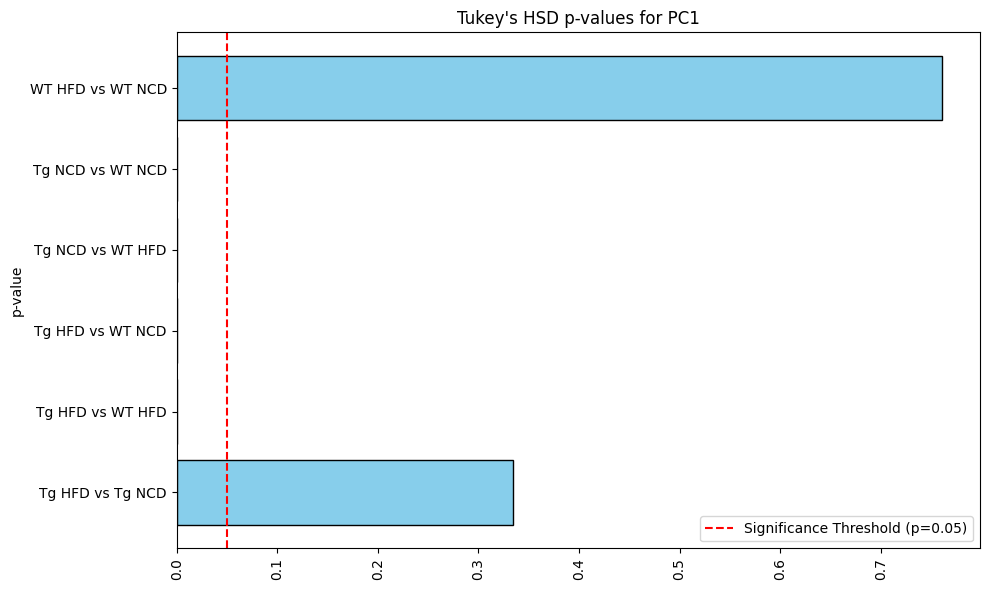

Tukey's HSD p-value plot saved for PC1 at: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/PCA/CAR/Decision 4/tukey_pvalues_PC1.png


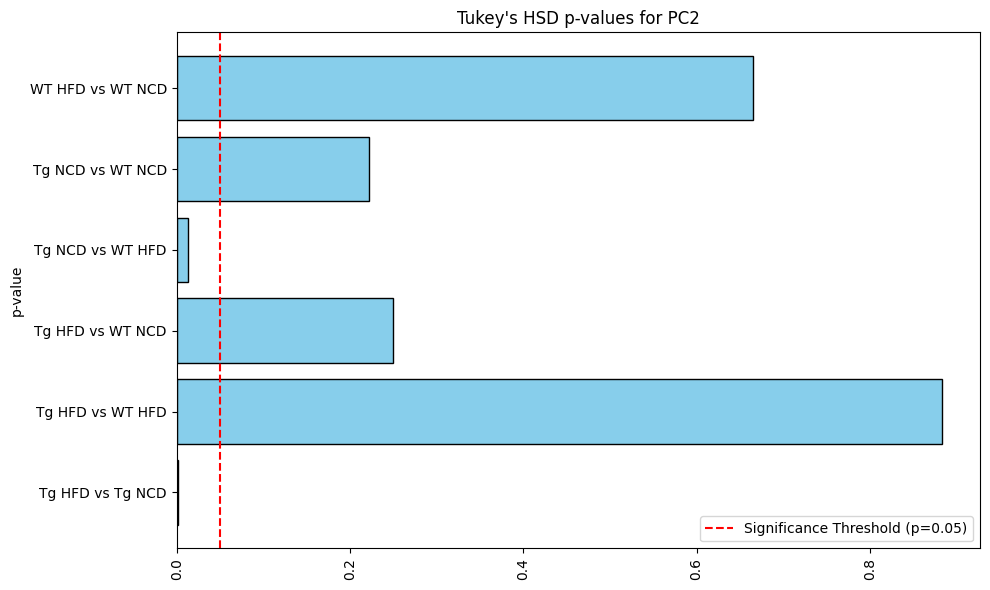

Tukey's HSD p-value plot saved for PC2 at: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/PCA/CAR/Decision 4/tukey_pvalues_PC2.png


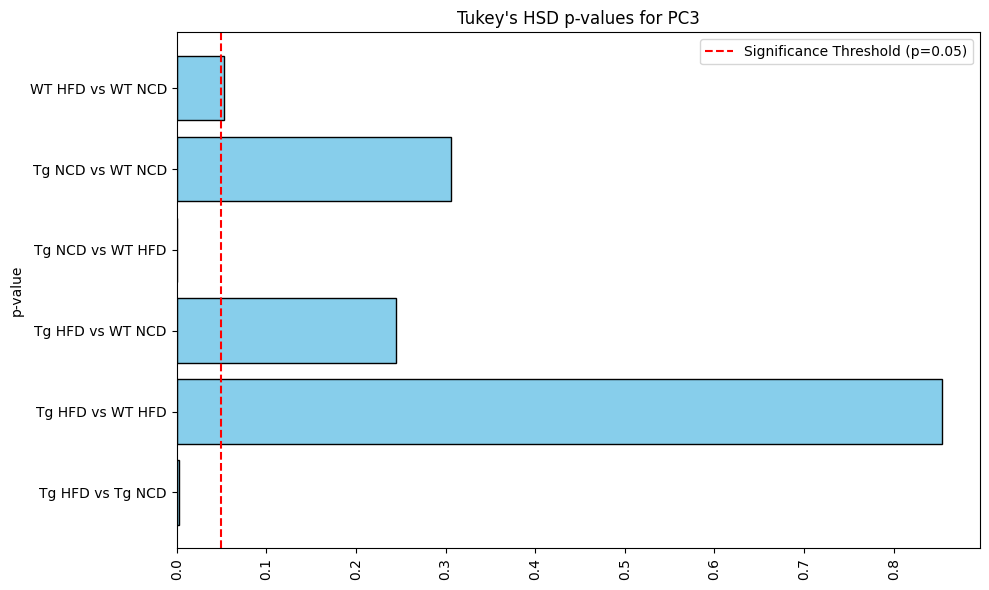

Tukey's HSD p-value plot saved for PC3 at: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/PCA/CAR/Decision 4/tukey_pvalues_PC3.png


(          PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
 0   -1.811695 -6.346568 -1.234636 -2.535816 -1.130040 -1.103697  4.771180   
 1   -2.732262 -5.389223  0.720694 -1.214122  1.033122 -2.115264  2.320259   
 2   -3.104034 -1.094039  2.071517  0.504167  1.527129 -3.301998  0.704462   
 3   -0.777619 -1.942763 -1.183927 -4.131763 -2.724784  2.865776  1.388417   
 4   -4.195521 -1.720463  0.285229 -0.427110  0.353027 -1.862459 -0.916860   
 ..        ...       ...       ...       ...       ...       ...       ...   
 108  2.825399  8.880541  6.827447 -1.972681 -1.255817 -0.040034 -1.420251   
 109  4.440964  6.807125  1.536765 -5.376222  2.546021  1.533403  0.745118   
 110  2.356576 -0.244166 -6.415569  1.423451  4.235071  0.508238 -0.769335   
 111  0.079111  0.258544 -5.427140  0.576479  3.517107 -0.018189 -2.700182   
 112  1.987232 -2.876628 -5.430421  2.371070  0.937197 -1.057961 -2.182096   
 
           PC8       PC9      PC10  ...      PC24      PC25   

In [35]:
import pandas as pd
import numpy as np
import random
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import os
from scipy.stats import chi2
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from kneed import KneeLocator

def pca_analysis(input_file, output_dir):
    # Set random seed for reproducibility
    random.seed(42)
    np.random.seed(42)

    # Step 1: Load the data
    df = pd.read_excel(input_file)
    print("Initial data shape:", df.shape)

    # Step 2: Drop rows with any NaN values
    df_no_nan = df.dropna().copy(deep=True)
    print("Data shape after dropping rows with any NaN values:", df_no_nan.shape)

    # Extract features and group names
    features = df_no_nan.drop(columns=['Condition'])
    group_names = df_no_nan['Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]))
    df_no_nan = df_no_nan.assign(Diet=df_no_nan['Condition'].apply(lambda x: x.split('_')[2]))
    df_no_nan = df_no_nan.assign(Genotype=df_no_nan['Condition'].apply(lambda x: x.split('_')[1]))
    
    # Standardize the feature data
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)

    # Step 3: Determine optimal number of components
    max_components = min(features_scaled.shape[0], features_scaled.shape[1])
    pca_full = PCA(n_components=max_components)
    pca_full.fit(features_scaled)

    # Calculate cumulative variance ratio
    cumulative_variance_ratio = np.cumsum(pca_full.explained_variance_ratio_)
    n_components_95 = np.argmax(cumulative_variance_ratio >= 0.95) + 1

    # Create scree plot with elbow detection
    plt.figure(figsize=(12, 6))
    
    # Plot eigenvalues
    eigenvalues = pca_full.explained_variance_
    components = range(1, len(eigenvalues) + 1)
    
    plt.plot(components, eigenvalues, 'bo-', linewidth=2)
    plt.xlabel('Principal Component', fontsize=14)
    plt.ylabel('Eigenvalue', fontsize=14)
    plt.title('Scree Plot with Elbow Point', fontsize=16, fontweight='bold')
    
    # Find elbow point using KneeLocator
    kn = KneeLocator(components, eigenvalues, curve='convex', direction='decreasing')
    if kn.elbow is not None:
        plt.axvline(x=kn.elbow, color='r', linestyle='--', label=f'Elbow point: {kn.elbow}')
        plt.plot(kn.elbow, eigenvalues[kn.elbow-1], 'ro')
    
    # Add 95% variance threshold
    plt.axvline(x=n_components_95, color='g', linestyle='--', 
                label=f'95% variance threshold: {n_components_95}')
    
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    scree_plot_path = os.path.join(output_dir, 'scree_plot.png')
    plt.savefig(scree_plot_path)
    plt.close()

        # Create cumulative variance plot
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(pca_full.explained_variance_ratio_) + 1), 
            np.cumsum(pca_full.explained_variance_ratio_), 'bo-')
    plt.axhline(y=0.95, color='r', linestyle='--')
    plt.axvline(x=n_components_95, color='g', linestyle='--')
    plt.title('Cumulative Explained Variance Ratio vs. Number of Components')
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance Ratio')
    plt.grid(True)
    cumulative_var_path = os.path.join(output_dir, 'cumulative_variance_plot.png')
    plt.savefig(cumulative_var_path)
    plt.show()

    # Use maximum of elbow point, 95% variance components, and minimum 3 components
    n_components = max(3, n_components_95)
    if kn.elbow is not None:
        n_components = max(n_components, kn.elbow)
    print(f"Selected number of components: {n_components}")

    # Step 4: Apply PCA with optimal components
    pca = PCA(n_components=n_components)
    principal_components = pca.fit_transform(features_scaled)

    # Step 5: Create a DataFrame with the principal components
    pca_columns = [f'PC{i+1}' for i in range(n_components)]
    pca_df = pd.DataFrame(data=principal_components, columns=pca_columns)
    pca_df['Condition'] = group_names.values
    pca_df['Diet'] = df_no_nan['Diet'].values
    pca_df['Genotype'] = df_no_nan['Genotype'].values

    # Step 6: Save PCA results
    pca_results_path = os.path.join(output_dir, 'pca_results.xlsx')
    pca_df.to_excel(pca_results_path, index=False)

    # Step 7: Plot the explained variance ratio
    plt.figure(figsize=(10, 6))
    plt.bar(range(1, n_components + 1), pca.explained_variance_ratio_, alpha=0.7, edgecolor='black')
    plt.xlabel('Principal Component', fontsize=14)
    plt.ylabel('Variance Explained', fontsize=14)
    plt.title('Explained Variance by Principal Components', fontsize=16, fontweight='bold')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.subplots_adjust(bottom=0.15, top=0.85)  # Adjust margins to prevent tight layout warning
    explained_variance_plot_path = os.path.join(output_dir, 'explained_variance_plot.png')
    plt.savefig(explained_variance_plot_path)
    plt.show()  # Show the plot in the notebook
    plt.close()

    # Step 8: Plot the PCA scatter plot (first two components) with hue by group and add centroids and ellipses
    if n_components >= 2:
        plt.figure(figsize=(10, 10))
        unique_groups = pca_df['Condition'].unique()
        palette = sns.color_palette('tab10', len(unique_groups))
        markers = ['o', 's', '^', 'D', 'P', '*']  # Different markers for each group
        for (group, color, marker) in zip(unique_groups, palette, markers):
            subset = pca_df[pca_df['Condition'] == group]
            plt.scatter(subset['PC1'], subset['PC2'], label=group, color=color, marker=marker, s=60, alpha=0.8)
            centroid = subset[['PC1', 'PC2']].mean()
            plt.scatter(centroid['PC1'], centroid['PC2'], color=color, marker='X', s=100, edgecolor='black')
            
            # Plot ellipses
            def draw_ellipse_group(data_points, centroid, ax, color, coverage=0.5):
                scale = np.sqrt(chi2.ppf(coverage, df=2))
                data_centered = data_points - centroid[None, :]
                data_cov = np.cov(data_centered.T)
                # Handle low variance cases by adding a small value to the diagonal
                if len(data_points) == 1 or np.any(np.isnan(data_cov)) or np.any(np.isinf(data_cov)):
                    data_cov = np.eye(data_points.shape[1]) * 1e-6
                eig_val, eig_vec = np.linalg.eig(data_cov)
                sorted_indices = np.argsort(eig_val)[::-1]
                eig_val_sorted = eig_val[sorted_indices]
                eig_vec_sorted = eig_vec[:, sorted_indices]

                t = np.linspace(0, 2 * np.pi, 100)
                ellipse = np.array([np.cos(t), np.sin(t)])
                vv = eig_vec_sorted * np.sqrt(eig_val_sorted) * scale
                ellipse_adj = vv @ ellipse + centroid[:, None]
                ax.plot(ellipse_adj[0, :], ellipse_adj[1, :], color=color)
            
            data_points = subset[['PC1', 'PC2']].values
            ax = plt.gca()
            draw_ellipse_group(data_points, centroid.values, ax, color)
        
        plt.xlabel(f'PC1: {pca.explained_variance_ratio_[0] * 100:.2f} %', fontsize=14)
        plt.ylabel(f'PC2: {pca.explained_variance_ratio_[1] * 100:.2f} %', fontsize=14)
        plt.title('PCA Scatter Plot (First Two Components)', fontsize=16, fontweight='bold')
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.legend(title='Condition', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.subplots_adjust(bottom=0.15, top=0.85, right=0.85)  # Adjust margins to prevent tight layout warning
        pca_scatter_plot_path = os.path.join(output_dir, 'pca_scatter_plot_with_centroids_ellipses.png')
        plt.savefig(pca_scatter_plot_path)
        plt.show()  # Show the plot in the notebook
        plt.close()

    # Step 9: Plot the weights of each parameter for each principal component
    # Restrict weight plots to PC1, PC2, PC3
    pca_weights = pd.DataFrame(pca.components_.T, index=features.columns, 
                               columns=[f'PC{i+1}' for i in range(n_components)])

    for col in pca_columns:
        pca_weights[f'{col}_Significant'] = pca_weights[col].abs() > 0.02
        pca_weights_path = os.path.join(output_dir, 'pca_component_weights.xlsx')
        pca_weights.to_excel(pca_weights_path)

    # Plot weights for PC1, PC2, PC3 only
    for i in range(min(3, n_components)):  # Only for PC1, PC2, and PC3
        plt.figure(figsize=(20, 10))
        pca_weights[f'PC{i+1}'].plot(kind='bar', color='steelblue', edgecolor='black')
        plt.axhline(y=0.02, color='red', linestyle='--', linewidth=1.5, label='Threshold = 0.02')
        plt.axhline(y=0.04, color='orange', linestyle='--', linewidth=1.5, label='Threshold = 0.04')
        plt.xlabel('Features', fontsize=14)
        plt.ylabel('Component Weights', fontsize=14)
        plt.title(f'Weights of Features in Principal Component {i+1}', fontsize=16, fontweight='bold')
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.legend()
        plt.subplots_adjust(bottom=0.25, top=0.85)
        component_weight_plot_path = os.path.join(output_dir, f'pca_component_{i+1}_weights_plot.png')
        plt.savefig(component_weight_plot_path)
        plt.show()

    # Add True/False column indicating if absolute weight is greater than 0.02
    for col in pca_columns:
        pca_weights[f'{col}_Significant'] = pca_weights[col].abs() > 0.02
    pca_weights_path = os.path.join(output_dir, 'pca_component_weights.xlsx')
    pca_weights.to_excel(pca_weights_path)

    # Step 10: Plot the PCA 3D scatter plot if there are 3 components
    if n_components >= 3:
        fig = plt.figure(figsize=(16, 10))
        ax = fig.add_subplot(111, projection='3d')
        unique_groups = pca_df['Condition'].unique()
        palette = sns.color_palette('tab10', len(unique_groups))
        markers = ['o', 's', '^', 'D', 'P', '*']  # Different markers for each group
        for (group, color, marker) in zip(unique_groups, palette, markers):
            subset = pca_df[pca_df['Condition'] == group]
            ax.scatter(subset['PC1'], subset['PC2'], subset['PC3'], label=group, color=color, marker=marker, s=60, alpha=0.8)
            centroid = subset[['PC1', 'PC2', 'PC3']].mean()
            ax.scatter(centroid['PC1'], centroid['PC2'], centroid['PC3'], color=color, marker='X', s=100, edgecolor='black')
            
            # Plot spheres (ellipses in 3D)
            def draw_sphere_group(data_points, centroid, ax, color, coverage=0.5):
                scale = np.sqrt(chi2.ppf(coverage, df=3))
                data_centered = data_points - centroid[None, :]
                data_cov = np.cov(data_centered.T)
                # Handle low variance cases by adding a small value to the diagonal
                if len(data_points) == 1 or np.any(np.isnan(data_cov)) or np.any(np.isinf(data_cov)):
                    data_cov = np.eye(data_points.shape[1]) * 1e-6
                eig_val, eig_vec = np.linalg.eig(data_cov)
                sorted_indices = np.argsort(eig_val)[::-1]
                eig_val_sorted = eig_val[sorted_indices]
                eig_vec_sorted = eig_vec[:, sorted_indices]

                # Generate points on a unit sphere
                u = np.linspace(0, 2 * np.pi, 100)
                v = np.linspace(0, np.pi, 100)
                x = np.outer(np.cos(u), np.sin(v))
                y = np.outer(np.sin(u), np.sin(v))
                z = np.outer(np.ones_like(u), np.cos(v))

                # Scale and rotate the sphere to match the covariance
                vv = eig_vec_sorted * np.sqrt(eig_val_sorted)[:, None] * scale
                xyz = np.dot(np.array([x.flatten(), y.flatten(), z.flatten()]).T, vv.T) + centroid
                x_ellipse, y_ellipse, z_ellipse = xyz[:, 0].reshape(x.shape), xyz[:, 1].reshape(y.shape), xyz[:, 2].reshape(z.shape)
                ax.plot_surface(x_ellipse, y_ellipse, z_ellipse, color=color, alpha=0.1, edgecolor='none')
            
            data_points = subset[['PC1', 'PC2', 'PC3']].values
            draw_sphere_group(data_points, centroid.values, ax, color)
        
        ax.set_xlabel(f'PC1: {pca.explained_variance_ratio_[0] * 100:.2f} %', fontsize=14)
        ax.set_ylabel(f'PC2: {pca.explained_variance_ratio_[1] * 100:.2f} %', fontsize=14)
        ax.set_zlabel(f'PC3: {pca.explained_variance_ratio_[2] * 100:.2f} %', fontsize=14)
        ax.set_title('PCA 3D Scatter Plot', fontsize=16, fontweight='bold')
        ax.grid(True)
        plt.legend(title='Condition', bbox_to_anchor=(1.05, 1), loc='upper left')
        pca_3d_scatter_plot_path = os.path.join(output_dir, 'pca_3d_scatter_plot.png')
        plt.savefig(pca_3d_scatter_plot_path)
        plt.show()  # Show the plot in the notebook
        plt.close()

    # Step 11: Perform Two-Way ANOVA on PC1, PC2, and PC3
    anova_results = {}
    for pc in ['PC1', 'PC2', 'PC3'][:min(3, n_components)]:  # Restrict to PC1, PC2, and PC3
        model = ols(f'{pc} ~ C(Diet) + C(Genotype) + C(Diet):C(Genotype)', data=pca_df).fit()
        anova_table = anova_lm(model, typ=2)
        anova_table['p-value'] = anova_table['PR(>F)']
        anova_results[pc] = anova_table
        print(f'Two-Way ANOVA Results for {pc}:\n', anova_table)
        
        # Save ANOVA results to Excel
        anova_path = os.path.join(output_dir, f'anova_results_{pc}.xlsx')
        anova_table.to_excel(anova_path, index=True)
    
    # Step 12: Perform Tukey's HSD post-hoc test for PC1, PC2, and PC3
    tukey_results = {}
    for pc in ['PC1', 'PC2', 'PC3'][:min(3, n_components)]:  # Restrict to PC1, PC2, and PC3
        tukey = pairwise_tukeyhsd(endog=pca_df[pc], groups=pca_df['Condition'], alpha=0.05)
        tukey_results[pc] = tukey
        print(f"Tukey's HSD post-hoc test for {pc}:\n", tukey.summary())
    
        # Save Tukey's HSD results to Excel
        tukey_df = pd.DataFrame(data=tukey.summary().data[1:], columns=tukey.summary().data[0])
        tukey_excel_path = os.path.join(output_dir, f'tukey_results_{pc}.xlsx')
        tukey_df.to_excel(tukey_excel_path, index=False)

    # Step 13: Generate p-value plots for Tukey's HSD results (PC1, PC2, and PC3)
    def plot_tukey_pvalues(tukey_df, title, output_file):
        # Extract comparison pairs and p-values
        comparisons = tukey_df['group1'] + ' vs ' + tukey_df['group2']
        p_values = tukey_df['p-adj']

        # Plot
        plt.figure(figsize=(10, 6))
        plt.barh(comparisons, p_values, color='skyblue', edgecolor='black')
        plt.axvline(0.05, color='red', linestyle='--', linewidth=1.5, label='Significance Threshold (p=0.05)')
        plt.xticks(rotation=90)
        plt.ylabel('p-value')
        plt.title(title)
        plt.legend()
        plt.tight_layout()

        # Save and display the plot
        plt.savefig(output_file)
        plt.show()
        plt.close()

    # Generate and save plots for PC1, PC2, and PC3
    for pc in ['PC1', 'PC2', 'PC3'][:min(3, n_components)]:
        tukey_df = tukey_results[pc].summary().data[1:]
        tukey_df = pd.DataFrame(tukey_df, columns=tukey_results[pc].summary().data[0])

        output_file = os.path.join(output_dir, f'tukey_pvalues_{pc}.png')
        plot_tukey_pvalues(tukey_df, f"Tukey's HSD p-values for {pc}", output_file)

        print(f"Tukey's HSD p-value plot saved for {pc} at: {output_file}")

    return pca_df, pca.explained_variance_ratio_, anova_results, tukey_results


# Example usage
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Statistical analysis/CAR Fold/Decision 4/CAR_fold_norm.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/PCA/CAR/Decision 4'
pca_analysis(input_file, output_dir)

<h3 style="color: #FF3333;">PCA-Based Parameter Contribution Analysis for Group Comparisons (to be completed)</h3>

Group: WT NCD, Threshold for meaningful contribution (75th percentile): 0.2833
Group: WT HFD, Threshold for meaningful contribution (75th percentile): 0.2994
Group: Tg NCD, Threshold for meaningful contribution (75th percentile): 0.2266
Group: Tg HFD, Threshold for meaningful contribution (75th percentile): 0.0135


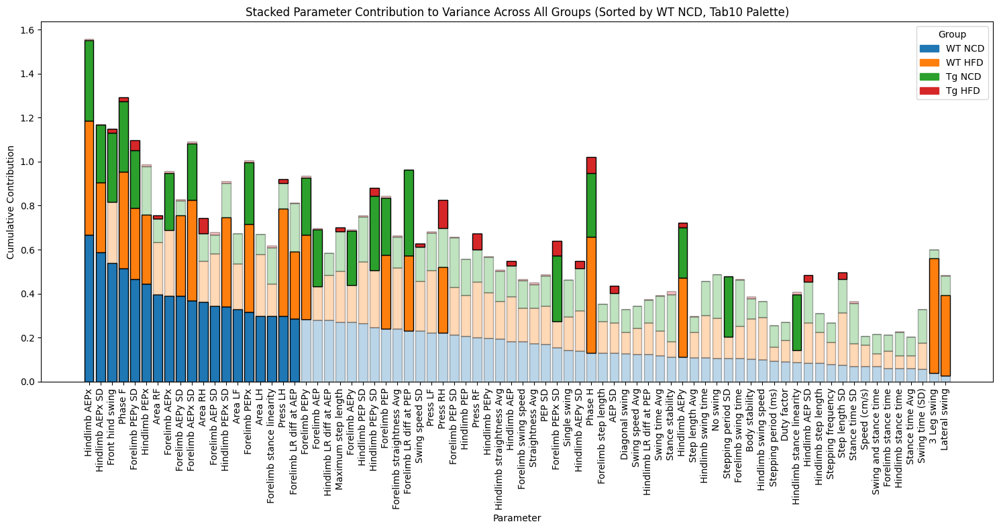

Meaningful parameters summary saved to: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/PCA/meaningful_parameters_summary.xlsx


,Common to All Groups,Common to WT Groups,Common to Tg Groups,Common to NCD,Common to HFD,Unique to WT NCD,Unique to WT HFD,Unique to Tg NCD,Unique to Tg HFD
0,Forelimb PEPy SD,Forelimb AEPy SD,Forelimb PEPx SD,Forelimb AEPx,Press RH,Area LF,3 Leg swing,Forelimb AEPy,AEP SD
1,Phase F,Forelimb LR diff at AEP,Hindlimb PEPy SD,NaN,NaN,Forelimb stance linearity,Lateral swing,Hindlimb stance linearity,Maximum step length
2,NaN,Hindlimb PEPx SD,NaN,NaN,NaN,Forelimb AEP SD,NaN,Stepping period SD,Hindlimb AEPy SD
3,NaN,Hindlimb PEPx,NaN,NaN,NaN,Area LH,NaN,Forelimb AEP,Press RF


In [229]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
import os
import numpy as np


def analyze_parameter_contributions(input_file, output_dir):
    # Load the dataset from the provided Excel file
    data = pd.read_excel(input_file, sheet_name='Sheet1')

    # Extract group-specific information from the 'Condition' column
    # Split on underscores to get animal number, genotype, diet, and run number
    data[['AnimalNumber', 'Genotype', 'Diet', 'RunNumber']] = data['Condition'].str.split('_', expand=True)

    # Create a new 'Group' column by combining 'Genotype' and 'Diet'
    data['Group'] = data['Genotype'] + ' ' + data['Diet']

    # Drop unnecessary columns for PCA
    features_standardized_df = data.drop(columns=['Condition', 'AnimalNumber', 'RunNumber', 'Genotype', 'Diet'])

    # Handle missing values by dropping rows with NaN values
    features_imputed = features_standardized_df.dropna().drop(columns=['Group'])

    # Standardize the feature data
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    features_standardized = scaler.fit_transform(features_imputed)
    features_standardized_df = pd.DataFrame(features_standardized, columns=features_standardized_df.columns[:-1])
    features_standardized_df['Group'] = data['Group']

    # Create a dictionary to store the PCA contribution for each group
    pca_contribution_summary = {}
    meaningful_parameters_per_group = {}
    unique_groups = features_standardized_df['Group'].unique()

    # Loop through each group and perform PCA
    for group in unique_groups:
        # Filter data for the current group
        group_data = features_standardized_df[features_standardized_df['Group'] == group].drop(columns=['Group'])
        
        # Apply PCA to the group data
        pca = PCA(n_components=0.95)  # Retain enough components to explain 95% of the variance
        pca.fit(group_data)
        
        # Get the explained variance ratio for each component
        explained_variance_ratio = pca.explained_variance_ratio_
        
        # Get the contribution of each parameter to the principal components
        loadings = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(len(explained_variance_ratio))], index=group_data.columns)
        
        # Calculate the overall contribution for each parameter (sum of squared loadings across PCs)
        loadings['Contribution'] = loadings.apply(lambda x: sum(x**2), axis=1)
        
        # Store the parameter contribution summary
        pca_contribution_summary[group] = loadings[['Contribution']].sort_values(by='Contribution', ascending=False)
        
        # Determine threshold for meaningful contribution based on the 75th percentile of contribution values
        contribution_threshold = loadings['Contribution'].quantile(0.75)
        meaningful_parameters_per_group[group] = loadings[loadings['Contribution'] >= contribution_threshold].index
        print(f'Group: {group}, Threshold for meaningful contribution (75th percentile): {contribution_threshold:.4f}')

    # Define the colors for each group explicitly using the 'tab10' palette
    colors = sns.color_palette('tab10')
    group_colors = {
        'WT NCD': colors[0],   # Blue
        'WT HFD': colors[1],   # Orange
        'Tg NCD': colors[2],   # Green
        'Tg HFD': colors[3]    # Red
    }

    # Plot individual contributions for each group
    for group in unique_groups:
        plt.figure(figsize=(10, 6))
        plt.bar(pca_contribution_summary[group].index, pca_contribution_summary[group]['Contribution'], color=group_colors[group], edgecolor='black')
        plt.xticks(rotation=90)
        plt.title(f'Parameter Contributions for Group: {group} (Sorted Descendingly)')
        plt.xlabel('Parameter')
        plt.ylabel('Contribution')
        plt.tight_layout()
        individual_plot_path = os.path.join(output_dir, f'{group}_parameter_contributions.png')
        plt.savefig(individual_plot_path)
        plt.close()
        #print(f'Individual parameter contribution plot saved to: {individual_plot_path}')

    # Combine the contribution data for all groups into a single DataFrame for plotting
    combined_contributions = pd.DataFrame()
    for group, summary in pca_contribution_summary.items():
        group_df = summary.copy()
        group_df['Group'] = group
        combined_contributions = pd.concat([combined_contributions, group_df])

    # Reset index for plotting
    combined_contributions.reset_index(inplace=True)
    combined_contributions.rename(columns={'index': 'Parameter'}, inplace=True)

    # Sort the parameters based on the 'WT NCD' group in descending order and reorder the group columns
    stacked_contributions = combined_contributions.pivot(index='Parameter', columns='Group', values='Contribution')
    sorted_stacked_contributions = stacked_contributions.sort_values(by='WT NCD', ascending=False)
    sorted_stacked_contributions = sorted_stacked_contributions[['WT NCD', 'WT HFD', 'Tg NCD', 'Tg HFD']]

    # Plot the stacked bar chart with contributions using different alpha values for meaningful and non-meaningful parameters per group
    plt.figure(figsize=(15, 8))
    bottom_values = pd.Series([0] * len(sorted_stacked_contributions), index=sorted_stacked_contributions.index)
    for idx, group in enumerate(sorted_stacked_contributions.columns):
        for i, param in enumerate(sorted_stacked_contributions.index):
            alpha_value = 1 if param in meaningful_parameters_per_group[group] else 0.3
            plt.bar(
                param,
                sorted_stacked_contributions[group].iloc[i],
                color=group_colors[group],
                alpha=alpha_value,
                edgecolor='black',
                bottom=bottom_values[param]
            )
        bottom_values += sorted_stacked_contributions[group]

    # Add legend separately to ensure full opacity
    handles = [plt.Rectangle((0, 0), 1, 1, color=group_colors[group]) for group in sorted_stacked_contributions.columns]
    labels = sorted_stacked_contributions.columns
    plt.legend(handles, labels, title='Group')

    plt.title('Stacked Parameter Contribution to Variance Across All Groups (Sorted by WT NCD, Tab10 Palette)')
    plt.xlabel('Parameter')
    plt.ylabel('Cumulative Contribution')
    plt.xticks(rotation=90)
    plt.tight_layout()

    # Save the plot to the output directory
    plot_path = os.path.join(output_dir, 'stacked_parameter_contributions.png')
    plt.savefig(plot_path)
    # Display the stacked contribution plot
    plt.show()

    # Save the combined contributions to an Excel file in the output directory
    excel_path = os.path.join(output_dir, 'parameter_contributions.xlsx')
    combined_contributions.to_excel(excel_path, index=False)

    # Identify and save meaningful parameters in various categories
    meaningful_common_all = set.intersection(*[set(params) for params in meaningful_parameters_per_group.values()])
    meaningful_common_wt = set(meaningful_parameters_per_group['WT NCD']).intersection(set(meaningful_parameters_per_group['WT HFD'])) - set.union(set(meaningful_parameters_per_group['Tg NCD']), set(meaningful_parameters_per_group['Tg HFD']))
    meaningful_common_tg = set(meaningful_parameters_per_group['Tg NCD']).intersection(set(meaningful_parameters_per_group['Tg HFD'])) - set.union(set(meaningful_parameters_per_group['WT NCD']), set(meaningful_parameters_per_group['WT HFD']))
    meaningful_common_ncd = set(meaningful_parameters_per_group['WT NCD']).intersection(set(meaningful_parameters_per_group['Tg NCD'])) - set.union(set(meaningful_parameters_per_group['WT HFD']), set(meaningful_parameters_per_group['Tg HFD']))
    meaningful_common_hfd = set(meaningful_parameters_per_group['WT HFD']).intersection(set(meaningful_parameters_per_group['Tg HFD'])) - set.union(set(meaningful_parameters_per_group['WT NCD']), set(meaningful_parameters_per_group['Tg NCD']))
    meaningful_unique = {
        group: set(params) - set.union(*[set(meaningful_parameters_per_group[g]) for g in unique_groups if g != group]) if unique_groups.size > 1 else set()
        for group, params in meaningful_parameters_per_group.items()
    }

    # Save meaningful parameters to an Excel file
    with pd.ExcelWriter(os.path.join(output_dir, 'meaningful_parameters_summary.xlsx')) as writer:
        combined_summary = pd.DataFrame({
            'Common to All Groups': pd.Series(list(meaningful_common_all)),
            'Common to WT Groups': pd.Series(list(meaningful_common_wt)),
            'Common to Tg Groups': pd.Series(list(meaningful_common_tg)),
            'Common to NCD': pd.Series(list(meaningful_common_ncd)),
            'Common to HFD': pd.Series(list(meaningful_common_hfd))
        })
        for group, unique_params in meaningful_unique.items():
            combined_summary[f'Unique to {group}'] = pd.Series(list(unique_params))
        combined_summary.to_excel(writer, sheet_name='Meaningful_Parameters', index=False)

    print(f'Meaningful parameters summary saved to: {os.path.join(output_dir, "meaningful_parameters_summary.xlsx")}')

    # Return the plot and print threshold information
    #print(f'Stacked contribution plot saved to: {plot_path}')
    #print(f'Excel file saved to: {excel_path}')
    return combined_summary


# Example usage
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/36wo MW_clean_no_outliers.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/PCA'
analyze_parameter_contributions(input_file, output_dir)


<h3 style="color: #FF3333;">Intersection Analysis of Meaningful Parameters Using UpSet Plot (to be completed)</h3>

UpSet plot saved to: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/VennDiagrams/upset_plot.png


<module 'matplotlib.pyplot' from '/Users/louis/opt/anaconda3/lib/python3.9/site-packages/matplotlib/pyplot.py'>

<Figure size 1200x800 with 0 Axes>

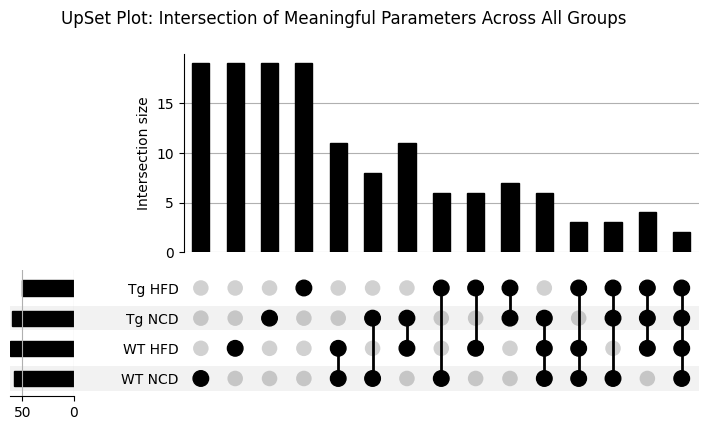

In [257]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np
from upsetplot import UpSet


def plot_venn_diagrams(input_file, output_dir):
    # Create output directory if it doesn't exist
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Load the parameter contributions from the input file
    parameter_contributions = pd.read_excel(input_file, sheet_name=None, engine='openpyxl')
    
    # Calculate meaningful parameters per group based on the 75th percentile threshold
    meaningful_parameters_per_group = {}
    for sheet_name, data in parameter_contributions.items():
        # Ensure necessary columns exist and filter based on them
        if 'Parameter' not in data.columns or 'Contribution' not in data.columns or 'Group' not in data.columns:
            raise KeyError(f"The sheet '{sheet_name}' does not contain the required columns: 'Parameter', 'Contribution', and 'Group'.")
        
        # Clean up group names to avoid inconsistencies (e.g., trailing spaces)
        data['Group'] = data['Group'].str.strip()
        
        # Initialize groups in meaningful_parameters_per_group
        for group in data['Group'].unique():
            if group not in meaningful_parameters_per_group:
                meaningful_parameters_per_group[group] = set()
        
        # Calculate contribution threshold and filter meaningful parameters per group
        for group in data['Group'].unique():
            group_data = data[data['Group'] == group]
            contribution_threshold = group_data['Contribution'].quantile(0.75)
            meaningful_data = group_data[group_data['Contribution'] >= contribution_threshold]
            
            # Update meaningful parameters per group
            meaningful_parameters_per_group[group].update(meaningful_data['Parameter'])
    
    # Ensure all groups are included, even if they have zero meaningful parameters
    all_groups = ['WT NCD', 'WT HFD', 'Tg NCD', 'Tg HFD']
    for group in all_groups:
        if group not in meaningful_parameters_per_group:
            meaningful_parameters_per_group[group] = set()
    
    # Prepare data for UpSet plot
    from collections import defaultdict
    upset_data = defaultdict(int)
    for group_combination in range(1, 2 ** len(all_groups)):
        active_groups = [all_groups[i] for i in range(len(all_groups)) if (group_combination >> i) & 1]
        intersection = set.intersection(*(meaningful_parameters_per_group[group] for group in active_groups))
        if intersection:  # Only include non-empty intersections
            upset_data[tuple(active_groups)] = len(intersection)
    
    # Create a DataFrame suitable for UpSet plot
    upset_records = []
    for groups, count in upset_data.items():
        record = {group: (group in groups) for group in all_groups}
        record['count'] = count
        upset_records.append(record)
    upset_df = pd.DataFrame(upset_records)
    upset_df = upset_df.set_index(all_groups)
    
    # Plot the UpSet diagram
    plt.figure(figsize=(12, 8))
    upset_plot = UpSet(upset_df['count'], sort_by='degree', sort_categories_by=None)
    upset_plot.plot()
    plt.suptitle('UpSet Plot: Intersection of Meaningful Parameters Across All Groups')
    
    # Save and return the plot
    upset_path = os.path.join(output_dir, 'upset_plot.png')
    plt.savefig(upset_path)
    print(f'UpSet plot saved to: {upset_path}')
    return plt


# Example usage
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/PCA/parameter_contributions.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/VennDiagrams'
plot_venn_diagrams(input_file, output_dir)


## Supervised models

<h3 style="color: #DCD427;">Neural Network Classification and Feature Importance Analysis</h3>

#### Residual neural network <span style="color:lightgreen">(Optimized)</span>

##### Without hyperparameter tunning

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.7273 - loss: 1.0795
Final Test Accuracy: 72.73%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Loss plot saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/Outlier study/ANN Test/training_validation_loss.png
Accuracy plot saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/Outlier study/ANN Test/training_validation_accuracy.png
Learning rate progression plot saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/Outlier study/ANN Test/learning_rate_progression.png
Classification Report:
              precision    recall  f1-score   support

      Tg HFD       1.00      0.71      0.83         7
      Tg NCD       0.80      0.80      0.80         5
      WT HFD       0.50      1.00      0.67         4
      WT NCD       0.75      0.50      0.60         6

    accuracy                           0.73        22
   macro avg       0.76      0

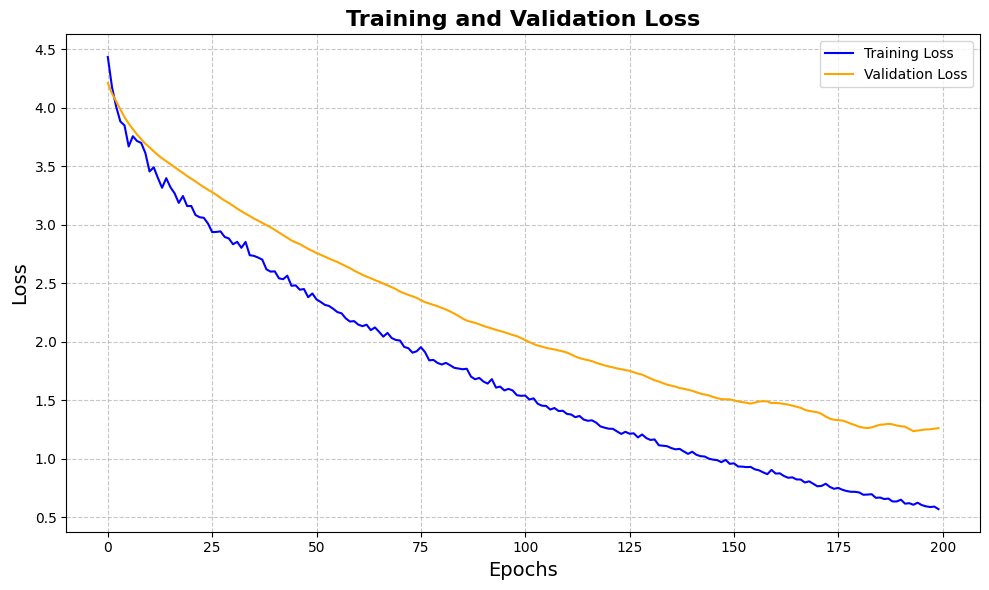

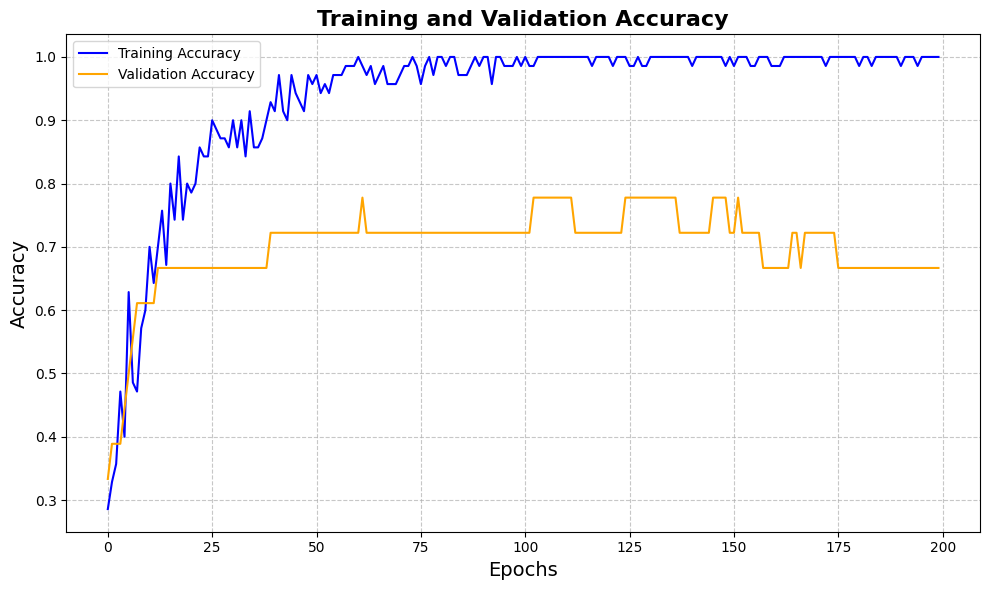

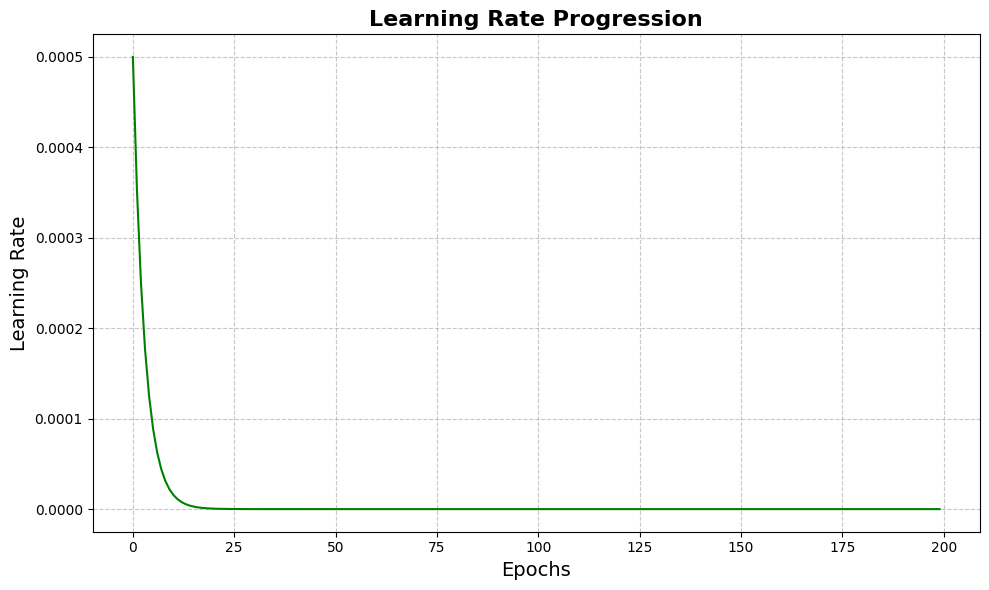

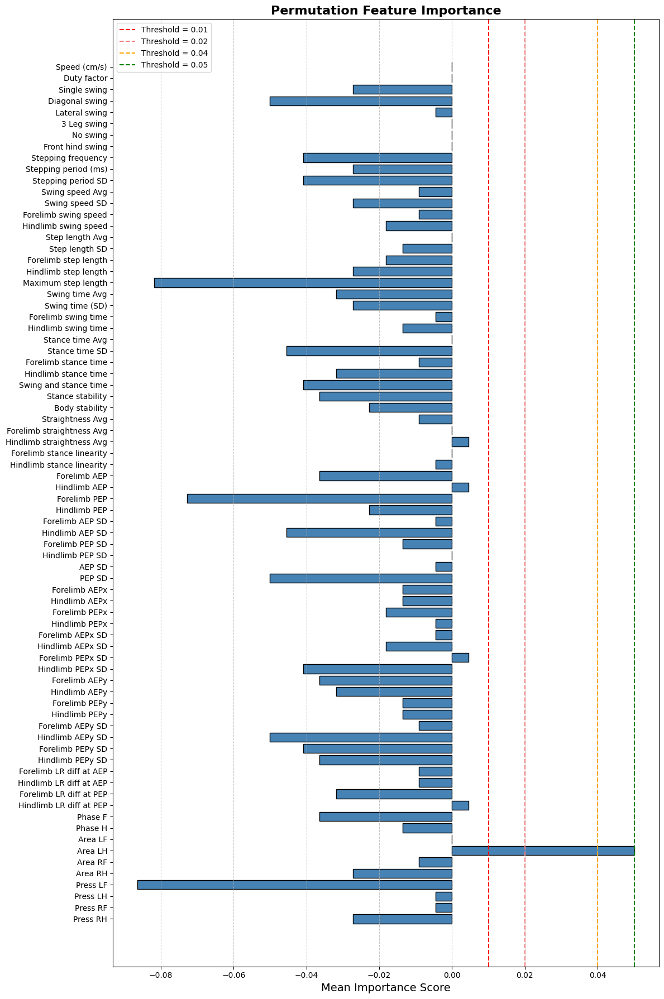

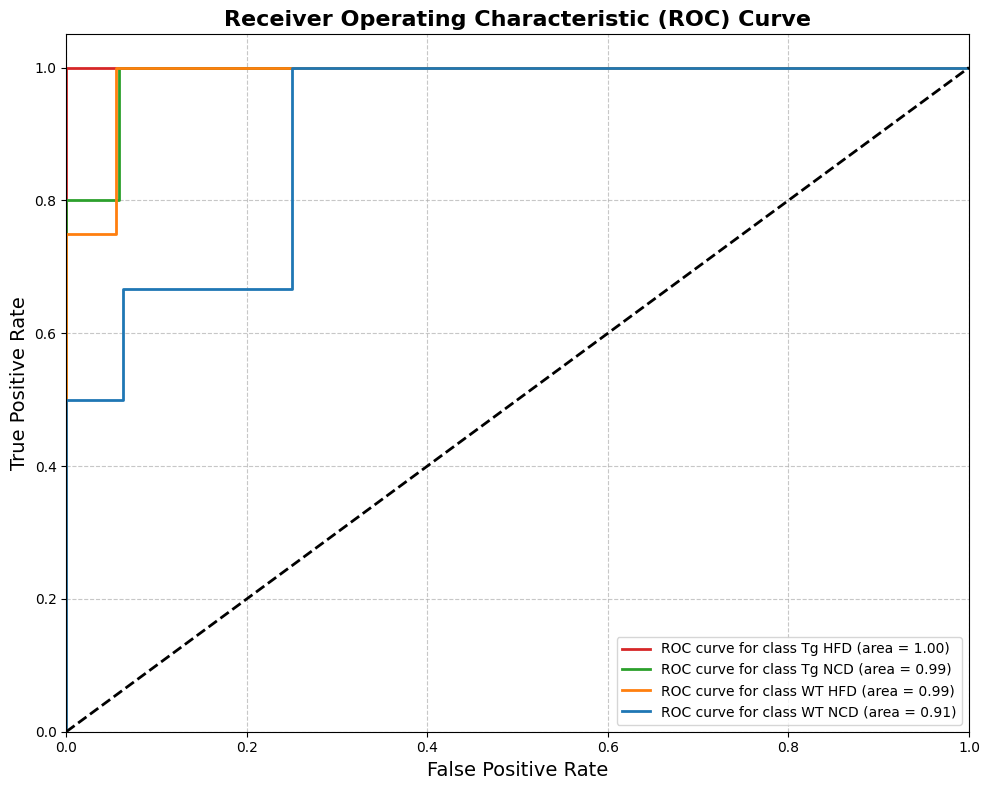

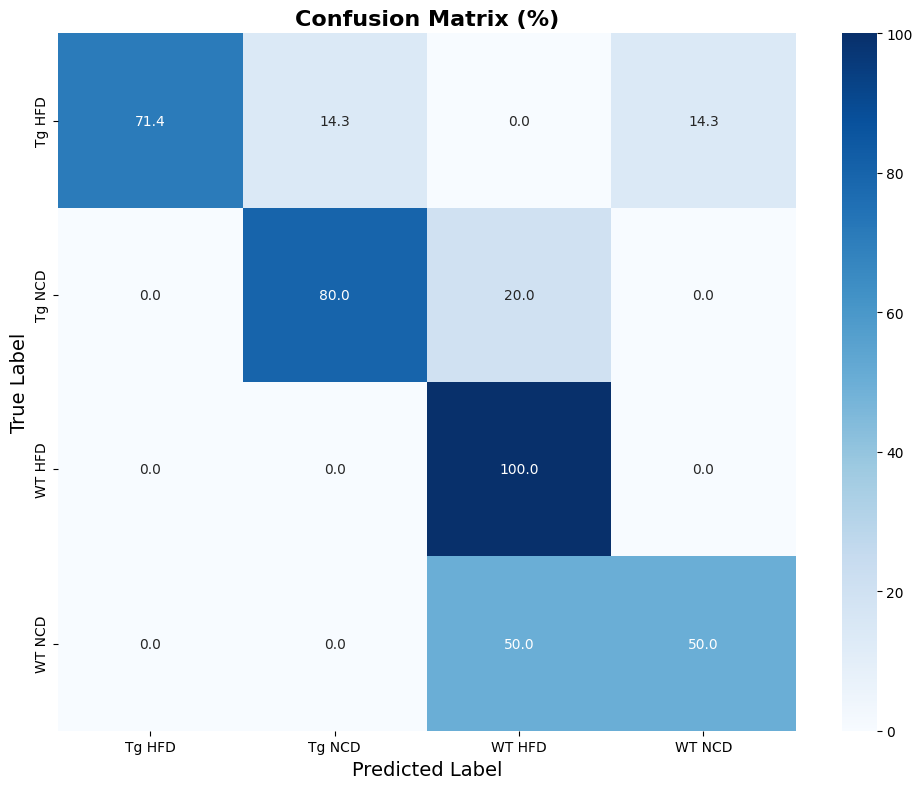

In [1]:
import pandas as pd
import numpy as np
import random
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import os
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, ReLU, Dropout, BatchNormalization, Input, Add
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, confusion_matrix
import seaborn as sns
from itertools import cycle
from sklearn.decomposition import PCA
import joblib

def find_optimal_components(X, variance_threshold=0.95):
    pca = PCA()
    pca.fit(X)
    cumsum = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumsum >= variance_threshold) + 1
    return n_components

def neural_network_analysis(input_file, output_dir, use_pca=False):
    # Set random seeds for reproducibility
    random.seed(42)
    np.random.seed(42)
    tf.random.set_seed(42)

    # Step 1: Load the data
    df = pd.read_excel(input_file)

    # Step 2: Pre-process the data
    # Drop rows with NaN values
    df = df.dropna()
    features = df.drop(columns=['Condition'])  # Drop the 'Condition' column

    # Extract group names from the condition column
    target = df['Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]))

    # Encode target labels
    label_encoder = LabelEncoder()
    target_encoded = label_encoder.fit_transform(target)
    target_categorical = to_categorical(target_encoded)

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(features, target_categorical, test_size=0.2, random_state=42)

    # Standardize the feature data
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    #Apply PCA if enabled
    pca = None
    if use_pca:
        n_components = find_optimal_components(X_train_scaled)
        pca = PCA(n_components=n_components)
        X_train_scaled = pca.fit_transform(X_train_scaled)
        X_test_scaled = pca.transform(X_test_scaled)
        
        # Save PCA results
        pca_results = {
            'n_components': n_components,
            'explained_variance_ratio': pca.explained_variance_ratio_,
            'cumulative_variance': np.cumsum(pca.explained_variance_ratio_),
            'components': pd.DataFrame(
                pca.components_,
                columns=features.columns,
                index=[f'PC{i+1}' for i in range(n_components)]
            )
        }
        
        with pd.ExcelWriter(os.path.join(output_dir, 'pca_results.xlsx')) as writer:
            pd.DataFrame({'Explained Variance Ratio': pca.explained_variance_ratio_}).to_excel(writer, sheet_name='Variance')
            pca_results['components'].to_excel(writer, sheet_name='Components')

    
    # Step 3: Build the neural network model
    def build_model():
        input_layer = Input(shape=(X_train_scaled.shape[1],))

        # First block
        x = Dense(128, kernel_regularizer=tf.keras.regularizers.l2(0.01))(input_layer)
        x = BatchNormalization()(x)
        x = ReLU()(x)
        x = Dropout(0.3)(x)

        # Second block with residual connection
        x_residual = Dense(128, kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
        x_residual = BatchNormalization()(x_residual)
        x_residual = ReLU()(x_residual)
        x_residual = Dropout(0.3)(x_residual)
        x = Add()([x, x_residual])  # Residual connection

        # Third block
        x = Dense(32, kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
        x = BatchNormalization()(x)
        x = ReLU()(x)
        x = Dropout(0.2)(x)

        output_layer = Dense(target_categorical.shape[1], activation='softmax')(x)

        model = tf.keras.Model(inputs=input_layer, outputs=output_layer)
        return model

    model = build_model()

    # Save preprocessing objects
    preprocessing_objects = {
        'scaler': scaler,
        'label_encoder': label_encoder,
        'pca': pca,
        'use_pca': use_pca
    }
    joblib.dump(preprocessing_objects, os.path.join(output_dir, 'preprocessing_objects.joblib'))

    # Compile the model
    optimizer = Adam(learning_rate=0.0005)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    # Step 4: Train the model with early stopping and learning rate scheduler
    early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
    history = model.fit(X_train_scaled, y_train, epochs=200, batch_size=16, validation_split=0.2,
                        callbacks=[early_stopping, lr_scheduler], verbose=0)

    # Step 5: Evaluate the model
    evaluation = model.evaluate(X_test_scaled, y_test)
    print(f"Final Test Accuracy: {evaluation[1] * 100:.2f}%")

    # Predict on test data to calculate additional metrics
    y_pred = model.predict(X_test_scaled)
    y_pred_class = np.argmax(y_pred, axis=1)
    y_test_class = np.argmax(y_test, axis=1)

    # Plot Training and Validation Loss
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Training Loss', color='blue')
    plt.plot(history.history['val_loss'], label='Validation Loss', color='orange')
    plt.xlabel('Epochs', fontsize=14)
    plt.ylabel('Loss', fontsize=14)
    plt.title('Training and Validation Loss', fontsize=16, fontweight='bold')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    loss_plot_path = os.path.join(output_dir, 'training_validation_loss.png')
    plt.savefig(loss_plot_path)
    print(f"Loss plot saved to {loss_plot_path}")

    # Plot Training and Validation Accuracy
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['accuracy'], label='Training Accuracy', color='blue')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy', color='orange')
    plt.xlabel('Epochs', fontsize=14)
    plt.ylabel('Accuracy', fontsize=14)
    plt.title('Training and Validation Accuracy', fontsize=16, fontweight='bold')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    accuracy_plot_path = os.path.join(output_dir, 'training_validation_accuracy.png')
    plt.savefig(accuracy_plot_path)
    print(f"Accuracy plot saved to {accuracy_plot_path}")

    # Learning Rate Progression
    lr_values = [optimizer.learning_rate.numpy() * (0.5 ** (lr_scheduler.factor * i)) for i in range(len(history.history['loss']))]
    plt.figure(figsize=(10, 6))
    plt.plot(lr_values, label='Learning Rate', color='green')
    plt.xlabel('Epochs', fontsize=14)
    plt.ylabel('Learning Rate', fontsize=14)
    plt.title('Learning Rate Progression', fontsize=16, fontweight='bold')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    lr_plot_path = os.path.join(output_dir, 'learning_rate_progression.png')
    plt.savefig(lr_plot_path)
    print(f"Learning rate progression plot saved to {lr_plot_path}")

    # Calculate classification metrics
    accuracy = accuracy_score(y_test_class, y_pred_class)
    precision = precision_score(y_test_class, y_pred_class, average='weighted')
    recall = recall_score(y_test_class, y_pred_class, average='weighted')
    f1 = f1_score(y_test_class, y_pred_class, average='weighted')

    # Print classification metrics
    print("Classification Report:")
    print(classification_report(y_test_class, y_pred_class, target_names=label_encoder.classes_))

    # Save model settings and results
    settings = {
        "Model Type": "Residual Neural Network",
        "Input Features": X_train_scaled.shape[1],
        "Hidden Layers": 3,
        "Layer Details": [
            {"Layer Type": "Dense", "Units": 128, "Activation": "ReLU", "Batch Normalization": True, "Dropout Rate": 0.3, "Regularization": "L2"},
            {"Layer Type": "Dense", "Units": 128, "Activation": "ReLU", "Batch Normalization": True, "Dropout Rate": 0.3, "Residual Connection": True, "Regularization": "L2"},
            {"Layer Type": "Dense", "Units": 32, "Activation": "ReLU", "Batch Normalization": True, "Dropout Rate": 0.2, "Regularization": "L2"}
        ],
        "Output Layer": {"Units": target_categorical.shape[1], "Activation": "softmax"},
        "Optimizer": "Adam",
        "Learning Rate": 0.0005,
        "Loss Function": "Categorical Crossentropy",
        "Metrics": ["accuracy"],
        "Batch Size": 16,
        "Patience for Early Stopping": 20,
        "Learning Rate Reduction Factor": 0.5,
        "Patience for LR Reduction": 10,
        "Number of Epochs Trained": len(history.history['loss']),
        "Validation Accuracy (Last Epoch)": history.history['val_accuracy'][-1],
        "Validation Loss (Last Epoch)": history.history['val_loss'][-1],
        "Final Test Accuracy": f"{evaluation[1] * 100:.2f}%",
        "Precision": f"{precision:.2f}",
        "Recall": f"{recall:.2f}",
        "F1 Score": f"{f1:.2f}"
    }
    settings_df = pd.DataFrame(list(settings.items()), columns=['Setting', 'Value'])
    settings_df.to_excel(os.path.join(output_dir, 'model_settings_and_results.xlsx'), index=False)



    
    # Step 6: Feature Importance Analysis
    class KerasClassifierWrapper(BaseEstimator, ClassifierMixin):
        def __init__(self, model):
            self.model = model

        def fit(self, X, y):
            # This is a placeholder to meet the sklearn API requirement
            pass

        def predict(self, X):
            return np.argmax(self.model.predict(X), axis=1)

    # Wrap the Keras model
    wrapped_model = KerasClassifierWrapper(model)

    # Compute permutation feature importance
    perm_importance = permutation_importance(wrapped_model, X_test_scaled, y_test_class, n_repeats=10, random_state=42)

    # Plot feature importance
    # Set feature names for importance analysis
    if use_pca:
        feature_names = [f'PC{i+1}' for i in range(n_components)]
    else:
        feature_names = features.columns
    importances = perm_importance.importances_mean

    plt.figure(figsize=(12, 18))
    plt.barh(feature_names, importances, color='steelblue', edgecolor='black')
    plt.xlabel('Mean Importance Score', fontsize=14)
    plt.axvline(x=0.01, color='red', linestyle='--', linewidth=1.5, label='Threshold = 0.01')
    plt.axvline(x=0.02, color='lightcoral', linestyle='--', linewidth=1.5, label='Threshold = 0.02')
    plt.axvline(x=0.04, color='orange', linestyle='--', linewidth=1.5, label='Threshold = 0.04')
    plt.axvline(x=0.05, color='green', linestyle='--', linewidth=1.5, label='Threshold = 0.05')
    plt.title('Permutation Feature Importance', fontsize=16, fontweight='bold')
    plt.gca().invert_yaxis()
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plot_path = os.path.join(output_dir, 'feature_importance_plot.png')
    plt.savefig(plot_path)

    # Save feature importance table
    importance_df = pd.DataFrame({'Feature': feature_names, 'Mean Importance Score': importances})
    importance_df['Above 0.01 Threshold'] = importance_df['Mean Importance Score'] > 0.01
    importance_df['Above 0.02 Threshold'] = importance_df['Mean Importance Score'] > 0.02
    importance_df['Above 0.04 Threshold'] = importance_df['Mean Importance Score'] > 0.04
    importance_df['Above 0.05 Threshold'] = importance_df['Mean Importance Score'] > 0.05

    table_path = os.path.join(output_dir, 'feature_importance_table.xlsx')
    importance_df.to_excel(table_path, index=False)

    # Step 7: ROC Curve Analysis
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    n_classes = y_test.shape[1]

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_pred.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # Plot all ROC curves
    plt.figure(figsize=(10, 8))
    colors = {
        'WT NCD': plt.cm.tab10(0),
        'WT HFD': plt.cm.tab10(1),
        'Tg NCD': plt.cm.tab10(2),
        'Tg HFD': plt.cm.tab10(3)
    }
    for i, class_label in enumerate(label_encoder.classes_):
        color = colors[class_label]
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'ROC curve for class {label_encoder.classes_[i]} (area = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=14)
    plt.ylabel('True Positive Rate', fontsize=14)
    plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=16, fontweight='bold')
    plt.legend(loc="lower right")
    plt.grid(axis='both', linestyle='--', alpha=0.7)
    plt.tight_layout()

    roc_curve_path = os.path.join(output_dir, 'roc_curve_plot.png')
    plt.savefig(roc_curve_path)

    print(f"ROC curve plot saved to {roc_curve_path}")

    # Step 8: Confusion Matrix
    cm = confusion_matrix(y_test_class, y_pred_class)
    cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues', 
                xticklabels=label_encoder.classes_, 
                yticklabels=label_encoder.classes_)
    plt.xlabel('Predicted Label', fontsize=14)
    plt.ylabel('True Label', fontsize=14)
    plt.title('Confusion Matrix (%)', fontsize=16, fontweight='bold')
    plt.tight_layout()
    
    confusion_matrix_path = os.path.join(output_dir, 'confusion_matrix.png')
    plt.savefig(confusion_matrix_path)
    
    print(f"Confusion matrix plot saved to {confusion_matrix_path}")

    # Step 9: Classify unlabelled data
    def classify_unlabelled_data(unlabelled_file=None, output_file=None):
        if not unlabelled_file or not output_file:
            print("Unlabelled file or output file path not provided. Skipping classification.")
            return
        
        # Load preprocessing objects
        preproc = joblib.load(os.path.join(output_dir, 'preprocessing_objects.joblib'))
        
        # Load and preprocess unlabelled data
        unlabelled_df = pd.read_excel(unlabelled_file)
        unlabelled_df = unlabelled_df.dropna()
        unlabelled_features = unlabelled_df.drop(columns=['Condition'])
        
        # Apply preprocessing steps
        unlabelled_scaled = preproc['scaler'].transform(unlabelled_features)
        
        # Apply PCA if it was used in training
        if preproc['use_pca'] and preproc['pca'] is not None:
            unlabelled_scaled = preproc['pca'].transform(unlabelled_scaled)
        
        # Predict class probabilities
        predictions = model.predict(unlabelled_scaled)
        predicted_classes = np.argmax(predictions, axis=1)
        predicted_labels = preproc['label_encoder'].inverse_transform(predicted_classes)
        
        # Add predictions to DataFrame
        unlabelled_df = unlabelled_df.iloc[:len(predicted_labels)]
        unlabelled_df['Predicted_Group'] = predicted_labels
        
        # Save results
        unlabelled_df.to_excel(output_file, index=False)
        print(f"Classification results saved to {output_file}")

  
    return plt, importance_df, classify_unlabelled_data


# Example usage remains the same
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/Outlier study/36wo MW_clean_no_outliers_filtered_median.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/Outlier study/ANN Test'
plt, importance_df, classify_unlabelled_data = neural_network_analysis(input_file, output_dir, use_pca=False)

##### With hypermarater tunning

Trial 254 Complete [00h 00m 20s]
val_accuracy: 0.6666666865348816

Best val_accuracy So Far: 0.9444444179534912
Total elapsed time: 00h 34m 45s

Epoch 98: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 171: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.

Epoch 181: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6957 - loss: 0.7441
Final Test Accuracy: 69.57%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Loss plot saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/ML/ANN/PCA = True/training_validation_loss.png
Accuracy plot saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/ML/ANN/PCA = True/training_validation_accuracy.png
Learning rate progression plot saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/ML/ANN/PCA = True/learning_rate_progression.png
Classification Report:
              precision  

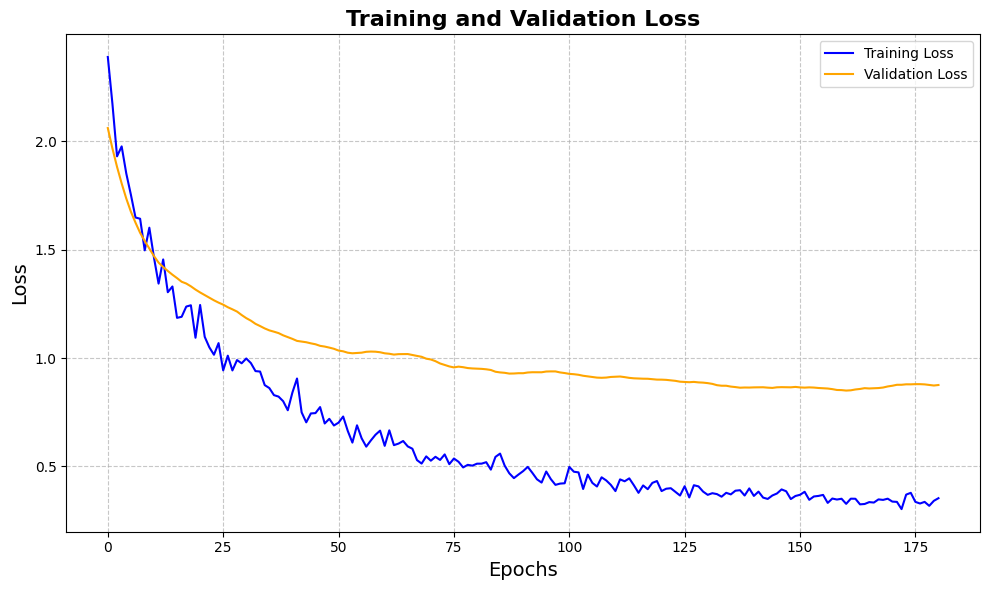

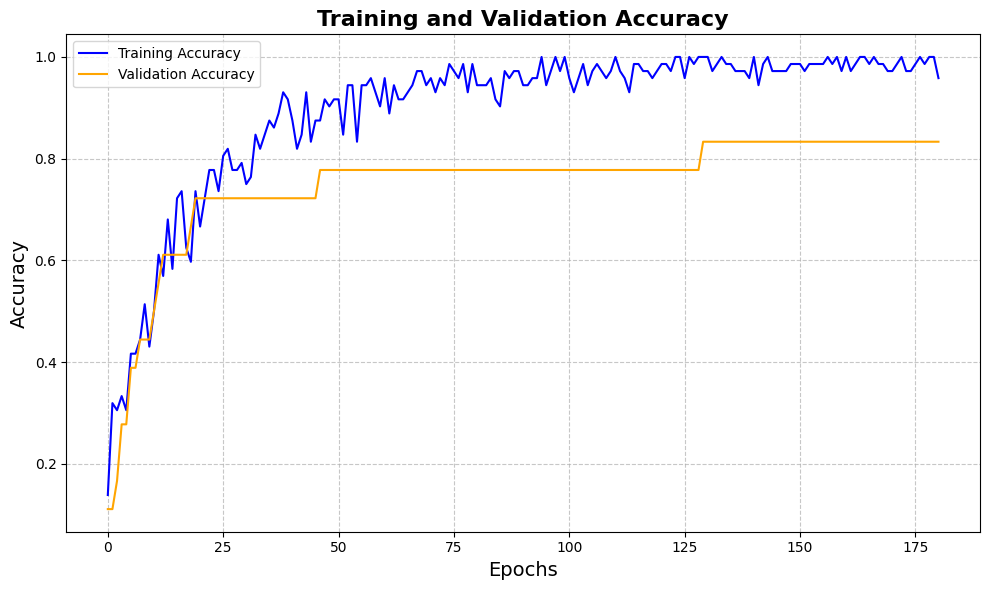

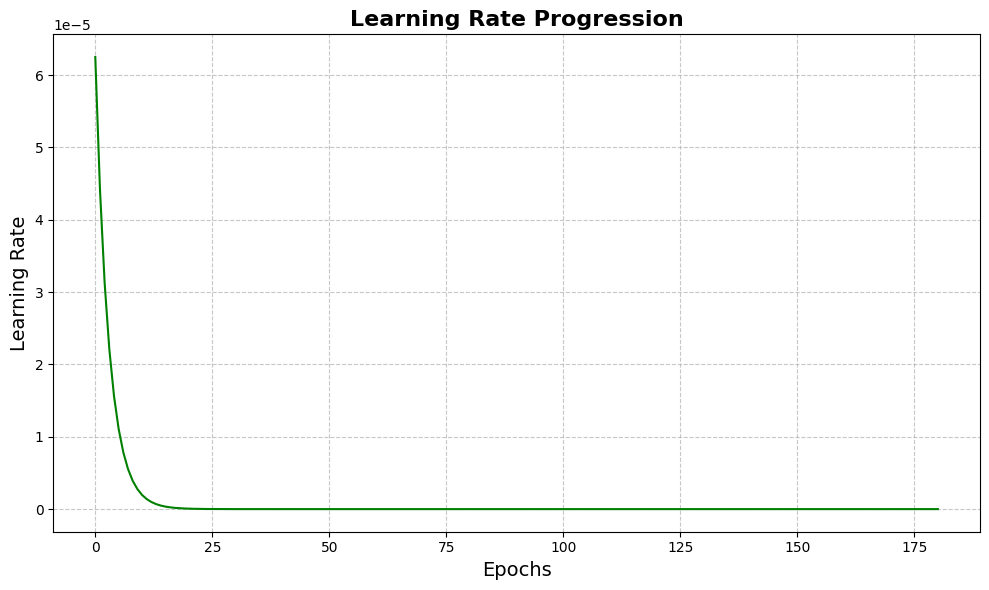

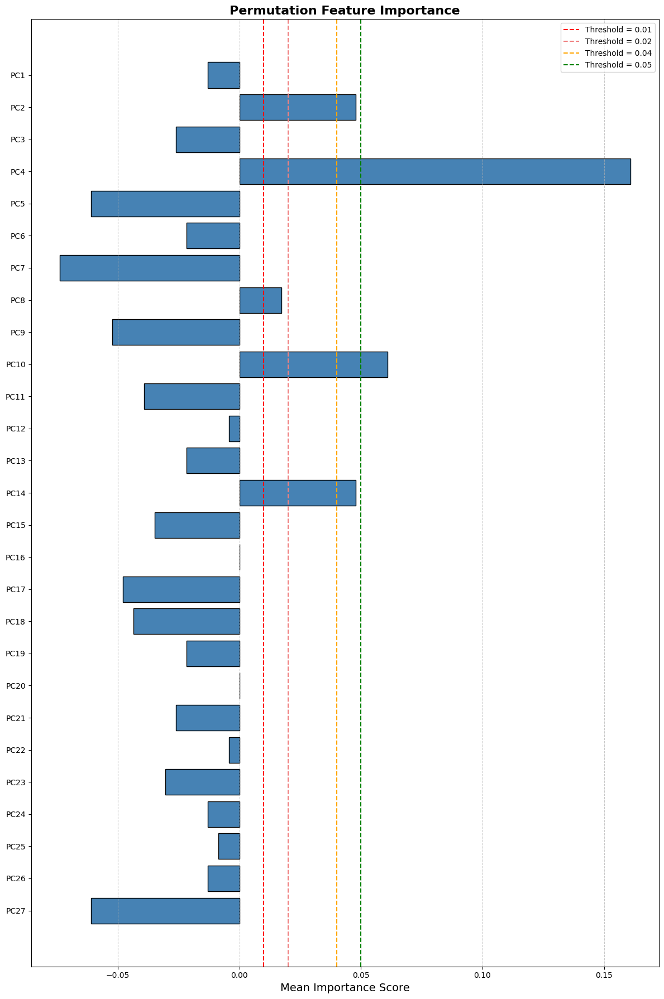

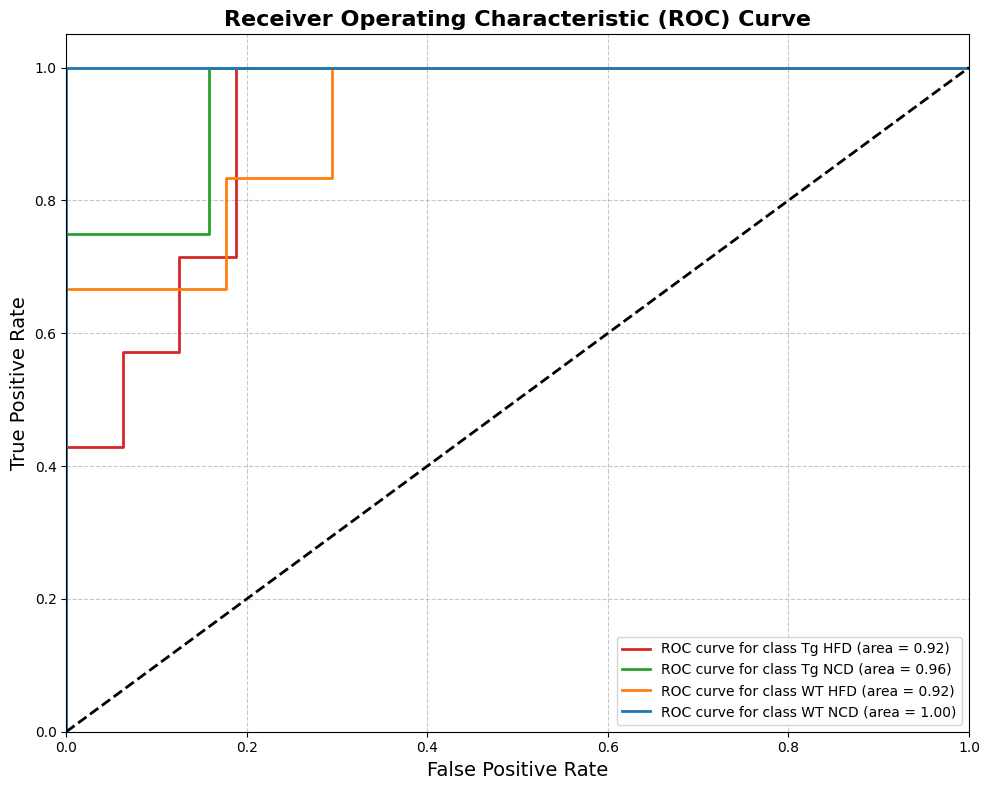

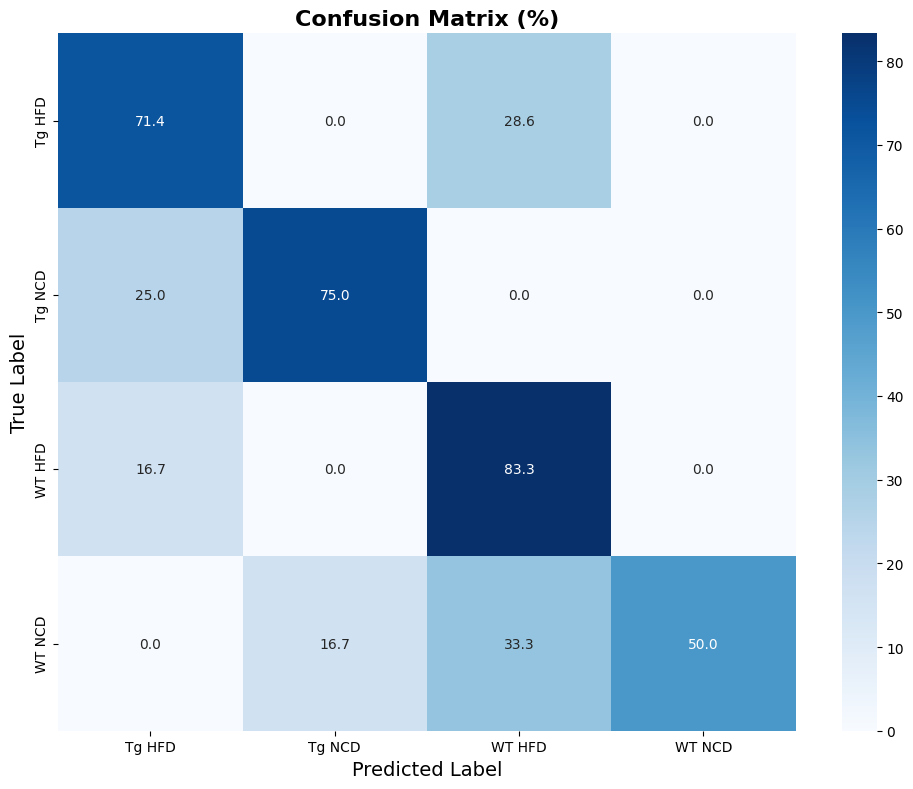

In [37]:
import pandas as pd
import numpy as np
import random
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import os
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, ReLU, Dropout, BatchNormalization, Input, Add
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, confusion_matrix
import seaborn as sns
from itertools import cycle
from sklearn.decomposition import PCA
import joblib
from keras_tuner import Hyperband


def find_optimal_components(X, variance_threshold=0.95):
    pca = PCA()
    pca.fit(X)
    cumsum = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumsum >= variance_threshold) + 1
    return n_components

def neural_network_analysis(input_file, output_dir, use_pca=False):
    # Set random seeds for reproducibility
    random.seed(42)
    np.random.seed(42)
    tf.random.set_seed(42)

    # Step 1: Load the data
    df = pd.read_excel(input_file)

    # Step 2: Pre-process the data
    # Drop rows with NaN values
    df = df.dropna()
    features = df.drop(columns=['Condition'])  # Drop the 'Condition' column

    # Extract group names from the condition column
    target = df['Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]))

    # Encode target labels
    label_encoder = LabelEncoder()
    target_encoded = label_encoder.fit_transform(target)
    target_categorical = to_categorical(target_encoded)

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(features, target_categorical, test_size=0.2, random_state=42)

    # Standardize the feature data
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    #Apply PCA if enabled
    pca = None
    if use_pca:
        n_components = find_optimal_components(X_train_scaled)
        pca = PCA(n_components=n_components)
        X_train_scaled = pca.fit_transform(X_train_scaled)
        X_test_scaled = pca.transform(X_test_scaled)
        
        # Save PCA results
        pca_results = {
            'n_components': n_components,
            'explained_variance_ratio': pca.explained_variance_ratio_,
            'cumulative_variance': np.cumsum(pca.explained_variance_ratio_),
            'components': pd.DataFrame(
                pca.components_,
                columns=features.columns,
                index=[f'PC{i+1}' for i in range(n_components)]
            )
        }
        
        with pd.ExcelWriter(os.path.join(output_dir, 'pca_results.xlsx')) as writer:
            pd.DataFrame({'Explained Variance Ratio': pca.explained_variance_ratio_}).to_excel(writer, sheet_name='Variance')
            pca_results['components'].to_excel(writer, sheet_name='Components')

    
    def build_model(hp):
        input_shape = X_train_scaled.shape[1]
        input_layer = Input(shape=(input_shape,))
        
        # First block
        units_1 = hp.Int('units_1', min_value=32, max_value=256, step=32)
        x = Dense(units_1, kernel_regularizer=tf.keras.regularizers.l2(
            hp.Float('l2_1', min_value=1e-4, max_value=1e-2, sampling='log')
        ))(input_layer)
        x = BatchNormalization()(x)
        x = ReLU()(x)
        x = Dropout(hp.Float('dropout_1', min_value=0.1, max_value=0.5, step=0.1))(x)
        
        # Second block with independent units
        units_2 = hp.Int('units_2', min_value=32, max_value=256, step=32)
        x_residual = Dense(units_2, kernel_regularizer=tf.keras.regularizers.l2(
            hp.Float('l2_2', min_value=1e-4, max_value=1e-2, sampling='log')
        ))(x)
        x_residual = BatchNormalization()(x_residual)
        x_residual = ReLU()(x_residual)
        x_residual = Dropout(hp.Float('dropout_2', min_value=0.1, max_value=0.5, step=0.1))(x_residual)
        
        # Project input to match dimensions if needed
        if units_1 != units_2:
            x = Dense(units_2)(x)
        x = Add()([x, x_residual])
        
        # Third block
        x = Dense(hp.Int('units_3', min_value=16, max_value=128, step=16),
            kernel_regularizer=tf.keras.regularizers.l2(
                hp.Float('l2_3', min_value=1e-4, max_value=1e-2, sampling='log')
            ))(x)
        x = BatchNormalization()(x)
        x = ReLU()(x)
        x = Dropout(hp.Float('dropout_3', min_value=0.1, max_value=0.5, step=0.1))(x)
        
        output_layer = Dense(target_categorical.shape[1], activation='softmax')(x)
        model = tf.keras.Model(inputs=input_layer, outputs=output_layer)
        
        optimizer = Adam(learning_rate=hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='log'))
        model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
        return model
    
    def perform_hyperparameter_tuning(X_train_scaled, y_train):
        tuner = Hyperband(
            build_model,
            objective='val_accuracy',
            max_epochs=100,
            factor=3,
            directory=output_dir,
            project_name='neural_network_tuning'
        )
        
        stop_early = EarlyStopping(monitor='val_loss', patience=5)
        
        tuner.search(
            X_train_scaled, 
            y_train,
            epochs=100,
            validation_split=0.2,
            callbacks=[stop_early],
            verbose=1
        )
        
        # Get best hyperparameters and model
        best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
        best_model = tuner.hypermodel.build(best_hps)
        
        # Save best hyperparameters
        best_params = {
            'units_1': best_hps.get('units_1'),
            'units_2': best_hps.get('units_2'),
            'units_3': best_hps.get('units_3'),
            'dropout_1': best_hps.get('dropout_1'),
            'dropout_2': best_hps.get('dropout_2'),
            'dropout_3': best_hps.get('dropout_3'),
            'l2_1': best_hps.get('l2_1'),
            'l2_2': best_hps.get('l2_2'),
            'l2_3': best_hps.get('l2_3'),
            'learning_rate': best_hps.get('learning_rate')
        }
        
        pd.DataFrame([best_params]).to_excel(
            os.path.join(output_dir, 'best_hyperparameters.xlsx'),
            index=False
        )
        
        return best_model, best_params

    best_model, best_params = perform_hyperparameter_tuning(X_train_scaled, y_train)
    model = best_model
    
    # Save preprocessing objects
    preprocessing_objects = {
        'scaler': scaler,
        'label_encoder': label_encoder,
        'pca': pca,
        'use_pca': use_pca
    }
    joblib.dump(preprocessing_objects, os.path.join(output_dir, 'preprocessing_objects.joblib'))

    # Compile the model
    optimizer = Adam(learning_rate=0.0005)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    # Step 4: Train the model with early stopping and learning rate scheduler
    early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
    history = model.fit(X_train_scaled, y_train, epochs=200, batch_size=16, validation_split=0.2,
                        callbacks=[early_stopping, lr_scheduler], verbose=0)

    # Step 5: Evaluate the model
    evaluation = model.evaluate(X_test_scaled, y_test)
    print(f"Final Test Accuracy: {evaluation[1] * 100:.2f}%")

    # Predict on test data to calculate additional metrics
    y_pred = model.predict(X_test_scaled)
    y_pred_class = np.argmax(y_pred, axis=1)
    y_test_class = np.argmax(y_test, axis=1)

    # Plot Training and Validation Loss
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Training Loss', color='blue')
    plt.plot(history.history['val_loss'], label='Validation Loss', color='orange')
    plt.xlabel('Epochs', fontsize=14)
    plt.ylabel('Loss', fontsize=14)
    plt.title('Training and Validation Loss', fontsize=16, fontweight='bold')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    loss_plot_path = os.path.join(output_dir, 'training_validation_loss.png')
    plt.savefig(loss_plot_path)
    print(f"Loss plot saved to {loss_plot_path}")

    # Plot Training and Validation Accuracy
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['accuracy'], label='Training Accuracy', color='blue')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy', color='orange')
    plt.xlabel('Epochs', fontsize=14)
    plt.ylabel('Accuracy', fontsize=14)
    plt.title('Training and Validation Accuracy', fontsize=16, fontweight='bold')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    accuracy_plot_path = os.path.join(output_dir, 'training_validation_accuracy.png')
    plt.savefig(accuracy_plot_path)
    print(f"Accuracy plot saved to {accuracy_plot_path}")

    # Learning Rate Progression
    lr_values = [optimizer.learning_rate.numpy() * (0.5 ** (lr_scheduler.factor * i)) for i in range(len(history.history['loss']))]
    plt.figure(figsize=(10, 6))
    plt.plot(lr_values, label='Learning Rate', color='green')
    plt.xlabel('Epochs', fontsize=14)
    plt.ylabel('Learning Rate', fontsize=14)
    plt.title('Learning Rate Progression', fontsize=16, fontweight='bold')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    lr_plot_path = os.path.join(output_dir, 'learning_rate_progression.png')
    plt.savefig(lr_plot_path)
    print(f"Learning rate progression plot saved to {lr_plot_path}")

    # Calculate classification metrics
    accuracy = accuracy_score(y_test_class, y_pred_class)
    precision = precision_score(y_test_class, y_pred_class, average='weighted')
    recall = recall_score(y_test_class, y_pred_class, average='weighted')
    f1 = f1_score(y_test_class, y_pred_class, average='weighted')

    # Print classification metrics
    print("Classification Report:")
    print(classification_report(y_test_class, y_pred_class, target_names=label_encoder.classes_))

    # Consolidated model settings
    settings = {
        "Model Type": "Residual Neural Network",
        "Input Features": X_train_scaled.shape[1],
        "Hidden Layers": {
            "First Block": {
                "Units": best_params["units_1"],
                "Dropout Rate": best_params["dropout_1"],
                "L2 Regularization": best_params["l2_1"],
            },
            "Residual Block": {
                "Units": best_params["units_1"],  # Same as the first block
                "Dropout Rate": best_params["dropout_2"],
                "L2 Regularization": best_params["l2_2"],
            },
            "Third Block": {
                "Units": best_params["units_3"],
                "Dropout Rate": best_params["dropout_3"],
                "L2 Regularization": best_params["l2_3"],
            },
        },
        "Output Layer": {
            "Units": target_categorical.shape[1],
            "Activation": "softmax",
        },
        "Optimizer": "Adam",
        "Learning Rate": best_params["learning_rate"],
        "Loss Function": "Categorical Crossentropy",
        "Metrics": ["accuracy"],
        "Training Configuration": {
            "Batch Size": 16,
            "Patience for Early Stopping": 20,
            "Learning Rate Reduction Factor": 0.5,
            "Patience for LR Reduction": 10,
        },
        "Performance Metrics": {
            "Final Test Accuracy": f"{evaluation[1] * 100:.2f}%",
            "Precision": f"{precision:.2f}",
            "Recall": f"{recall:.2f}",
            "F1 Score": f"{f1:.2f}",
        },
    }

    # Export model settings and results
    pd.DataFrame.from_dict(settings, orient='index', columns=['Value']).to_excel(os.path.join(output_dir, 'model_settings_and_results.xlsx'),index=True)
  
    # Step 6: Feature Importance Analysis
    class KerasClassifierWrapper(BaseEstimator, ClassifierMixin):
        def __init__(self, model):
            self.model = model

        def fit(self, X, y):
            # This is a placeholder to meet the sklearn API requirement
            pass

        def predict(self, X):
            return np.argmax(self.model.predict(X), axis=1)

    # Wrap the Keras model
    wrapped_model = KerasClassifierWrapper(model)

    # Compute permutation feature importance
    perm_importance = permutation_importance(wrapped_model, X_test_scaled, y_test_class, n_repeats=10, random_state=42)

    # Plot feature importance
    # Set feature names for importance analysis
    if use_pca:
        feature_names = [f'PC{i+1}' for i in range(n_components)]
    else:
        feature_names = features.columns
    importances = perm_importance.importances_mean

    plt.figure(figsize=(12, 18))
    plt.barh(feature_names, importances, color='steelblue', edgecolor='black')
    plt.xlabel('Mean Importance Score', fontsize=14)
    plt.axvline(x=0.01, color='red', linestyle='--', linewidth=1.5, label='Threshold = 0.01')
    plt.axvline(x=0.02, color='lightcoral', linestyle='--', linewidth=1.5, label='Threshold = 0.02')
    plt.axvline(x=0.04, color='orange', linestyle='--', linewidth=1.5, label='Threshold = 0.04')
    plt.axvline(x=0.05, color='green', linestyle='--', linewidth=1.5, label='Threshold = 0.05')
    plt.title('Permutation Feature Importance', fontsize=16, fontweight='bold')
    plt.gca().invert_yaxis()
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plot_path = os.path.join(output_dir, 'feature_importance_plot.png')
    plt.savefig(plot_path)

    # Save feature importance table
    importance_df = pd.DataFrame({'Feature': feature_names, 'Mean Importance Score': importances})
    importance_df['Above 0.01 Threshold'] = importance_df['Mean Importance Score'] > 0.01
    importance_df['Above 0.02 Threshold'] = importance_df['Mean Importance Score'] > 0.02
    importance_df['Above 0.04 Threshold'] = importance_df['Mean Importance Score'] > 0.04
    importance_df['Above 0.05 Threshold'] = importance_df['Mean Importance Score'] > 0.05

    table_path = os.path.join(output_dir, 'feature_importance_table.xlsx')
    importance_df.to_excel(table_path, index=False)

    # Step 7: ROC Curve Analysis
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    n_classes = y_test.shape[1]

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_pred.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # Plot all ROC curves
    plt.figure(figsize=(10, 8))
    colors = {
        'WT NCD': plt.cm.tab10(0),
        'WT HFD': plt.cm.tab10(1),
        'Tg NCD': plt.cm.tab10(2),
        'Tg HFD': plt.cm.tab10(3)
    }
    for i, class_label in enumerate(label_encoder.classes_):
        color = colors[class_label]
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'ROC curve for class {label_encoder.classes_[i]} (area = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=14)
    plt.ylabel('True Positive Rate', fontsize=14)
    plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=16, fontweight='bold')
    plt.legend(loc="lower right")
    plt.grid(axis='both', linestyle='--', alpha=0.7)
    plt.tight_layout()

    roc_curve_path = os.path.join(output_dir, 'roc_curve_plot.png')
    plt.savefig(roc_curve_path)

    print(f"ROC curve plot saved to {roc_curve_path}")

    # Step 8: Confusion Matrix
    cm = confusion_matrix(y_test_class, y_pred_class)
    cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues', 
                xticklabels=label_encoder.classes_, 
                yticklabels=label_encoder.classes_)
    plt.xlabel('Predicted Label', fontsize=14)
    plt.ylabel('True Label', fontsize=14)
    plt.title('Confusion Matrix (%)', fontsize=16, fontweight='bold')
    plt.tight_layout()
    
    confusion_matrix_path = os.path.join(output_dir, 'confusion_matrix.png')
    plt.savefig(confusion_matrix_path)
    
    print(f"Confusion matrix plot saved to {confusion_matrix_path}")

    # Step 9: Classify unlabelled data
    def classify_unlabelled_data(unlabelled_file=None, output_file=None):
        if not unlabelled_file or not output_file:
            print("Unlabelled file or output file path not provided. Skipping classification.")
            return
        
        # Load preprocessing objects
        preproc = joblib.load(os.path.join(output_dir, 'preprocessing_objects.joblib'))
        
        # Load and preprocess unlabelled data
        unlabelled_df = pd.read_excel(unlabelled_file)
        unlabelled_df = unlabelled_df.dropna()
        unlabelled_features = unlabelled_df.drop(columns=['Condition'])
        
        # Apply preprocessing steps
        unlabelled_scaled = preproc['scaler'].transform(unlabelled_features)
        
        # Apply PCA if it was used in training
        if preproc['use_pca'] and preproc['pca'] is not None:
            unlabelled_scaled = preproc['pca'].transform(unlabelled_scaled)
        
        # Predict class probabilities
        predictions = model.predict(unlabelled_scaled)
        predicted_classes = np.argmax(predictions, axis=1)
        predicted_labels = preproc['label_encoder'].inverse_transform(predicted_classes)
        
        # Add predictions to DataFrame
        unlabelled_df = unlabelled_df.iloc[:len(predicted_labels)]
        unlabelled_df['Predicted_Group'] = predicted_labels
        
        # Save results
        unlabelled_df.to_excel(output_file, index=False)
        print(f"Classification results saved to {output_file}")

  
    return plt, importance_df, classify_unlabelled_data


# Example usage remains the same
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/Data pre-processing/Outlier study/36wo MW_clean_no_outliers_filtered_median.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW Jan 2025/36wo/ML/ANN/PCA = True'
plt, importance_df, classify_unlabelled_data = neural_network_analysis(input_file, output_dir, use_pca=True)

In [185]:
## Test the model
# Example unlabelled data classification
unlabelled_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/ANN/IDE Test/IDE males MW_clean_no_outliers.xlsx' # Leave blank to skip classification
output_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/ANN/IDE Test/36wo MW_clean_no_outliers_classresults.xlsx'  # Leave blank to skip classification
classify_unlabelled_data(unlabelled_file, output_file)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Classification results saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/ANN/IDE Test/36wo MW_clean_no_outliers_classresults.xlsx


#### Sequential neural network  <span style="color:red">(optional)</span>

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.8824 - loss: 1.1705
Final Test Accuracy: 88.24%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Loss plot saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/ANN/Raw/training_validation_loss.png
Accuracy plot saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/ANN/Raw/training_validation_accuracy.png
Learning rate progression plot saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/ANN/Raw/learning_rate_progression.png
Classification Report:
              precision    recall  f1-score   support

      Tg HFD       1.00      1.00      1.00         4
      Tg NCD       0.80      1.00      0.89         4
      WT HFD       0.80      1.00      0.89         4
      WT NCD       1.00      0.60      0.75         5

    accuracy                           0.88        17
   macro avg       0.90      0.90      0.88        17
wei

(<module 'matplotlib.pyplot' from '/Users/louis/opt/anaconda3/lib/python3.9/site-packages/matplotlib/pyplot.py'>,
            Feature  Mean Importance Score  Above 0.02 Threshold
 0     Speed (cm/s)               0.047059                  True
 1      Duty factor               0.000000                 False
 2     Single swing               0.023529                  True
 3   Diagonal swing               0.000000                 False
 4    Lateral swing               0.058824                  True
 ..             ...                    ...                   ...
 71         Area RH              -0.005882                 False
 72        Press LF               0.017647                 False
 73        Press LH               0.011765                 False
 74        Press RF               0.000000                 False
 75        Press RH              -0.005882                 False
 
 [76 rows x 3 columns])

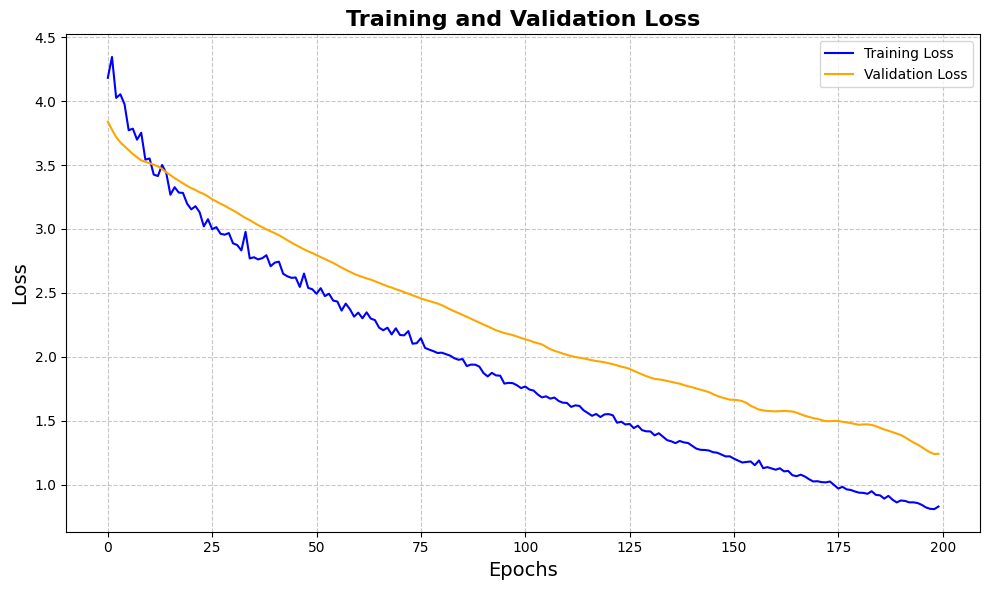

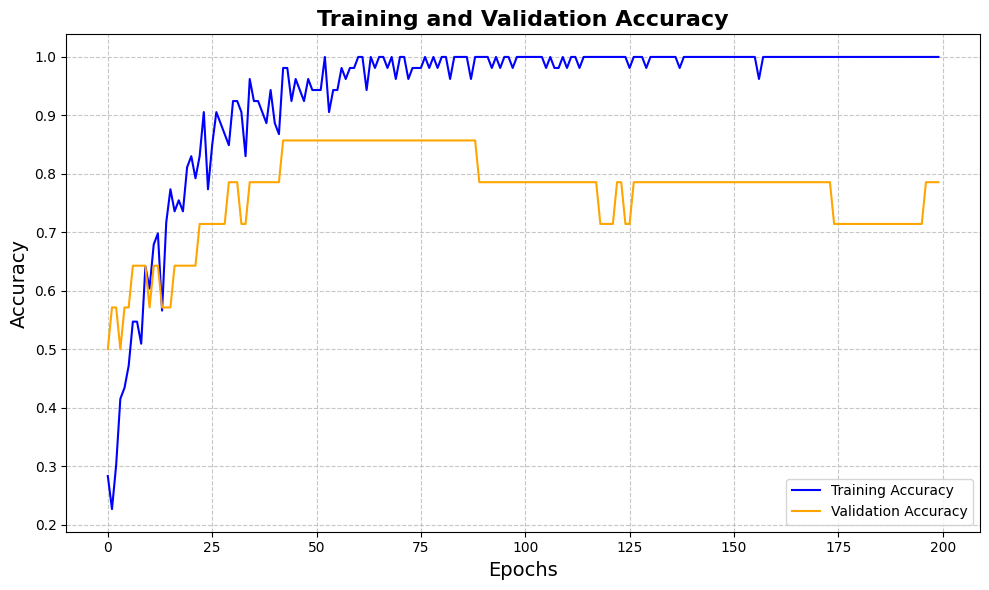

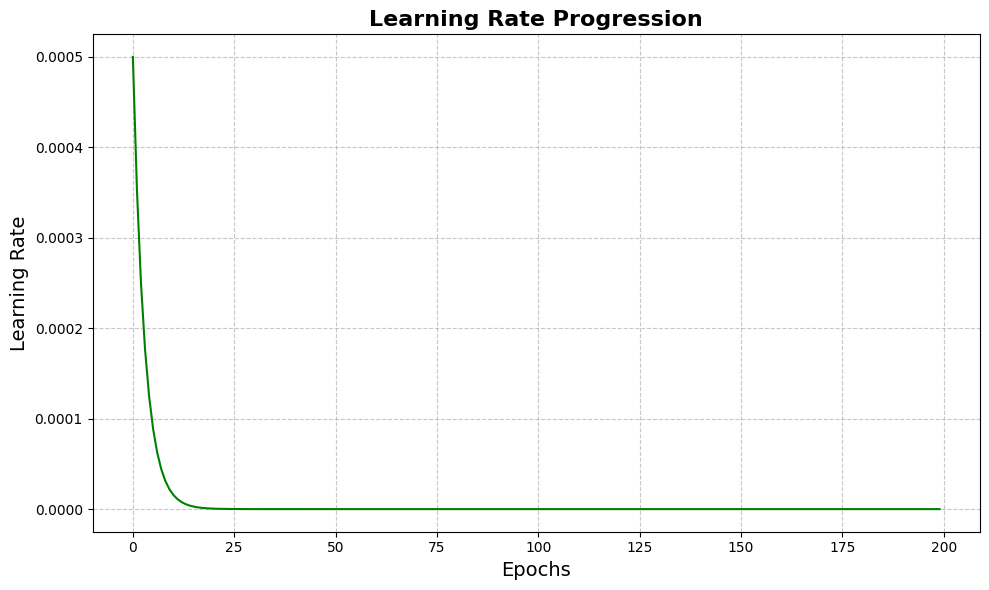

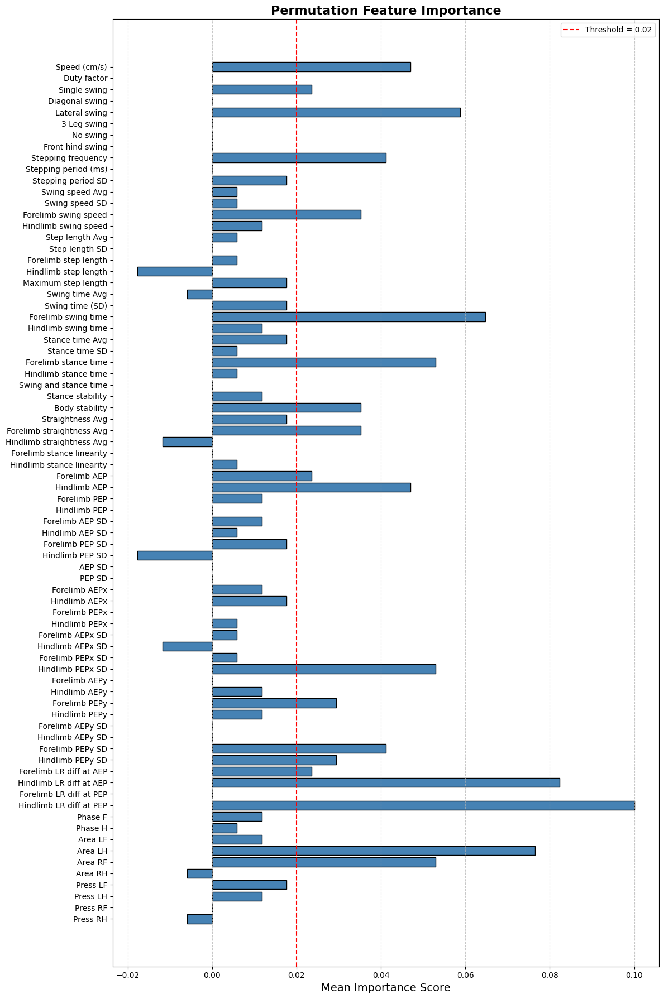

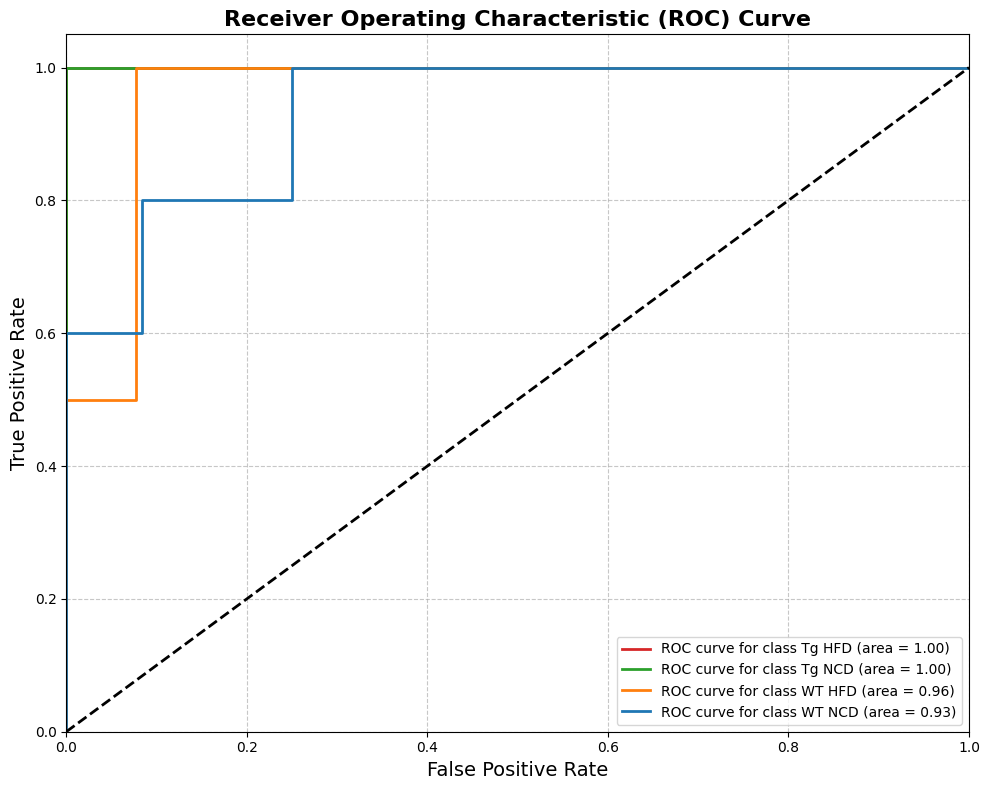

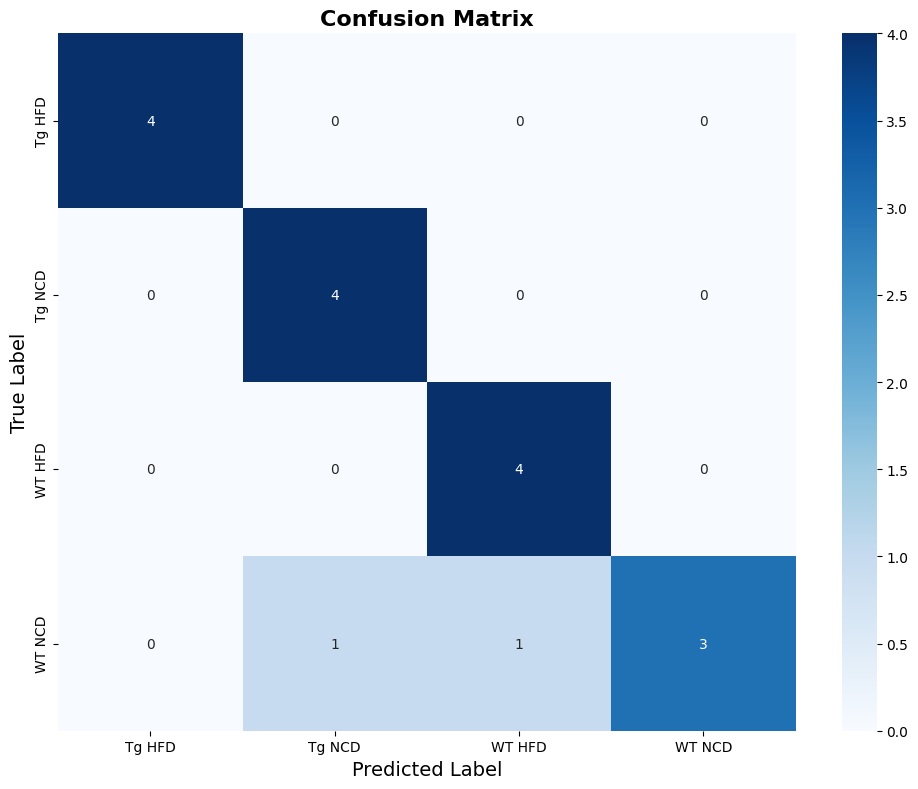

In [9]:
import pandas as pd
import numpy as np
import random
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import os
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, ReLU, Dropout, BatchNormalization, Input
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, confusion_matrix
import seaborn as sns
from itertools import cycle


def neural_network_analysis(input_file, output_dir):
    # Set random seeds for reproducibility
    random.seed(42)
    np.random.seed(42)
    tf.random.set_seed(42)

    # Step 1: Load the data
    df = pd.read_excel(input_file)

    # Step 2: Pre-process the data
    # Drop rows with NaN values
    features = df.drop(columns=['Condition']).dropna()  # Drop the 'condition' column and remove rows with NaN

    # Extract group names from the condition column
    target = df.loc[features.index, 'Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]))

    # Encode target labels
    label_encoder = LabelEncoder()
    target_encoded = label_encoder.fit_transform(target)
    target_categorical = to_categorical(target_encoded)

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(features, target_categorical, test_size=0.2, random_state=42)

    # Standardize the feature data
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Step 3: Build the neural network model
    model = Sequential()
    model.add(Input(shape=(X_train_scaled.shape[1],)))  # Input layer
    model.add(Dense(128))  # First hidden layer
    model.add(BatchNormalization())
    model.add(ReLU())
    model.add(Dropout(0.3))
    model.add(Dense(64))  # Second hidden layer
    model.add(BatchNormalization())
    model.add(ReLU())
    model.add(Dropout(0.3))
    model.add(Dense(32))  # Third hidden layer
    model.add(BatchNormalization())
    model.add(ReLU())
    model.add(Dropout(0.2))
    model.add(Dense(target_categorical.shape[1], activation='softmax'))  # Output layer

    # Compile the model
    optimizer = Adam(learning_rate=0.0005)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    # Step 4: Train the model with early stopping
    early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
    history = model.fit(X_train_scaled, y_train, epochs=200, batch_size=16, validation_split=0.2, callbacks=[early_stopping], verbose=0)

    # Step 5: Evaluate the model
    evaluation = model.evaluate(X_test_scaled, y_test)
    print(f"Final Test Accuracy: {evaluation[1] * 100:.2f}%")

    # Predict on test data to calculate additional metrics
    y_pred = model.predict(X_test_scaled)
    y_pred_class = np.argmax(y_pred, axis=1)
    y_test_class = np.argmax(y_test, axis=1)

    # Calculate classification metrics
    accuracy = accuracy_score(y_test_class, y_pred_class)
    precision = precision_score(y_test_class, y_pred_class, average='weighted')
    recall = recall_score(y_test_class, y_pred_class, average='weighted')
    f1 = f1_score(y_test_class, y_pred_class, average='weighted')

    # Print classification metrics
    print("Classification Report:")
    print(classification_report(y_test_class, y_pred_class, target_names=label_encoder.classes_))

    # Save model settings and results
    settings = {
        "Model Type": "Sequential Neural Network",
        "Input Features": X_train_scaled.shape[1],
        "Hidden Layers": 3,
        "Layer Details": [
            {"Layer Type": "Dense", "Units": 128, "Activation": "ReLU", "Batch Normalization": True, "Dropout Rate": 0.3},
            {"Layer Type": "Dense", "Units": 64, "Activation": "ReLU", "Batch Normalization": True, "Dropout Rate": 0.3},
            {"Layer Type": "Dense", "Units": 32, "Activation": "ReLU", "Batch Normalization": True, "Dropout Rate": 0.2}
        ],
        "Output Layer": {"Units": target_categorical.shape[1], "Activation": "softmax"},
        "Optimizer": "Adam",
        "Learning Rate": 0.0005,
        "Loss Function": "Categorical Crossentropy",
        "Metrics": ["accuracy"],
        "Batch Size": 16,
        "Patience for Early Stopping": 20,
        "Number of Epochs Trained": len(history.history['loss']),
        "Validation Accuracy (Last Epoch)": history.history['val_accuracy'][-1],
        "Validation Loss (Last Epoch)": history.history['val_loss'][-1],
        "Final Test Accuracy": f"{evaluation[1] * 100:.2f}%",
        "Precision": f"{precision:.2f}",
        "Recall": f"{recall:.2f}",
        "F1 Score": f"{f1:.2f}"
    }
    settings_df = pd.DataFrame(list(settings.items()), columns=['Setting', 'Value'])
    settings_df.to_excel(os.path.join(output_dir, 'model_settings_and_results.xlsx'), index=False)

    # Step 6: Feature Importance Analysis
    class KerasClassifierWrapper(BaseEstimator, ClassifierMixin):
        def __init__(self, model):
            self.model = model

        def fit(self, X, y):
            # This is a placeholder to meet the sklearn API requirement
            pass

        def predict(self, X):
            return np.argmax(self.model.predict(X), axis=1)

    # Wrap the Keras model
    wrapped_model = KerasClassifierWrapper(model)

    # Compute permutation feature importance
    perm_importance = permutation_importance(wrapped_model, X_test_scaled, y_test_class, n_repeats=10, random_state=42)

    # Plot feature importance
    feature_names = features.columns
    importances = perm_importance.importances_mean

    plt.figure(figsize=(12, 18))
    plt.barh(feature_names, importances, color='steelblue', edgecolor='black')
    plt.xlabel('Mean Importance Score', fontsize=14)
    plt.axvline(x=0.02, color='red', linestyle='--', linewidth=1.5, label='Threshold = 0.02')
    plt.title('Permutation Feature Importance', fontsize=16, fontweight='bold')
    plt.gca().invert_yaxis()
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plot_path = os.path.join(output_dir, 'feature_importance_plot.png')
    plt.savefig(plot_path)

    # Save feature importance table
    importance_df = pd.DataFrame({'Feature': feature_names, 'Mean Importance Score': importances})
    importance_df['Above 0.02 Threshold'] = importance_df['Mean Importance Score'] > 0.02
    table_path = os.path.join(output_dir, 'feature_importance_table.xlsx')
    importance_df.to_excel(table_path, index=False)

    # Step 7: ROC Curve Analysis
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    n_classes = y_test.shape[1]

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_pred.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # Plot all ROC curves
    plt.figure(figsize=(10, 8))
    colors = {
        'WT NCD': plt.cm.tab10(0),
        'WT HFD': plt.cm.tab10(1),
        'IDE KO NCD': plt.cm.tab10(2),
        'IDE KO HFD': plt.cm.tab10(3)
    }
    for i, class_label in enumerate(label_encoder.classes_):
        color = colors[class_label]
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'ROC curve for class {label_encoder.classes_[i]} (area = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=14)
    plt.ylabel('True Positive Rate', fontsize=14)
    plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=16, fontweight='bold')
    plt.legend(loc="lower right")
    plt.grid(axis='both', linestyle='--', alpha=0.7)
    plt.tight_layout()

    roc_curve_path = os.path.join(output_dir, 'roc_curve_plot.png')
    plt.savefig(roc_curve_path)

    print(f"ROC curve plot saved to {roc_curve_path}")

    # Step 8: Confusion Matrix
    cm = confusion_matrix(y_test_class, y_pred_class)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
    plt.xlabel('Predicted Label', fontsize=14)
    plt.ylabel('True Label', fontsize=14)
    plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
    plt.tight_layout()

    confusion_matrix_path = os.path.join(output_dir, 'confusion_matrix.png')
    plt.savefig(confusion_matrix_path)

    print(f"Confusion matrix plot saved to {confusion_matrix_path}")

    return plt, importance_df


# Example usage
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/36wo MW_clean_no_outliers.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/ANN/Raw'
neural_network_analysis(input_file, output_dir)


#### Permutation filter

In [41]:
import pandas as pd

def filter_features_by_importance(input_file, feature_importance_file, output_file, threshold):
    """
    Filters features in the input dataset based on feature importance scores.

    Parameters:
        input_file (str): Path to the input dataset.
        feature_importance_file (str): Path to the feature importance table.
        output_file (str): Path to save the filtered dataset.
        threshold (float): Minimum feature importance score to keep a feature.
    """
    # Load the input dataset
    data = pd.read_excel(input_file)

    # Load the feature importance table
    feature_importance_df = pd.read_excel(feature_importance_file)

    # Identify features to keep based on the importance threshold
    important_features = feature_importance_df.loc[
        feature_importance_df['Mean Importance Score'] >= threshold, 'Feature'
    ].tolist()

    # Ensure all important features exist in the dataset
    important_features = [feature for feature in important_features if feature in data.columns]

    # Always include the `Condition` column in the filtered dataset
    if 'Condition' in data.columns and 'Condition' not in important_features:
        important_features.append('Condition')

    # Filter the data to retain only important features and the `Condition` column
    filtered_data = data[important_features]

    # Save the filtered dataset to an Excel file
    filtered_data.to_excel(output_file, index=False)
    print(f"Filtered data saved to {output_file}")

# Example usage:
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/36wo MW_clean_no_outliers.xlsx'
feature_importance_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/ANN/Raw/feature_importance_table.xlsx'
output_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/ANN/Raw/After Feature Permutation/36wo MW_clean_no_outliers_FP.xlsx'
threshold = 0.02

filter_features_by_importance(input_file, feature_importance_file, output_file, threshold)


Filtered data saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/ANN/Raw/After Feature Permutation/36wo MW_clean_no_outliers_FP.xlsx


#### CCP - Confusion matrix, Chi-Square Test of independence, Proportion Z-test

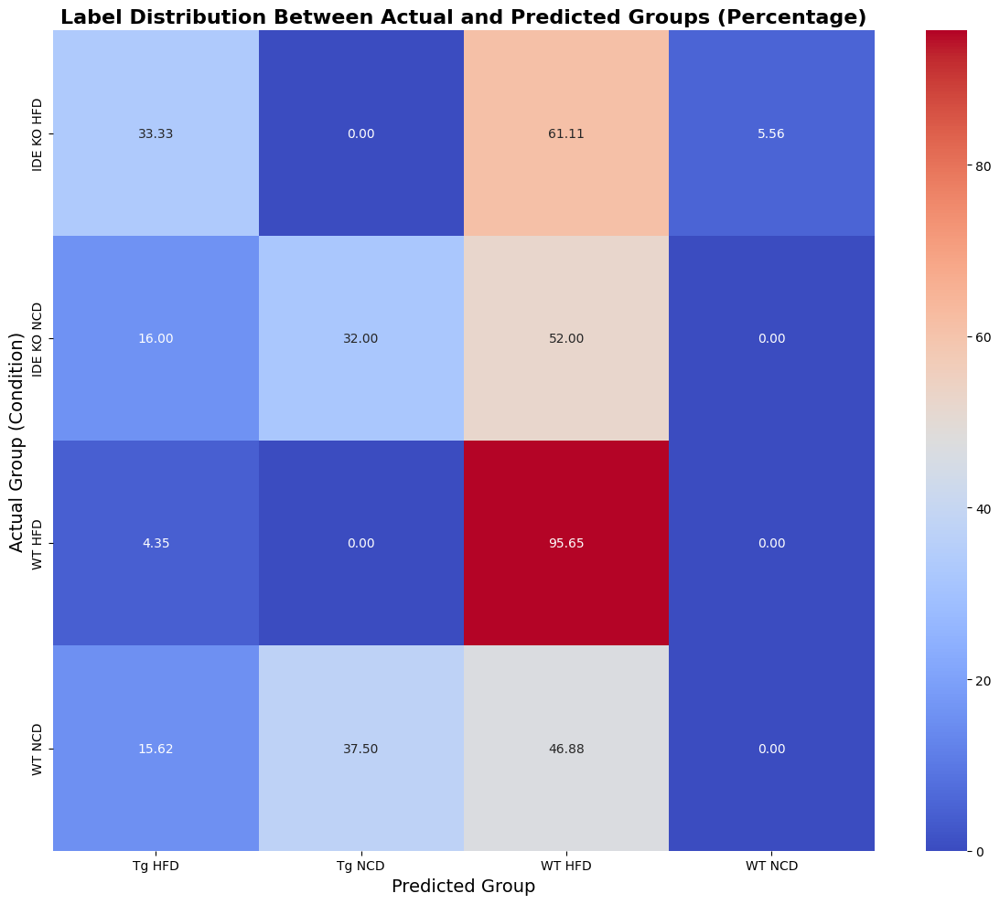


Confusion Table (Percentage):
Predicted Group     Tg HFD  Tg NCD     WT HFD    WT NCD
Group Name                                             
IDE KO HFD       33.333333     0.0  61.111111  5.555556
IDE KO NCD       16.000000    32.0  52.000000  0.000000
WT HFD            4.347826     0.0  95.652174  0.000000
WT NCD           15.625000    37.5  46.875000  0.000000

Chi-Square Test Results:
Chi-Square Statistic: 30.0235
P-Value: 4.3470e-04
Degrees of Freedom: 9

Heatmap saved at: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/ANN/IDE Test/label_distribution_heatmap_percentage.png
Statistical results saved at: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/ANN/IDE Test/statistical_results.xlsx


In [90]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
from statsmodels.stats.proportion import proportions_ztest

def label_stats(input_file, output_dir):
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Load the input file
    df = pd.read_excel(input_file)

    # Step 1: Extract group name from the Condition column
    df['Group Name'] = df['Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]))
    
    # Step 2: Extract unique group names from the Group Name column
    unique_groups_condition = df['Group Name'].unique().tolist()
    
    # Step 3: Extract unique group names from the Predicted Group column
    unique_groups_predicted = df['Predicted Group'].unique().tolist()
    
    # Step 4: Generate a table showing how many times each unique label from Group Name
    # was labeled as one of the unique groups in Predicted Group
    confusion_table = pd.crosstab(df['Group Name'], df['Predicted Group'])
    
    # Step 5: Convert counts to percentages
    percentage_table = confusion_table.div(confusion_table.sum(axis=1), axis=0) * 100

    # Step 6: Plot the percentage table as a heatmap
    plt.figure(figsize=(12, 10))
    sns.heatmap(percentage_table, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
    plt.title("Label Distribution Between Actual and Predicted Groups (Percentage)", fontsize=16, fontweight='bold')
    plt.xlabel("Predicted Group", fontsize=14)
    plt.ylabel("Actual Group (Condition)", fontsize=14)
    plt.tight_layout()

    # Save the heatmap
    heatmap_path = os.path.join(output_dir, "label_distribution_heatmap_percentage.png")
    plt.savefig(heatmap_path)
    plt.show()

    # Step 7: Chi-Square Test of Independence
    chi2, p, dof, expected = chi2_contingency(confusion_table)

    # Save the expected frequencies as a DataFrame
    expected_df = pd.DataFrame(expected, index=confusion_table.index, columns=confusion_table.columns)
    
    # Combine Chi-Square results into a DataFrame
    chi_square_results_df = pd.DataFrame({
        'Statistic': [chi2],
        'P-Value': [p],
        'Degrees of Freedom': [dof]
    })

    # Step 8: Proportion Z-Test for all combinations
    ztest_results = []
    for actual_group in confusion_table.index:
        for predicted_group in confusion_table.columns:
            observed_count = confusion_table.loc[actual_group, predicted_group]
            total_count = confusion_table.loc[actual_group].sum()
            if total_count == 0:  # Skip if no data for the actual group
                continue
            expected_proportion = 1 / len(confusion_table.columns)  # Equal chance among groups
            if expected_proportion == 0 or observed_count == 0:  # Skip if invalid proportions or counts
                continue

            # Perform proportion Z-test
            try:
                z_stat, z_pval = proportions_ztest(observed_count, total_count, value=expected_proportion)
                ztest_results.append({
                    'Actual Group': actual_group,
                    'Predicted Group': predicted_group,
                    'Observed Count': observed_count,
                    'Total Count': total_count,
                    'Observed Proportion': observed_count / total_count,
                    'Expected Proportion': expected_proportion,
                    'Z-Statistic': z_stat,
                    'P-Value': z_pval
                })
            except Exception as e:
                print(f"Error during Z-test for {actual_group} → {predicted_group}: {e}")

    ztest_results_df = pd.DataFrame(ztest_results)

    # Save results to an Excel file
    statistical_results_path = os.path.join(output_dir, "statistical_results.xlsx")
    with pd.ExcelWriter(statistical_results_path) as writer:
        expected_df.to_excel(writer, sheet_name="Expected Frequencies")
        chi_square_results_df.to_excel(writer, sheet_name="Chi-Square Test Results", index=False)
        ztest_results_df.to_excel(writer, sheet_name="Proportion Z-Test Results", index=False)

    # Print summary
    print("\nConfusion Table (Percentage):")
    print(percentage_table)
    
    print("\nChi-Square Test Results:")
    print(f"Chi-Square Statistic: {chi2:.4f}")
    print(f"P-Value: {p:.4e}")
    print(f"Degrees of Freedom: {dof}")
    
    print("\nHeatmap saved at:", heatmap_path)
    print("Statistical results saved at:", statistical_results_path)

    return unique_groups_condition, unique_groups_predicted, percentage_table, heatmap_path, statistical_results_path

# Example usage
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/ANN/IDE Test/36wo MW_clean_no_outliers_classresults.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/ANN/IDE Test'


unique_groups_condition, unique_groups_predicted, percentage_table, heatmap_path, statistical_results_path = label_stats(input_file, output_dir)

<h3 style="color: #B76E79;">Random Forest Classifier</h3>

#### Hyperparameter tuning with GridSearchCV  <span style="color:lightgreen">(Optimized)</span>

Fitting 5 folds for each of 162 candidates, totalling 810 fits
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=150; total time=   0.8s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=150; total time=   0.8s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=150; total time=   0.9s
[

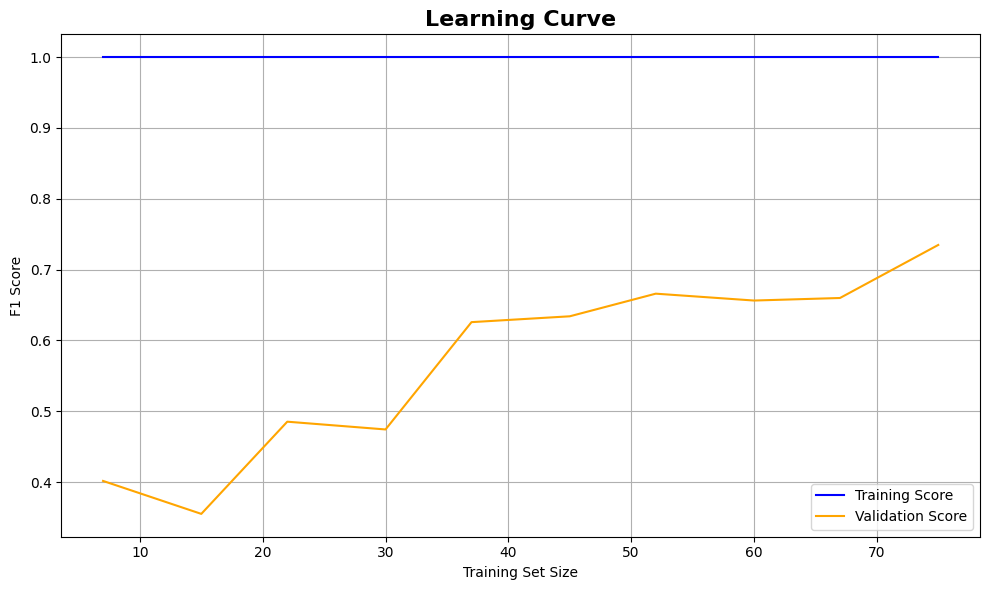

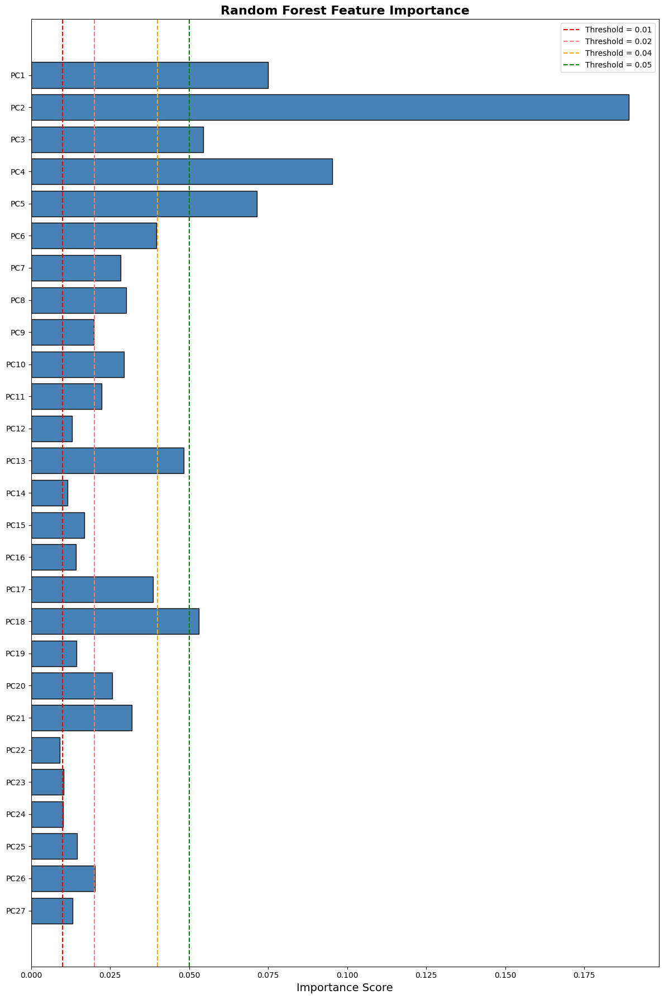

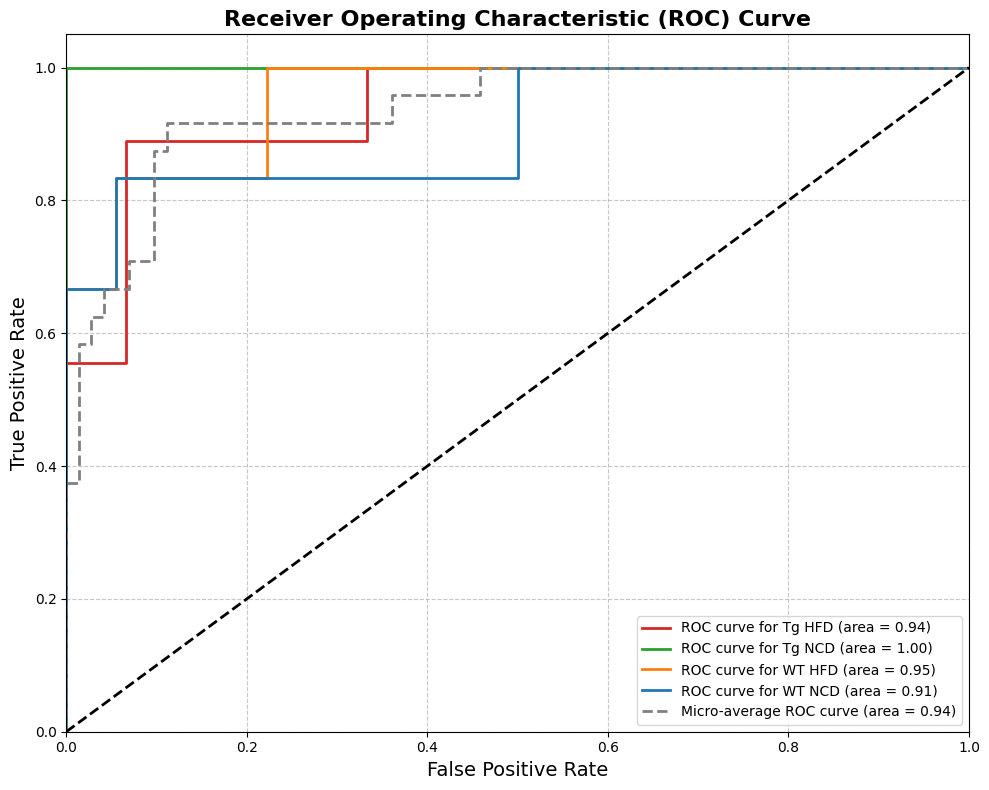

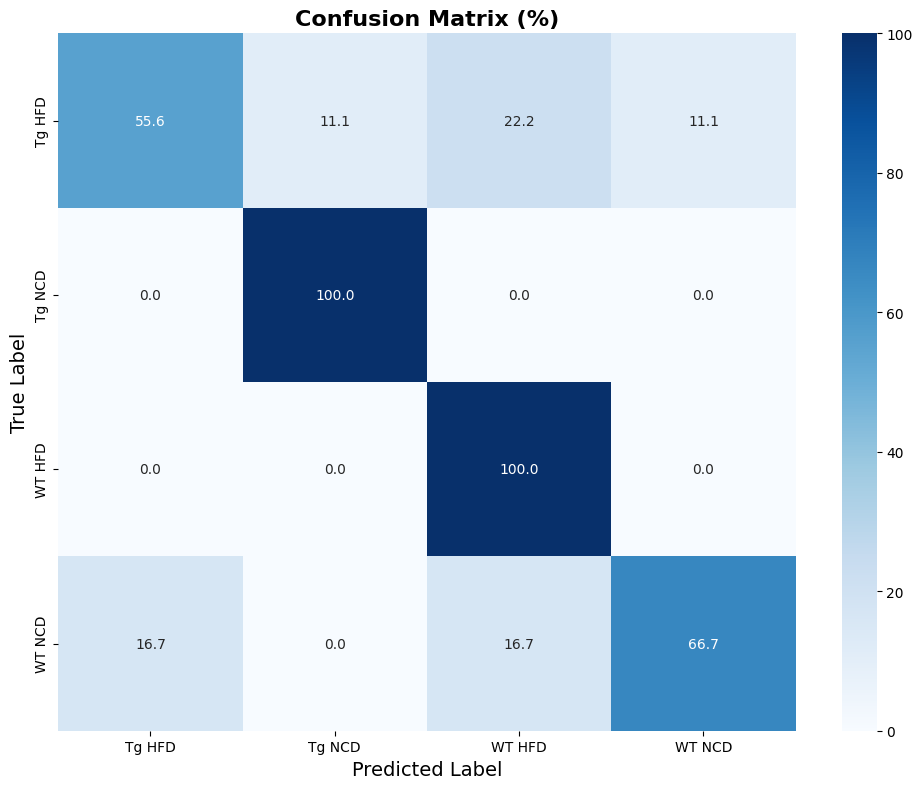

In [288]:
import pandas as pd
import numpy as np
import random
from sklearn.model_selection import train_test_split, GridSearchCV, learning_curve
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.tree import export_graphviz
import graphviz
from sklearn.preprocessing import label_binarize
from joblib import parallel_backend, dump
from sklearn.preprocessing import label_binarize
from sklearn.decomposition import PCA


def find_optimal_components(X, variance_threshold=0.95):
    pca = PCA()
    pca.fit(X)
    cumsum = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumsum >= variance_threshold) + 1
    return n_components


def random_forest_analysis_with_grid(input_file, output_dir, use_pca=False):
    # Set random seeds for reproducibility
    random.seed(42)
    np.random.seed(42)

    # Step 1: Load the data
    df = pd.read_excel(input_file)

    # Step 2: Pre-process the data
    features = df.drop(columns=['Condition']).dropna()  # Drop the 'Condition' column and remove rows with NaN
    target = df.loc[features.index, 'Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]))

    # Encode target labels
    label_encoder = LabelEncoder()
    target_encoded = label_encoder.fit_transform(target)

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(features, target_encoded, test_size=0.2, random_state=42)

    # Standardize the feature data
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Apply PCA if enabled
    pca = None
    if use_pca:
        n_components = find_optimal_components(X_train_scaled)
        pca = PCA(n_components=n_components)
        X_train_scaled = pca.fit_transform(X_train_scaled)
        X_test_scaled = pca.transform(X_test_scaled)
        
        pca_results = {
            'n_components': n_components,
            'explained_variance_ratio': pca.explained_variance_ratio_,
            'cumulative_variance': np.cumsum(pca.explained_variance_ratio_),
        }
        
        pd.DataFrame({
            'Explained Variance Ratio': pca.explained_variance_ratio_
        }).to_excel(os.path.join(output_dir, 'pca_results.xlsx'))

    # Save preprocessing objects
    preprocessing_objects = {
        'scaler': scaler,
        'label_encoder': label_encoder,
        'pca': pca if use_pca else None,
        'use_pca': use_pca
    }
    dump(preprocessing_objects, os.path.join(output_dir, 'preprocessing_objects.joblib'))

    # Step 3: Hyperparameter Tuning with GridSearchCV
    param_grid = {
        'n_estimators': [100, 150, 200],
        'max_depth': [10, 20, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'bootstrap': [True, False]
    }

    rf = RandomForestClassifier(random_state=42, class_weight='balanced')

    grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, 
                               scoring='f1_weighted', cv=5, n_jobs=-1, verbose=2)
    
    with parallel_backend('threading'):
        grid_search.fit(X_train_scaled, y_train)

    # Best model from GridSearchCV
    best_rf_model = grid_search.best_estimator_

    # Step 4: Evaluate the best model
    y_pred = best_rf_model.predict(X_test_scaled)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    print(f"Final Test Accuracy: {accuracy * 100:.2f}%")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1 Score: {f1:.2f}")

    # Save model settings and results
    settings = {
        "Model Type": "Random Forest Classifier",
        "Best Parameters": grid_search.best_params_,
        "Input Features": X_train_scaled.shape[1],
        "Final Test Accuracy": f"{accuracy * 100:.2f}%",
        "Precision": f"{precision:.2f}",
        "Recall": f"{recall:.2f}",
        "F1 Score": f"{f1:.2f}"
    }
    settings_df = pd.DataFrame(list(settings.items()), columns=['Setting', 'Value'])
    settings_df.to_excel(os.path.join(output_dir, 'random_forest_settings_and_results.xlsx'), index=False)

    # Step 5: Learning Curve
    train_sizes, train_scores, val_scores = learning_curve(
        best_rf_model, X_train_scaled, y_train, cv=5, scoring='f1_weighted', 
        n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10), random_state=42
    )
    train_scores_mean = np.mean(train_scores, axis=1)
    val_scores_mean = np.mean(val_scores, axis=1)

    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_scores_mean, label="Training Score", color="blue")
    plt.plot(train_sizes, val_scores_mean, label="Validation Score", color="orange")
    plt.title('Learning Curve', fontsize=16, fontweight='bold')
    plt.xlabel('Training Set Size')
    plt.ylabel('F1 Score')
    plt.legend(loc="best")
    plt.grid()
    plt.tight_layout()
    learning_curve_path = os.path.join(output_dir, 'random_forest_learning_curve.png')
    plt.savefig(learning_curve_path)
    print(f"Learning curve saved to {learning_curve_path}")

    # Step 6: Feature Importance Analysis
    feature_names = [f'PC{i+1}' for i in range(X_train_scaled.shape[1])] if use_pca else features.columns
    importances = best_rf_model.feature_importances_

    plt.figure(figsize=(12, 18))
    plt.barh(feature_names, importances, color='steelblue', edgecolor='black')
    plt.axvline(x=0.01, color='red', linestyle='--', linewidth=1.5, label='Threshold = 0.01')
    plt.axvline(x=0.02, color='lightcoral', linestyle='--', linewidth=1.5, label='Threshold = 0.02')
    plt.axvline(x=0.04, color='orange', linestyle='--', linewidth=1.5, label='Threshold = 0.04')
    plt.axvline(x=0.05, color='green', linestyle='--', linewidth=1.5, label='Threshold = 0.05')
    plt.xlabel('Importance Score', fontsize=14)
    plt.title('Random Forest Feature Importance', fontsize=16, fontweight='bold')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.legend()
    plot_path = os.path.join(output_dir, 'random_forest_feature_importance_plot.png')
    plt.savefig(plot_path)

    importance_df = pd.DataFrame({'Feature': feature_names, 'Importance Score': importances})
    importance_df['Above Threshold >0.01'] = importance_df['Importance Score'] > 0.01
    importance_df['Above Threshold >0.02'] = importance_df['Importance Score'] > 0.02
    importance_df['Above Threshold >0.04'] = importance_df['Importance Score'] > 0.04
    importance_df['Above Threshold >0.05'] = importance_df['Importance Score'] > 0.05
    table_path = os.path.join(output_dir, 'random_forest_feature_importance_table.xlsx')
    importance_df.to_excel(table_path, index=False)

    # Step 7: ROC Curve Analysis
    n_classes = len(label_encoder.classes_)
    
    y_test_bin = label_binarize(y_test, classes=np.arange(n_classes))
    y_pred_proba = best_rf_model.predict_proba(X_test_scaled)
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_proba[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_pred_proba.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    plt.figure(figsize=(10, 8))
    colors = {
        'WT NCD': plt.cm.tab10(0),
        'WT HFD': plt.cm.tab10(1),
        'Tg NCD': plt.cm.tab10(2),
        'Tg HFD': plt.cm.tab10(3)
    }
    
    for i, class_label in enumerate(label_encoder.classes_):
        color = colors.get(class_label, 'black')
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'ROC curve for {class_label} (area = {roc_auc[i]:.2f})')
    
    plt.plot(fpr["micro"], tpr["micro"], color='gray', linestyle='--', lw=2,
             label=f'Micro-average ROC curve (area = {roc_auc["micro"]:.2f})')
    
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=14)
    plt.ylabel('True Positive Rate', fontsize=14)
    plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=16, fontweight='bold')
    plt.legend(loc="lower right")
    plt.grid(axis='both', linestyle='--', alpha=0.7)
    plt.tight_layout()
    
    roc_curve_path = os.path.join(output_dir, 'random_forest_roc_curve.png')
    plt.savefig(roc_curve_path)
    print(f"ROC curve plot saved to {roc_curve_path}")

    # Step 8: Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues', 
                xticklabels=label_encoder.classes_, 
                yticklabels=label_encoder.classes_)
    plt.xlabel('Predicted Label', fontsize=14)
    plt.ylabel('True Label', fontsize=14)
    plt.title('Confusion Matrix (%)', fontsize=16, fontweight='bold')
    plt.tight_layout()

    confusion_matrix_path = os.path.join(output_dir, 'random_forest_confusion_matrix.png')
    plt.savefig(confusion_matrix_path)
    print(f"Confusion matrix plot saved to {confusion_matrix_path}")

    # Step 9: Decision Tree Visualization
    single_tree = best_rf_model.estimators_[0]
    tree_dot_path = os.path.join(output_dir, 'random_forest_tree.dot')
    
    # Use PCA feature names if PCA is enabled
    feature_names = [f'PC{i+1}' for i in range(X_train_scaled.shape[1])] if use_pca else features.columns
    
    export_graphviz(single_tree, 
                    out_file=tree_dot_path, 
                    filled=True, 
                    rounded=True,
                    feature_names=feature_names, 
                    class_names=label_encoder.classes_)
    
    graph = graphviz.Source.from_file(tree_dot_path)
    tree_png_path = os.path.join(output_dir, 'random_forest_tree_plot.png')
    graph.render(filename=tree_png_path.replace('.png', ''), format='png', cleanup=True)
    print(f"Decision tree visualization saved to {tree_png_path}")

    # Step 10: Classify unlabelled data
    def classify_unlabelled_data(unlabelled_file=None, output_file=None):
        if not unlabelled_file or not output_file:
            print("Unlabelled file or output file path not provided. Skipping classification.")
            return
    
        unlabelled_df = pd.read_excel(unlabelled_file)
        unlabelled_df = unlabelled_df.dropna()
        unlabelled_features = unlabelled_df.drop(columns=['Condition'])
        
        # Apply preprocessing steps
        unlabelled_scaled = preprocessing_objects['scaler'].transform(unlabelled_features)
        
        # Apply PCA if it was used in training
        if preprocessing_objects['use_pca'] and preprocessing_objects['pca'] is not None:
            unlabelled_scaled = preprocessing_objects['pca'].transform(unlabelled_scaled)
    
        predictions = best_rf_model.predict_proba(unlabelled_scaled)
        predicted_classes = np.argmax(predictions, axis=1)
        predicted_labels = preprocessing_objects['label_encoder'].inverse_transform(predicted_classes)
    
        if len(predicted_labels) != len(unlabelled_features):
            raise ValueError(
                f"Mismatch between predictions ({len(predicted_labels)}) and rows in the input ({len(unlabelled_features)})."
            )
    
        unlabelled_df = unlabelled_df.iloc[:len(predicted_labels)]
        unlabelled_df['Predicted Group'] = predicted_labels
        unlabelled_df.to_excel(output_file, index=False)
        print(f"Unlabelled data classification results saved to {output_file}")

    return classify_unlabelled_data


# Example usage
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/36wo MW_clean_no_outliers_median.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/ML/Pre-PCA/RF'

# Run the analysis and retrieve the classification function
classify_unlabelled_data = random_forest_analysis_with_grid(input_file, output_dir,use_pca=True)

In [94]:
### Test the model

# Classify unlabelled data
unlabelled_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/ANN/IDE Test/IDE males MW_clean_no_outliers.xlsx'
output_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/RF/Raw/36wo MW_clean_no_outliers_classresults_IDE.xlsx'
classify_unlabelled_data(unlabelled_file, output_file)

Unlabelled data classification results saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/RF/Raw/36wo MW_clean_no_outliers_classresults_IDE.xlsx


#### Hyperparameter tuning with RandomSearchCV

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150; total time=   0.6s
[CV] END bootstrap=False, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150; total time=   0.3s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150; total time=   0.3s
[CV] END bootstrap=False, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END bootstrap=False, max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total 

(<module 'matplotlib.pyplot' from '/Users/louis/opt/anaconda3/lib/python3.9/site-packages/matplotlib/pyplot.py'>,
                      Feature  Importance Score  Above Threshold
 0                      Speed          0.011715            False
 1      Duty_factor_Residuals          0.012033            False
 2     Single_swing_Residuals          0.014492            False
 3   Diagonal_swing_Residuals          0.059936             True
 4              Lateral_swing          0.026393             True
 ..                       ...               ...              ...
 71                   Area_RH          0.017148            False
 72                  Press_LF          0.005874            False
 73                  Press_LH          0.004744            False
 74                  Press_RF          0.015732            False
 75        Press_RH_Residuals          0.031222             True
 
 [76 rows x 3 columns],
 <graphviz.sources.Source at 0x329eec0a0>)

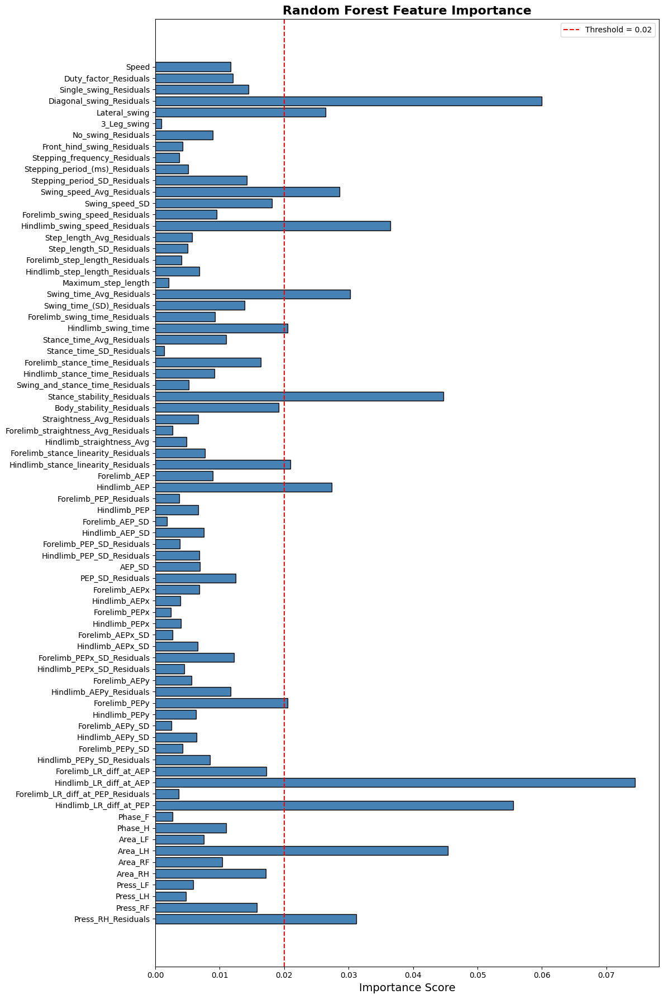

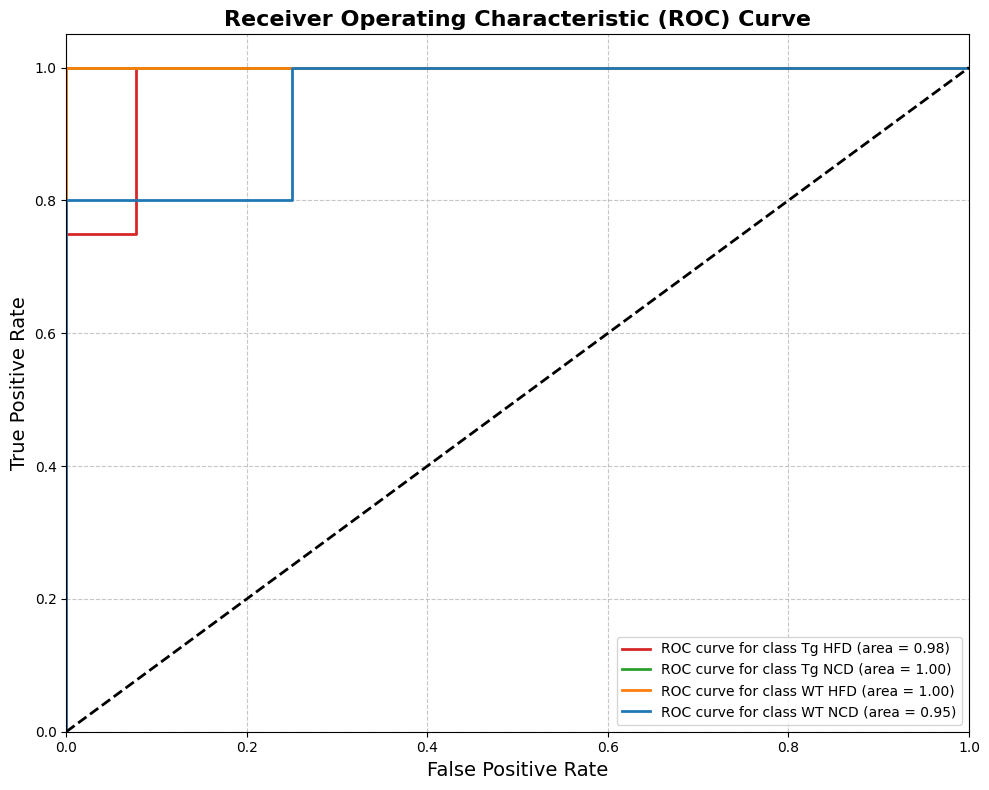

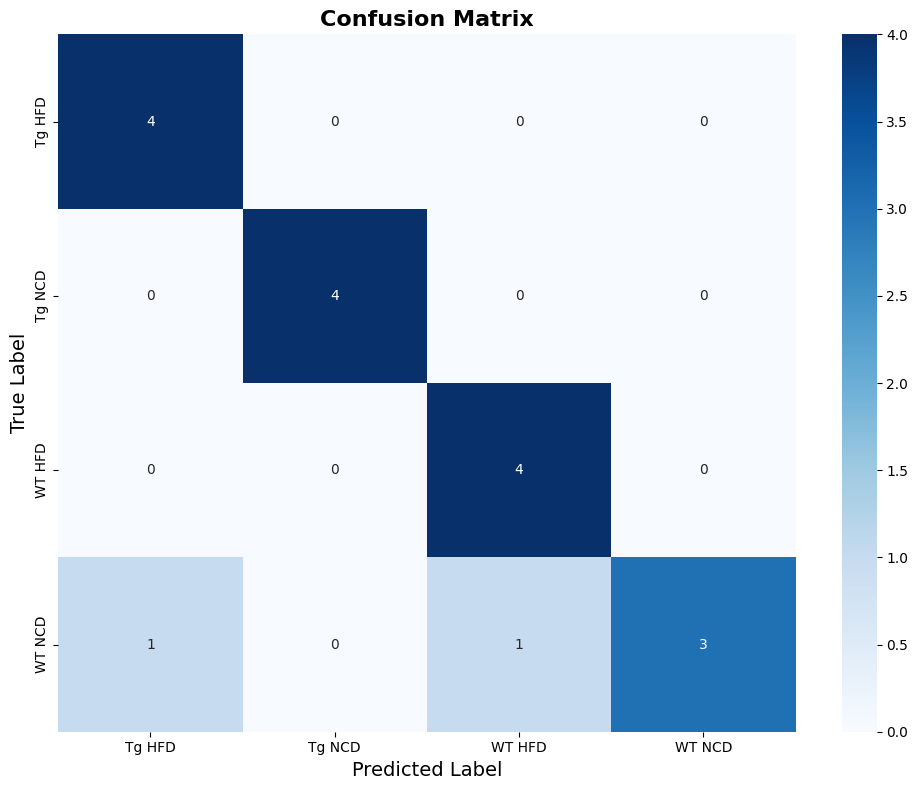

In [385]:
import pandas as pd
import numpy as np
import random
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.tree import export_graphviz
import graphviz
from itertools import cycle
from sklearn.preprocessing import label_binarize
from joblib import parallel_backend


def random_forest_analysis(input_file, output_dir):
    # Set random seeds for reproducibility
    random.seed(42)
    np.random.seed(42)

    # Step 1: Load the data
    df = pd.read_excel(input_file)

    # Step 2: Pre-process the data
    # Drop rows with NaN values
    features = df.drop(columns=['Condition']).dropna()  # Drop the 'condition' column and remove rows with NaN

    # Extract group names from the condition column
    target = df.loc[features.index, 'Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]))

    # Encode target labels
    label_encoder = LabelEncoder()
    target_encoded = label_encoder.fit_transform(target)

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(features, target_encoded, test_size=0.2, random_state=42)

    # Standardize the feature data
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Step 3: Hyperparameter Tuning with RandomizedSearchCV
    param_dist = {
        'n_estimators': [50, 100, 150, 200, 250],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'bootstrap': [True, False]
    }

    rf = RandomForestClassifier(random_state=42, class_weight='balanced')

    # Randomized Search with 20 iterations
    random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_dist, n_iter=20, 
                                       scoring='f1_weighted', cv=5, n_jobs=-1, random_state=42, verbose=2)
    with parallel_backend('threading'):
        random_search.fit(X_train_scaled, y_train)

    # Best model from RandomizedSearchCV
    best_rf_model = random_search.best_estimator_

    # Step 4: Evaluate the best model
    y_pred = best_rf_model.predict(X_test_scaled)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Print evaluation metrics
    print(f"Final Test Accuracy: {accuracy * 100:.2f}%")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1 Score: {f1:.2f}")

    # Save model settings and results
    settings = {
        "Model Type": "Random Forest Classifier",
        "Best Parameters": random_search.best_params_,
        "Input Features": X_train_scaled.shape[1],
        "Final Test Accuracy": f"{accuracy * 100:.2f}%",
        "Precision": f"{precision:.2f}",
        "Recall": f"{recall:.2f}",
        "F1 Score": f"{f1:.2f}"
    }
    settings_df = pd.DataFrame(list(settings.items()), columns=['Setting', 'Value'])
    settings_df.to_excel(os.path.join(output_dir, 'random_forest_settings_and_results.xlsx'), index=False)

    # Step 5: Feature Importance Analysis
    feature_names = features.columns
    importances = best_rf_model.feature_importances_

    # Plot feature importance
    plt.figure(figsize=(12, 18))
    plt.barh(feature_names, importances, color='steelblue', edgecolor='black')
    plt.axvline(x=0.02, color='red', linestyle='--', linewidth=1.5, label='Threshold = 0.02')
    plt.xlabel('Importance Score', fontsize=14)
    plt.title('Random Forest Feature Importance', fontsize=16, fontweight='bold')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.legend()
    plot_path = os.path.join(output_dir, 'random_forest_feature_importance_plot.png')
    plt.savefig(plot_path)

    # Save feature importance table with threshold information
    threshold = 0.02
    importance_df = pd.DataFrame({'Feature': feature_names, 'Importance Score': importances})
    importance_df['Above Threshold'] = importance_df['Importance Score'] > threshold
    table_path = os.path.join(output_dir, 'random_forest_feature_importance_table.xlsx')
    importance_df.to_excel(table_path, index=False)

    # Step 6: ROC Curve Analysis
    y_test_bin = label_binarize(y_test, classes=np.arange(len(label_encoder.classes_)))
    y_pred_prob = best_rf_model.predict_proba(X_test_scaled)

    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    n_classes = y_test_bin.shape[1]

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Define specific colors for each class from the tab10 palette
    color_mapping = {
        'WT NCD': plt.cm.tab10(0),  # Blue
        'WT HFD': plt.cm.tab10(1),  # Orange
        'Tg NCD': plt.cm.tab10(2),  # Green
        'Tg HFD': plt.cm.tab10(3)   # Red
    }

    # Plot ROC curves with specified colors
    plt.figure(figsize=(10, 8))
    for i, class_label in enumerate(label_encoder.classes_):
        color = color_mapping[class_label]
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'ROC curve for class {class_label} (area = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=14)
    plt.ylabel('True Positive Rate', fontsize=14)
    plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=16, fontweight='bold')
    plt.legend(loc="lower right")
    plt.grid(axis='both', linestyle='--', alpha=0.7)
    plt.tight_layout()

    roc_curve_path = os.path.join(output_dir, 'random_forest_roc_curve.png')
    plt.savefig(roc_curve_path)
    print(f"ROC curve plot saved to {roc_curve_path}")

    # Step 7: Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
    plt.xlabel('Predicted Label', fontsize=14)
    plt.ylabel('True Label', fontsize=14)
    plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
    plt.tight_layout()

    confusion_matrix_path = os.path.join(output_dir, 'random_forest_confusion_matrix.png')
    plt.savefig(confusion_matrix_path)
    print(f"Confusion matrix plot saved to {confusion_matrix_path}")

    # Step 8: Plot a single decision tree
    estimator = best_rf_model.estimators_[0]

    # Export the tree as a dot file
    dot_data = export_graphviz(estimator, out_file=None, feature_names=feature_names,
                               class_names=label_encoder.classes_, filled=True, rounded=True,
                               special_characters=True)
    graph = graphviz.Source(dot_data)
    tree_plot_path = os.path.join(output_dir, 'random_forest_tree_plot')
    graph.render(tree_plot_path, format='png')

    return plt, importance_df, graph


# Example usage
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/car_values_norm.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v3/RF_CAR'
random_forest_analysis(input_file, output_dir)


#### CCP - Confusion matrix, Chi-Square Test of independence, Proportion Z-test

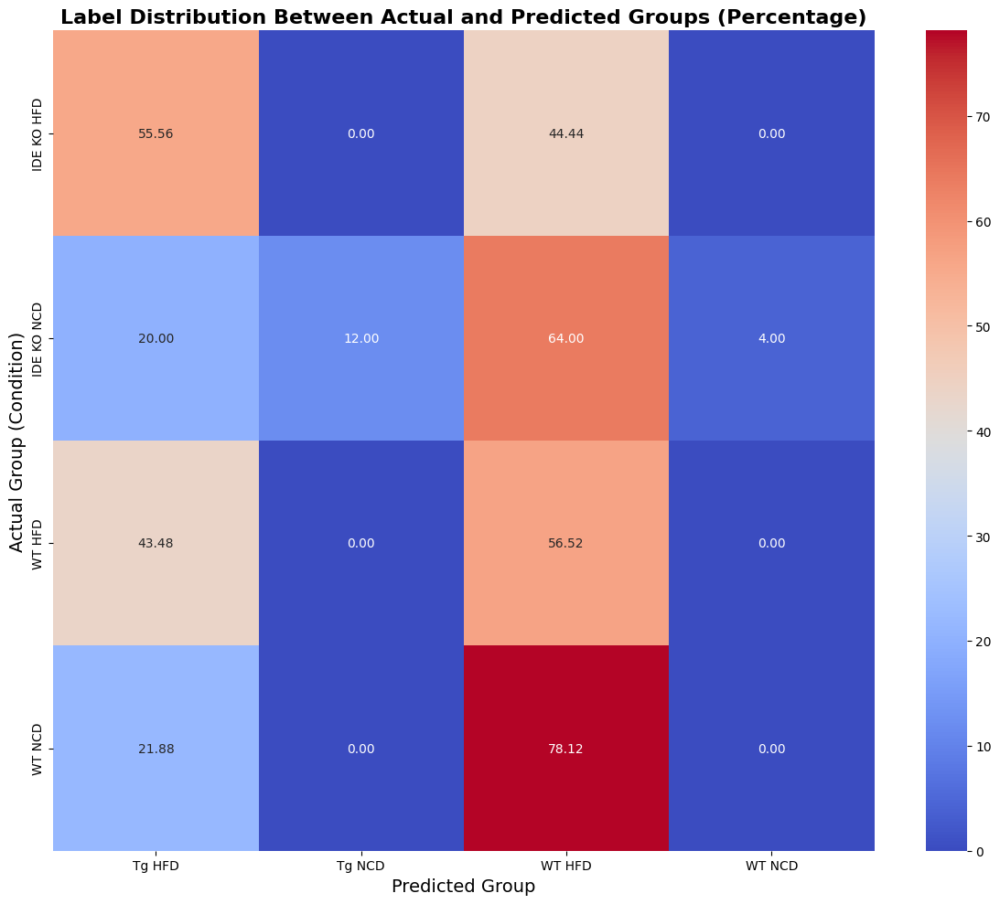


Confusion Table (Percentage):
Predicted Group     Tg HFD  Tg NCD     WT HFD  WT NCD
Group Name                                           
IDE KO HFD       55.555556     0.0  44.444444     0.0
IDE KO NCD       20.000000    12.0  64.000000     4.0
WT HFD           43.478261     0.0  56.521739     0.0
WT NCD           21.875000     0.0  78.125000     0.0

Chi-Square Test Results:
Chi-Square Statistic: 20.0532
P-Value: 1.7587e-02
Degrees of Freedom: 9

Heatmap saved at: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/RF/Raw/IDE/label_distribution_heatmap_percentage.png
Statistical results saved at: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/RF/Raw/IDE/statistical_results.xlsx


In [163]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
from statsmodels.stats.proportion import proportions_ztest

def label_stats(input_file, output_dir):
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Load the input file
    df = pd.read_excel(input_file)

    # Step 1: Extract group name from the Condition column
    df['Group Name'] = df['Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]))
    
    # Step 2: Extract unique group names from the Group Name column
    unique_groups_condition = df['Group Name'].unique().tolist()
    
    # Step 3: Extract unique group names from the Predicted Group column
    unique_groups_predicted = df['Predicted Group'].unique().tolist()
    
    # Step 4: Generate a table showing how many times each unique label from Group Name
    # was labeled as one of the unique groups in Predicted Group
    confusion_table = pd.crosstab(df['Group Name'], df['Predicted Group'])
    
    # Step 5: Convert counts to percentages
    percentage_table = confusion_table.div(confusion_table.sum(axis=1), axis=0) * 100

    # Step 6: Plot the percentage table as a heatmap
    plt.figure(figsize=(12, 10))
    sns.heatmap(percentage_table, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
    plt.title("Label Distribution Between Actual and Predicted Groups (Percentage)", fontsize=16, fontweight='bold')
    plt.xlabel("Predicted Group", fontsize=14)
    plt.ylabel("Actual Group (Condition)", fontsize=14)
    plt.tight_layout()

    # Save the heatmap
    heatmap_path = os.path.join(output_dir, "label_distribution_heatmap_percentage.png")
    plt.savefig(heatmap_path)
    plt.show()

    # Step 7: Chi-Square Test of Independence
    chi2, p, dof, expected = chi2_contingency(confusion_table)

    # Save the expected frequencies as a DataFrame
    expected_df = pd.DataFrame(expected, index=confusion_table.index, columns=confusion_table.columns)
    
    # Combine Chi-Square results into a DataFrame
    chi_square_results_df = pd.DataFrame({
        'Statistic': [chi2],
        'P-Value': [p],
        'Degrees of Freedom': [dof]
    })

    # Step 8: Proportion Z-Test for all combinations
    ztest_results = []
    for actual_group in confusion_table.index:
        for predicted_group in confusion_table.columns:
            observed_count = confusion_table.loc[actual_group, predicted_group]
            total_count = confusion_table.loc[actual_group].sum()
            if total_count == 0:  # Skip if no data for the actual group
                continue
            expected_proportion = 1 / len(confusion_table.columns)  # Equal chance among groups
            if expected_proportion == 0 or observed_count == 0:  # Skip if invalid proportions or counts
                continue

            # Perform proportion Z-test
            try:
                z_stat, z_pval = proportions_ztest(observed_count, total_count, value=expected_proportion)
                ztest_results.append({
                    'Actual Group': actual_group,
                    'Predicted Group': predicted_group,
                    'Observed Count': observed_count,
                    'Total Count': total_count,
                    'Observed Proportion': observed_count / total_count,
                    'Expected Proportion': expected_proportion,
                    'Z-Statistic': z_stat,
                    'P-Value': z_pval
                })
            except Exception as e:
                print(f"Error during Z-test for {actual_group} → {predicted_group}: {e}")

    ztest_results_df = pd.DataFrame(ztest_results)

    # Save results to an Excel file
    statistical_results_path = os.path.join(output_dir, "statistical_results.xlsx")
    with pd.ExcelWriter(statistical_results_path) as writer:
        expected_df.to_excel(writer, sheet_name="Expected Frequencies")
        chi_square_results_df.to_excel(writer, sheet_name="Chi-Square Test Results", index=False)
        ztest_results_df.to_excel(writer, sheet_name="Proportion Z-Test Results", index=False)

    # Print summary
    print("\nConfusion Table (Percentage):")
    print(percentage_table)
    
    print("\nChi-Square Test Results:")
    print(f"Chi-Square Statistic: {chi2:.4f}")
    print(f"P-Value: {p:.4e}")
    print(f"Degrees of Freedom: {dof}")
    
    print("\nHeatmap saved at:", heatmap_path)
    print("Statistical results saved at:", statistical_results_path)

    return unique_groups_condition, unique_groups_predicted, percentage_table, heatmap_path, statistical_results_path

# Example usage
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/RF/Raw/IDE/36wo MW_clean_no_outliers_classresults_IDE.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/RF/Raw/IDE'


unique_groups_condition, unique_groups_predicted, percentage_table, heatmap_path, statistical_results_path = label_stats(input_file, output_dir)

<h3 style="color: #8601F6;">K Nearest Neighbours</h3>

Optimal n_neighbors: 3
Effective metric: euclidean
Algorithm used: brute


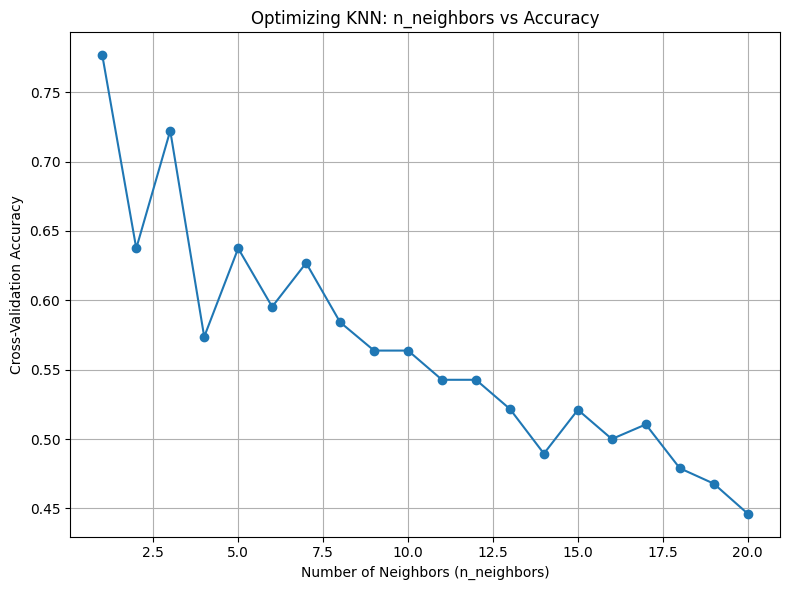

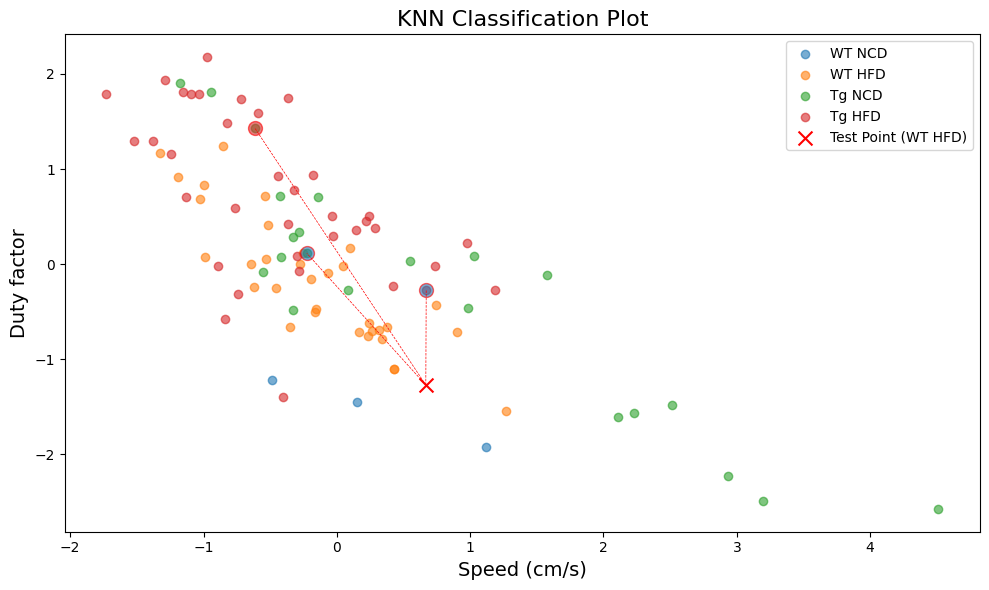

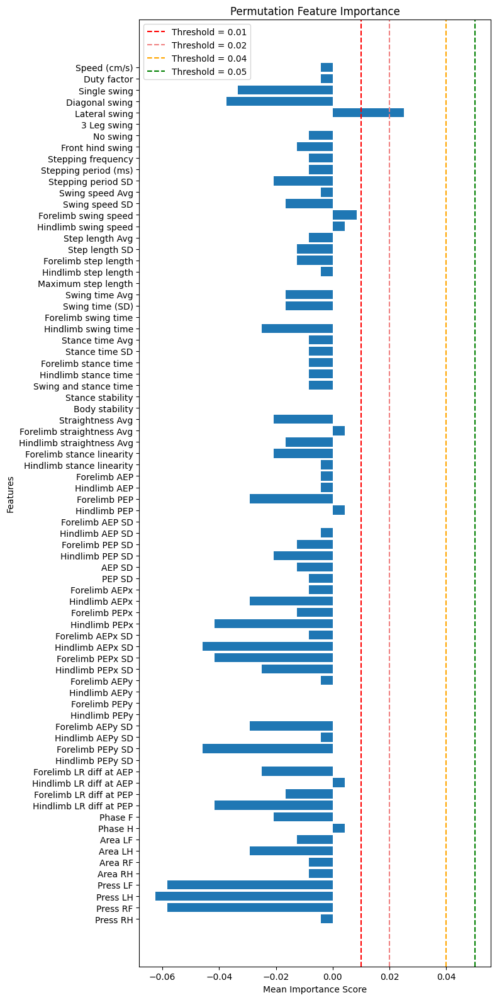

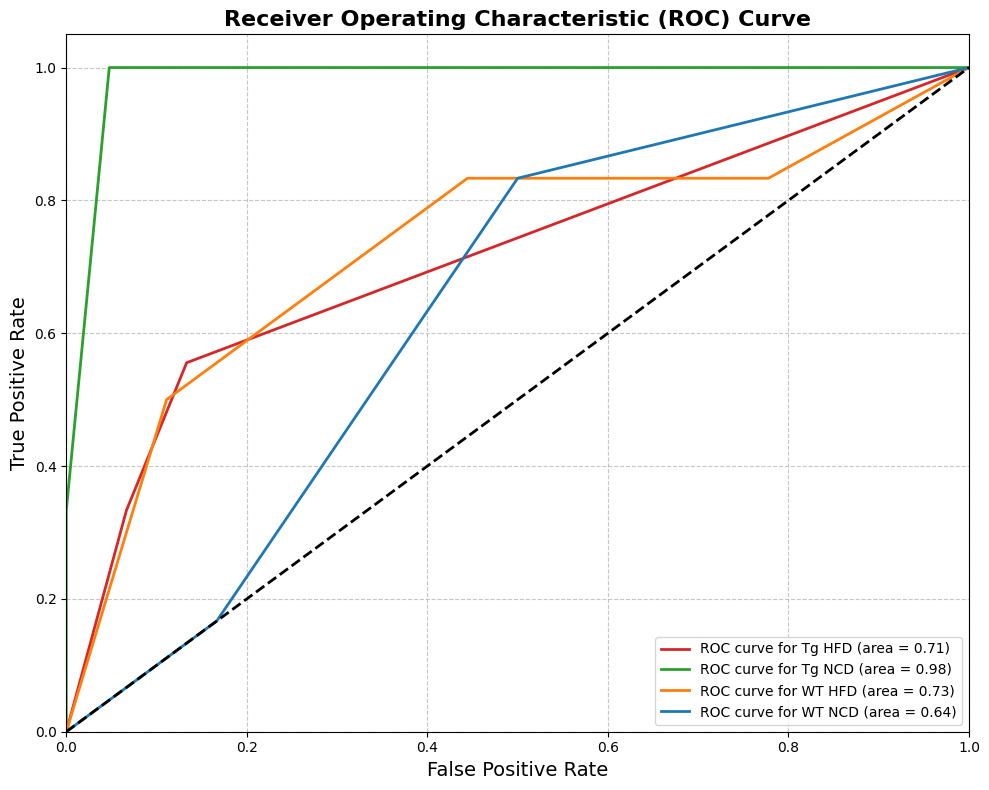

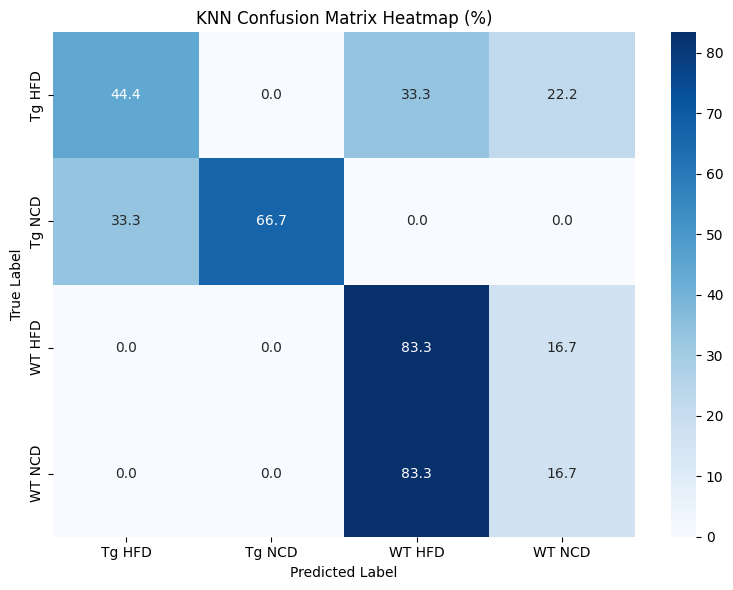

In [290]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, auc
from sklearn.inspection import permutation_importance
from sklearn.preprocessing import LabelBinarizer, label_binarize
from sklearn.decomposition import PCA
from joblib import dump, load
import seaborn as sns
import os

def find_optimal_components(X, variance_threshold=0.95):
    pca = PCA()
    pca.fit(X)
    cumsum = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumsum >= variance_threshold) + 1
    return n_components

def knn_analysis_optimized(input_file, output_dir, use_pca=False):
    # Load data
    df = pd.read_excel(input_file)
    df = df.dropna()
    df['Group'] = df['Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]))

    # Features and target
    X = df.drop(columns=['Condition', 'Group'])
    y = df['Group']

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Apply PCA if enabled
    pca = None
    if use_pca:
        n_components = find_optimal_components(X_scaled)
        pca = PCA(n_components=n_components)
        X_scaled = pca.fit_transform(X_scaled)
        
        # Save PCA results
        pca_results = {
            'n_components': pca.n_components_,
            'explained_variance_ratio': pca.explained_variance_ratio_,
            'cumulative_variance': np.cumsum(pca.explained_variance_ratio_)
        }
        pd.DataFrame(pca_results).to_excel(os.path.join(output_dir, 'pca_results.xlsx'))

    # Save preprocessing objects
    preprocessing_objects = {
        'scaler': scaler,
        'pca': pca,
        'use_pca': use_pca
    }
    dump(preprocessing_objects, os.path.join(output_dir, 'preprocessing_objects.joblib'))

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

    y_train = y_train.reset_index(drop=True) 
    y_test = y_test.reset_index(drop=True)

    # Optimize n_neighbors using cross-validation
    neighbors_range = range(1, 21)
    cv_scores = []

    for n in neighbors_range:
        knn = KNeighborsClassifier(n_neighbors=n, algorithm='auto')
        scores = cross_val_score(knn, X_train, y_train, cv=5)
        cv_scores.append(scores.mean())

    optimal_n = 3
    print(f"Optimal n_neighbors: {optimal_n}")

    # Train KNN model with optimal n_neighbors
    knn = KNeighborsClassifier(n_neighbors=optimal_n, algorithm='auto')
    knn.fit(X_train, y_train)

    print("Effective metric:", knn.effective_metric_)
    print("Algorithm used:", knn._fit_method)    

    y_pred = knn.predict(X_test)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, output_dict=True)
    precision = report['weighted avg']['precision']
    recall = report['weighted avg']['recall']
    f1 = report['weighted avg']['f1-score']
    confusion = confusion_matrix(y_test, y_pred)

    # Save settings and results
    settings = {
        "Model Type": "KNN",
        "Best Parameters": {"n_neighbors": optimal_n},
        "Input Features": X_train.shape[1],
        "Final Test Accuracy": f"{accuracy * 100:.2f}%",
        "Precision": f"{precision:.2f}",
        "Recall": f"{recall:.2f}",
        "F1 Score": f"{f1:.2f}"
    }
    settings_df = pd.DataFrame(list(settings.items()), columns=['Setting', 'Value'])
    settings_df.to_excel(os.path.join(output_dir, 'knn_settings_and_results.xlsx'), index=False)

    # Cross-validation plot
    plt.figure(figsize=(8, 6))
    plt.plot(neighbors_range, cv_scores, marker='o')
    plt.xlabel('Number of Neighbors (n_neighbors)')
    plt.ylabel('Cross-Validation Accuracy')
    plt.title('Optimizing KNN: n_neighbors vs Accuracy')
    plt.grid()
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, 'knn_optimization_plot.png'))

    # Create masks for train/test sets
    test_mask = np.zeros(len(y), dtype=bool)
    test_mask[y_test.index] = True
    train_mask = ~test_mask
    
    # Determine features for plotting
    if use_pca:
        feature_x = 'PC1'
        feature_y = 'PC2'
        X_plot = X_scaled[:, :2]
    else:
        # Use the first two feature names directly from the original dataset
        feature_x = X.columns[0]
        feature_y = X.columns[1]
        X_plot = X_scaled[:, :2]
    
    # Create scatter plot
    plt.figure(figsize=(10, 6))
    palette = plt.get_cmap('tab10')
    colors = {'WT NCD': palette(0), 'WT HFD': palette(1), 
              'Tg NCD': palette(2), 'Tg HFD': palette(3)}
    
    # Plot all points
    for group in y.unique():
        group_mask = y == group
        plt.scatter(X_plot[group_mask & train_mask, 0], 
                    X_plot[group_mask & train_mask, 1],
                    label=group, color=colors.get(group, 'tab:gray'), alpha=0.6)
    
    # Highlight test point
    test_point = X_plot[test_mask][0]
    test_label = y_test.iloc[0]
    plt.scatter(test_point[0], test_point[1], color='red', marker='x', s=100,
                label=f'Test Point ({test_label})')
    
    # Plot neighbors
    neighbors = knn.kneighbors([X_test[0]], return_distance=False)
    for neighbor in neighbors[0]:
        neighbor_point = X_plot[train_mask][neighbor]
        neighbor_label = y_train.iloc[neighbor]
        plt.scatter(neighbor_point[0], neighbor_point[1],
                    color=colors.get(neighbor_label, 'tab:gray'),
                    edgecolor='red', s=100, alpha=0.6)
        plt.plot([test_point[0], neighbor_point[0]], 
                 [test_point[1], neighbor_point[1]], 'r--', lw=0.5)
    
    # Add axis labels and title
    plt.xlabel(feature_x, fontsize=14)
    plt.ylabel(feature_y, fontsize=14)
    plt.title('KNN Classification Plot', fontsize=16)
    plt.legend(loc='best')
    plt.tight_layout()
    
    # Save the plot
    plt.savefig(os.path.join(output_dir, 'knn_neighbors_plot_dynamic_axis.png'))

    # Feature names and importance
    feature_names = [f'PC{i+1}' for i in range(X_scaled.shape[1])] if use_pca else X.columns
    perm_importance = permutation_importance(knn, X_test, y_test, n_repeats=10, random_state=42)
    importances = perm_importance.importances_mean

    plt.figure(figsize=(8, 16))
    plt.barh(feature_names, importances, color=palette(0))
    plt.axvline(x=0.01, color='red', linestyle='--', linewidth=1.5, label='Threshold = 0.01')
    plt.axvline(x=0.02, color='lightcoral', linestyle='--', linewidth=1.5, label='Threshold = 0.02')
    plt.axvline(x=0.04, color='orange', linestyle='--', linewidth=1.5, label='Threshold = 0.04')
    plt.axvline(x=0.05, color='green', linestyle='--', linewidth=1.5, label='Threshold = 0.05')
    plt.xlabel('Mean Importance Score')
    plt.ylabel('Features')
    plt.title('Permutation Feature Importance')
    plt.tight_layout()
    plt.legend()
    plt.gca().invert_yaxis()
    plt.savefig(os.path.join(output_dir, 'knn_permutation_feature_importance_vertical.png'))

    # Save importance scores
    perm_importance_df = pd.DataFrame({
        'Feature': feature_names, 
        'Mean Importance Score': importances,
        'Above Threshold >0.01': importances > 0.01,
        'Above Threshold >0.02': importances > 0.02,
        'Above Threshold >0.04': importances > 0.04,
        'Above Threshold >0.05': importances > 0.05
    })
    perm_importance_df.to_excel(os.path.join(output_dir, 'knn_permutation_feature_importance.xlsx'), index=False)

    # ROC curves
    classes = knn.classes_
    n_classes = len(classes)
    y_test_bin = label_binarize(y_test, classes=classes)
    y_pred_prob = knn.predict_proba(X_test)
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    
    plt.figure(figsize=(10, 8))
    for i, class_label in enumerate(classes):
        color = colors.get(class_label, 'gray')
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'ROC curve for {class_label} (area = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=14)
    plt.ylabel('True Positive Rate', fontsize=14)
    plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=16, fontweight='bold')
    plt.legend(loc="lower right")
    plt.grid(axis='both', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, 'KNN_roc_curve.png'))

    # Confusion Matrix
    cm_percentage = confusion * 100 / confusion.sum(axis=1)[:, np.newaxis]
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_percentage, annot=True, fmt='.1f', cmap='Blues', 
                xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
    plt.title("KNN Confusion Matrix Heatmap (%)")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, 'knn_confusion_matrix_heatmap_percentage.png'))

    def classify_unlabelled_data(knn_model, preprocessing_objects, unlabelled_file, output_file):
        if not all([knn_model, preprocessing_objects, unlabelled_file, output_file]):
            print("Missing required inputs. Skipping classification.")
            return
        
        try:
            unlabelled_df = pd.read_excel(unlabelled_file)
            unlabelled_df = unlabelled_df.dropna()
            
            unlabelled_features = unlabelled_df.drop(columns=['Condition']) if 'Condition' in unlabelled_df.columns else unlabelled_df.copy()
            
            if preprocessing_objects['use_pca']:
                expected_features = preprocessing_objects['scaler'].n_features_in_
            else:
                expected_features = preprocessing_objects['scaler'].n_features_in_
                
            if unlabelled_features.shape[1] != expected_features:
                raise ValueError(f"Expected {expected_features} features, got {unlabelled_features.shape[1]}")

            unlabelled_scaled = preprocessing_objects['scaler'].transform(unlabelled_features)
            
            if preprocessing_objects['use_pca'] and preprocessing_objects['pca'] is not None:
                unlabelled_scaled = preprocessing_objects['pca'].transform(unlabelled_scaled)
            
            predicted_labels = knn_model.predict(unlabelled_scaled)
            unlabelled_df['Predicted Group'] = predicted_labels
            unlabelled_df.to_excel(output_file, index=False)
            print(f"Classification complete. Results saved to {output_file}")
            
        except Exception as e:
            print(f"Error during classification: {str(e)}")

    return knn, preprocessing_objects


# Example usage
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/36wo MW_clean_no_outliers_median.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/ML/Raw/KNN'

# Train KNN model and get preprocessing objects
knn_model, preprocessing_objects = knn_analysis_optimized(input_file, output_dir, use_pca=False)

In [159]:
# Classify unlabelled data
unlabelled_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/ANN/IDE Test/IDE males MW_clean_no_outliers.xlsx'
output_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/KNN/Raw/IDE males MW_clean_no_outliers_classresults.xlsx'

classify_unlabelled_data(knn_model, scaler, unlabelled_file, output_file)

Unlabelled data classification results saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/KNN/Raw/IDE males MW_clean_no_outliers_classresults.xlsx


#### CCP - Confusion matrix, Chi-Square Test of independence, Proportion Z-test

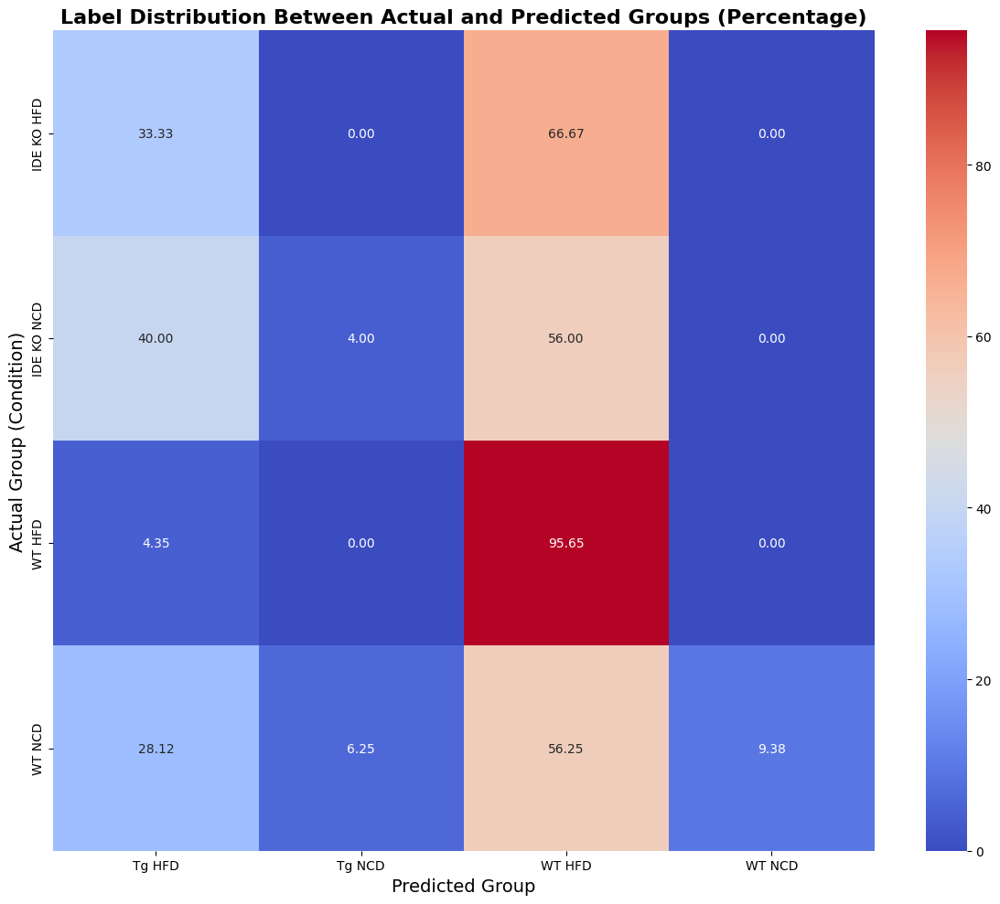


Confusion Table (Percentage):
Predicted Group     Tg HFD  Tg NCD     WT HFD  WT NCD
Group Name                                           
IDE KO HFD       33.333333    0.00  66.666667   0.000
IDE KO NCD       40.000000    4.00  56.000000   0.000
WT HFD            4.347826    0.00  95.652174   0.000
WT NCD           28.125000    6.25  56.250000   9.375

Chi-Square Test Results:
Chi-Square Statistic: 18.6981
P-Value: 2.7886e-02
Degrees of Freedom: 9

Heatmap saved at: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/KNN/Raw/IDE/label_distribution_heatmap_percentage.png
Statistical results saved at: /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/KNN/Raw/IDE/statistical_results.xlsx


In [162]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
from statsmodels.stats.proportion import proportions_ztest

def label_stats(input_file, output_dir):
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Load the input file
    df = pd.read_excel(input_file)

    # Step 1: Extract group name from the Condition column
    df['Group Name'] = df['Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]))
    
    # Step 2: Extract unique group names from the Group Name column
    unique_groups_condition = df['Group Name'].unique().tolist()
    
    # Step 3: Extract unique group names from the Predicted Group column
    unique_groups_predicted = df['Predicted Group'].unique().tolist()
    
    # Step 4: Generate a table showing how many times each unique label from Group Name
    # was labeled as one of the unique groups in Predicted Group
    confusion_table = pd.crosstab(df['Group Name'], df['Predicted Group'])
    
    # Step 5: Convert counts to percentages
    percentage_table = confusion_table.div(confusion_table.sum(axis=1), axis=0) * 100

    # Step 6: Plot the percentage table as a heatmap
    plt.figure(figsize=(12, 10))
    sns.heatmap(percentage_table, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
    plt.title("Label Distribution Between Actual and Predicted Groups (Percentage)", fontsize=16, fontweight='bold')
    plt.xlabel("Predicted Group", fontsize=14)
    plt.ylabel("Actual Group (Condition)", fontsize=14)
    plt.tight_layout()

    # Save the heatmap
    heatmap_path = os.path.join(output_dir, "label_distribution_heatmap_percentage.png")
    plt.savefig(heatmap_path)
    plt.show()

    # Step 7: Chi-Square Test of Independence
    chi2, p, dof, expected = chi2_contingency(confusion_table)

    # Save the expected frequencies as a DataFrame
    expected_df = pd.DataFrame(expected, index=confusion_table.index, columns=confusion_table.columns)
    
    # Combine Chi-Square results into a DataFrame
    chi_square_results_df = pd.DataFrame({
        'Statistic': [chi2],
        'P-Value': [p],
        'Degrees of Freedom': [dof]
    })

    # Step 8: Proportion Z-Test for all combinations
    ztest_results = []
    for actual_group in confusion_table.index:
        for predicted_group in confusion_table.columns:
            observed_count = confusion_table.loc[actual_group, predicted_group]
            total_count = confusion_table.loc[actual_group].sum()
            if total_count == 0:  # Skip if no data for the actual group
                continue
            expected_proportion = 1 / len(confusion_table.columns)  # Equal chance among groups
            if expected_proportion == 0 or observed_count == 0:  # Skip if invalid proportions or counts
                continue

            # Perform proportion Z-test
            try:
                z_stat, z_pval = proportions_ztest(observed_count, total_count, value=expected_proportion)
                ztest_results.append({
                    'Actual Group': actual_group,
                    'Predicted Group': predicted_group,
                    'Observed Count': observed_count,
                    'Total Count': total_count,
                    'Observed Proportion': observed_count / total_count,
                    'Expected Proportion': expected_proportion,
                    'Z-Statistic': z_stat,
                    'P-Value': z_pval
                })
            except Exception as e:
                print(f"Error during Z-test for {actual_group} → {predicted_group}: {e}")

    ztest_results_df = pd.DataFrame(ztest_results)

    # Save results to an Excel file
    statistical_results_path = os.path.join(output_dir, "statistical_results.xlsx")
    with pd.ExcelWriter(statistical_results_path) as writer:
        expected_df.to_excel(writer, sheet_name="Expected Frequencies")
        chi_square_results_df.to_excel(writer, sheet_name="Chi-Square Test Results", index=False)
        ztest_results_df.to_excel(writer, sheet_name="Proportion Z-Test Results", index=False)

    # Print summary
    print("\nConfusion Table (Percentage):")
    print(percentage_table)
    
    print("\nChi-Square Test Results:")
    print(f"Chi-Square Statistic: {chi2:.4f}")
    print(f"P-Value: {p:.4e}")
    print(f"Degrees of Freedom: {dof}")
    
    print("\nHeatmap saved at:", heatmap_path)
    print("Statistical results saved at:", statistical_results_path)

    return unique_groups_condition, unique_groups_predicted, percentage_table, heatmap_path, statistical_results_path

# Example usage
input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/KNN/Raw/IDE/IDE males MW_clean_no_outliers_classresults.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_v4/ML Model/KNN/Raw/IDE'


unique_groups_condition, unique_groups_predicted, percentage_table, heatmap_path, statistical_results_path = label_stats(input_file, output_dir)

## Unsupervised models

<h3 style="color: #F68B08;">K-Means Clustering</h3>

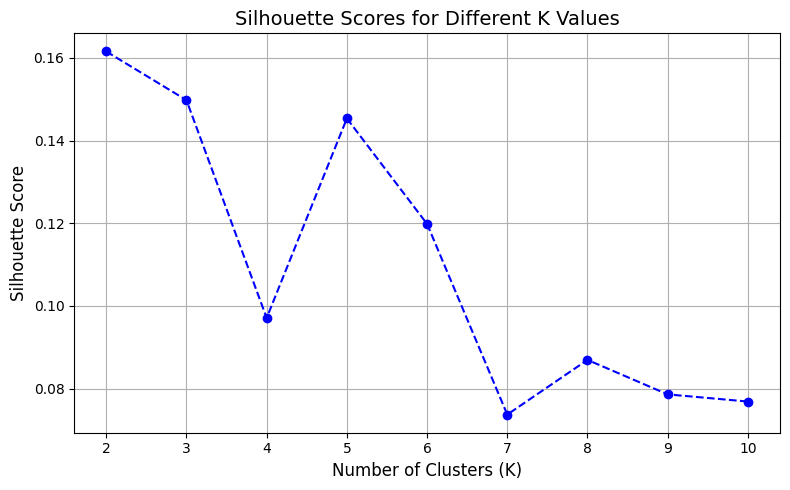

Silhouette scores plot saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/ML/Raw/KMN/Auto/silhouette_scores_plot.png


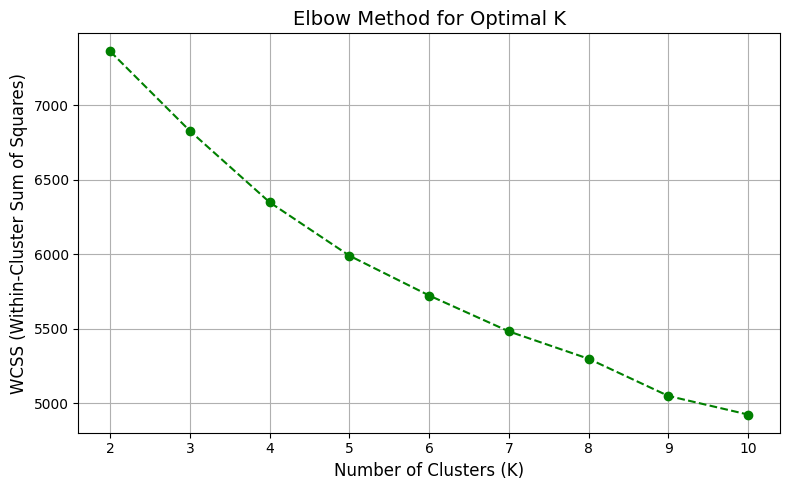

Elbow method plot saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/ML/Raw/KMN/Auto/elbow_method_plot.png
Optimal K based on silhouette score: 2
Silhouette Score: 0.16
Adjusted Rand Index (ARI): 0.03
Most differentiating features by variance across centroids:
Speed (cm/s)            10578.629161
Stepping period (ms)     4025.613268
dtype: float64


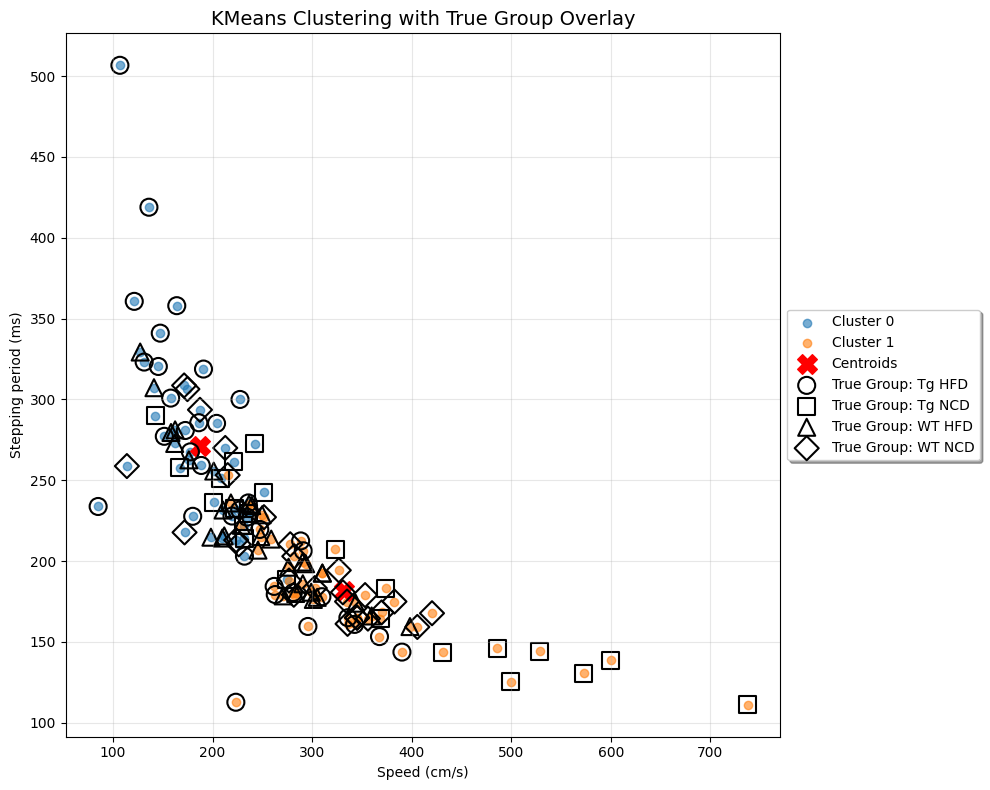

Cluster plot with true labels saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/ML/Raw/KMN/Auto/kmeans_cluster_with_true_labels.png


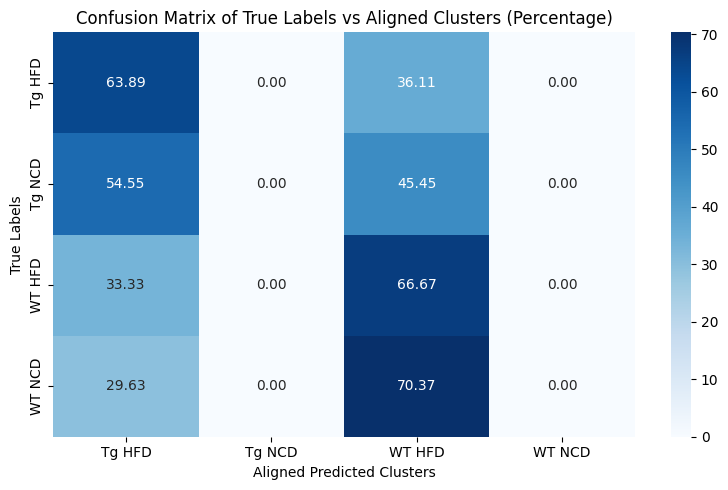

Aligned confusion matrix plot saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/ML/Raw/KMN/Auto/confusion_matrix_percentage.png

Classification Report:

              precision    recall  f1-score   support

      Tg HFD       0.43      0.64      0.51        36
      Tg NCD       0.00      0.00      0.00        22
      WT HFD       0.34      0.67      0.45        33
      WT NCD       0.00      0.00      0.00        27

    accuracy                           0.38       118
   macro avg       0.19      0.33      0.24       118
weighted avg       0.23      0.38      0.28       118

Classification report saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/ML/Raw/KMN/Auto/classification_report.txt
KMeans clustering results saved to /Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/ML/Raw/KMN/Auto/kmeans_clustering_results.xlsx


In [294]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, adjusted_rand_score, confusion_matrix, classification_report
import seaborn as sns
import os
from scipy.optimize import linear_sum_assignment

def determine_optimal_k(X, output_dir, max_clusters=10):
    silhouette_scores = []
    wcss = []
    for k in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(X)
        score = silhouette_score(X, labels)
        silhouette_scores.append(score)
        wcss.append(kmeans.inertia_)

    plt.figure(figsize=(8, 5))
    plt.plot(range(2, max_clusters + 1), silhouette_scores, marker='o', linestyle='--', color='b')
    plt.title("Silhouette Scores for Different K Values", fontsize=14)
    plt.xlabel("Number of Clusters (K)", fontsize=12)
    plt.ylabel("Silhouette Score", fontsize=12)
    plt.xticks(range(2, max_clusters + 1))
    plt.grid()
    plt.tight_layout()
    silhouette_plot_path = os.path.join(output_dir, 'silhouette_scores_plot.png')
    plt.savefig(silhouette_plot_path)
    plt.show()
    print(f"Silhouette scores plot saved to {silhouette_plot_path}")

    plt.figure(figsize=(8, 5))
    plt.plot(range(2, max_clusters + 1), wcss, marker='o', linestyle='--', color='g')
    plt.title("Elbow Method for Optimal K", fontsize=14)
    plt.xlabel("Number of Clusters (K)", fontsize=12)
    plt.ylabel("WCSS (Within-Cluster Sum of Squares)", fontsize=12)
    plt.xticks(range(2, max_clusters + 1))
    plt.grid()
    plt.tight_layout()
    elbow_plot_path = os.path.join(output_dir, 'elbow_method_plot.png')
    plt.savefig(elbow_plot_path)
    plt.show()
    print(f"Elbow method plot saved to {elbow_plot_path}")

    optimal_k = range(2, max_clusters + 1)[np.argmax(silhouette_scores)]
    print(f"Optimal K based on silhouette score: {optimal_k}")
    return optimal_k

def plot_kmeans(X_processed, cluster_labels, centroids, output_dir, use_pca, X=None, top_features=None, true_labels=None):
    plt.figure(figsize=(10, 8))

    if use_pca:
        for cluster in np.unique(cluster_labels):
            plt.scatter(X_processed[cluster_labels == cluster, 0],
                        X_processed[cluster_labels == cluster, 1],
                        label=f"Cluster {cluster}", alpha=0.6)
        plt.scatter(centroids[:, 0], centroids[:, 1],
                    color='red', marker='X', s=200, label='Centroids')
        plt.xlabel("Principal Component 1")
        plt.ylabel("Principal Component 2")
    else:
        for cluster in np.unique(cluster_labels):
            plt.scatter(X.loc[cluster_labels == cluster, top_features[0]],
                        X.loc[cluster_labels == cluster, top_features[1]],
                        label=f"Cluster {cluster}", alpha=0.6)
        plt.scatter(centroids[top_features[0]], centroids[top_features[1]],
                    color='red', marker='X', s=200, label='Centroids')
        plt.xlabel(top_features[0])
        plt.ylabel(top_features[1])

    if true_labels is not None:
        unique_labels = np.unique(true_labels)
        markers = ['o', 's', '^', 'D', 'P', '*', 'X', 'v']
        for i, label in enumerate(unique_labels):
            marker = markers[i % len(markers)]
            plt.scatter(
                X_processed[true_labels == label, 0] if use_pca else X.loc[true_labels == label, top_features[0]],
                X_processed[true_labels == label, 1] if use_pca else X.loc[true_labels == label, top_features[1]],
                label=f"True Group: {label}", edgecolor='black', facecolor='none', marker=marker, linewidth=1.5, s=150
            )

    plt.legend(fontsize=10, loc='center left', bbox_to_anchor=(1, 0.5), frameon=True, fancybox=True, shadow=True)
    plt.title("KMeans Clustering with True Group Overlay" if true_labels is not None else "KMeans Clustering", fontsize=14)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    cluster_plot_path = os.path.join(output_dir, 'kmeans_cluster_with_true_labels.png')
    plt.savefig(cluster_plot_path, bbox_inches='tight')
    plt.show()
    print(f"Cluster plot with true labels saved to {cluster_plot_path}")

def kmeans_analysis(input_file, output_dir, n_clusters=None, max_clusters=10, use_pca=True):
    df = pd.read_excel(input_file)
    df = df.dropna()
    df['Group'] = df['Condition'].apply(lambda x: ' '.join(x.split('_')[1:3]))

    X = df.drop(columns=['Condition', 'Group'])
    y = df['Group']

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)

    if use_pca:
        # First find optimal number of components
        max_components = min(X_scaled.shape[0], X_scaled.shape[1])
        pca_full = PCA(n_components=max_components)
        pca_full.fit(X_scaled)
        
        cumulative_variance = np.cumsum(pca_full.explained_variance_ratio_)
        n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
        
        # PCA for clustering with optimal components
        pca = PCA(n_components=n_components_95)
        X_processed_full = pca.fit_transform(X_scaled)
        
        # Separate PCA for 2D visualization
        pca_2d = PCA(n_components=2)
        pca_2d.fit(X_scaled)
        X_processed_2d = pca_2d.transform(X_scaled)
        
        print(f"Using {n_components_95} components for clustering, explaining {cumulative_variance[n_components_95-1]*100:.2f}% of variance")
        print(f"First 2 components explain {sum(pca_2d.explained_variance_ratio_)*100:.2f}% of variance")
        
        plt.figure(figsize=(10, 6))
        plt.plot(range(1, len(pca_full.explained_variance_ratio_) + 1), 
                np.cumsum(pca_full.explained_variance_ratio_), 'bo-')
        plt.axhline(y=0.95, color='r', linestyle='--')
        plt.axvline(x=n_components_95, color='g', linestyle='--')
        plt.title('Cumulative Explained Variance Ratio vs. Number of Components')
        plt.xlabel('Number of Components')
        plt.ylabel('Cumulative Explained Variance Ratio')
        plt.grid(True)
        plt.savefig(os.path.join(output_dir, 'pca_explained_variance.png'))
        plt.show()
    else:
        X_processed_full = X_scaled_df
        X_processed_2d = X_scaled_df

    if n_clusters is None:
        n_clusters = determine_optimal_k(X_processed_full, output_dir, max_clusters)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(X_processed_full)

    if use_pca:
        centroids_full = kmeans.cluster_centers_
        centroids_2d = pca_2d.transform(pca.inverse_transform(centroids_full))
    else:
        centroids = pd.DataFrame(scaler.inverse_transform(kmeans.cluster_centers_), columns=X.columns)

    silhouette_avg = silhouette_score(X_processed_full, cluster_labels)
    print(f"Silhouette Score: {silhouette_avg:.2f}")

    adjusted_rand = adjusted_rand_score(y, cluster_labels)
    print(f"Adjusted Rand Index (ARI): {adjusted_rand:.2f}")

    if use_pca:
        plt.figure(figsize=(8, 5))
        sns.heatmap(kmeans.cluster_centers_, annot=True, cmap="coolwarm", 
                    xticklabels=[f"PC{i+1}" for i in range(n_components_95)], 
                    yticklabels=[f"Cluster {i}" for i in range(n_clusters)],
                    annot_kws={"rotation": 90})
        plt.title("Centroids in PCA Components")
        plt.xlabel("Components")
        plt.ylabel("Clusters")
        plt.tight_layout()
        heatmap_path = os.path.join(output_dir, 'centroids_pca_heatmap.png')
        plt.savefig(heatmap_path)
        plt.show()
        print(f"Heatmap of PCA centroids saved to {heatmap_path}")
        
        plot_kmeans(X_processed_2d, cluster_labels, centroids_2d, output_dir, use_pca, true_labels=y)
    else:
        feature_variances = centroids.var(axis=0)
        most_differentiating_features = feature_variances.sort_values(ascending=False).head(2)
        print("Most differentiating features by variance across centroids:")
        print(most_differentiating_features)
        top_features = most_differentiating_features.index[:2]
        plot_kmeans(X_scaled_df, cluster_labels, centroids, output_dir, use_pca, X, top_features, true_labels=y)

    unique_labels = np.unique(y)
    unique_clusters = np.unique(cluster_labels)
    cost_matrix = np.zeros((len(unique_labels), len(unique_clusters)))

    for i, true_label in enumerate(unique_labels):
        for j, cluster in enumerate(unique_clusters):
            cost_matrix[i, j] = -np.sum((y == true_label) & (cluster_labels == cluster))

    row_ind, col_ind = linear_sum_assignment(cost_matrix)
    label_mapping = {cluster: unique_labels[row] for row, cluster in zip(row_ind, col_ind)}
    aligned_labels = np.array([label_mapping[cluster] for cluster in cluster_labels])

    confusion = confusion_matrix(y, aligned_labels, labels=unique_labels)
    confusion_percentage = (confusion / confusion.sum(axis=1, keepdims=True)) * 100

    plt.figure(figsize=(8, 5))
    sns.heatmap(confusion_percentage, annot=True, fmt='.2f', cmap='Blues', 
                xticklabels=unique_labels, yticklabels=unique_labels)
    plt.title("Confusion Matrix of True Labels vs Aligned Clusters (Percentage)")
    plt.xlabel("Aligned Predicted Clusters")
    plt.ylabel("True Labels")
    plt.tight_layout()

    confusion_plot_path = os.path.join(output_dir, 'confusion_matrix_percentage.png')
    plt.savefig(confusion_plot_path)
    plt.show()
    print(f"Aligned confusion matrix plot saved to {confusion_plot_path}")

    report = classification_report(y, aligned_labels, target_names=unique_labels, zero_division=0)
    print("\nClassification Report:\n")
    print(report)

    report_path = os.path.join(output_dir, 'classification_report.txt')
    with open(report_path, 'w') as f:
        f.write("Classification Report:\n")
        f.write(report)
    print(f"Classification report saved to {report_path}")

    df['Cluster'] = cluster_labels
    cluster_results_path = os.path.join(output_dir, 'kmeans_clustering_results.xlsx')
    df.to_excel(cluster_results_path, index=False)
    print(f"KMeans clustering results saved to {cluster_results_path}")

    return kmeans, scaler

input_file = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/36wo MW_clean_no_outliers_median.xlsx'
output_dir = '/Users/louis/Desktop/Final data/Thy1-aSyn/Behaviour/MW November 2024/36wo_final/ML/Raw/KMN/Auto'

kmeans_model, scaler = kmeans_analysis(input_file, output_dir, n_clusters=None, use_pca=False)